In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 2160)
(11, 2160)


[I 2025-05-27 12:38:15,051] A new study created in memory with name: no-name-b572f399-4ad0-4339-842e-68883c02419e
[I 2025-05-27 12:42:25,893] Trial 0 finished with value: 0.11012476533651352 and parameters: {'lr': 0.050580910845130084, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.11870500086835678}. Best is trial 0 with value: 0.11012476533651352.


Cross Validation Accuracies:
[0.11335314065217972, 0.06282491981983185, 0.07307648658752441, 0.137639120221138, 0.16373015940189362]
Mean Cross Validation Accuracy:
0.11012476533651352
Standard Deviation of Cross Validation Accuracy:
0.03808109964001906


[I 2025-05-27 12:47:17,076] Trial 1 finished with value: 0.06343965157866478 and parameters: {'lr': 0.004279498200032857, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17144953700885057}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.05656866729259491, 0.05835747346282005, 0.07239694148302078, 0.07717552781105042, 0.05269964784383774]
Mean Cross Validation Accuracy:
0.06343965157866478
Standard Deviation of Cross Validation Accuracy:
0.00956340920369701


[I 2025-05-27 12:55:57,130] Trial 2 finished with value: 0.09432322382926941 and parameters: {'lr': 0.014521335288032386, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.14787384229749423}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.08313260972499847, 0.10797159373760223, 0.07560425251722336, 0.11790179461240768, 0.0870058685541153]
Mean Cross Validation Accuracy:
0.09432322382926941
Standard Deviation of Cross Validation Accuracy:
0.015946162049627385


[I 2025-05-27 13:02:23,928] Trial 3 finished with value: 0.06809441074728965 and parameters: {'lr': 0.26247408051994314, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3002592124089245}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.06625401973724365, 0.05872371420264244, 0.07910379767417908, 0.08489395678043365, 0.05149656534194946]
Mean Cross Validation Accuracy:
0.06809441074728965
Standard Deviation of Cross Validation Accuracy:
0.012410614910849356


[I 2025-05-27 13:08:28,205] Trial 4 finished with value: 0.0754899486899376 and parameters: {'lr': 0.48644033280184984, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.28956385148616615}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.07686258107423782, 0.07486314326524734, 0.07776347547769547, 0.08268637955188751, 0.06527416408061981]
Mean Cross Validation Accuracy:
0.0754899486899376
Standard Deviation of Cross Validation Accuracy:
0.0057200839345642965


[I 2025-05-27 13:14:25,479] Trial 5 finished with value: 5.341840314865112 and parameters: {'lr': 0.40764953348512706, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.34300522365328345}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[7.100822448730469, 3.8456451892852783, 4.123993873596191, 5.884801864624023, 5.7539381980896]
Mean Cross Validation Accuracy:
5.341840314865112
Standard Deviation of Cross Validation Accuracy:
1.2066813883915217


[I 2025-05-27 13:18:13,911] Trial 6 finished with value: 0.06778530180454254 and parameters: {'lr': 0.24249252467475318, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1039020226270076}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.0594797357916832, 0.06232583150267601, 0.0757511705160141, 0.08111544698476791, 0.06025432422757149]
Mean Cross Validation Accuracy:
0.06778530180454254
Standard Deviation of Cross Validation Accuracy:
0.008906758118306065


[I 2025-05-27 13:25:34,245] Trial 7 finished with value: 1.6291669130325317 and parameters: {'lr': 0.02202315225371345, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3137569347153737}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[1.6731888055801392, 1.6554912328720093, 1.6049937009811401, 1.728794813156128, 1.4833660125732422]
Mean Cross Validation Accuracy:
1.6291669130325317
Standard Deviation of Cross Validation Accuracy:
0.08294439351414014


[I 2025-05-27 13:29:57,289] Trial 8 finished with value: 0.07594719976186752 and parameters: {'lr': 0.16820642125355512, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11708612851330735}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.06206949055194855, 0.07052728533744812, 0.08885776251554489, 0.0959278866648674, 0.062353573739528656]
Mean Cross Validation Accuracy:
0.07594719976186752
Standard Deviation of Cross Validation Accuracy:
0.013947497506367658


[I 2025-05-27 13:34:40,554] Trial 9 finished with value: 0.7107347846031189 and parameters: {'lr': 0.30426850789284043, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.22750503637841632}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.9774112701416016, 0.8330099582672119, 0.5619516968727112, 0.45505762100219727, 0.7262433767318726]
Mean Cross Validation Accuracy:
0.7107347846031189
Standard Deviation of Cross Validation Accuracy:
0.18644854606306982


[I 2025-05-27 13:39:22,179] Trial 10 finished with value: 0.08033499345183373 and parameters: {'lr': 0.0012274997952494125, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4991541600168746}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.09166146069765091, 0.07806923985481262, 0.09379579871892929, 0.07954619079828262, 0.05860227718949318]
Mean Cross Validation Accuracy:
0.08033499345183373
Standard Deviation of Cross Validation Accuracy:
0.01255029038578233


[I 2025-05-27 13:43:50,329] Trial 11 finished with value: 0.08629266992211342 and parameters: {'lr': 0.0038797792512101407, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.20173435147613075}. Best is trial 1 with value: 0.06343965157866478.


Cross Validation Accuracies:
[0.060011789202690125, 0.05971447005867958, 0.08557198941707611, 0.11697516590356827, 0.10918993502855301]
Mean Cross Validation Accuracy:
0.08629266992211342
Standard Deviation of Cross Validation Accuracy:
0.023930336766398


[I 2025-05-27 13:48:42,537] Trial 12 finished with value: 0.0627974346280098 and parameters: {'lr': 0.06873454828505626, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18210530650914042}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05801144987344742, 0.05575362220406532, 0.0731196403503418, 0.07437481731176376, 0.05272764340043068]
Mean Cross Validation Accuracy:
0.0627974346280098
Standard Deviation of Cross Validation Accuracy:
0.00910500257750515


[I 2025-05-27 13:53:09,743] Trial 13 finished with value: 0.06654115244746209 and parameters: {'lr': 0.007181188812608645, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19686592104552583}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05998394638299942, 0.05933884158730507, 0.07438816875219345, 0.07860509306192398, 0.06038971245288849]
Mean Cross Validation Accuracy:
0.06654115244746209
Standard Deviation of Cross Validation Accuracy:
0.008244086063851885


[I 2025-05-27 14:01:59,218] Trial 14 finished with value: 0.07383282333612443 and parameters: {'lr': 0.07261590125442322, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2528707356327429}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.08346953988075256, 0.06674157083034515, 0.07372179627418518, 0.08592043071985245, 0.059310778975486755]
Mean Cross Validation Accuracy:
0.07383282333612443
Standard Deviation of Cross Validation Accuracy:
0.010001645060150834


[I 2025-05-27 14:06:54,098] Trial 15 finished with value: 0.0668054074048996 and parameters: {'lr': 0.0013711719350159297, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.37826086424504896}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.06495559215545654, 0.0554601289331913, 0.07767470180988312, 0.08089783042669296, 0.05503878369927406]
Mean Cross Validation Accuracy:
0.0668054074048996
Standard Deviation of Cross Validation Accuracy:
0.010838159815899065


[I 2025-05-27 14:11:31,407] Trial 16 finished with value: 0.06718504652380944 and parameters: {'lr': 0.9421408378834756, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17180294351089154}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.07384543865919113, 0.05521528422832489, 0.0719221979379654, 0.07469378411769867, 0.06024852767586708]
Mean Cross Validation Accuracy:
0.06718504652380944
Standard Deviation of Cross Validation Accuracy:
0.007931873300927627


[I 2025-05-27 14:16:21,394] Trial 17 finished with value: 0.06553837433457374 and parameters: {'lr': 0.003964281886608101, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4094645393145845}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.061631523072719574, 0.057327065616846085, 0.07453909516334534, 0.08093742281198502, 0.05325676500797272]
Mean Cross Validation Accuracy:
0.06553837433457374
Standard Deviation of Cross Validation Accuracy:
0.010504005662017517


[I 2025-05-27 14:21:49,188] Trial 18 finished with value: 0.0637285478413105 and parameters: {'lr': 0.09546816137365409, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.25218073522925916}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05422499030828476, 0.05863535404205322, 0.07335375249385834, 0.07915268838405609, 0.053275953978300095]
Mean Cross Validation Accuracy:
0.0637285478413105
Standard Deviation of Cross Validation Accuracy:
0.010545744387298248


[I 2025-05-27 14:31:03,456] Trial 19 finished with value: 2.3920817375183105 and parameters: {'lr': 0.030024924523291405, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1668533800967896}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[2.4785444736480713, 2.4373278617858887, 2.2181859016418457, 2.737682342529297, 2.08866810798645]
Mean Cross Validation Accuracy:
2.3920817375183105
Standard Deviation of Cross Validation Accuracy:
0.2241706434862125


[I 2025-05-27 14:35:57,918] Trial 20 finished with value: 0.06335716396570205 and parameters: {'lr': 0.011553360810399151, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.22667122733706768}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.056790102273225784, 0.05692986026406288, 0.07327394187450409, 0.07560186088085175, 0.054190054535865784]
Mean Cross Validation Accuracy:
0.06335716396570205
Standard Deviation of Cross Validation Accuracy:
0.009129594887845434


[I 2025-05-27 14:40:27,762] Trial 21 finished with value: 0.06371092870831489 and parameters: {'lr': 0.011425653285368436, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.22537241778578193}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.060174379497766495, 0.056480929255485535, 0.07141677290201187, 0.07468397170305252, 0.05579859018325806]
Mean Cross Validation Accuracy:
0.06371092870831489
Standard Deviation of Cross Validation Accuracy:
0.007838021187053986


[I 2025-05-27 14:44:31,264] Trial 22 finished with value: 0.0633972741663456 and parameters: {'lr': 0.0030117652133118122, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.14781748659991073}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05547691509127617, 0.05824606120586395, 0.07296518981456757, 0.0770241841673851, 0.05327402055263519]
Mean Cross Validation Accuracy:
0.0633972741663456
Standard Deviation of Cross Validation Accuracy:
0.009684885467548811


[I 2025-05-27 14:48:10,632] Trial 23 finished with value: 0.06343437656760216 and parameters: {'lr': 0.002285883350019741, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1338198198454939}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.057266052812337875, 0.05762935057282448, 0.07280533015727997, 0.07644566148519516, 0.053025487810373306]
Mean Cross Validation Accuracy:
0.06343437656760216
Standard Deviation of Cross Validation Accuracy:
0.009350933817505565


[I 2025-05-27 14:52:33,005] Trial 24 finished with value: 0.06313195973634719 and parameters: {'lr': 0.006404416449587863, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2678930486952053}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.054884251207113266, 0.05764565244317055, 0.07292895764112473, 0.07683592289686203, 0.053365014493465424]
Mean Cross Validation Accuracy:
0.06313195973634719
Standard Deviation of Cross Validation Accuracy:
0.009770335279065661


[I 2025-05-27 14:57:00,412] Trial 25 finished with value: 0.07013500183820724 and parameters: {'lr': 0.008284335576585903, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.265789795817974}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.0654304027557373, 0.07435228675603867, 0.0732342079281807, 0.07855930924415588, 0.059098802506923676]
Mean Cross Validation Accuracy:
0.07013500183820724
Standard Deviation of Cross Validation Accuracy:
0.00696118486958677


[I 2025-05-27 15:01:09,369] Trial 26 finished with value: 0.06483234465122223 and parameters: {'lr': 0.01863737526992232, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21658745369373586}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.06280440092086792, 0.06077660247683525, 0.07252347469329834, 0.07329756766557693, 0.0547596774995327]
Mean Cross Validation Accuracy:
0.06483234465122223
Standard Deviation of Cross Validation Accuracy:
0.007111029544506141


[I 2025-05-27 15:04:58,416] Trial 27 finished with value: 0.08356831222772598 and parameters: {'lr': 0.04517696015211434, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3377772319584539}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.09087605774402618, 0.06404981762170792, 0.09695586562156677, 0.09034167975187302, 0.07561814039945602]
Mean Cross Validation Accuracy:
0.08356831222772598
Standard Deviation of Cross Validation Accuracy:
0.0120223550255787


[I 2025-05-27 15:09:14,323] Trial 28 finished with value: 0.4507347047328949 and parameters: {'lr': 0.007195015340094396, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2661242209879313}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.49451401829719543, 0.5363364219665527, 0.3910829424858093, 0.42519405484199524, 0.40654608607292175]
Mean Cross Validation Accuracy:
0.4507347047328949
Standard Deviation of Cross Validation Accuracy:
0.05551139314522979


[I 2025-05-27 15:14:24,908] Trial 29 finished with value: 0.06344035863876343 and parameters: {'lr': 0.034225542643041076, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19050103558112264}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.058554407209157944, 0.057800211012363434, 0.07277628034353256, 0.0765773355960846, 0.051493559032678604]
Mean Cross Validation Accuracy:
0.06344035863876343
Standard Deviation of Cross Validation Accuracy:
0.009572349817080075


[I 2025-05-27 15:20:37,367] Trial 30 finished with value: 0.25783232152462005 and parameters: {'lr': 0.09675695605829174, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.23834367421013797}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.3551552891731262, 0.18232308328151703, 0.2777852714061737, 0.24164511263370514, 0.23225285112857819]
Mean Cross Validation Accuracy:
0.25783232152462005
Standard Deviation of Cross Validation Accuracy:
0.05742449013854935


[I 2025-05-27 15:25:42,867] Trial 31 finished with value: 0.06301493868231774 and parameters: {'lr': 0.0019112448505043734, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.15979557843538814}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.0558512806892395, 0.05738959461450577, 0.07239623367786407, 0.07652594149112701, 0.05291164293885231]
Mean Cross Validation Accuracy:
0.06301493868231774
Standard Deviation of Cross Validation Accuracy:
0.009545626949510467


[I 2025-05-27 15:31:09,146] Trial 32 finished with value: 0.06336256414651871 and parameters: {'lr': 0.0019491667688107468, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.17803216408454892}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.056181441992521286, 0.058095503598451614, 0.07255512475967407, 0.07690932601690292, 0.05307142436504364]
Mean Cross Validation Accuracy:
0.06336256414651871
Standard Deviation of Cross Validation Accuracy:
0.009520881555916207


[I 2025-05-27 15:37:06,599] Trial 33 finished with value: 0.06425932049751282 and parameters: {'lr': 0.006832973833750796, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.14034857985795107}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05965911224484444, 0.0584416538476944, 0.07305547595024109, 0.07741480320692062, 0.05272555723786354]
Mean Cross Validation Accuracy:
0.06425932049751282
Standard Deviation of Cross Validation Accuracy:
0.009364549452184578


[I 2025-05-27 15:43:10,841] Trial 34 finished with value: 0.06281860917806625 and parameters: {'lr': 0.011766180659491317, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.28884560341349796}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05380535125732422, 0.05733920633792877, 0.0719015970826149, 0.07778288424015045, 0.05326400697231293]
Mean Cross Validation Accuracy:
0.06281860917806625
Standard Deviation of Cross Validation Accuracy:
0.010089433032122312


[I 2025-05-27 15:50:46,151] Trial 35 finished with value: 0.06343929469585419 and parameters: {'lr': 0.0010059228761104128, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.295007084996278}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05572822317481041, 0.05766500532627106, 0.07278897613286972, 0.07671862095594406, 0.05429564788937569]
Mean Cross Validation Accuracy:
0.06343929469585419
Standard Deviation of Cross Validation Accuracy:
0.009382604836009487


[I 2025-05-27 15:57:07,763] Trial 36 finished with value: 0.06355486288666726 and parameters: {'lr': 0.0019361102097810723, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3618528905055979}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.057045336812734604, 0.05756492540240288, 0.07290618121623993, 0.07709629833698273, 0.05316157266497612]
Mean Cross Validation Accuracy:
0.06355486288666726
Standard Deviation of Cross Validation Accuracy:
0.009561290613311233


[I 2025-05-27 16:02:38,685] Trial 37 finished with value: 0.0634868435561657 and parameters: {'lr': 0.016895728860679093, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3250933065800864}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05595165863633156, 0.05887937918305397, 0.0720873475074768, 0.07767675817012787, 0.05283907428383827]
Mean Cross Validation Accuracy:
0.0634868435561657
Standard Deviation of Cross Validation Accuracy:
0.00966131538839681


[I 2025-05-27 16:07:51,364] Trial 38 finished with value: 0.06540358141064644 and parameters: {'lr': 0.004742007632510985, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.28194599622012995}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.0557573102414608, 0.06236640363931656, 0.07346648722887039, 0.07710222154855728, 0.05832548439502716]
Mean Cross Validation Accuracy:
0.06540358141064644
Standard Deviation of Cross Validation Accuracy:
0.008417162050911567


[I 2025-05-27 16:16:12,735] Trial 39 finished with value: 0.06364706009626389 and parameters: {'lr': 0.026743652008062037, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.40977591514773715}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05600052699446678, 0.05955697223544121, 0.0724012702703476, 0.07623923569917679, 0.054037295281887054]
Mean Cross Validation Accuracy:
0.06364706009626389
Standard Deviation of Cross Validation Accuracy:
0.00897490890383171


[I 2025-05-27 16:23:46,054] Trial 40 finished with value: 2.098382806777954 and parameters: {'lr': 0.16251384499370125, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10598244012382588}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[2.012291193008423, 3.2393112182617188, 1.9338780641555786, 1.8329074382781982, 1.473526120185852]
Mean Cross Validation Accuracy:
2.098382806777954
Standard Deviation of Cross Validation Accuracy:
0.5995188514961817


[I 2025-05-27 16:29:39,991] Trial 41 finished with value: 0.06382892206311226 and parameters: {'lr': 0.01161953390361221, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1587598940135574}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05761170759797096, 0.05822582542896271, 0.07190081477165222, 0.07493537664413452, 0.05647088587284088]
Mean Cross Validation Accuracy:
0.06382892206311226
Standard Deviation of Cross Validation Accuracy:
0.007908197385409833


[I 2025-05-27 16:35:21,597] Trial 42 finished with value: 0.06382003054022789 and parameters: {'lr': 0.010651170327428907, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21194301798792847}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.059099677950143814, 0.05802280083298683, 0.07419811934232712, 0.07656601816415787, 0.05121353641152382]
Mean Cross Validation Accuracy:
0.06382003054022789
Standard Deviation of Cross Validation Accuracy:
0.0098486366849825


[I 2025-05-27 16:40:22,100] Trial 43 finished with value: 0.0629049576818943 and parameters: {'lr': 0.004949677770795915, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.30909725886980255}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05636542662978172, 0.05664489045739174, 0.07228268682956696, 0.07697448879480362, 0.052257295697927475]
Mean Cross Validation Accuracy:
0.0629049576818943
Standard Deviation of Cross Validation Accuracy:
0.009810403900613683


[I 2025-05-27 16:45:35,308] Trial 44 finished with value: 0.06395487114787102 and parameters: {'lr': 0.004873727468313245, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.31055687751814076}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.059266433119773865, 0.05748463049530983, 0.07226593047380447, 0.07729141414165497, 0.05346594750881195]
Mean Cross Validation Accuracy:
0.06395487114787102
Standard Deviation of Cross Validation Accuracy:
0.009173876721382387


[I 2025-05-27 16:49:42,231] Trial 45 finished with value: 0.0633772425353527 and parameters: {'lr': 0.0027327524008618972, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2765767063154685}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05595175176858902, 0.058304619044065475, 0.07282395660877228, 0.07651744782924652, 0.05328843742609024]
Mean Cross Validation Accuracy:
0.0633772425353527
Standard Deviation of Cross Validation Accuracy:
0.009429303396274305


[I 2025-05-27 16:53:52,715] Trial 46 finished with value: 0.06392672657966614 and parameters: {'lr': 0.005546084503441204, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3818854919725792}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.056036826223134995, 0.055297013372182846, 0.07185888290405273, 0.08036620914936066, 0.05607470124959946]
Mean Cross Validation Accuracy:
0.06392672657966614
Standard Deviation of Cross Validation Accuracy:
0.010310698042103713


[I 2025-05-27 16:58:08,584] Trial 47 finished with value: 0.06500264033675193 and parameters: {'lr': 0.0032985028587226564, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3093955045381765}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.0609562061727047, 0.05849084630608559, 0.07300712913274765, 0.0784759595990181, 0.05408306047320366]
Mean Cross Validation Accuracy:
0.06500264033675193
Standard Deviation of Cross Validation Accuracy:
0.009204525932022495


[I 2025-05-27 17:05:21,844] Trial 48 finished with value: 0.08563477247953415 and parameters: {'lr': 0.05511786108175758, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3539162451184482}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.08995231240987778, 0.06910032033920288, 0.09320049732923508, 0.09582025557756424, 0.08010047674179077]
Mean Cross Validation Accuracy:
0.08563477247953415
Standard Deviation of Cross Validation Accuracy:
0.009835059190319703


[I 2025-05-27 17:11:04,798] Trial 49 finished with value: 0.06302558407187461 and parameters: {'lr': 0.01471083207583016, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.24799995471992778}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.0542081743478775, 0.05526868999004364, 0.07322442531585693, 0.07803001254796982, 0.0543966181576252]
Mean Cross Validation Accuracy:
0.06302558407187461
Standard Deviation of Cross Validation Accuracy:
0.010406963143982715


[I 2025-05-27 17:16:58,161] Trial 50 finished with value: 0.08270964324474335 and parameters: {'lr': 0.001518582618307812, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2514073240473736}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.07464871555566788, 0.061951205134391785, 0.11370787024497986, 0.10075289756059647, 0.06248752772808075]
Mean Cross Validation Accuracy:
0.08270964324474335
Standard Deviation of Cross Validation Accuracy:
0.02093453781397521


[I 2025-05-27 17:21:13,189] Trial 51 finished with value: 0.06730943620204925 and parameters: {'lr': 0.008320450958371322, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2915170994328984}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05014227330684662, 0.05726490169763565, 0.07556968182325363, 0.08474646508693695, 0.06882385909557343]
Mean Cross Validation Accuracy:
0.06730943620204925
Standard Deviation of Cross Validation Accuracy:
0.012411118128808876


[I 2025-05-27 17:25:38,755] Trial 52 finished with value: 0.0638939656317234 and parameters: {'lr': 0.015094091083493338, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3262068824333622}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05309825763106346, 0.05417424067854881, 0.07461115717887878, 0.08366817235946655, 0.05391800031065941]
Mean Cross Validation Accuracy:
0.0638939656317234
Standard Deviation of Cross Validation Accuracy:
0.012778244753156753


[I 2025-05-27 17:30:28,502] Trial 53 finished with value: 0.06771443039178848 and parameters: {'lr': 0.023464107723971422, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18745885780966126}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.06501790881156921, 0.06624266505241394, 0.07555945217609406, 0.0769713893532753, 0.054780736565589905]
Mean Cross Validation Accuracy:
0.06771443039178848
Standard Deviation of Cross Validation Accuracy:
0.00804926597706275


[I 2025-05-27 17:37:42,389] Trial 54 finished with value: 0.07589193508028984 and parameters: {'lr': 0.0058932859493320364, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.26724930826397675}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.07014324516057968, 0.0560649074614048, 0.07398790866136551, 0.07668279856443405, 0.10258081555366516]
Mean Cross Validation Accuracy:
0.07589193508028984
Standard Deviation of Cross Validation Accuracy:
0.01511757641005751


[I 2025-05-27 17:42:30,453] Trial 55 finished with value: 0.06342497244477271 and parameters: {'lr': 0.003732904409727585, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2455721534879173}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05759073793888092, 0.05759362131357193, 0.07254564017057419, 0.0765666663646698, 0.05282819643616676]
Mean Cross Validation Accuracy:
0.06342497244477271
Standard Deviation of Cross Validation Accuracy:
0.00934050650564945


[I 2025-05-27 17:47:52,000] Trial 56 finished with value: 0.0629171721637249 and parameters: {'lr': 0.04270315337481637, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23290632451095825}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05447112396359444, 0.05862227454781532, 0.07308594137430191, 0.07738465070724487, 0.051021870225667953]
Mean Cross Validation Accuracy:
0.0629171721637249
Standard Deviation of Cross Validation Accuracy:
0.010430646064293466


[I 2025-05-27 17:52:59,863] Trial 57 finished with value: 0.06383536010980606 and parameters: {'lr': 0.040548289443622695, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23648423221561965}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05934300646185875, 0.055471036583185196, 0.07273199409246445, 0.07800766080617905, 0.053623102605342865]
Mean Cross Validation Accuracy:
0.06383536010980606
Standard Deviation of Cross Validation Accuracy:
0.009741022081316518


[I 2025-05-27 17:58:27,582] Trial 58 finished with value: 0.06504533365368843 and parameters: {'lr': 0.08740292419366022, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.19989157337777516}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.0612957738339901, 0.060946621000766754, 0.07162328064441681, 0.07736754417419434, 0.05399344861507416]
Mean Cross Validation Accuracy:
0.06504533365368843
Standard Deviation of Cross Validation Accuracy:
0.008343968670650213


[I 2025-05-27 18:03:34,517] Trial 59 finished with value: 0.06340447589755058 and parameters: {'lr': 0.020898072830409942, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.15746905822140864}. Best is trial 12 with value: 0.0627974346280098.


Cross Validation Accuracies:
[0.05675879493355751, 0.0568363219499588, 0.07252020388841629, 0.07732991874217987, 0.05357713997364044]
Mean Cross Validation Accuracy:
0.06340447589755058
Standard Deviation of Cross Validation Accuracy:
0.00960100732567484


[I 2025-05-27 18:11:55,943] Trial 60 finished with value: 0.06221368983387947 and parameters: {'lr': 0.14221859366311687, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21312490207040577}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05367676913738251, 0.05692766606807709, 0.07383019477128983, 0.07678510993719101, 0.049848709255456924]
Mean Cross Validation Accuracy:
0.06221368983387947
Standard Deviation of Cross Validation Accuracy:
0.010963423532124839


[I 2025-05-27 18:18:45,769] Trial 61 finished with value: 0.06500739827752114 and parameters: {'lr': 0.13764501893765937, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22031179033163462}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.054700788110494614, 0.06113871559500694, 0.07542930543422699, 0.07659683376550674, 0.05717134848237038]
Mean Cross Validation Accuracy:
0.06500739827752114
Standard Deviation of Cross Validation Accuracy:
0.009225267030696715


[I 2025-05-27 18:25:11,790] Trial 62 finished with value: 0.06475582122802734 and parameters: {'lr': 0.0600986703760604, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12702238407692462}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05990783870220184, 0.058835744857788086, 0.07277675718069077, 0.07787435501813889, 0.05438441038131714]
Mean Cross Validation Accuracy:
0.06475582122802734
Standard Deviation of Cross Validation Accuracy:
0.008972711341734557


[I 2025-05-27 18:30:46,642] Trial 63 finished with value: 0.0641798235476017 and parameters: {'lr': 0.27977319825206176, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.20256163828816948}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05283021926879883, 0.056157831102609634, 0.07380662858486176, 0.08251778781414032, 0.05558665096759796]
Mean Cross Validation Accuracy:
0.0641798235476017
Standard Deviation of Cross Validation Accuracy:
0.011798006642894564


[I 2025-05-27 18:37:03,441] Trial 64 finished with value: 0.0670455202460289 and parameters: {'lr': 0.21493439324536717, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.174156505792963}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.057742878794670105, 0.06182055175304413, 0.07550118863582611, 0.07758370041847229, 0.06257928162813187]
Mean Cross Validation Accuracy:
0.0670455202460289
Standard Deviation of Cross Validation Accuracy:
0.007954096936576923


[I 2025-05-27 18:44:48,246] Trial 65 finished with value: 0.06447440758347511 and parameters: {'lr': 0.06656802802348245, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2092025936866269}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05745868384838104, 0.058945950120687485, 0.07232476770877838, 0.0768759474158287, 0.05676668882369995]
Mean Cross Validation Accuracy:
0.06447440758347511
Standard Deviation of Cross Validation Accuracy:
0.008421632789847925


[I 2025-05-27 18:49:40,667] Trial 66 finished with value: 0.07585546299815178 and parameters: {'lr': 0.4479390205750763, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48538357070789906}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.07824753224849701, 0.0762760192155838, 0.08238718658685684, 0.08127488940954208, 0.06109168753027916]
Mean Cross Validation Accuracy:
0.07585546299815178
Standard Deviation of Cross Validation Accuracy:
0.007692873644665513


[I 2025-05-27 18:54:44,869] Trial 67 finished with value: 3.352817487716675 and parameters: {'lr': 0.04076182919831236, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.18651629864198452}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[3.277791738510132, 2.4937291145324707, 3.5409064292907715, 3.7959070205688477, 3.6557531356811523]
Mean Cross Validation Accuracy:
3.352817487716675
Standard Deviation of Cross Validation Accuracy:
0.4619821396672309


[I 2025-05-27 18:59:10,379] Trial 68 finished with value: 0.06502030193805694 and parameters: {'lr': 0.1059986294224219, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22732168206779677}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.053008437156677246, 0.05775563418865204, 0.07427621632814407, 0.07880295068025589, 0.06125827133655548]
Mean Cross Validation Accuracy:
0.06502030193805694
Standard Deviation of Cross Validation Accuracy:
0.009867588609477873


[I 2025-05-27 19:03:36,856] Trial 69 finished with value: 0.07155692204833031 and parameters: {'lr': 0.009480553726365144, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.241339897672077}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.058247312903404236, 0.06175689771771431, 0.08402330428361893, 0.07758717238903046, 0.0761699229478836]
Mean Cross Validation Accuracy:
0.07155692204833031
Standard Deviation of Cross Validation Accuracy:
0.009861445684872768


[I 2025-05-27 19:12:35,147] Trial 70 finished with value: 0.36803622245788575 and parameters: {'lr': 0.7262401450546243, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2999321243989516}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.36562827229499817, 0.35918548703193665, 0.3695785403251648, 0.3739633858203888, 0.3718254268169403]
Mean Cross Validation Accuracy:
0.36803622245788575
Standard Deviation of Cross Validation Accuracy:
0.005215396843410968


[I 2025-05-27 19:16:59,354] Trial 71 finished with value: 0.06559447571635246 and parameters: {'lr': 0.03465615165905825, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2580537168010684}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.058895234018564224, 0.05605360493063927, 0.07842545956373215, 0.07531440258026123, 0.059283677488565445]
Mean Cross Validation Accuracy:
0.06559447571635246
Standard Deviation of Cross Validation Accuracy:
0.009325720923106734


[I 2025-05-27 19:21:05,662] Trial 72 finished with value: 0.06318176984786987 and parameters: {'lr': 0.012746034188648019, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2845423841394683}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05001929774880409, 0.060080334544181824, 0.0734969899058342, 0.07687164843082428, 0.05544057860970497]
Mean Cross Validation Accuracy:
0.06318176984786987
Standard Deviation of Cross Validation Accuracy:
0.010359653999509368


[I 2025-05-27 19:26:31,496] Trial 73 finished with value: 0.10155408233404159 and parameters: {'lr': 0.07535644321880376, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2656721394190808}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.08725044131278992, 0.08670192956924438, 0.12244193255901337, 0.1019006073474884, 0.1094755008816719]
Mean Cross Validation Accuracy:
0.10155408233404159
Standard Deviation of Cross Validation Accuracy:
0.013596704208198737


[I 2025-05-27 19:31:42,199] Trial 74 finished with value: 0.09292457401752471 and parameters: {'lr': 0.12903645853004517, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2780970613069468}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.08082610368728638, 0.09836972504854202, 0.0999702736735344, 0.09671464562416077, 0.08874212205410004]
Mean Cross Validation Accuracy:
0.09292457401752471
Standard Deviation of Cross Validation Accuracy:
0.007176657786668177


[I 2025-05-27 19:36:04,501] Trial 75 finished with value: 0.09186116009950637 and parameters: {'lr': 0.04769210614075322, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.23559815599989906}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.09448376297950745, 0.0871189683675766, 0.0891990214586258, 0.10494831204414368, 0.08355573564767838]
Mean Cross Validation Accuracy:
0.09186116009950637
Standard Deviation of Cross Validation Accuracy:
0.00743918048952825


[I 2025-05-27 19:40:53,698] Trial 76 finished with value: 0.06462410315871239 and parameters: {'lr': 0.01584278425509953, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3207067943202711}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05772589519619942, 0.05980924516916275, 0.07427128404378891, 0.0787234678864479, 0.05259062349796295]
Mean Cross Validation Accuracy:
0.06462410315871239
Standard Deviation of Cross Validation Accuracy:
0.010074055271382781


[I 2025-05-27 19:44:51,642] Trial 77 finished with value: 0.06466593667864799 and parameters: {'lr': 0.006872892476731687, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.15166853142695552}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.06435684114694595, 0.05661119520664215, 0.07167896628379822, 0.07786053419113159, 0.05282214656472206]
Mean Cross Validation Accuracy:
0.06466593667864799
Standard Deviation of Cross Validation Accuracy:
0.009257750831065292


[I 2025-05-27 19:49:05,843] Trial 78 finished with value: 0.06818386390805245 and parameters: {'lr': 0.026157867861026144, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33910756488046045}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.07864365726709366, 0.06125862896442413, 0.07125339657068253, 0.07488163560628891, 0.054882001131772995]
Mean Cross Validation Accuracy:
0.06818386390805245
Standard Deviation of Cross Validation Accuracy:
0.008815757323632637


[I 2025-05-27 19:52:49,618] Trial 79 finished with value: 0.06313228830695153 and parameters: {'lr': 0.002512384893186593, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1784311838304189}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.056165073066949844, 0.05705931410193443, 0.07241936028003693, 0.07656562328338623, 0.05345207080245018]
Mean Cross Validation Accuracy:
0.06313228830695153
Standard Deviation of Cross Validation Accuracy:
0.009442816415160694


[I 2025-05-27 19:56:36,616] Trial 80 finished with value: 0.06362818852066994 and parameters: {'lr': 0.019642433062208975, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2587298151816716}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05819438397884369, 0.057308975607156754, 0.07328582555055618, 0.07608834654092789, 0.05326341092586517]
Mean Cross Validation Accuracy:
0.06362818852066994
Standard Deviation of Cross Validation Accuracy:
0.009224020697349705


[I 2025-05-27 20:01:42,923] Trial 81 finished with value: 0.06332129910588265 and parameters: {'lr': 0.002563885631268831, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.17177296054080285}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05699482932686806, 0.05715975910425186, 0.07256853580474854, 0.077077217400074, 0.052806153893470764]
Mean Cross Validation Accuracy:
0.06332129910588265
Standard Deviation of Cross Validation Accuracy:
0.009625941497598147


[I 2025-05-27 20:06:31,591] Trial 82 finished with value: 0.06342685073614121 and parameters: {'lr': 0.001624727351184452, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18175494056847044}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05734112486243248, 0.0574115552008152, 0.07249363511800766, 0.07725558429956436, 0.05263235419988632]
Mean Cross Validation Accuracy:
0.06342685073614121
Standard Deviation of Cross Validation Accuracy:
0.009624774763638502


[I 2025-05-27 20:10:43,623] Trial 83 finished with value: 0.06345171183347702 and parameters: {'lr': 0.0020401601663261283, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16299231602674902}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.057047054171562195, 0.05768432840704918, 0.07271561026573181, 0.07685375958681107, 0.05295780673623085]
Mean Cross Validation Accuracy:
0.06345171183347702
Standard Deviation of Cross Validation Accuracy:
0.009485136727423035


[I 2025-05-27 20:14:33,314] Trial 84 finished with value: 0.06340177878737449 and parameters: {'lr': 0.0010798454483705324, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1431485774131063}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.056413259357213974, 0.05786463990807533, 0.07280685752630234, 0.07706519961357117, 0.05285893753170967]
Mean Cross Validation Accuracy:
0.06340177878737449
Standard Deviation of Cross Validation Accuracy:
0.009651895019069606


[I 2025-05-27 20:18:15,064] Trial 85 finished with value: 0.06321399658918381 and parameters: {'lr': 0.003363838922732344, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.19479882058503872}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05618343502283096, 0.0579388402402401, 0.0730694830417633, 0.07661562412977219, 0.052262600511312485]
Mean Cross Validation Accuracy:
0.06321399658918381
Standard Deviation of Cross Validation Accuracy:
0.009735742195150087


[I 2025-05-27 20:22:07,746] Trial 86 finished with value: 0.0634665884077549 and parameters: {'lr': 0.00489105976872905, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2159975083520475}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.057700060307979584, 0.05748242512345314, 0.07210542261600494, 0.07777281105518341, 0.05227222293615341]
Mean Cross Validation Accuracy:
0.0634665884077549
Standard Deviation of Cross Validation Accuracy:
0.009733183834346239


[I 2025-05-27 20:26:05,691] Trial 87 finished with value: 0.06760039627552032 and parameters: {'lr': 0.0089979038737014, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.20857368802726078}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.06861553341150284, 0.06174540892243385, 0.07694319635629654, 0.07740651071071625, 0.053291331976652145]
Mean Cross Validation Accuracy:
0.06760039627552032
Standard Deviation of Cross Validation Accuracy:
0.009203352596573785


[I 2025-05-27 20:31:41,833] Trial 88 finished with value: 0.06343049928545952 and parameters: {'lr': 0.004247081860241495, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3014246941822725}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05734027922153473, 0.057640232145786285, 0.07250718772411346, 0.07763903588056564, 0.05202576145529747]
Mean Cross Validation Accuracy:
0.06343049928545952
Standard Deviation of Cross Validation Accuracy:
0.009848398896647162


[I 2025-05-27 20:35:45,022] Trial 89 finished with value: 0.06387264803051948 and parameters: {'lr': 0.005776585769527791, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.23179753249636778}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05697536841034889, 0.05865466967225075, 0.07311593741178513, 0.07728210836648941, 0.05333515629172325]
Mean Cross Validation Accuracy:
0.06387264803051948
Standard Deviation of Cross Validation Accuracy:
0.00949832113101204


[I 2025-05-27 20:40:16,133] Trial 90 finished with value: 0.20386911928653717 and parameters: {'lr': 0.0022778887996237236, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1231997343061629}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.07583848387002945, 0.22420047223567963, 0.37235480546951294, 0.26270878314971924, 0.0842430517077446]
Mean Cross Validation Accuracy:
0.20386911928653717
Standard Deviation of Cross Validation Accuracy:
0.1122186580336297


[I 2025-05-27 20:44:57,981] Trial 91 finished with value: 0.06407157629728318 and parameters: {'lr': 0.012828350297284014, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2855911726975001}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05786081403493881, 0.06161648407578468, 0.0724998265504837, 0.07557700574398041, 0.052803751081228256]
Mean Cross Validation Accuracy:
0.06407157629728318
Standard Deviation of Cross Validation Accuracy:
0.008659968127868473


[I 2025-05-27 20:48:56,515] Trial 92 finished with value: 0.06276320442557334 and parameters: {'lr': 0.012618206293271974, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2889136588099406}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05685683712363243, 0.05628136172890663, 0.07194379717111588, 0.07612087577581406, 0.05261315032839775]
Mean Cross Validation Accuracy:
0.06276320442557334
Standard Deviation of Cross Validation Accuracy:
0.009408865231109531


[I 2025-05-27 20:52:50,835] Trial 93 finished with value: 0.06345709562301635 and parameters: {'lr': 0.007704997745938453, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2712612453480225}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.05717043578624725, 0.05743693932890892, 0.072585329413414, 0.07808864116668701, 0.0520041324198246]
Mean Cross Validation Accuracy:
0.06345709562301635
Standard Deviation of Cross Validation Accuracy:
0.010043321332816725


[I 2025-05-27 20:56:31,251] Trial 94 finished with value: 0.07478634789586067 and parameters: {'lr': 0.21346689453975246, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2468189897793637}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.07308527082204819, 0.07989901304244995, 0.08509816974401474, 0.07674811780452728, 0.0591011680662632]
Mean Cross Validation Accuracy:
0.07478634789586067
Standard Deviation of Cross Validation Accuracy:
0.008777699988056416


[I 2025-05-27 21:01:05,785] Trial 95 finished with value: 0.06299747675657272 and parameters: {'lr': 0.36542513549698186, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2994846019392702}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.051546528935432434, 0.055695775896310806, 0.07759397476911545, 0.07847512513399124, 0.05167597904801369]
Mean Cross Validation Accuracy:
0.06299747675657272
Standard Deviation of Cross Validation Accuracy:
0.012371181878424587


[I 2025-05-27 21:04:58,149] Trial 96 finished with value: 4.262013149261475 and parameters: {'lr': 0.3766886815923235, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.30851913491176197}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[5.131401538848877, 3.6511361598968506, 5.9180498123168945, 3.509880304336548, 3.099597930908203]
Mean Cross Validation Accuracy:
4.262013149261475
Standard Deviation of Cross Validation Accuracy:
1.0759532753556207


[I 2025-05-27 21:08:48,547] Trial 97 finished with value: 0.06533832550048828 and parameters: {'lr': 0.009888681243737764, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.33044492299601574}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.057448264211416245, 0.058813098818063736, 0.07419244945049286, 0.07427147775888443, 0.06196633726358414]
Mean Cross Validation Accuracy:
0.06533832550048828
Standard Deviation of Cross Validation Accuracy:
0.007408085788729651


[I 2025-05-27 21:12:57,012] Trial 98 finished with value: 0.06505056470632553 and parameters: {'lr': 0.5334980517923329, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.27296157525372144}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.06035740301012993, 0.06051527336239815, 0.07589776813983917, 0.07514762878417969, 0.05333475023508072]
Mean Cross Validation Accuracy:
0.06505056470632553
Standard Deviation of Cross Validation Accuracy:
0.008938316041916312


[I 2025-05-27 21:20:21,545] Trial 99 finished with value: 0.06724264919757843 and parameters: {'lr': 0.01758349726878926, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2583795378969618}. Best is trial 60 with value: 0.06221368983387947.


Cross Validation Accuracies:
[0.053424764424562454, 0.06400136649608612, 0.07297065109014511, 0.08541028946638107, 0.06040617451071739]
Mean Cross Validation Accuracy:
0.06724264919757843
Standard Deviation of Cross Validation Accuracy:
0.01105486678267358
Number of finished trials: 100
Best trial: {'lr': 0.14221859366311687, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21312490207040577}
Best hyperparameters:  {'lr': 0.14221859366311687, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21312490207040577}
Epoch 1/100
84/84 [==============================] - 41s 308ms/step - loss: 29.5216 - val_loss: 0.0663
Epoch 2/100
84/84 [==============================] - 18s 214ms/step - loss: 0.5524 - val_loss: 0.0839
Epoch 3/100
84/84 [==============================] - 23s 280ms/step - loss: 0.0872 - val_loss: 0.0955
Epoch 4/100
84/84 [==============================] - 25s 299ms/step - loss: 0.0836 - val_loss: 0

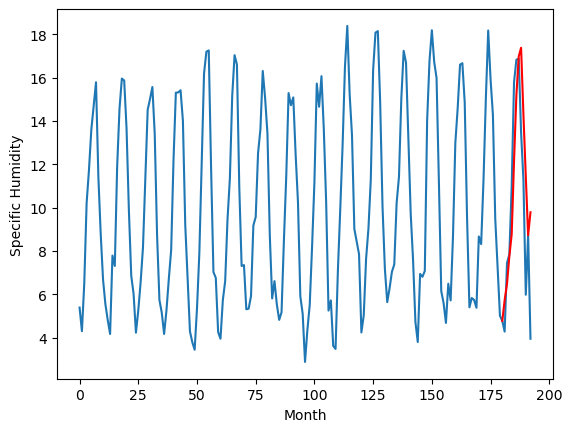

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		5.42		0.52
5.61		6.17		0.56
7.82		7.44		-0.38
8.04		8.47		0.43
10.53		11.86		1.33
15.28		14.89		-0.39
16.08		16.68		0.60
16.24		17.07		0.83
14.08		13.98		-0.10
11.00		11.13		0.13
5.34		8.42		3.08
8.98		9.48		0.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.421662616729736, 6.168300259113312, 7.4408373713493345, 8.466772186756135, 11.856277811527253, 14.88557015657425, 16.675244677066804, 17.07185121178627, 13.97821827530861, 11.129532057046891, 8.416056352853776, 9.478745537996293]


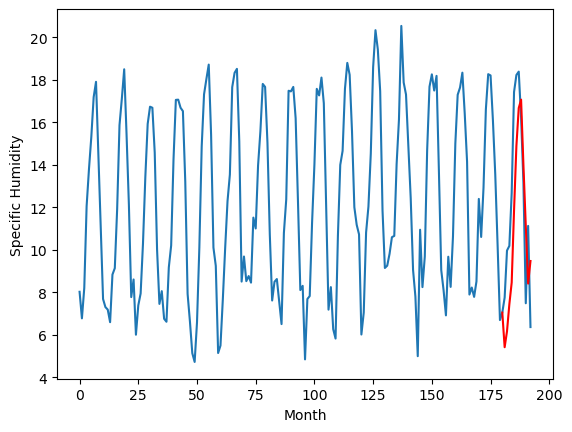

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		5.31		0.49
4.97		6.06		1.09
6.82		7.33		0.51
7.06		8.36		1.30
9.82		11.75		1.93
14.44		14.78		0.34
16.35		16.57		0.22
16.55		16.96		0.41
13.55		13.87		0.32
10.83		11.02		0.19
4.96		8.31		3.35
7.36		9.37		2.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 5.311662616729737, 6.058300259113312, 7.330837371349335, 8.356772186756135, 11.746277811527253, 14.77557015657425, 16.565244677066804, 16.96185121178627, 13.86821827530861, 11.019532057046892, 8.306056352853776, 9.368745537996293]


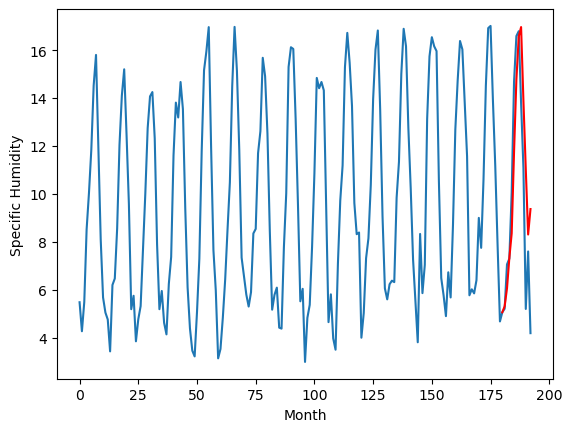

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		5.01		0.80
4.12		5.76		1.64
7.57		7.03		-0.54
8.14		8.06		-0.08
11.65		11.45		-0.20
15.55		14.48		-1.07
16.39		16.27		-0.12
16.01		16.66		0.65
13.70		13.57		-0.13
11.27		10.72		-0.55
5.06		8.01		2.95
8.11		9.07		0.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.011662616729736, 5.7583002591133114, 7.030837371349334, 8.056772186756135, 11.446277811527253, 14.47557015657425, 16.265244677066804, 16.66185121178627, 13.56821827530861, 10.71953205704689, 8.006056352853776, 9.068745537996293]


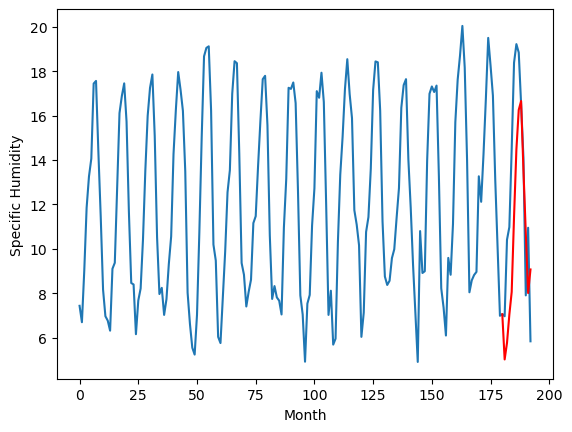

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		6.26		0.94
4.92		7.01		2.09
7.76		8.28		0.52
9.16		9.31		0.15
13.17		12.70		-0.47
16.86		15.73		-1.13
17.57		17.52		-0.05
17.49		17.91		0.42
13.26		14.82		1.56
11.17		11.97		0.80
6.95		9.26		2.31
9.71		10.32		0.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 6.261662616729736, 7.0083002591133114, 8.280837371349335, 9.306772186756135, 12.696277811527253, 15.72557015657425, 17.515244677066804, 17.91185121178627, 14.81821827530861, 11.96953205704689, 9.256056352853776, 10.318745537996293]


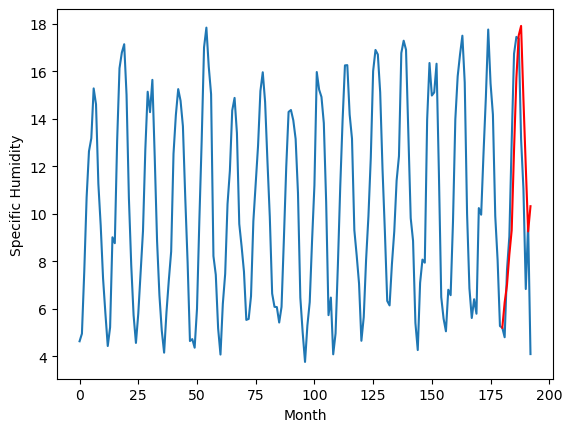

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		8.90		1.48
8.01		9.65		1.64
9.58		10.92		1.34
10.59		11.95		1.36
13.09		15.34		2.25
18.35		18.37		0.02
19.47		20.16		0.69
20.63		20.55		-0.08
16.54		17.46		0.92
14.22		14.61		0.39
8.96		11.90		2.94
10.38		12.96		2.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 8.901662616729736, 9.648300259113311, 10.920837371349334, 11.946772186756133, 15.336277811527252, 18.36557015657425, 20.155244677066804, 20.55185121178627, 17.45821827530861, 14.609532057046891, 11.896056352853776, 12.958745537996293]


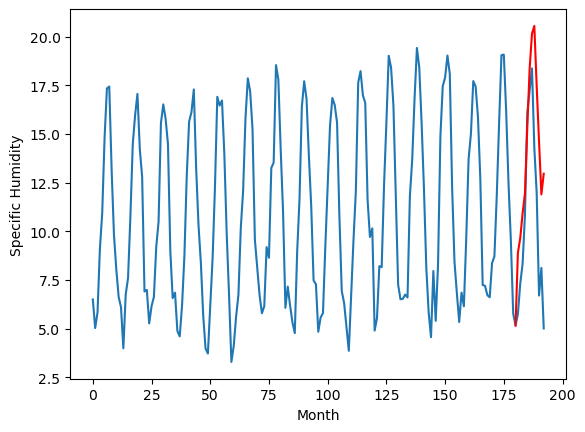

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		6.35		1.02
5.38		7.10		1.72
6.97		8.37		1.40
7.57		9.40		1.83
10.57		12.79		2.22
14.95		15.82		0.87
16.39		17.61		1.22
16.92		18.00		1.08
13.60		14.91		1.31
11.49		12.06		0.57
5.74		9.35		3.61
7.58		10.41		2.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 6.351662616729737, 7.098300259113312, 8.370837371349335, 9.396772186756134, 12.786277811527253, 15.81557015657425, 17.605244677066803, 18.00185121178627, 14.90821827530861, 12.05953205704689, 9.346056352853775, 10.408745537996293]


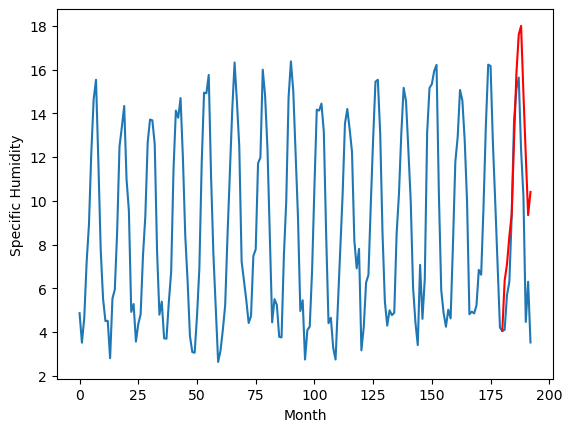

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		8.30		1.18
7.15		9.05		1.90
8.77		10.32		1.55
9.47		11.35		1.88
12.49		14.74		2.25
16.76		17.77		1.01
18.26		19.56		1.30
18.54		19.95		1.41
15.05		16.86		1.81
13.17		14.01		0.84
7.38		11.30		3.92
9.15		12.36		3.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 8.301662616729736, 9.048300259113311, 10.320837371349334, 11.346772186756134, 14.736277811527252, 17.76557015657425, 19.555244677066803, 19.95185121178627, 16.85821827530861, 14.00953205704689, 11.296056352853775, 12.358745537996292]


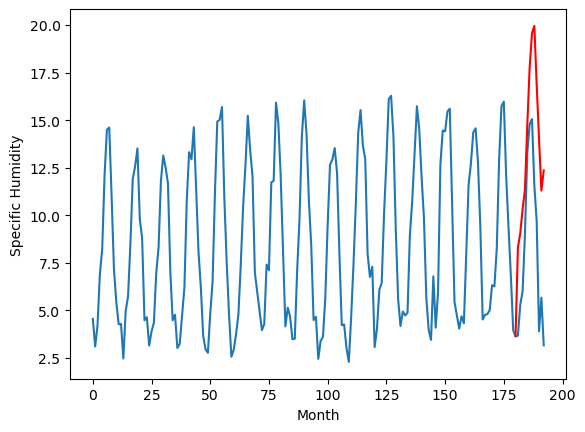

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		5.50		1.10
3.72		6.25		2.53
6.78		7.52		0.74
7.51		8.55		1.04
10.42		11.94		1.52
15.40		14.97		-0.43
16.90		16.76		-0.14
17.09		17.15		0.06
13.28		14.06		0.78
10.86		11.21		0.35
5.57		8.50		2.93
7.16		9.56		2.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 5.501662616729736, 6.248300259113312, 7.520837371349335, 8.546772186756133, 11.936277811527251, 14.965570156574248, 16.755244677066802, 17.15185121178627, 14.058218275308608, 11.20953205704689, 8.496056352853774, 9.558745537996291]


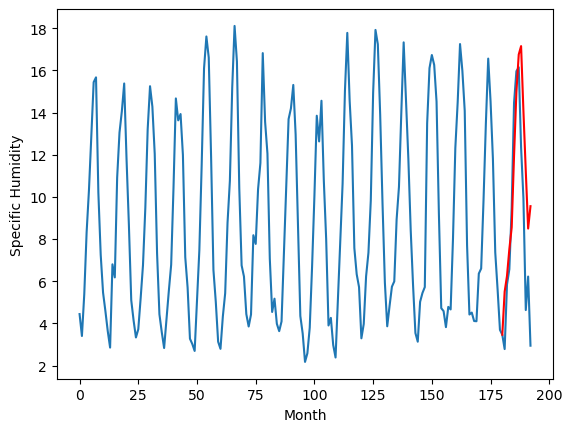

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		7.37		1.20
5.72		8.12		2.40
7.52		9.39		1.87
8.84		10.42		1.58
10.93		13.81		2.88
15.70		16.84		1.14
16.63		18.63		2.00
17.05		19.02		1.97
13.88		15.93		2.05
12.57		13.08		0.51
7.05		10.37		3.32
7.89		11.43		3.54
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 7.371662616729736, 8.118300259113312, 9.390837371349335, 10.416772186756134, 13.806277811527252, 16.83557015657425, 18.625244677066803, 19.02185121178627, 15.928218275308609, 13.07953205704689, 10.366056352853775, 11.428745537996292]


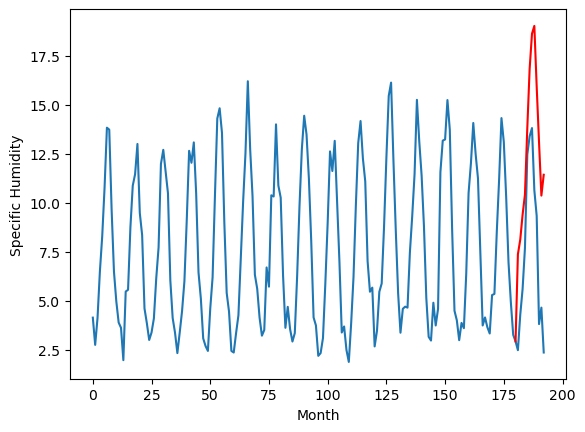

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		5.73		1.25
3.74		6.48		2.74
5.36		7.75		2.39
6.96		8.78		1.82
8.48		12.17		3.69
13.61		15.20		1.59
14.68		16.99		2.31
15.17		17.38		2.21
11.55		14.29		2.74
10.56		11.44		0.88
5.71		8.73		3.02
5.71		9.79		4.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 5.731662616729737, 6.478300259113312, 7.750837371349335, 8.776772186756133, 12.166277811527252, 15.195570156574249, 16.985244677066802, 17.38185121178627, 14.288218275308608, 11.43953205704689, 8.726056352853774, 9.788745537996292]


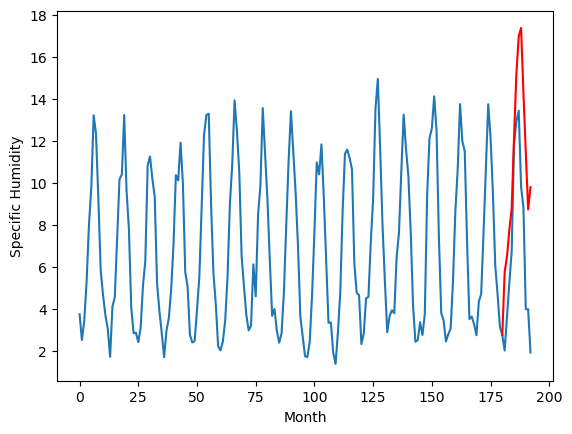

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[5.731662616729737, 5.421662616729736, 5.311662616729737, 5.011662616729736, 6.261662616729736, 8.901662616729736, 6.351662616729737, 8.301662616729736, 5.501662616729736, 7.371662616729736, 5.731662616729737]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   5.731663
1                 1    4.90   5.421663
2                 2    4.82   5.311663
3                 3    4.21   5.011663
4                 4    5.32   6.261663
5                 5    7.42   8.901663
6                 6    5.33   6.351663
7                 7    7.12   8.301663
8                 8    4.40   5.501663
9                 9    6.17   7.371663
10               10    4.48   5.731663


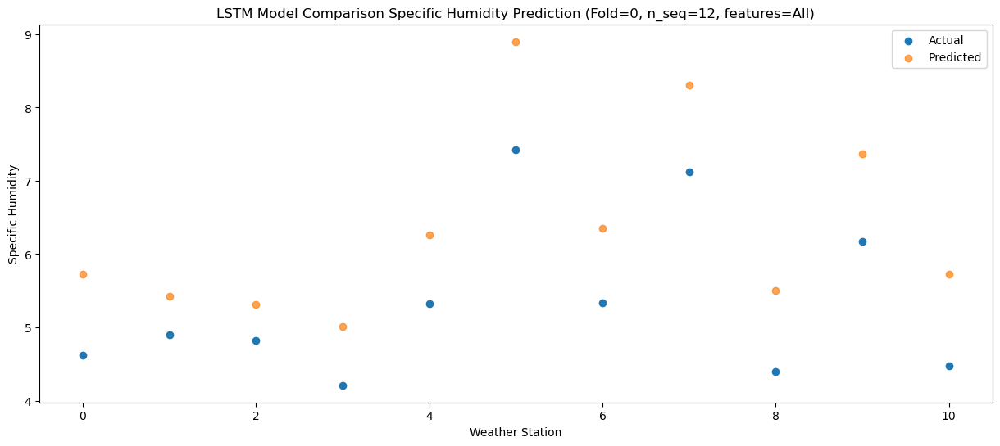

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13     6.4783
1                 1    5.61     6.1683
2                 2    4.97     6.0583
3                 3    4.12     5.7583
4                 4    4.92     7.0083
5                 5    8.01     9.6483
6                 6    5.38     7.0983
7                 7    7.15     9.0483
8                 8    3.72     6.2483
9                 9    5.72     8.1183
10               10    3.74     6.4783


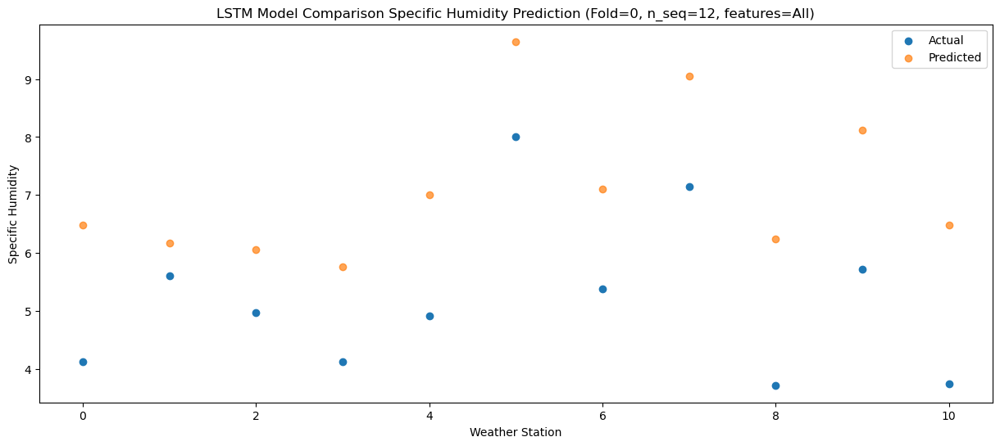

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   7.750837
1                 1    7.82   7.440837
2                 2    6.82   7.330837
3                 3    7.57   7.030837
4                 4    7.76   8.280837
5                 5    9.58  10.920837
6                 6    6.97   8.370837
7                 7    8.77  10.320837
8                 8    6.78   7.520837
9                 9    7.52   9.390837
10               10    5.36   7.750837


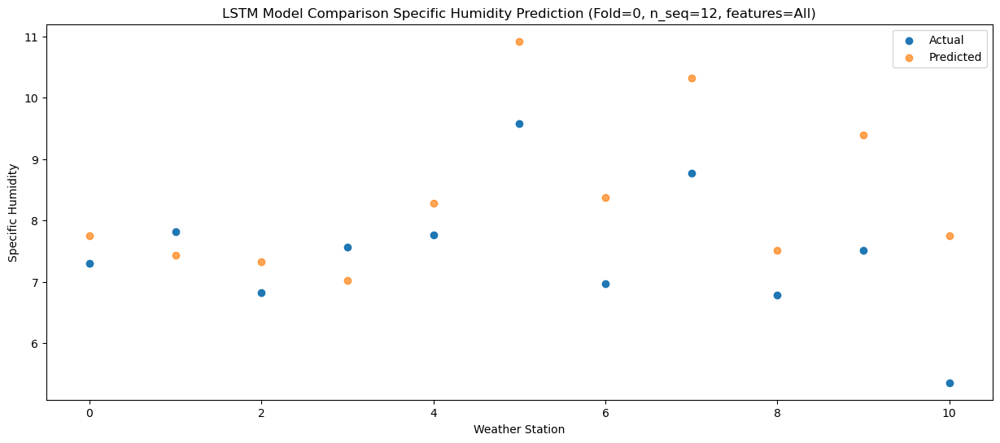

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   8.776772
1                 1    8.04   8.466772
2                 2    7.06   8.356772
3                 3    8.14   8.056772
4                 4    9.16   9.306772
5                 5   10.59  11.946772
6                 6    7.57   9.396772
7                 7    9.47  11.346772
8                 8    7.51   8.546772
9                 9    8.84  10.416772
10               10    6.96   8.776772


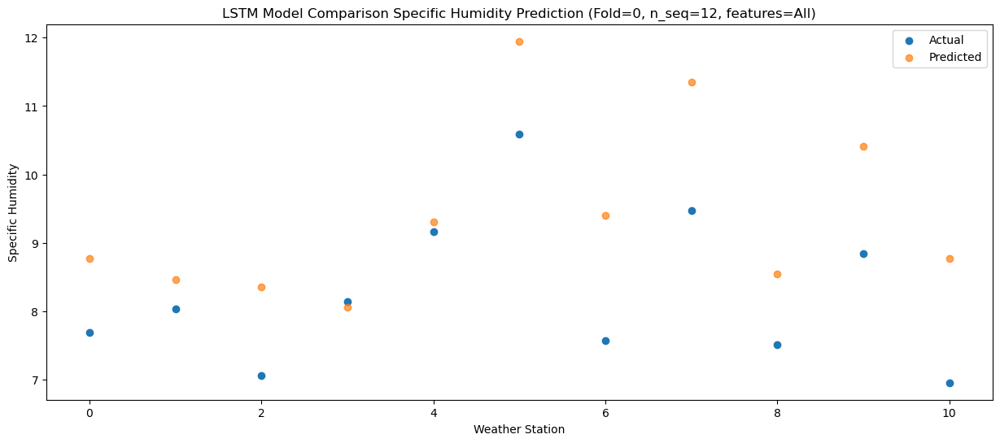

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  12.166278
1                 1   10.53  11.856278
2                 2    9.82  11.746278
3                 3   11.65  11.446278
4                 4   13.17  12.696278
5                 5   13.09  15.336278
6                 6   10.57  12.786278
7                 7   12.49  14.736278
8                 8   10.42  11.936278
9                 9   10.93  13.806278
10               10    8.48  12.166278


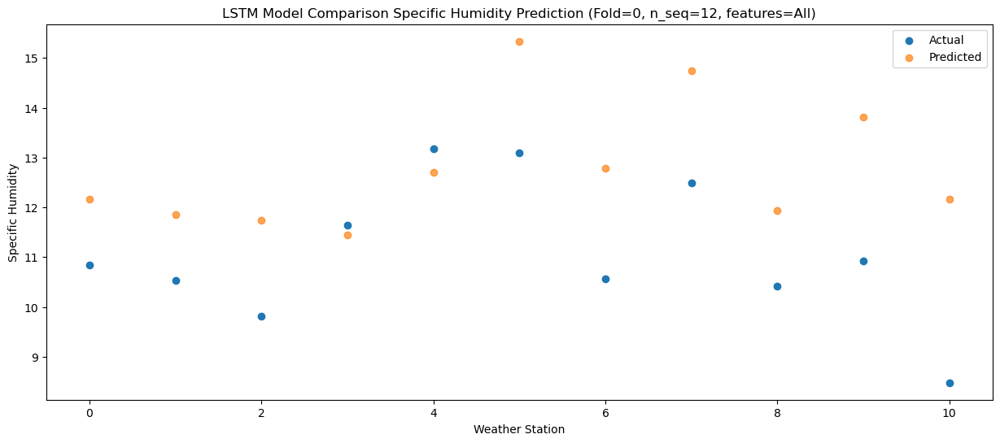

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65   15.19557
1                 1   15.28   14.88557
2                 2   14.44   14.77557
3                 3   15.55   14.47557
4                 4   16.86   15.72557
5                 5   18.35   18.36557
6                 6   14.95   15.81557
7                 7   16.76   17.76557
8                 8   15.40   14.96557
9                 9   15.70   16.83557
10               10   13.61   15.19557


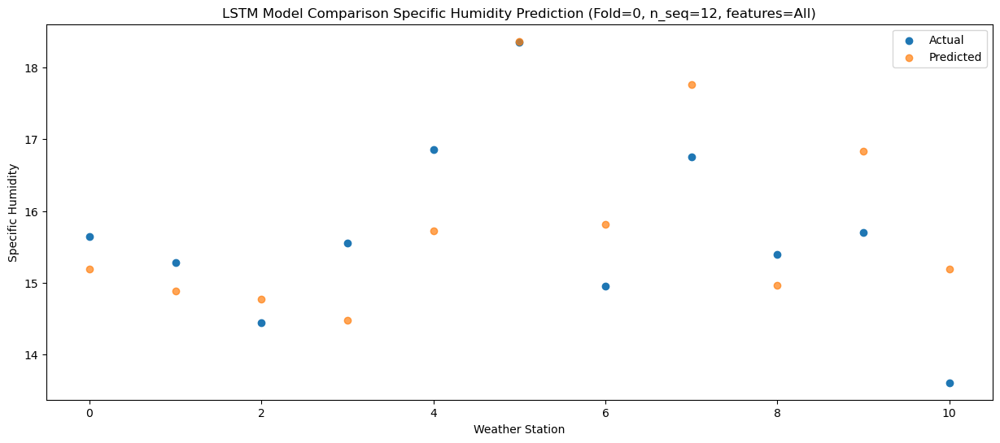

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  16.985245
1                 1   16.08  16.675245
2                 2   16.35  16.565245
3                 3   16.39  16.265245
4                 4   17.57  17.515245
5                 5   19.47  20.155245
6                 6   16.39  17.605245
7                 7   18.26  19.555245
8                 8   16.90  16.755245
9                 9   16.63  18.625245
10               10   14.68  16.985245


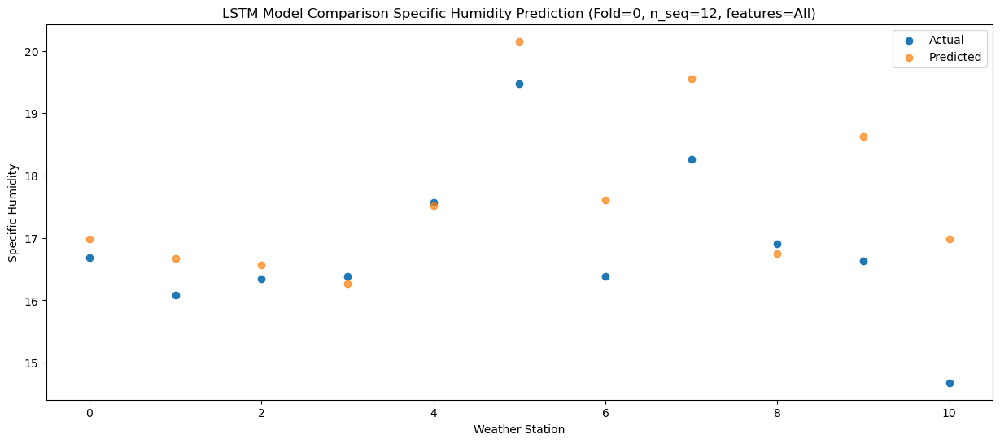

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  17.381851
1                 1   16.24  17.071851
2                 2   16.55  16.961851
3                 3   16.01  16.661851
4                 4   17.49  17.911851
5                 5   20.63  20.551851
6                 6   16.92  18.001851
7                 7   18.54  19.951851
8                 8   17.09  17.151851
9                 9   17.05  19.021851
10               10   15.17  17.381851


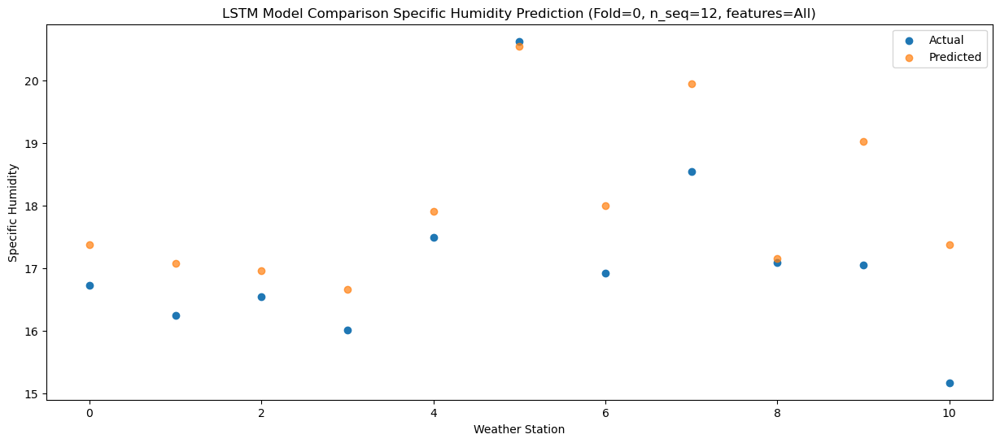

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  14.288218
1                 1   14.08  13.978218
2                 2   13.55  13.868218
3                 3   13.70  13.568218
4                 4   13.26  14.818218
5                 5   16.54  17.458218
6                 6   13.60  14.908218
7                 7   15.05  16.858218
8                 8   13.28  14.058218
9                 9   13.88  15.928218
10               10   11.55  14.288218


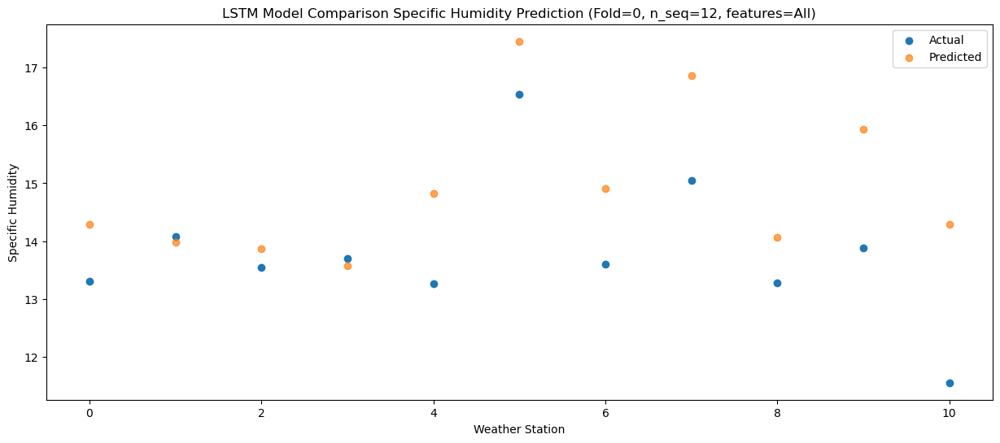

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  11.439532
1                 1   11.00  11.129532
2                 2   10.83  11.019532
3                 3   11.27  10.719532
4                 4   11.17  11.969532
5                 5   14.22  14.609532
6                 6   11.49  12.059532
7                 7   13.17  14.009532
8                 8   10.86  11.209532
9                 9   12.57  13.079532
10               10   10.56  11.439532


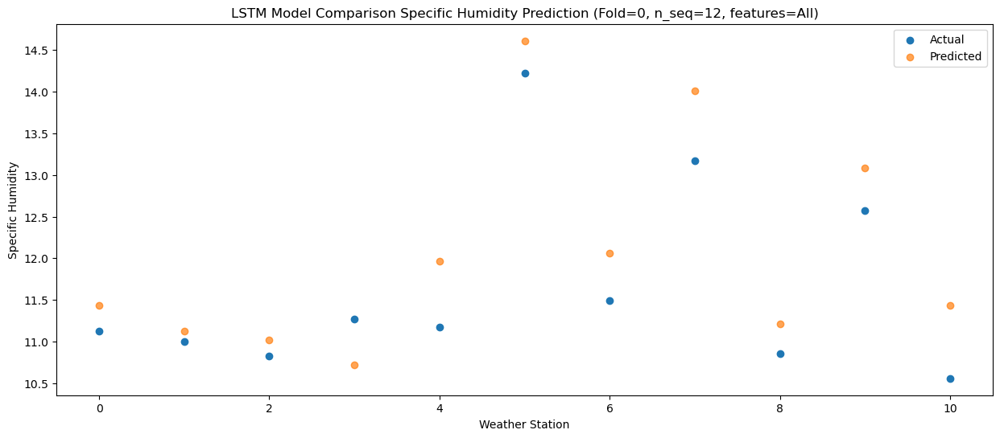

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   8.726056
1                 1    5.34   8.416056
2                 2    4.96   8.306056
3                 3    5.06   8.006056
4                 4    6.95   9.256056
5                 5    8.96  11.896056
6                 6    5.74   9.346056
7                 7    7.38  11.296056
8                 8    5.57   8.496056
9                 9    7.05  10.366056
10               10    5.71   8.726056


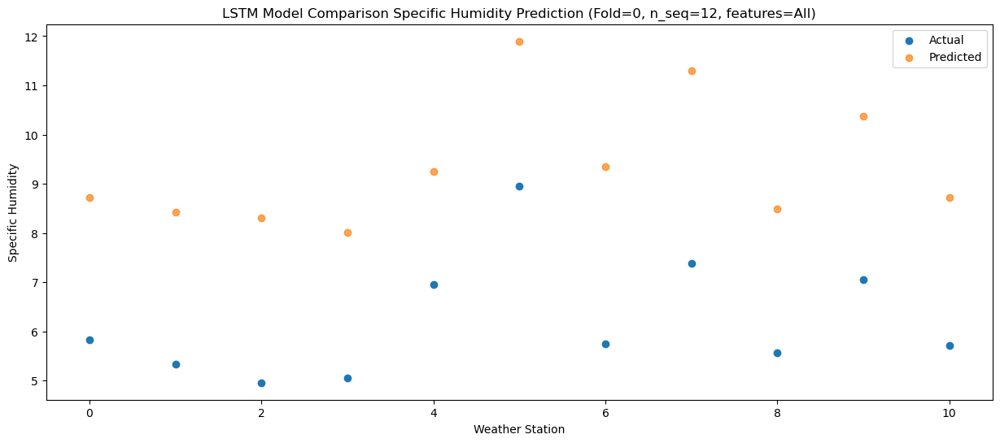

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   9.788746
1                 1    8.98   9.478746
2                 2    7.36   9.368746
3                 3    8.11   9.068746
4                 4    9.71  10.318746
5                 5   10.38  12.958746
6                 6    7.58  10.408746
7                 7    9.15  12.358746
8                 8    7.16   9.558746
9                 9    7.89  11.428746
10               10    5.71   9.788746


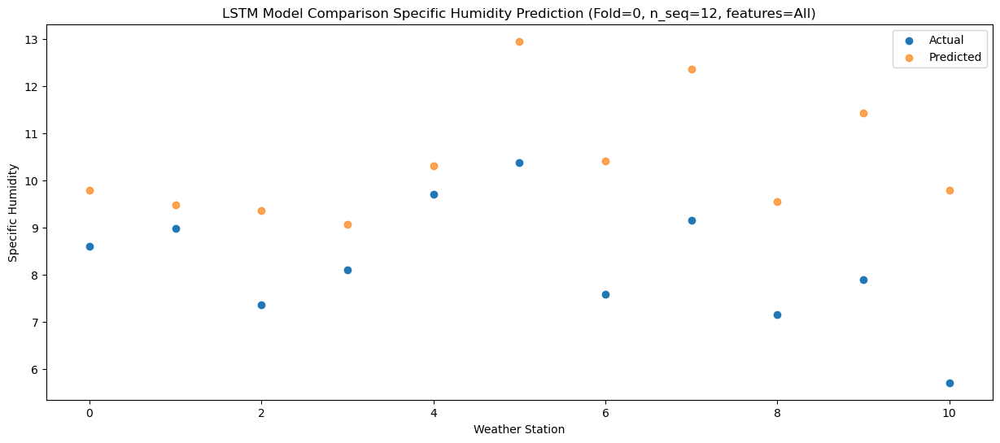

Model: "sequential_500"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1000 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1000 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1001 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1001 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1500 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1501 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1502 (Dense)          (1, 12)                

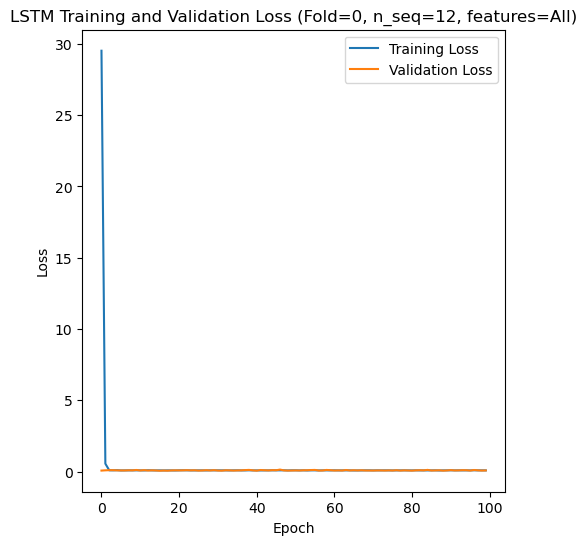

Epoch 1/100
84/84 [==============================] - 34s 258ms/step - loss: 34.1709 - val_loss: 0.0627
Epoch 2/100
84/84 [==============================] - 18s 215ms/step - loss: 0.6978 - val_loss: 0.0672
Epoch 3/100
84/84 [==============================] - 22s 261ms/step - loss: 0.0745 - val_loss: 0.0737
Epoch 4/100
84/84 [==============================] - 22s 266ms/step - loss: 0.5231 - val_loss: 0.0932
Epoch 5/100
84/84 [==============================] - 22s 259ms/step - loss: 0.0829 - val_loss: 0.0731
Epoch 6/100
84/84 [==============================] - 17s 201ms/step - loss: 0.0777 - val_loss: 0.1043
Epoch 7/100
84/84 [==============================] - 15s 180ms/step - loss: 0.0793 - val_loss: 0.0743
Epoch 8/100
84/84 [==============================] - 15s 174ms/step - loss: 0.0760 - val_loss: 0.0698
Epoch 9/100
84/84 [==============================] - 17s 207ms/step - loss: 0.0821 - val_loss: 0.0608
Epoch 10/100
84/84 [==============================] - 18s 210ms/step - loss: 0.07

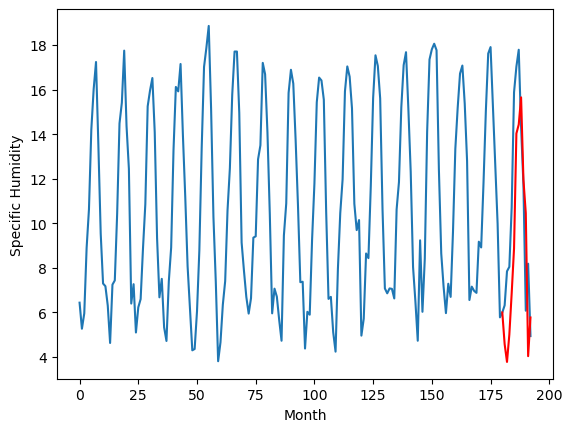

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.08		-0.26
4.53		3.28		-1.25
6.06		4.51		-1.55
6.42		6.37		-0.05
9.34		8.38		-0.96
13.32		13.54		0.22
15.19		13.94		-1.25
15.40		15.16		-0.24
12.45		11.46		-0.99
10.41		9.96		-0.45
4.82		3.54		-1.28
6.99		5.27		-1.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 4.07631582736969, 3.278759665489197, 4.5132401657104495, 6.372963256835938, 8.381538696289063, 13.53690845489502, 13.94367108464241, 15.160921431779862, 11.460566617250443, 9.963890768289566, 3.537641264200211, 5.274425722360611]


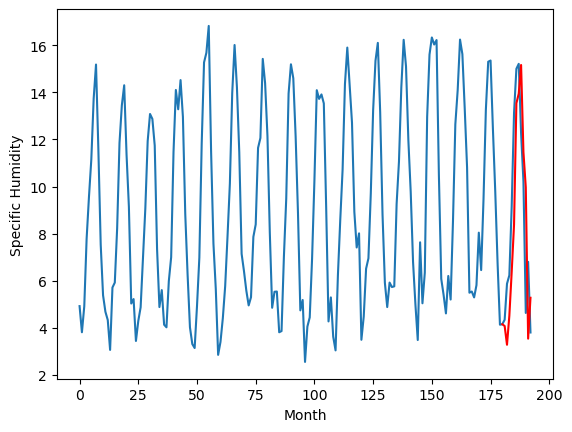

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.83		-0.39
3.22		2.03		-1.19
5.84		3.26		-2.58
5.55		5.12		-0.43
8.39		7.13		-1.26
12.91		12.29		-0.62
14.50		12.69		-1.81
14.72		13.91		-0.81
11.96		10.21		-1.75
9.21		8.71		-0.50
3.71		2.29		-1.42
6.35		4.02		-2.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 2.82631582736969, 2.0287596654891966, 3.263240165710449, 5.122963256835938, 7.131538696289063, 12.28690845489502, 12.69367108464241, 13.910921431779862, 10.210566617250443, 8.713890768289566, 2.287641264200211, 4.024425722360611]


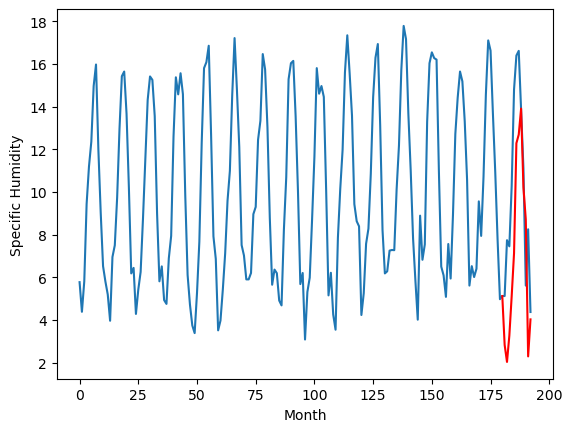

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.13		0.10
2.10		1.33		-0.77
4.74		2.56		-2.18
6.08		4.42		-1.66
9.97		6.43		-3.54
13.16		11.59		-1.57
13.64		11.99		-1.65
13.98		13.21		-0.77
10.89		9.51		-1.38
8.64		8.01		-0.63
4.19		1.59		-2.60
7.11		3.32		-3.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 2.12631582736969, 1.3287596654891969, 2.5632401657104493, 4.422963256835938, 6.431538696289063, 11.58690845489502, 11.993671084642411, 13.210921431779862, 9.510566617250443, 8.013890768289567, 1.5876412642002116, 3.324425722360612]


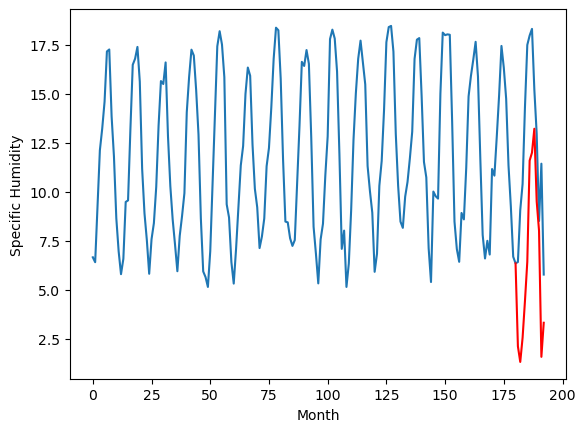

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.19		0.01
6.22		5.39		-0.83
8.94		6.62		-2.32
10.20		8.48		-1.72
14.23		10.49		-3.74
17.64		15.65		-1.99
17.82		16.05		-1.77
17.86		17.27		-0.59
14.76		13.57		-1.19
12.81		12.07		-0.74
8.22		5.65		-2.57
11.15		7.38		-3.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.18631582736969, 5.3887596654891965, 6.623240165710449, 8.482963256835937, 10.491538696289062, 15.64690845489502, 16.05367108464241, 17.27092143177986, 13.570566617250442, 12.073890768289566, 5.64764126420021, 7.384425722360611]


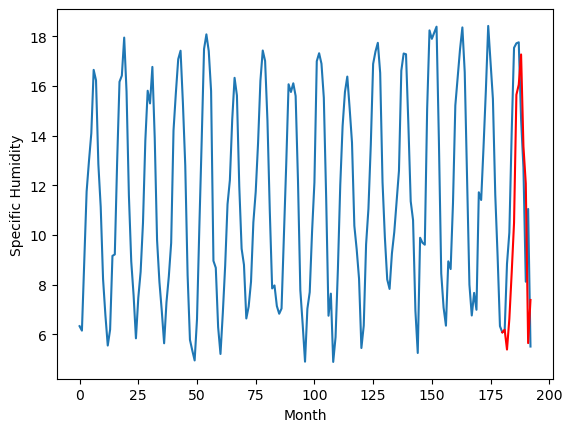

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.68		-1.07
5.12		3.88		-1.24
5.91		5.11		-0.80
7.21		6.97		-0.24
11.52		8.98		-2.54
13.69		14.14		0.45
15.02		14.54		-0.48
15.24		15.76		0.52
11.70		12.06		0.36
8.59		10.56		1.97
6.75		4.14		-2.61
5.70		5.87		0.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 4.67631582736969, 3.8787596654891967, 5.113240165710449, 6.972963256835937, 8.981538696289062, 14.13690845489502, 14.54367108464241, 15.760921431779861, 12.060566617250442, 10.563890768289566, 4.1376412642002105, 5.874425722360611]


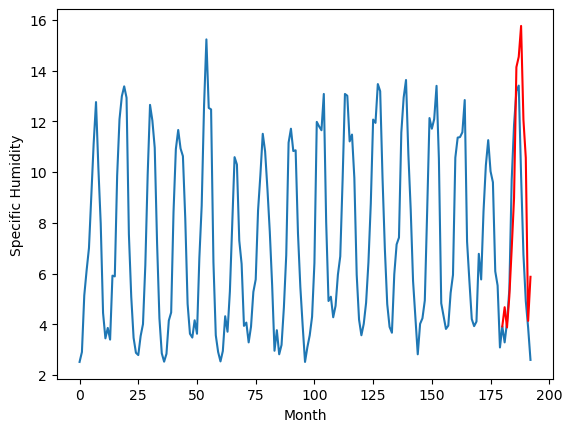

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.53		-0.13
5.78		4.73		-1.05
7.34		5.96		-1.38
7.96		7.82		-0.14
10.89		9.83		-1.06
15.24		14.99		-0.25
17.74		15.39		-2.35
18.03		16.61		-1.42
14.68		12.91		-1.77
12.55		11.41		-1.14
6.62		4.99		-1.63
8.49		6.72		-1.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 5.5263158273696895, 4.728759665489196, 5.963240165710449, 7.822963256835937, 9.831538696289062, 14.986908454895019, 15.39367108464241, 16.61092143177986, 12.910566617250442, 11.413890768289566, 4.98764126420021, 6.7244257223606105]


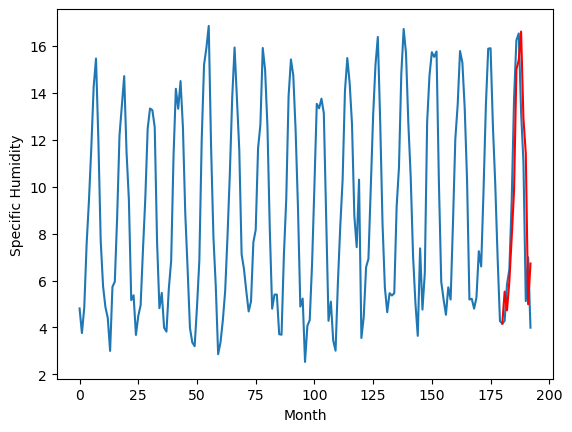

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.42		-0.11
6.01		5.62		-0.39
8.74		6.85		-1.89
9.97		8.71		-1.26
13.18		10.72		-2.46
17.94		15.88		-2.06
18.57		16.28		-2.29
18.42		17.50		-0.92
15.17		13.80		-1.37
12.44		12.30		-0.14
7.88		5.88		-2.00
9.52		7.61		-1.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 6.41631582736969, 5.618759665489197, 6.853240165710449, 8.712963256835938, 10.721538696289063, 15.87690845489502, 16.28367108464241, 17.50092143177986, 13.800566617250443, 12.303890768289566, 5.877641264200211, 7.614425722360611]


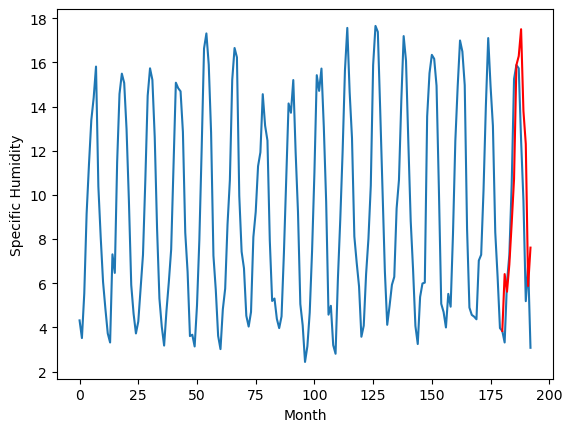

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.09		-0.40
5.68		5.29		-0.39
8.29		6.52		-1.77
9.45		8.38		-1.07
13.67		10.39		-3.28
16.81		15.55		-1.26
17.86		15.95		-1.91
17.44		17.17		-0.27
13.87		13.47		-0.40
11.43		11.97		0.54
7.90		5.55		-2.35
7.29		7.28		-0.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 6.08631582736969, 5.288759665489197, 6.523240165710449, 8.382963256835938, 10.391538696289063, 15.54690845489502, 15.95367108464241, 17.17092143177986, 13.47056661725044, 11.973890768289564, 5.547641264200209, 7.284425722360609]


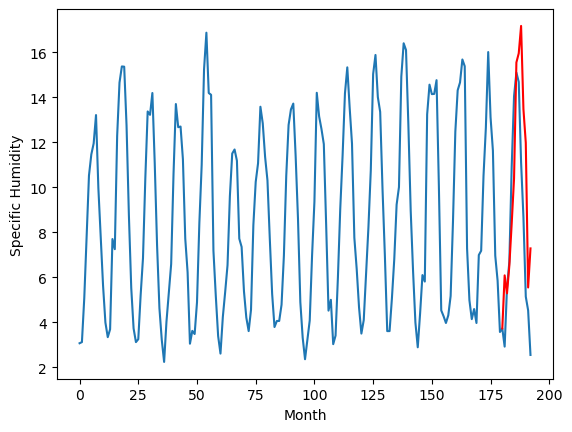

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.28		-0.43
1.97		1.48		-0.49
3.79		2.71		-1.08
3.96		4.57		0.61
9.11		6.58		-2.53
12.10		11.74		-0.36
13.34		12.14		-1.20
12.31		13.36		1.05
9.35		9.66		0.31
5.91		8.16		2.25
3.55		1.74		-1.81
2.57		3.47		0.90
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.27631582736969, 1.4787596654891968, 2.7132401657104492, 4.572963256835937, 6.581538696289062, 11.736908454895019, 12.14367108464241, 13.360921431779861, 9.660566617250442, 8.163890768289566, 1.7376412642002101, 3.4744257223606105]


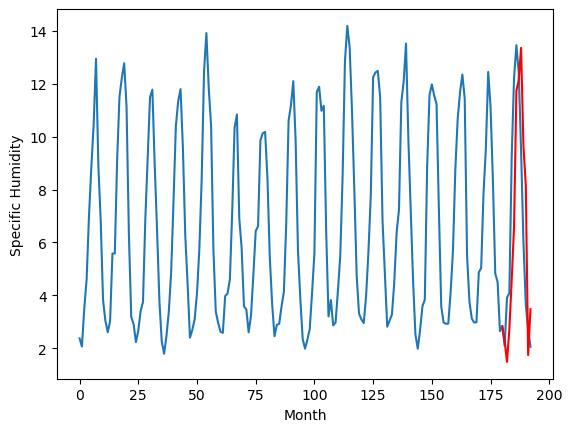

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.57		0.49
4.12		3.77		-0.35
5.36		5.00		-0.36
6.73		6.86		0.13
8.26		8.87		0.61
13.58		14.03		0.45
15.44		14.43		-1.01
15.78		15.65		-0.13
12.59		11.95		-0.64
10.73		10.45		-0.28
5.54		4.03		-1.51
5.42		5.76		0.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 4.5663158273696896, 3.7687596654891964, 5.003240165710449, 6.862963256835937, 8.871538696289061, 14.026908454895018, 14.433671084642409, 15.65092143177986, 11.950566617250441, 10.453890768289565, 4.027641264200209, 5.76442572236061]


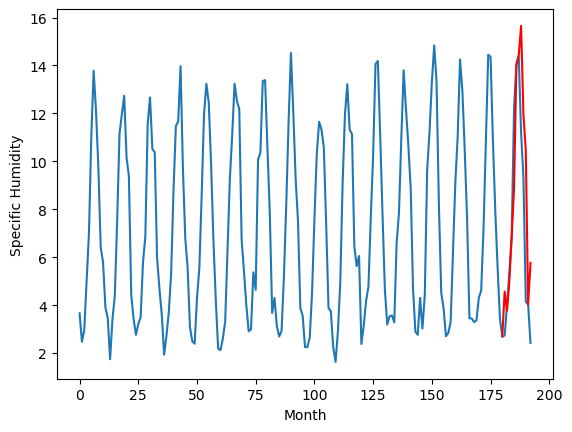

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.5663158273696896, 4.07631582736969, 2.82631582736969, 2.12631582736969, 6.18631582736969, 4.67631582736969, 5.5263158273696895, 6.41631582736969, 6.08631582736969, 2.27631582736969, 4.5663158273696896]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.566316
1                 1    4.34   4.076316
2                 2    3.22   2.826316
3                 3    2.03   2.126316
4                 4    6.18   6.186316
5                 5    5.75   4.676316
6                 6    5.66   5.526316
7                 7    6.53   6.416316
8                 8    6.49   6.086316
9                 9    2.71   2.276316
10               10    4.08   4.566316


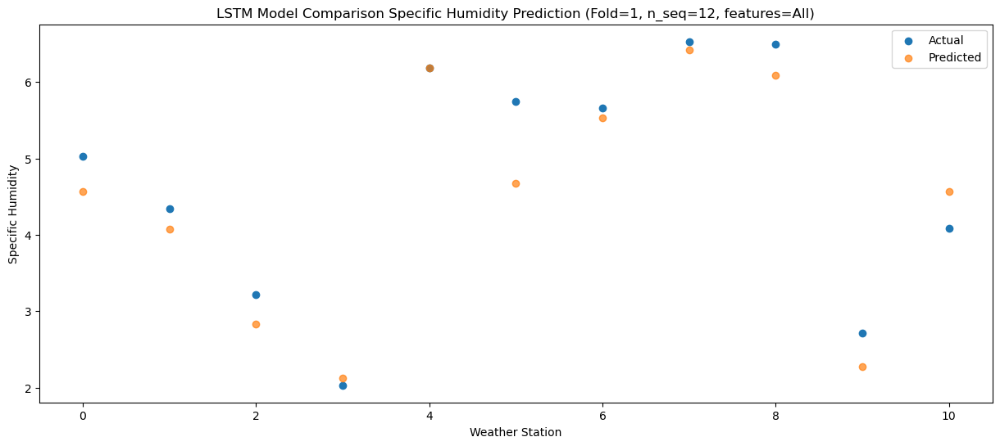

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35    3.76876
1                 1    4.53    3.27876
2                 2    3.22    2.02876
3                 3    2.10    1.32876
4                 4    6.22    5.38876
5                 5    5.12    3.87876
6                 6    5.78    4.72876
7                 7    6.01    5.61876
8                 8    5.68    5.28876
9                 9    1.97    1.47876
10               10    4.12    3.76876


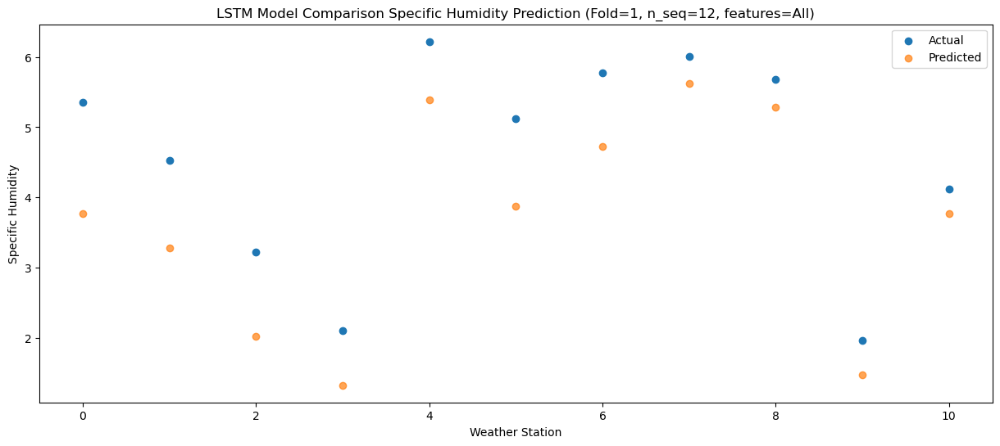

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88    5.00324
1                 1    6.06    4.51324
2                 2    5.84    3.26324
3                 3    4.74    2.56324
4                 4    8.94    6.62324
5                 5    5.91    5.11324
6                 6    7.34    5.96324
7                 7    8.74    6.85324
8                 8    8.29    6.52324
9                 9    3.79    2.71324
10               10    5.36    5.00324


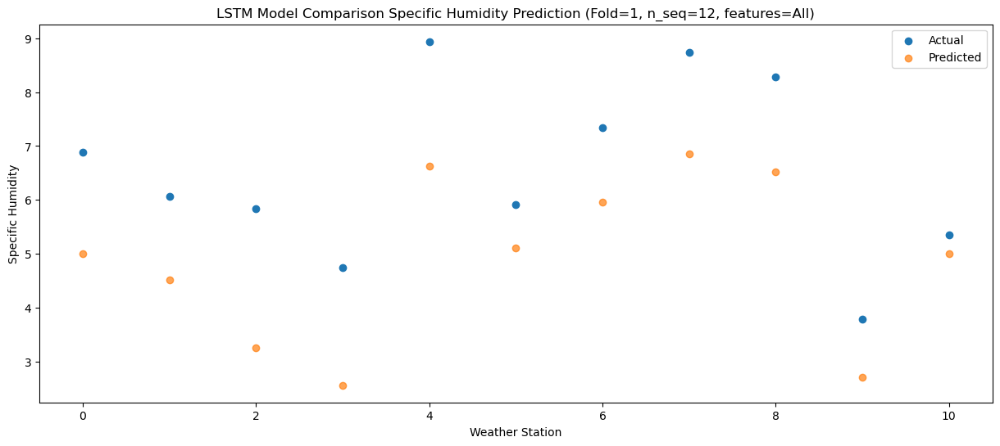

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   6.862963
1                 1    6.42   6.372963
2                 2    5.55   5.122963
3                 3    6.08   4.422963
4                 4   10.20   8.482963
5                 5    7.21   6.972963
6                 6    7.96   7.822963
7                 7    9.97   8.712963
8                 8    9.45   8.382963
9                 9    3.96   4.572963
10               10    6.73   6.862963


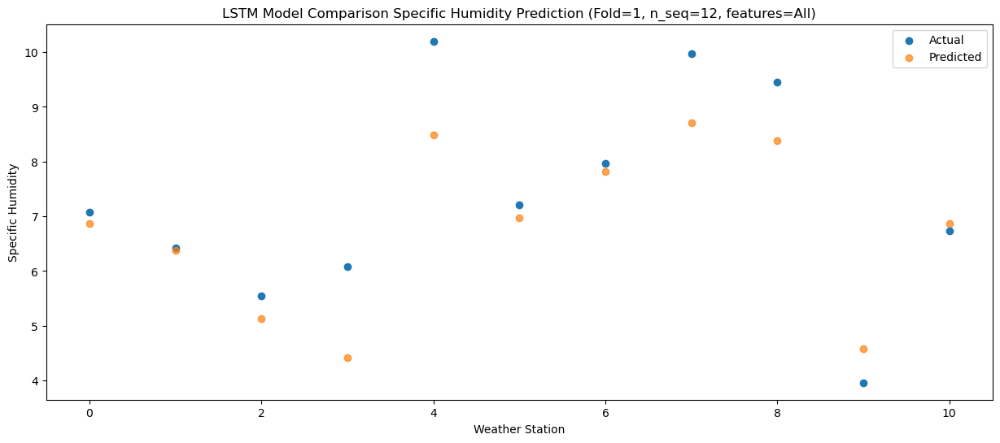

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76   8.871539
1                 1    9.34   8.381539
2                 2    8.39   7.131539
3                 3    9.97   6.431539
4                 4   14.23  10.491539
5                 5   11.52   8.981539
6                 6   10.89   9.831539
7                 7   13.18  10.721539
8                 8   13.67  10.391539
9                 9    9.11   6.581539
10               10    8.26   8.871539


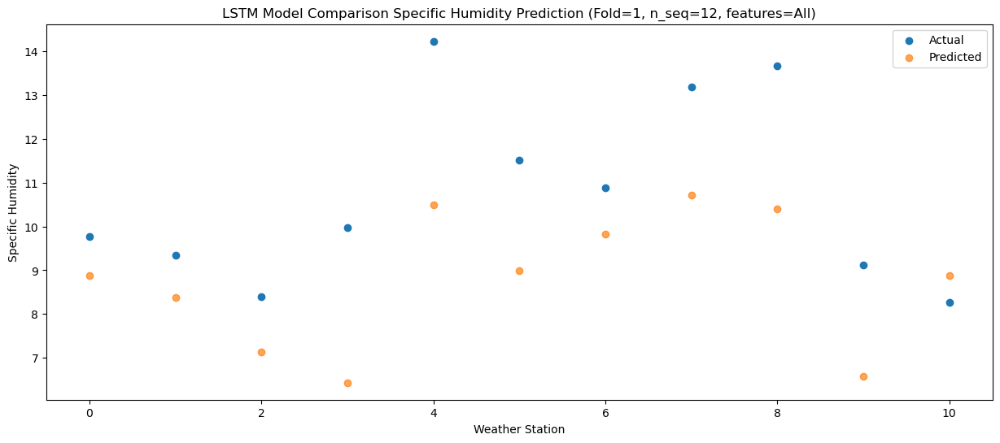

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  14.026908
1                 1   13.32  13.536908
2                 2   12.91  12.286908
3                 3   13.16  11.586908
4                 4   17.64  15.646908
5                 5   13.69  14.136908
6                 6   15.24  14.986908
7                 7   17.94  15.876908
8                 8   16.81  15.546908
9                 9   12.10  11.736908
10               10   13.58  14.026908


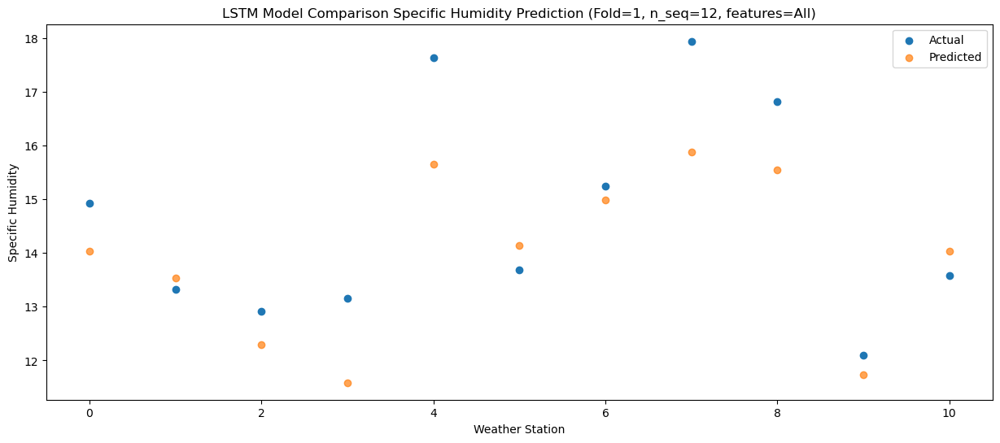

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.07  14.433671
1                 1   15.19  13.943671
2                 2   14.50  12.693671
3                 3   13.64  11.993671
4                 4   17.82  16.053671
5                 5   15.02  14.543671
6                 6   17.74  15.393671
7                 7   18.57  16.283671
8                 8   17.86  15.953671
9                 9   13.34  12.143671
10               10   15.44  14.433671


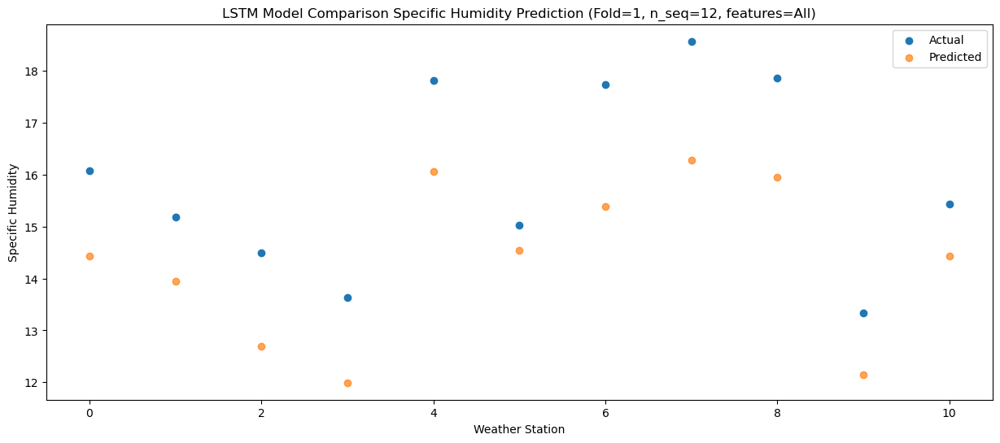

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.83  15.650921
1                 1   15.40  15.160921
2                 2   14.72  13.910921
3                 3   13.98  13.210921
4                 4   17.86  17.270921
5                 5   15.24  15.760921
6                 6   18.03  16.610921
7                 7   18.42  17.500921
8                 8   17.44  17.170921
9                 9   12.31  13.360921
10               10   15.78  15.650921


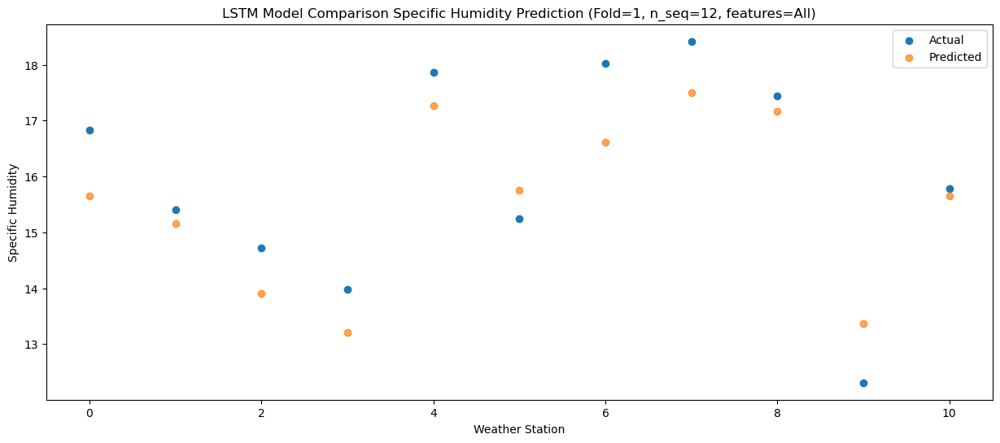

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.35  11.950567
1                 1   12.45  11.460567
2                 2   11.96  10.210567
3                 3   10.89   9.510567
4                 4   14.76  13.570567
5                 5   11.70  12.060567
6                 6   14.68  12.910567
7                 7   15.17  13.800567
8                 8   13.87  13.470567
9                 9    9.35   9.660567
10               10   12.59  11.950567


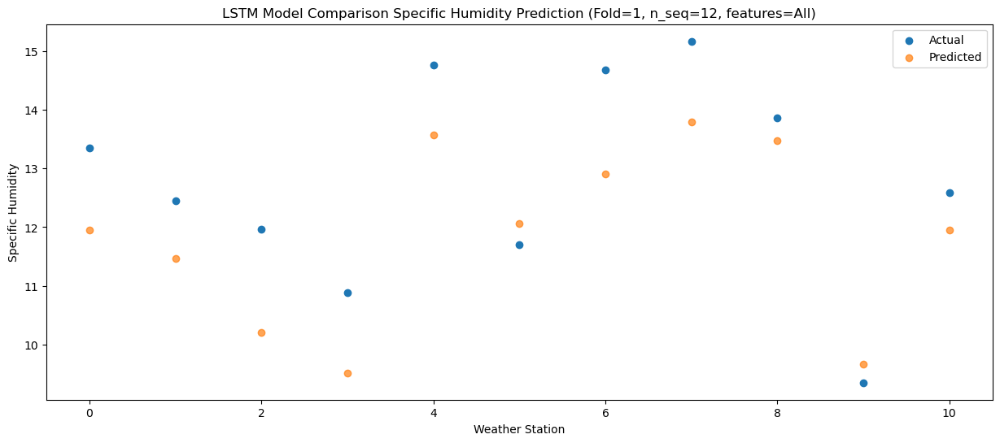

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.77  10.453891
1                 1   10.41   9.963891
2                 2    9.21   8.713891
3                 3    8.64   8.013891
4                 4   12.81  12.073891
5                 5    8.59  10.563891
6                 6   12.55  11.413891
7                 7   12.44  12.303891
8                 8   11.43  11.973891
9                 9    5.91   8.163891
10               10   10.73  10.453891


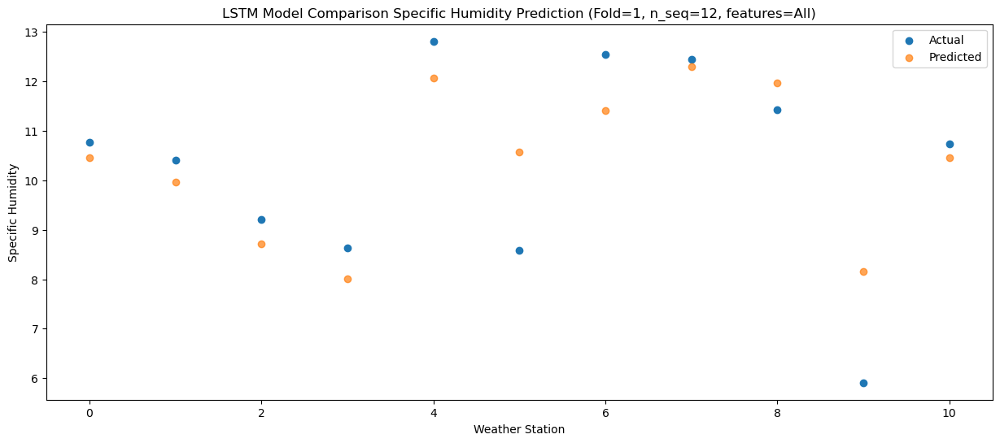

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   4.027641
1                 1    4.82   3.537641
2                 2    3.71   2.287641
3                 3    4.19   1.587641
4                 4    8.22   5.647641
5                 5    6.75   4.137641
6                 6    6.62   4.987641
7                 7    7.88   5.877641
8                 8    7.90   5.547641
9                 9    3.55   1.737641
10               10    5.54   4.027641


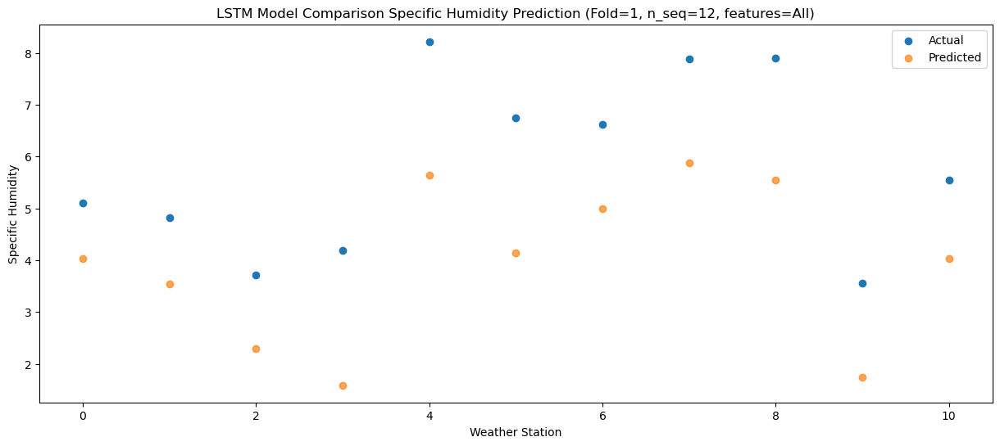

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.22   5.764426
1                 1    6.99   5.274426
2                 2    6.35   4.024426
3                 3    7.11   3.324426
4                 4   11.15   7.384426
5                 5    5.70   5.874426
6                 6    8.49   6.724426
7                 7    9.52   7.614426
8                 8    7.29   7.284426
9                 9    2.57   3.474426
10               10    5.42   5.764426


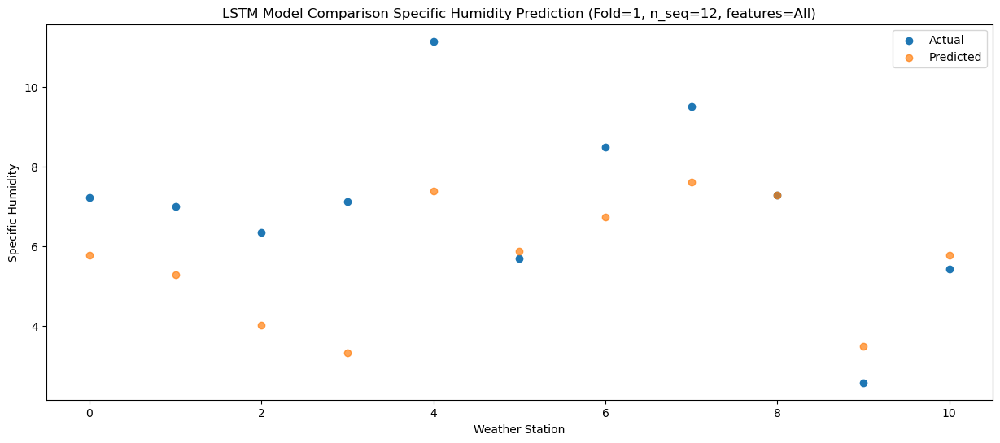

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1002 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1003 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1003 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 12)                

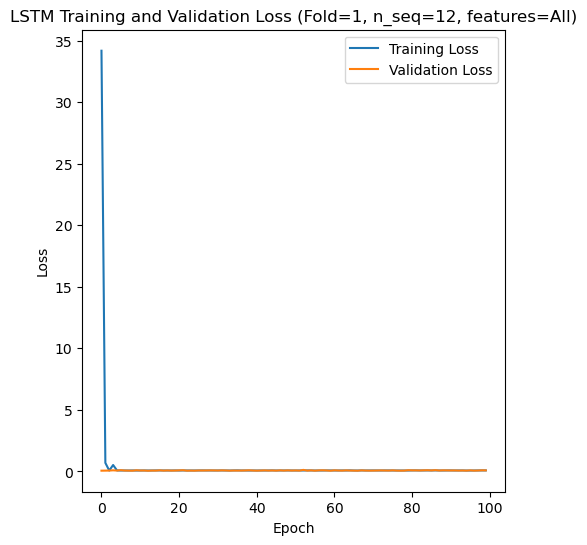

Epoch 1/100
84/84 [==============================] - 46s 325ms/step - loss: 24.3923 - val_loss: 0.0822
Epoch 2/100
84/84 [==============================] - 19s 229ms/step - loss: 0.0790 - val_loss: 0.0651
Epoch 3/100
84/84 [==============================] - 16s 191ms/step - loss: 0.0772 - val_loss: 0.1161
Epoch 4/100
84/84 [==============================] - 21s 251ms/step - loss: 0.0798 - val_loss: 0.0531
Epoch 5/100
84/84 [==============================] - 20s 236ms/step - loss: 0.0783 - val_loss: 0.0821
Epoch 6/100
84/84 [==============================] - 22s 261ms/step - loss: 0.0834 - val_loss: 0.1071
Epoch 7/100
84/84 [==============================] - 23s 277ms/step - loss: 0.0790 - val_loss: 0.0452
Epoch 8/100
84/84 [==============================] - 22s 266ms/step - loss: 0.0832 - val_loss: 0.0567
Epoch 9/100
84/84 [==============================] - 21s 246ms/step - loss: 0.0804 - val_loss: 0.0618
Epoch 10/100
84/84 [==============================] - 18s 219ms/step - loss: 0.08

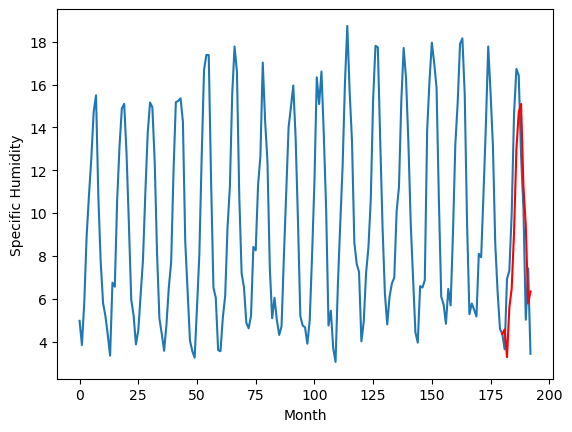

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.84		-0.00
1.16		0.54		-0.62
3.01		2.85		-0.16
3.13		3.74		0.61
8.25		6.36		-1.89
11.16		10.23		-0.93
12.77		11.98		-0.79
11.15		12.37		1.22
8.33		8.53		0.20
4.94		6.69		1.75
2.51		3.05		0.54
1.45		3.61		2.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 1.8398130977153777, 0.5418451869487761, 2.853805884122848, 3.7449945056438443, 6.358630045652389, 10.234336718320847, 11.979124768972397, 12.365120157003403, 8.529556020498276, 6.689137085676194, 3.0467954719066626, 3.6112520539760595]


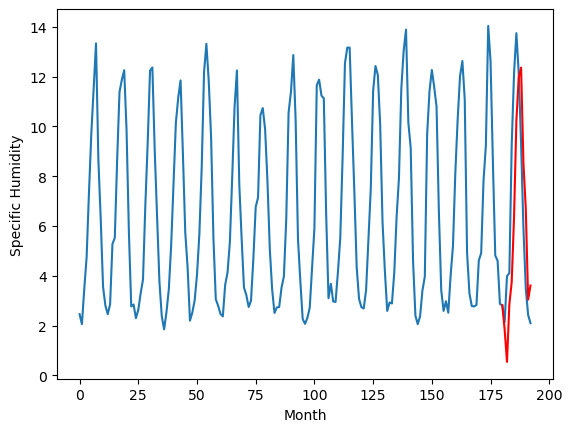

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.99		-0.54
7.66		3.69		-3.97
7.88		6.00		-1.88
8.85		6.89		-1.96
10.16		9.51		-0.65
13.94		13.38		-0.56
14.34		15.13		0.79
14.96		15.52		0.56
13.68		11.68		-2.00
11.02		9.84		-1.18
7.07		6.20		-0.87
8.47		6.76		-1.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 4.989813097715378, 3.6918451869487763, 6.0038058841228485, 6.894994505643845, 9.508630045652389, 13.384336718320846, 15.129124768972396, 15.515120157003402, 11.679556020498275, 9.839137085676192, 6.196795471906661, 6.761252053976058]


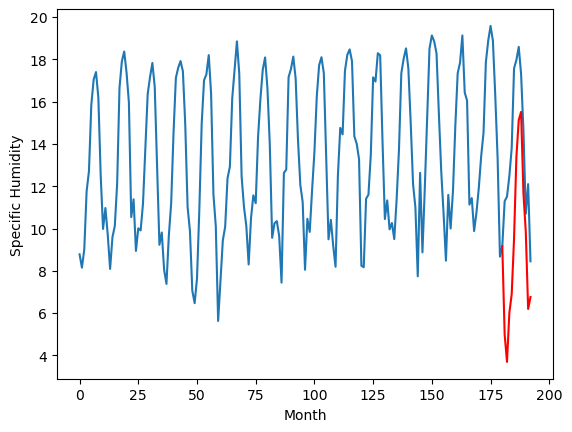

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		5.01		1.03
4.15		3.71		-0.44
4.79		6.02		1.23
6.14		6.91		0.77
7.82		9.53		1.71
12.42		13.40		0.98
15.02		15.15		0.13
15.76		15.54		-0.22
13.10		11.70		-1.40
10.14		9.86		-0.28
5.69		6.22		0.53
5.33		6.78		1.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 5.009813097715377, 3.711845186948776, 6.023805884122848, 6.914994505643844, 9.528630045652388, 13.404336718320845, 15.149124768972396, 15.535120157003401, 11.699556020498274, 9.859137085676192, 6.216795471906661, 6.781252053976058]


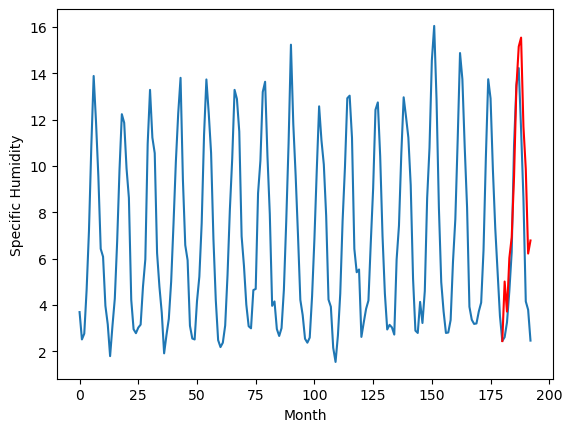

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.92		-0.18
5.08		3.62		-1.46
8.37		5.93		-2.44
8.39		6.82		-1.57
11.59		9.44		-2.15
15.48		13.31		-2.17
16.51		15.06		-1.45
16.11		15.45		-0.66
13.97		11.61		-2.36
11.44		9.77		-1.67
5.78		6.13		0.35
9.06		6.69		-2.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 4.919813097715378, 3.621845186948776, 5.933805884122848, 6.824994505643844, 9.438630045652388, 13.314336718320845, 15.059124768972396, 15.445120157003402, 11.609556020498275, 9.769137085676192, 6.126795471906661, 6.691252053976058]


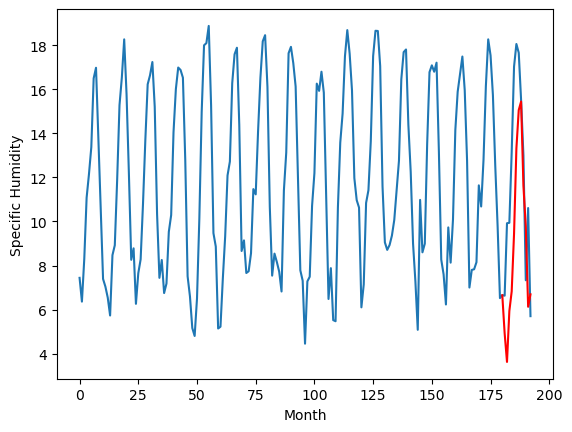

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.41		0.08
2.28		1.11		-1.17
5.27		3.42		-1.85
6.84		4.31		-2.53
11.67		6.93		-4.74
14.31		10.80		-3.51
13.27		12.55		-0.72
13.40		12.94		-0.46
9.84		9.10		-0.74
8.25		7.26		-0.99
4.06		3.62		-0.44
6.93		4.18		-2.75
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 2.4098130977153778, 1.1118451869487762, 3.4238058841228485, 4.314994505643845, 6.9286300456523895, 10.804336718320847, 12.549124768972398, 12.935120157003404, 9.099556020498277, 7.259137085676194, 3.616795471906663, 4.18125205397606]


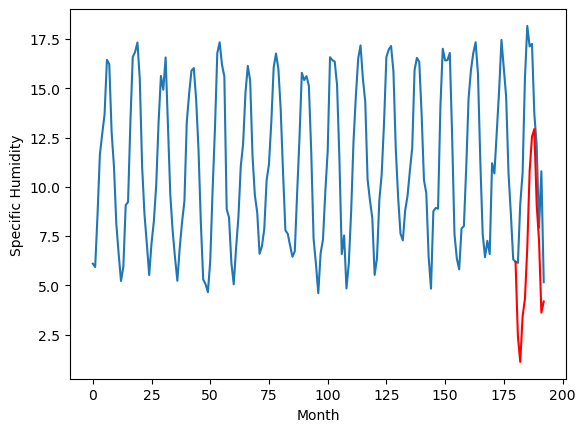

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.73		0.05
8.35		7.43		-0.92
11.21		9.74		-1.47
12.53		10.63		-1.90
16.73		13.25		-3.48
20.48		17.12		-3.36
21.30		18.87		-2.43
21.68		19.26		-2.42
17.23		15.42		-1.81
14.62		13.58		-1.04
10.63		9.94		-0.69
13.13		10.50		-2.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 8.729813097715377, 7.431845186948776, 9.743805884122848, 10.634994505643844, 13.248630045652389, 17.124336718320848, 18.869124768972398, 19.255120157003404, 15.419556020498277, 13.579137085676194, 9.936795471906663, 10.50125205397606]


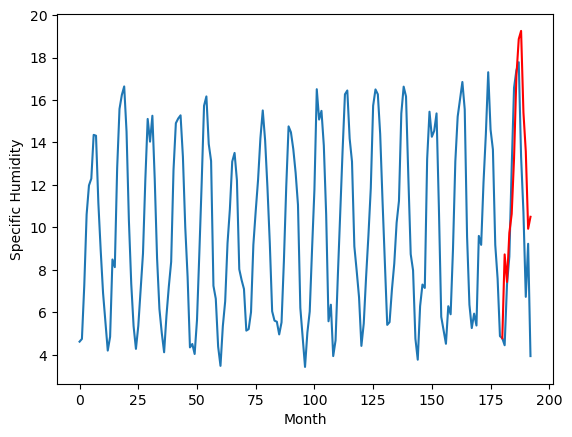

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.64		-0.33
3.84		2.34		-1.50
3.93		4.65		0.72
4.23		5.54		1.31
4.35		8.16		3.81
7.01		12.03		5.02
12.25		13.78		1.53
12.54		14.17		1.63
9.78		10.33		0.55
6.07		8.49		2.42
4.42		4.85		0.43
4.55		5.41		0.86
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.6398130977153778, 2.341845186948776, 4.653805884122848, 5.544994505643844, 8.158630045652389, 12.034336718320846, 13.779124768972396, 14.165120157003402, 10.329556020498275, 8.489137085676193, 4.8467954719066615, 5.4112520539760585]


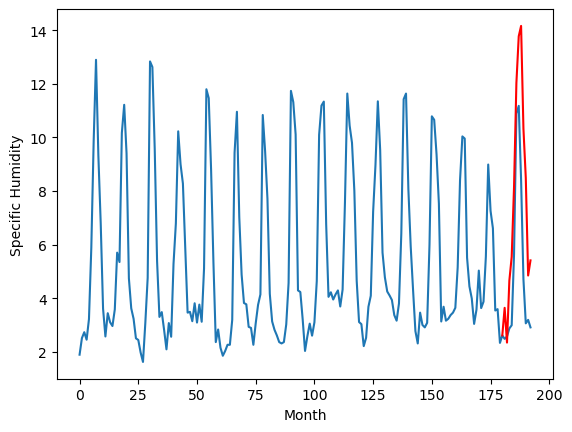

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.39		-0.90
8.82		6.09		-2.73
8.93		8.40		-0.53
10.25		9.29		-0.96
11.73		11.91		0.18
12.98		15.78		2.80
14.13		17.53		3.40
13.53		17.92		4.39
13.07		14.08		1.01
10.27		12.24		1.97
9.73		8.60		-1.13
9.55		9.16		-0.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 7.389813097715378, 6.091845186948777, 8.40380588412285, 9.294994505643846, 11.90863004565239, 15.784336718320848, 17.529124768972398, 17.915120157003404, 14.079556020498277, 12.239137085676195, 8.596795471906663, 9.16125205397606]


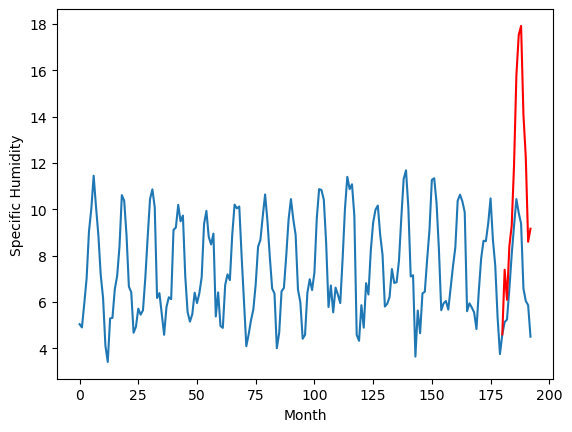

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		6.05		0.07
6.05		4.75		-1.30
7.78		7.06		-0.72
8.31		7.95		-0.36
11.02		10.57		-0.45
15.52		14.44		-1.08
17.04		16.19		-0.85
17.62		16.58		-1.04
14.02		12.74		-1.28
11.86		10.90		-0.96
6.30		7.26		0.96
8.15		7.82		-0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 6.0498130977153775, 4.751845186948776, 7.063805884122848, 7.954994505643844, 10.56863004565239, 14.444336718320846, 16.1891247689724, 16.575120157003404, 12.739556020498277, 10.899137085676195, 7.256795471906663, 7.82125205397606]


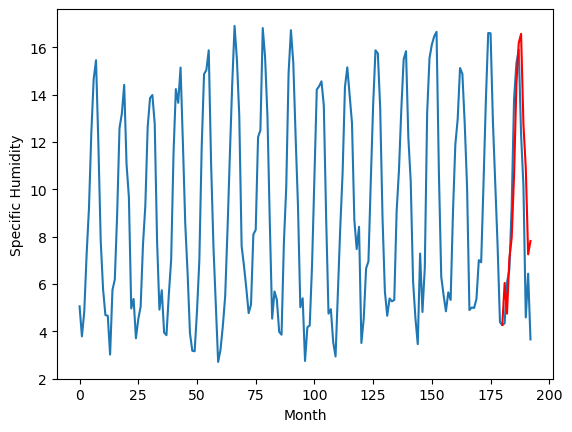

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.57		-0.06
4.87		3.27		-1.60
5.90		5.58		-0.32
6.51		6.47		-0.04
9.18		9.09		-0.09
13.28		12.96		-0.32
14.69		14.71		0.02
15.08		15.10		0.02
11.87		11.26		-0.61
10.14		9.42		-0.72
4.78		5.78		1.00
6.34		6.34		0.00
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.569813097715378, 3.2718451869487764, 5.583805884122849, 6.474994505643845, 9.08863004565239, 12.964336718320848, 14.709124768972398, 15.095120157003404, 11.259556020498277, 9.419137085676194, 5.776795471906663, 6.34125205397606]


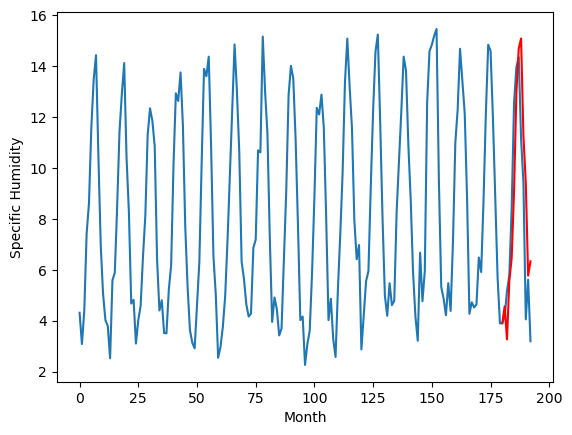

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.569813097715378, 1.8398130977153777, 4.989813097715378, 5.009813097715377, 4.919813097715378, 2.4098130977153778, 8.729813097715377, 3.6398130977153778, 7.389813097715378, 6.0498130977153775, 4.569813097715378]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.569813
1                 1    1.84   1.839813
2                 2    5.53   4.989813
3                 3    3.98   5.009813
4                 4    5.10   4.919813
5                 5    2.33   2.409813
6                 6    8.68   8.729813
7                 7    3.97   3.639813
8                 8    8.29   7.389813
9                 9    5.98   6.049813
10               10    4.63   4.569813


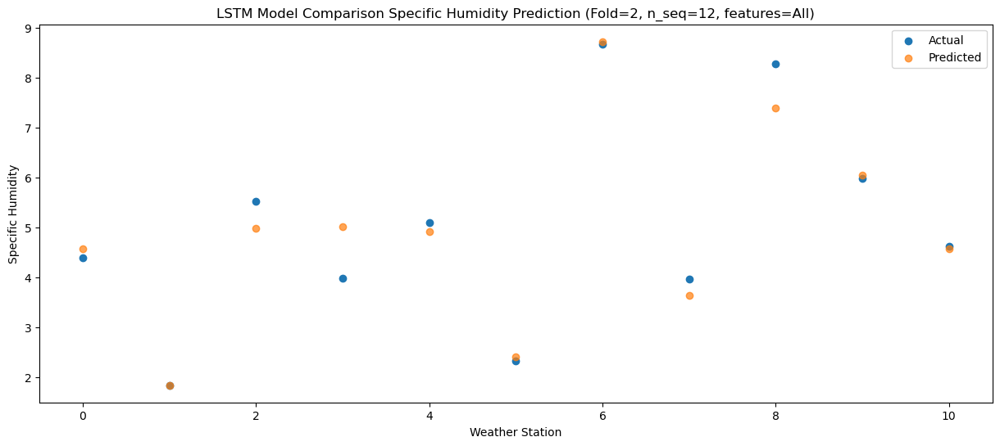

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.271845
1                 1    1.16   0.541845
2                 2    7.66   3.691845
3                 3    4.15   3.711845
4                 4    5.08   3.621845
5                 5    2.28   1.111845
6                 6    8.35   7.431845
7                 7    3.84   2.341845
8                 8    8.82   6.091845
9                 9    6.05   4.751845
10               10    4.87   3.271845


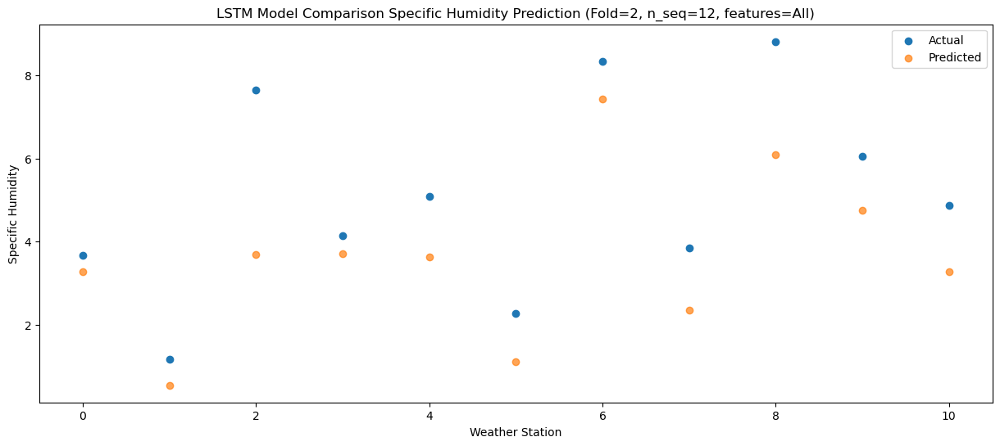

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   5.583806
1                 1    3.01   2.853806
2                 2    7.88   6.003806
3                 3    4.79   6.023806
4                 4    8.37   5.933806
5                 5    5.27   3.423806
6                 6   11.21   9.743806
7                 7    3.93   4.653806
8                 8    8.93   8.403806
9                 9    7.78   7.063806
10               10    5.90   5.583806


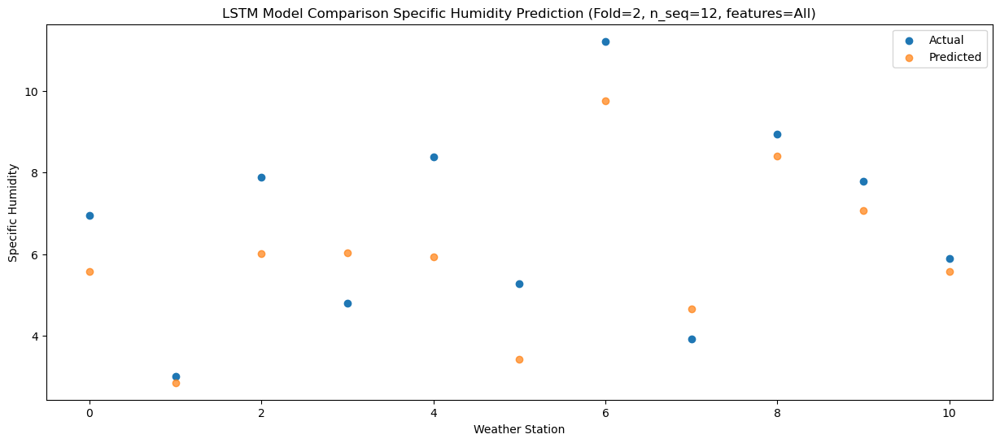

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.474995
1                 1    3.13   3.744995
2                 2    8.85   6.894995
3                 3    6.14   6.914995
4                 4    8.39   6.824995
5                 5    6.84   4.314995
6                 6   12.53  10.634995
7                 7    4.23   5.544995
8                 8   10.25   9.294995
9                 9    8.31   7.954995
10               10    6.51   6.474995


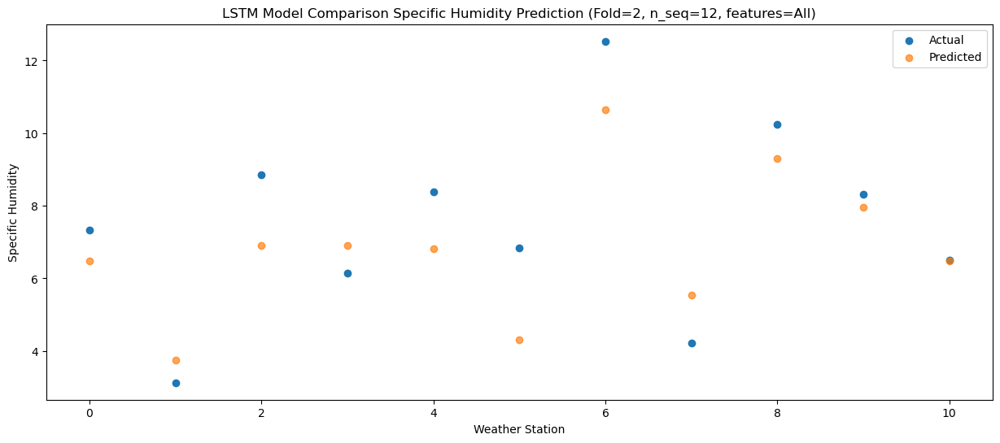

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01    9.08863
1                 1    8.25    6.35863
2                 2   10.16    9.50863
3                 3    7.82    9.52863
4                 4   11.59    9.43863
5                 5   11.67    6.92863
6                 6   16.73   13.24863
7                 7    4.35    8.15863
8                 8   11.73   11.90863
9                 9   11.02   10.56863
10               10    9.18    9.08863


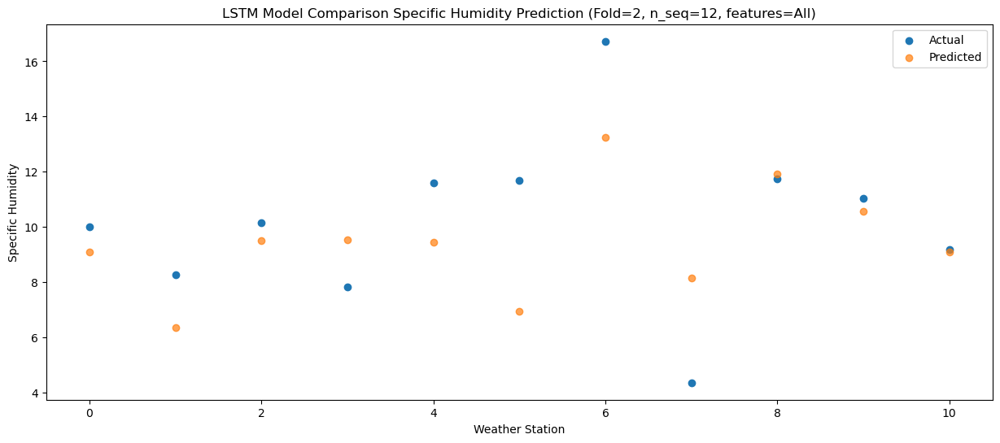

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  12.964337
1                 1   11.16  10.234337
2                 2   13.94  13.384337
3                 3   12.42  13.404337
4                 4   15.48  13.314337
5                 5   14.31  10.804337
6                 6   20.48  17.124337
7                 7    7.01  12.034337
8                 8   12.98  15.784337
9                 9   15.52  14.444337
10               10   13.28  12.964337


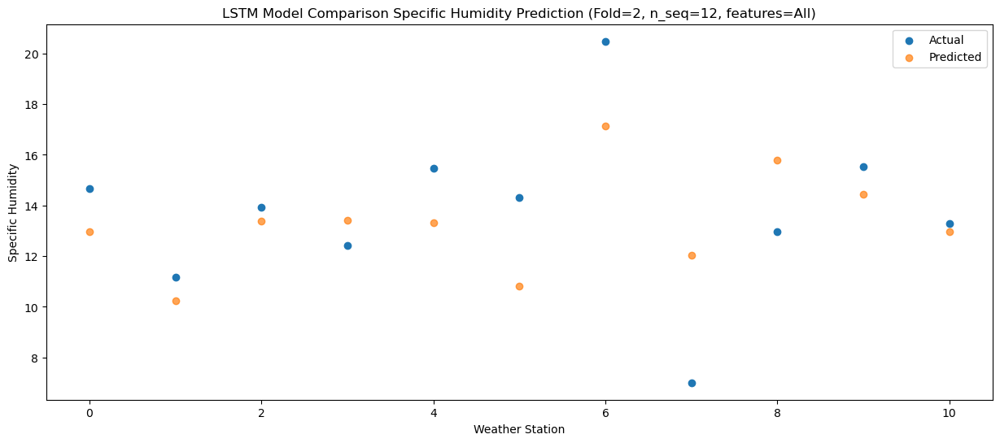

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  14.709125
1                 1   12.77  11.979125
2                 2   14.34  15.129125
3                 3   15.02  15.149125
4                 4   16.51  15.059125
5                 5   13.27  12.549125
6                 6   21.30  18.869125
7                 7   12.25  13.779125
8                 8   14.13  17.529125
9                 9   17.04  16.189125
10               10   14.69  14.709125


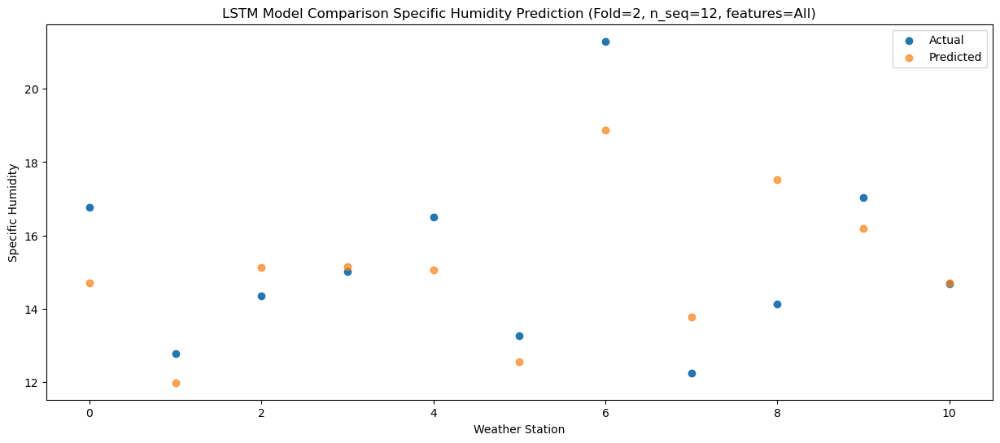

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46   15.09512
1                 1   11.15   12.36512
2                 2   14.96   15.51512
3                 3   15.76   15.53512
4                 4   16.11   15.44512
5                 5   13.40   12.93512
6                 6   21.68   19.25512
7                 7   12.54   14.16512
8                 8   13.53   17.91512
9                 9   17.62   16.57512
10               10   15.08   15.09512


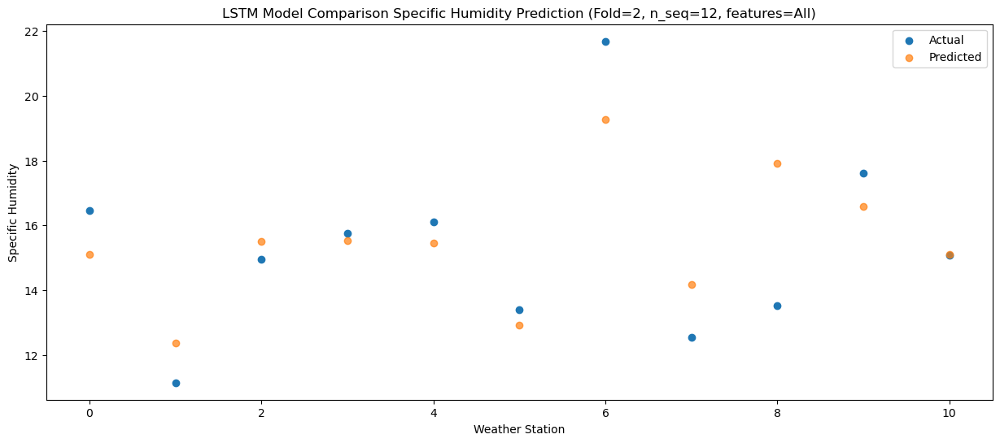

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69  11.259556
1                 1    8.33   8.529556
2                 2   13.68  11.679556
3                 3   13.10  11.699556
4                 4   13.97  11.609556
5                 5    9.84   9.099556
6                 6   17.23  15.419556
7                 7    9.78  10.329556
8                 8   13.07  14.079556
9                 9   14.02  12.739556
10               10   11.87  11.259556


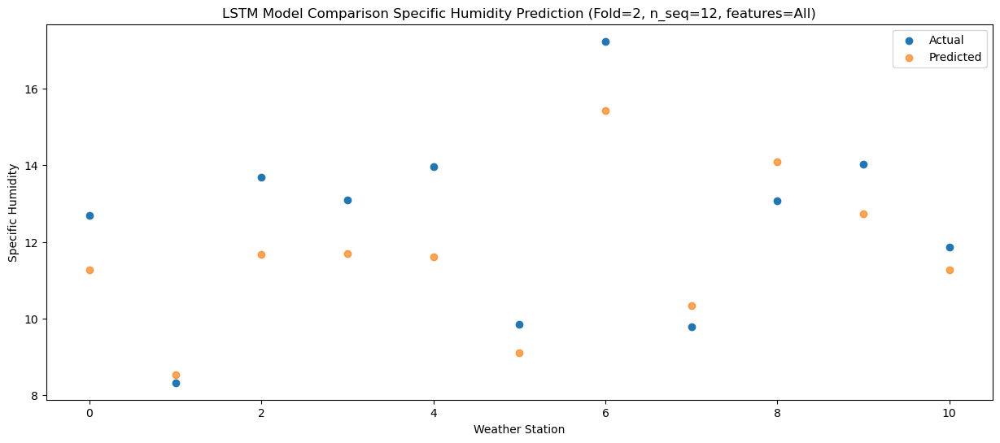

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24   9.419137
1                 1    4.94   6.689137
2                 2   11.02   9.839137
3                 3   10.14   9.859137
4                 4   11.44   9.769137
5                 5    8.25   7.259137
6                 6   14.62  13.579137
7                 7    6.07   8.489137
8                 8   10.27  12.239137
9                 9   11.86  10.899137
10               10   10.14   9.419137


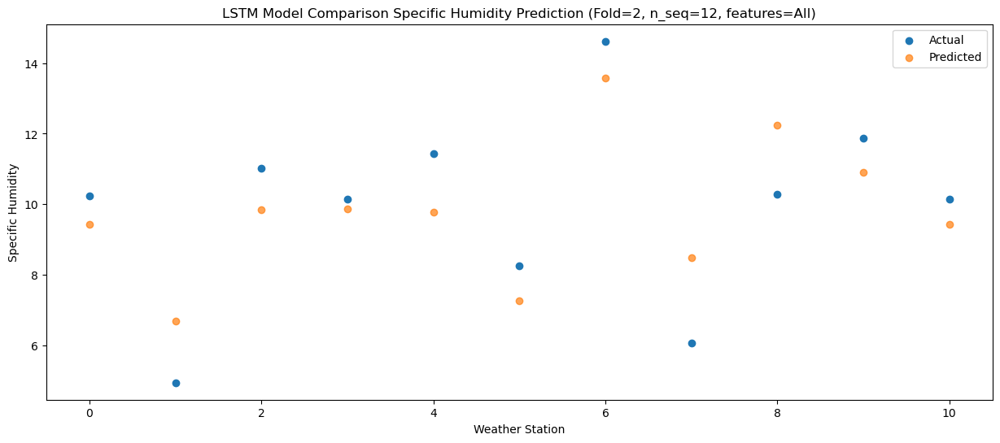

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   5.776795
1                 1    2.51   3.046795
2                 2    7.07   6.196795
3                 3    5.69   6.216795
4                 4    5.78   6.126795
5                 5    4.06   3.616795
6                 6   10.63   9.936795
7                 7    4.42   4.846795
8                 8    9.73   8.596795
9                 9    6.30   7.256795
10               10    4.78   5.776795


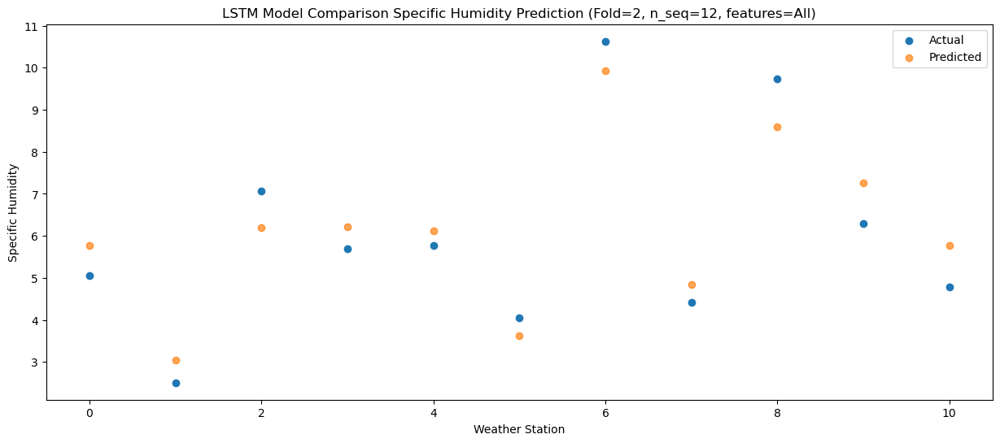

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   6.341252
1                 1    1.45   3.611252
2                 2    8.47   6.761252
3                 3    5.33   6.781252
4                 4    9.06   6.691252
5                 5    6.93   4.181252
6                 6   13.13  10.501252
7                 7    4.55   5.411252
8                 8    9.55   9.161252
9                 9    8.15   7.821252
10               10    6.34   6.341252


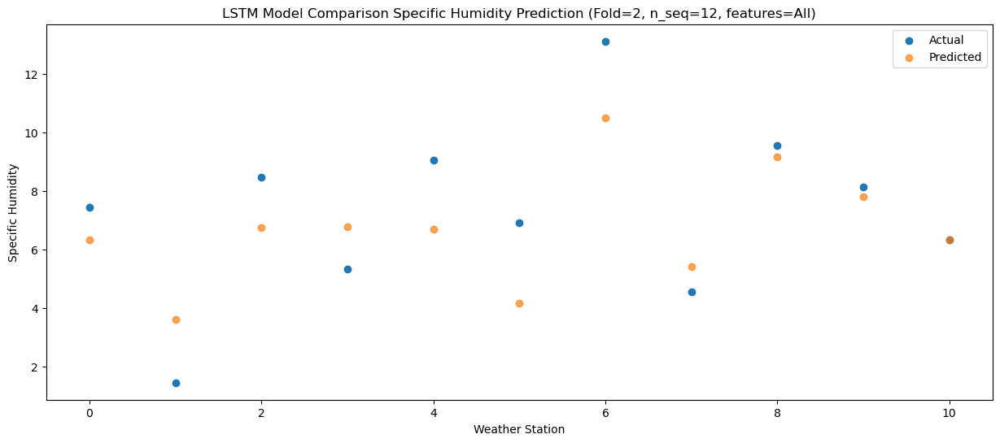

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1004 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1005 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1005 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 12)                

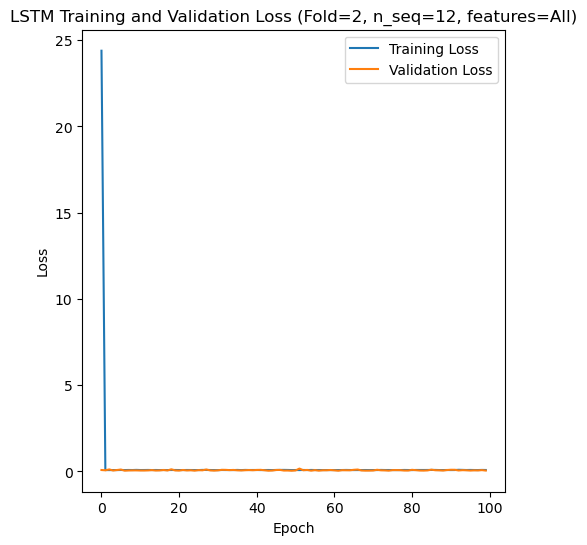

Epoch 1/100
84/84 [==============================] - 42s 312ms/step - loss: 26.1058 - val_loss: 0.0868
Epoch 2/100
84/84 [==============================] - 17s 204ms/step - loss: 0.0789 - val_loss: 0.0792
Epoch 3/100
84/84 [==============================] - 20s 244ms/step - loss: 0.0803 - val_loss: 0.0761
Epoch 4/100
84/84 [==============================] - 21s 245ms/step - loss: 0.0755 - val_loss: 0.0746
Epoch 5/100
84/84 [==============================] - 18s 219ms/step - loss: 0.0701 - val_loss: 0.0741
Epoch 6/100
84/84 [==============================] - 16s 193ms/step - loss: 0.0779 - val_loss: 0.0806
Epoch 7/100
84/84 [==============================] - 19s 227ms/step - loss: 0.0755 - val_loss: 0.0763
Epoch 8/100
84/84 [==============================] - 23s 277ms/step - loss: 0.0790 - val_loss: 0.1031
Epoch 9/100
84/84 [==============================] - 21s 247ms/step - loss: 0.0799 - val_loss: 0.0911
Epoch 10/100
84/84 [==============================] - 23s 276ms/step - loss: 0.08

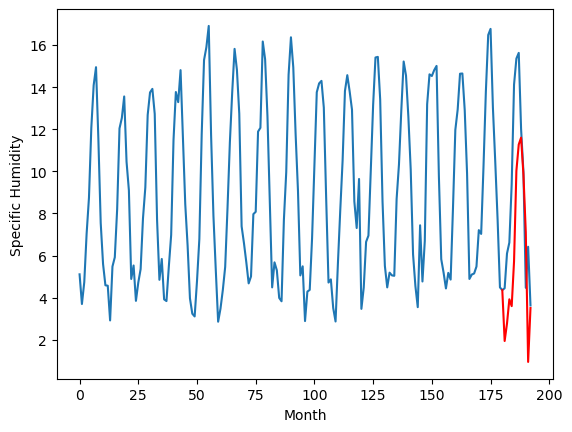

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.98		0.34
2.08		3.81		1.73
4.59		4.97		0.38
5.76		4.64		-1.12
9.28		6.77		-2.51
13.81		11.07		-2.74
14.69		12.32		-2.37
14.86		12.64		-2.22
10.89		10.89		-0.00
8.70		8.16		-0.54
4.27		1.99		-2.28
5.24		4.55		-0.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.9835307109355926, 3.813063632249832, 4.965172897577286, 4.6391141223907475, 6.766869525909424, 11.068258743286133, 12.316133122444153, 12.64366270184517, 10.887730728387833, 8.155345569849015, 1.9894162523746495, 4.548623691797257]


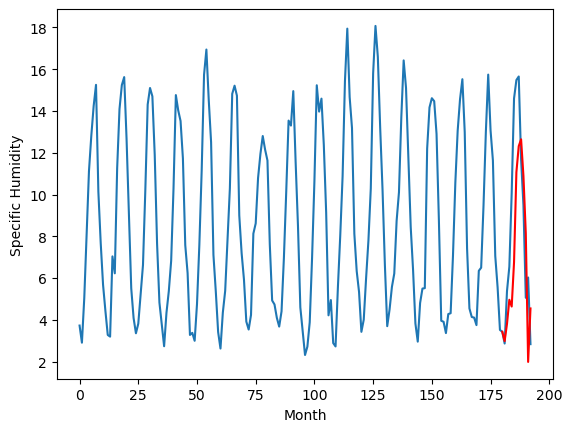

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		6.18		-0.19
6.31		7.01		0.70
6.39		8.17		1.78
7.01		7.84		0.83
7.41		9.97		2.56
9.86		14.27		4.41
10.56		15.52		4.96
10.09		15.84		5.75
8.80		14.09		5.29
7.66		11.36		3.70
8.24		5.19		-3.05
6.74		7.75		1.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 6.183530710935592, 7.013063632249832, 8.165172897577285, 7.839114122390747, 9.966869525909424, 14.268258743286133, 15.516133122444153, 15.843662701845169, 14.087730728387832, 11.355345569849014, 5.189416252374649, 7.748623691797256]


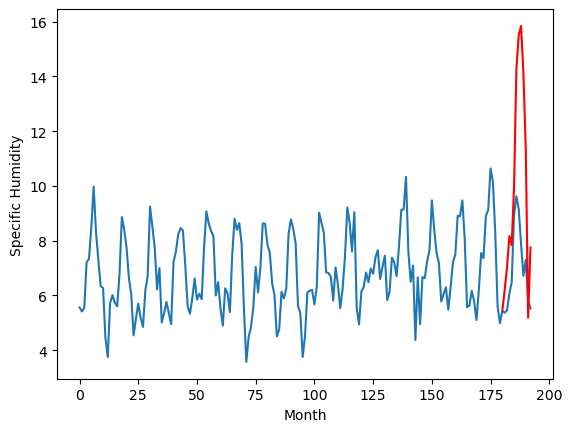

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.96		0.52
3.37		4.79		1.42
4.67		5.95		1.28
5.86		5.62		-0.24
8.39		7.75		-0.64
13.81		12.05		-1.76
14.44		13.30		-1.14
15.32		13.62		-1.70
11.85		11.87		0.02
9.79		9.14		-0.65
4.10		2.97		-1.13
5.24		5.53		0.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.9635307109355926, 4.793063632249832, 5.945172897577286, 5.619114122390747, 7.746869525909424, 12.048258743286134, 13.296133122444154, 13.62366270184517, 11.867730728387833, 9.135345569849015, 2.96941625237465, 5.528623691797257]


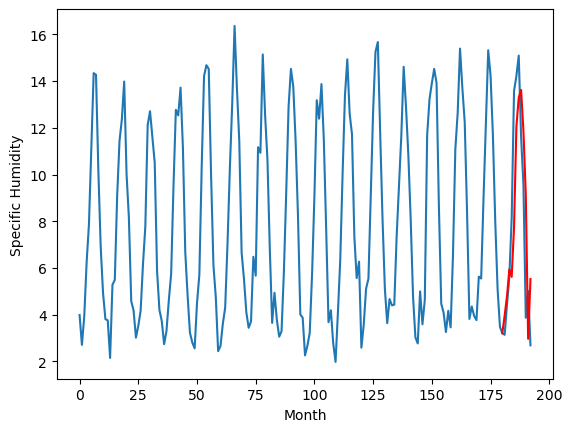

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		5.36		0.45
4.08		6.19		2.11
6.56		7.35		0.79
7.62		7.02		-0.60
10.04		9.15		-0.89
14.50		13.45		-1.05
16.45		14.70		-1.75
16.54		15.02		-1.52
12.77		13.27		0.50
10.82		10.54		-0.28
5.70		4.37		-1.33
6.40		6.93		0.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 5.363530710935593, 6.1930636322498325, 7.345172897577286, 7.019114122390747, 9.146869525909423, 13.448258743286132, 14.696133122444152, 15.023662701845168, 13.267730728387832, 10.535345569849014, 4.3694162523746485, 6.928623691797256]


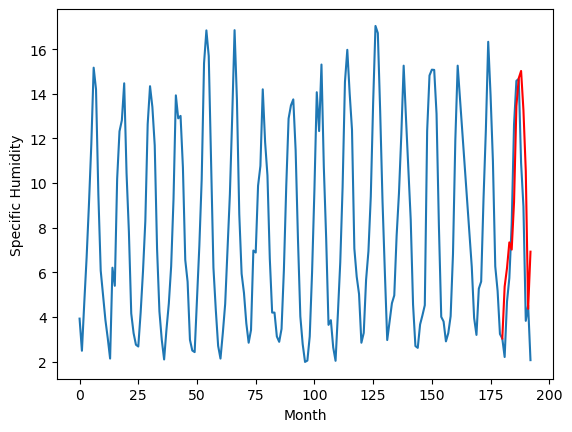

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.98		0.56
2.90		4.81		1.91
4.93		5.97		1.04
6.23		5.64		-0.59
8.47		7.77		-0.70
13.69		12.07		-1.62
14.94		13.32		-1.62
15.11		13.64		-1.47
11.81		11.89		0.08
10.19		9.16		-1.03
4.32		2.99		-1.33
5.37		5.55		0.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.9835307109355926, 4.813063632249833, 5.965172897577286, 5.6391141223907475, 7.766869525909424, 12.068258743286133, 13.316133122444153, 13.64366270184517, 11.887730728387833, 9.155345569849015, 2.9894162523746495, 5.548623691797257]


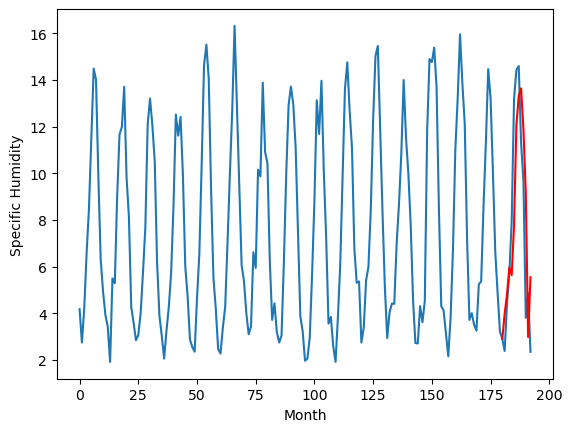

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.81		0.08
5.79		6.64		0.85
6.10		7.80		1.70
6.57		7.47		0.90
7.97		9.60		1.63
9.30		13.90		4.60
11.75		15.15		3.40
10.32		15.47		5.15
8.62		13.72		5.10
7.53		10.99		3.46
6.82		4.82		-2.00
6.11		7.38		1.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.813530710935592, 6.643063632249832, 7.795172897577285, 7.469114122390747, 9.596869525909423, 13.898258743286132, 15.146133122444152, 15.473662701845168, 13.717730728387831, 10.985345569849013, 4.819416252374648, 7.378623691797255]


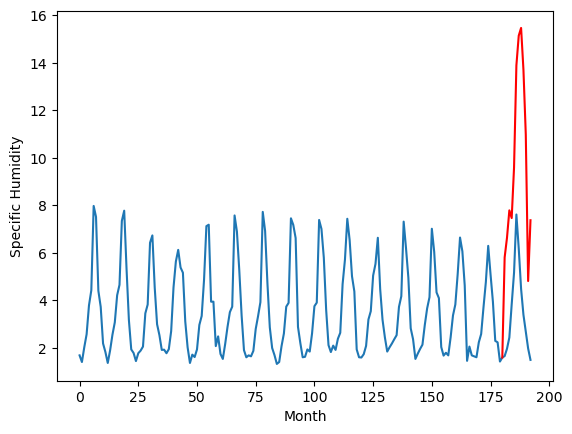

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		4.24		-0.56
4.32		5.07		0.75
4.62		6.23		1.61
4.31		5.90		1.59
4.87		8.03		3.16
6.29		12.33		6.04
11.65		13.58		1.93
9.22		13.90		4.68
7.50		12.15		4.65
6.40		9.42		3.02
5.13		3.25		-1.88
5.27		5.81		0.54
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 4.243530710935593, 5.073063632249832, 6.225172897577286, 5.899114122390747, 8.026869525909424, 12.328258743286133, 13.576133122444153, 13.90366270184517, 12.147730728387833, 9.415345569849014, 3.2494162523746493, 5.808623691797257]


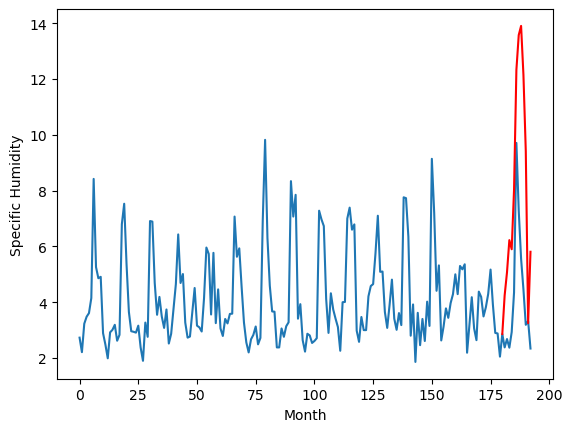

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		4.18		-0.42
4.25		5.01		0.76
3.90		6.17		2.27
4.83		5.84		1.01
5.27		7.97		2.70
6.70		12.27		5.57
7.18		13.52		6.34
7.57		13.84		6.27
6.93		12.09		5.16
5.90		9.36		3.46
6.12		3.19		-2.93
4.87		5.75		0.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 4.183530710935592, 5.013063632249832, 6.1651728975772855, 5.839114122390747, 7.9668695259094235, 12.268258743286133, 13.516133122444153, 13.843662701845169, 12.087730728387832, 9.355345569849014, 3.1894162523746488, 5.748623691797256]


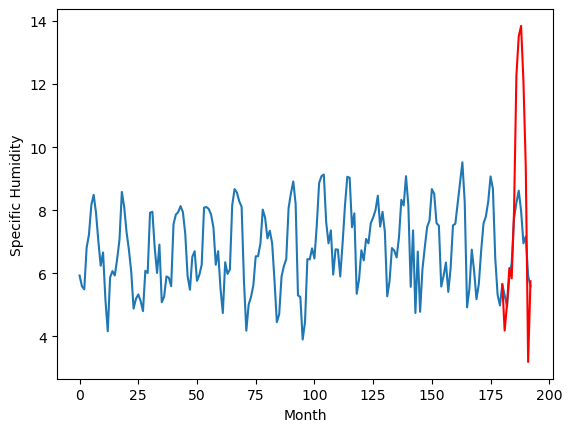

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		4.43		1.34
3.24		5.26		2.02
4.02		6.42		2.40
5.40		6.09		0.69
6.97		8.22		1.25
11.87		12.52		0.65
14.08		13.77		-0.31
14.46		14.09		-0.37
11.86		12.34		0.48
9.32		9.61		0.29
4.79		3.44		-1.35
4.49		6.00		1.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 4.433530710935592, 5.263063632249832, 6.4151728975772855, 6.089114122390747, 8.216869525909424, 12.518258743286133, 13.766133122444153, 14.093662701845169, 12.337730728387832, 9.605345569849014, 3.4394162523746488, 5.998623691797256]


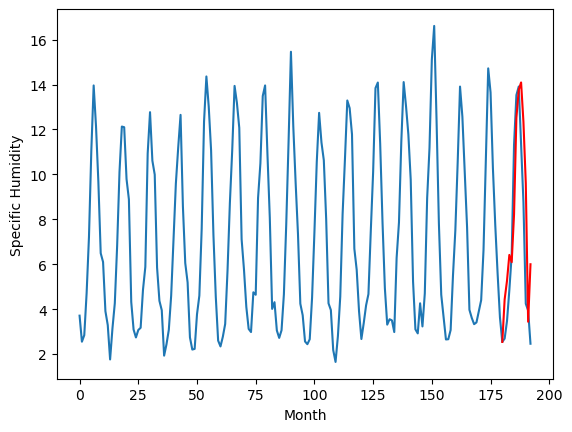

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.94		0.94
0.86		2.77		1.91
2.14		3.93		1.79
3.55		3.60		0.05
5.14		5.73		0.59
10.01		10.03		0.02
11.70		11.28		-0.42
12.02		11.60		-0.42
9.10		9.85		0.75
7.20		7.12		-0.08
2.28		0.95		-1.33
2.18		3.51		1.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.9435307109355926, 2.773063632249832, 3.9251728975772857, 3.599114122390747, 5.726869525909423, 10.028258743286132, 11.276133122444152, 11.603662701845169, 9.847730728387832, 7.115345569849014, 0.9494162523746486, 3.508623691797256]


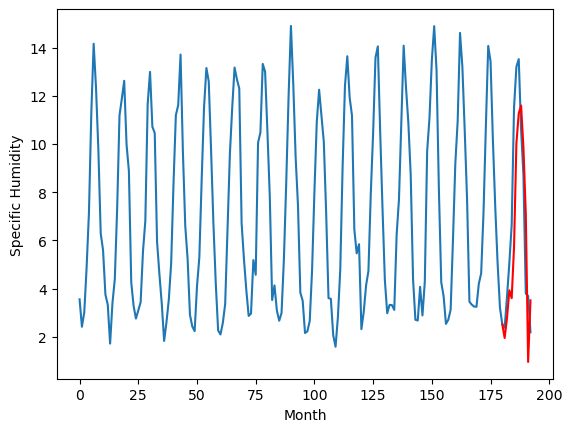

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.9435307109355926, 2.9835307109355926, 6.183530710935592, 3.9635307109355926, 5.363530710935593, 3.9835307109355926, 5.813530710935592, 4.243530710935593, 4.183530710935592, 4.433530710935592, 1.9435307109355926]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.943531
1                 1    2.64   2.983531
2                 2    6.37   6.183531
3                 3    3.44   3.963531
4                 4    4.91   5.363531
5                 5    3.42   3.983531
6                 6    5.73   5.813531
7                 7    4.80   4.243531
8                 8    4.60   4.183531
9                 9    3.09   4.433531
10               10    1.00   1.943531


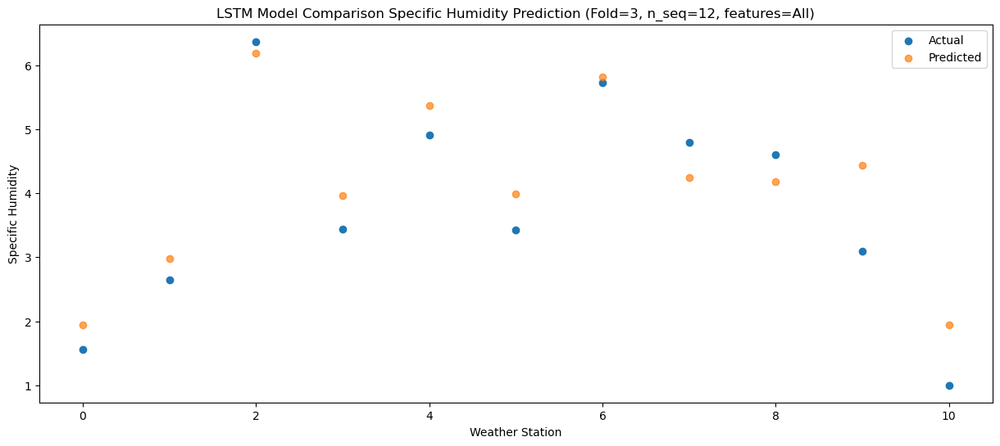

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   2.773064
1                 1    2.08   3.813064
2                 2    6.31   7.013064
3                 3    3.37   4.793064
4                 4    4.08   6.193064
5                 5    2.90   4.813064
6                 6    5.79   6.643064
7                 7    4.32   5.073064
8                 8    4.25   5.013064
9                 9    3.24   5.263064
10               10    0.86   2.773064


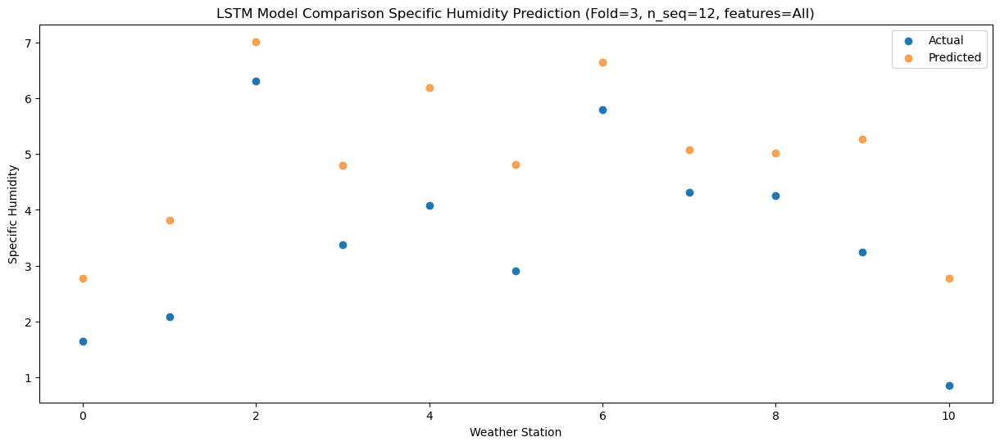

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.925173
1                 1    4.59   4.965173
2                 2    6.39   8.165173
3                 3    4.67   5.945173
4                 4    6.56   7.345173
5                 5    4.93   5.965173
6                 6    6.10   7.795173
7                 7    4.62   6.225173
8                 8    3.90   6.165173
9                 9    4.02   6.415173
10               10    2.14   3.925173


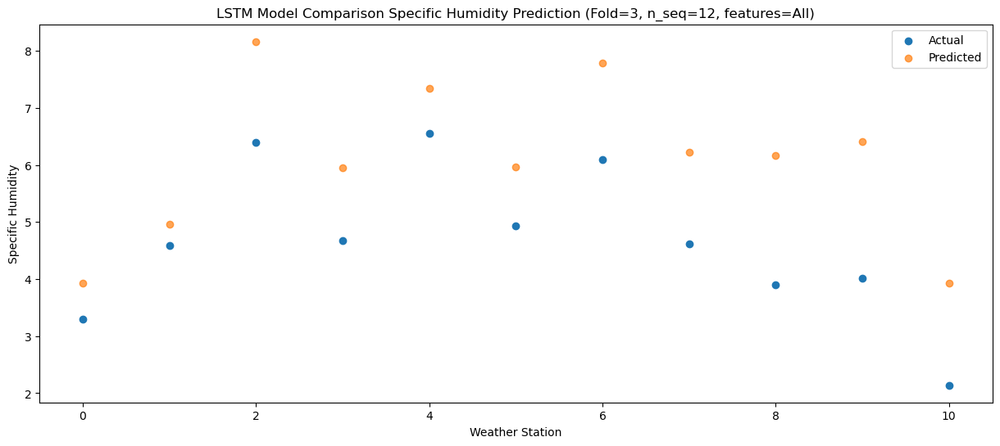

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   3.599114
1                 1    5.76   4.639114
2                 2    7.01   7.839114
3                 3    5.86   5.619114
4                 4    7.62   7.019114
5                 5    6.23   5.639114
6                 6    6.57   7.469114
7                 7    4.31   5.899114
8                 8    4.83   5.839114
9                 9    5.40   6.089114
10               10    3.55   3.599114


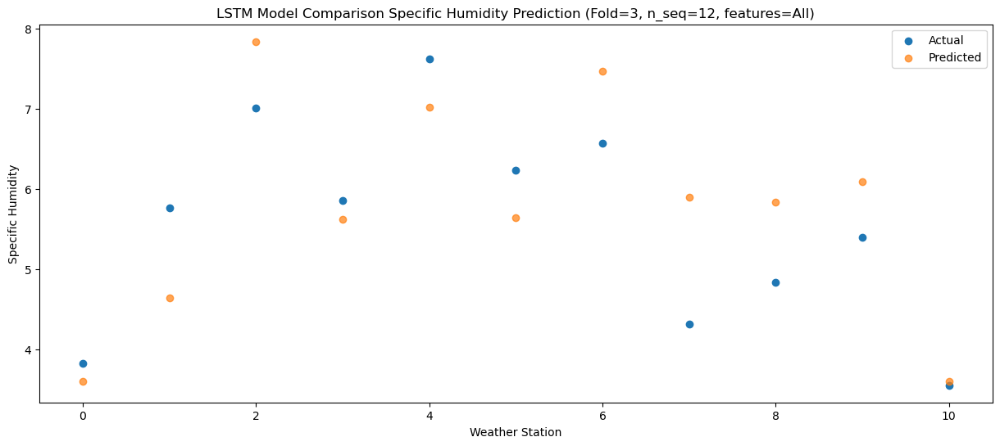

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60    5.72687
1                 1    9.28    6.76687
2                 2    7.41    9.96687
3                 3    8.39    7.74687
4                 4   10.04    9.14687
5                 5    8.47    7.76687
6                 6    7.97    9.59687
7                 7    4.87    8.02687
8                 8    5.27    7.96687
9                 9    6.97    8.21687
10               10    5.14    5.72687


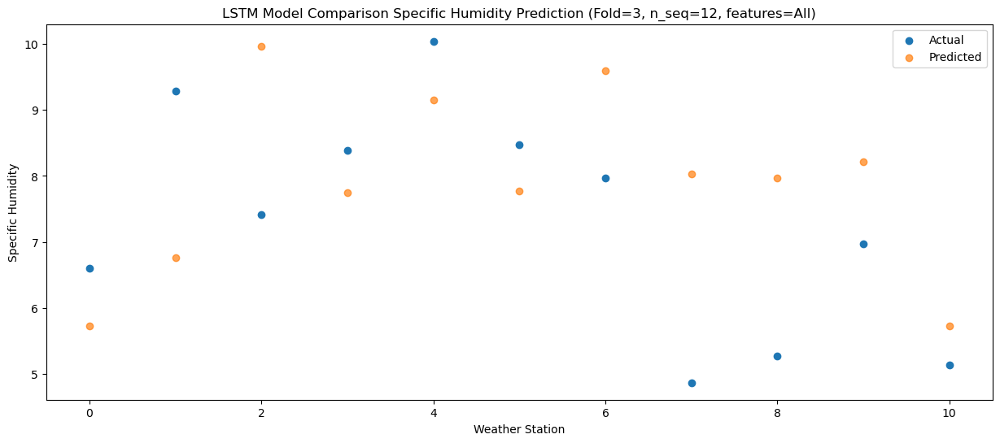

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  10.028259
1                 1   13.81  11.068259
2                 2    9.86  14.268259
3                 3   13.81  12.048259
4                 4   14.50  13.448259
5                 5   13.69  12.068259
6                 6    9.30  13.898259
7                 7    6.29  12.328259
8                 8    6.70  12.268259
9                 9   11.87  12.518259
10               10   10.01  10.028259


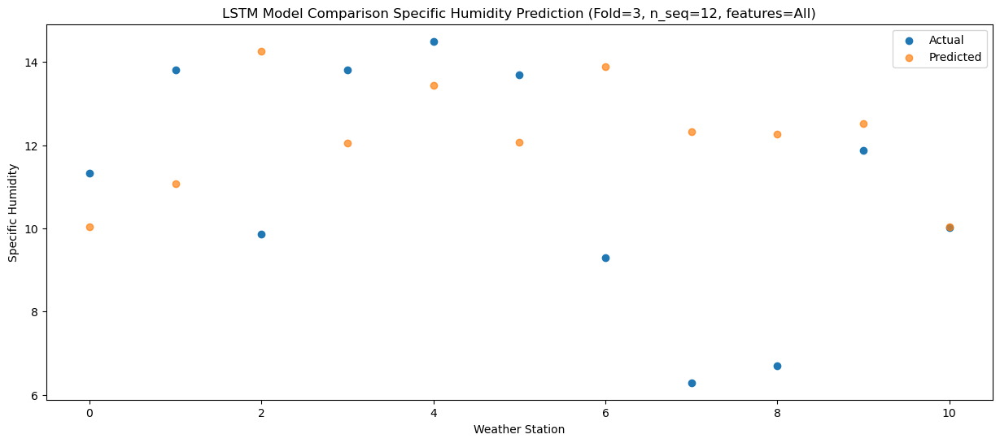

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  11.276133
1                 1   14.69  12.316133
2                 2   10.56  15.516133
3                 3   14.44  13.296133
4                 4   16.45  14.696133
5                 5   14.94  13.316133
6                 6   11.75  15.146133
7                 7   11.65  13.576133
8                 8    7.18  13.516133
9                 9   14.08  13.766133
10               10   11.70  11.276133


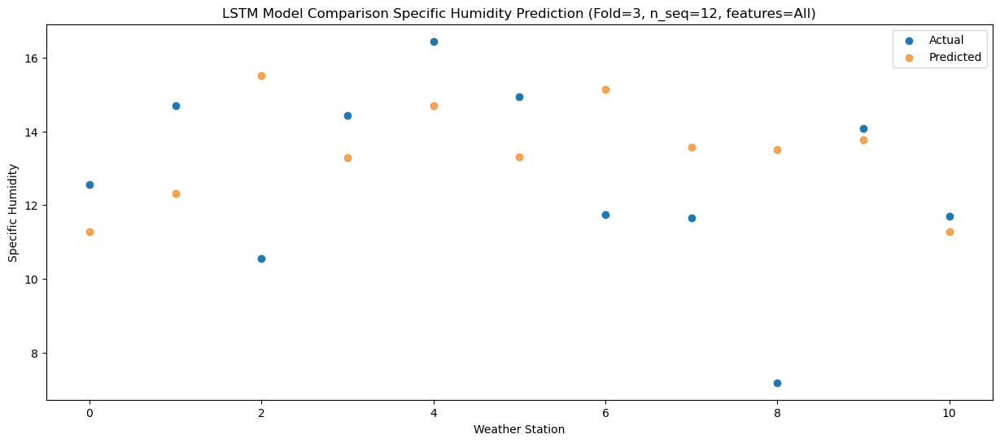

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  11.603663
1                 1   14.86  12.643663
2                 2   10.09  15.843663
3                 3   15.32  13.623663
4                 4   16.54  15.023663
5                 5   15.11  13.643663
6                 6   10.32  15.473663
7                 7    9.22  13.903663
8                 8    7.57  13.843663
9                 9   14.46  14.093663
10               10   12.02  11.603663


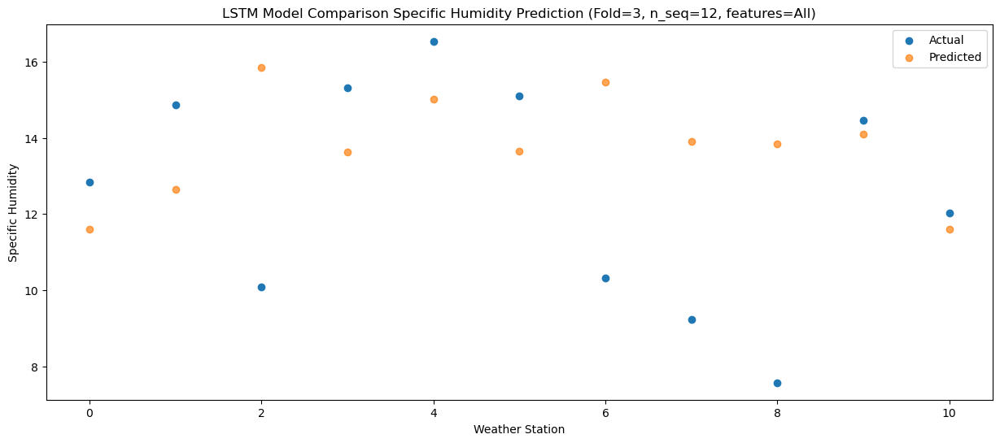

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21   9.847731
1                 1   10.89  10.887731
2                 2    8.80  14.087731
3                 3   11.85  11.867731
4                 4   12.77  13.267731
5                 5   11.81  11.887731
6                 6    8.62  13.717731
7                 7    7.50  12.147731
8                 8    6.93  12.087731
9                 9   11.86  12.337731
10               10    9.10   9.847731


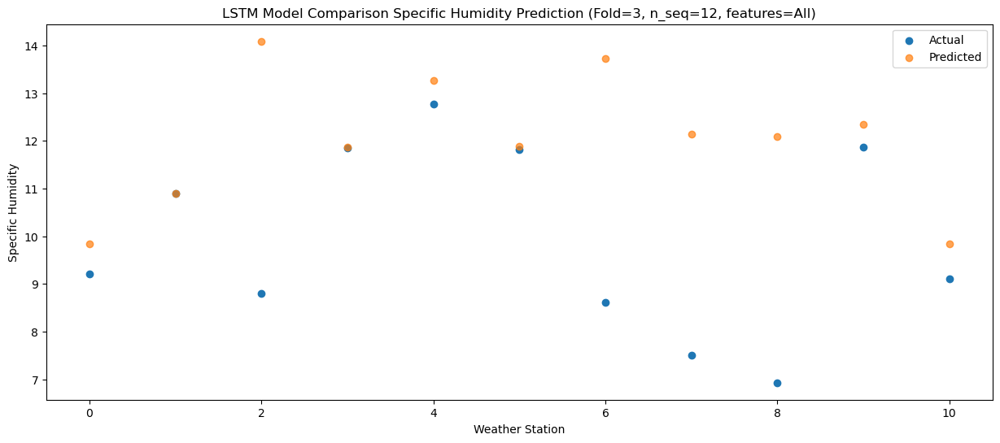

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   7.115346
1                 1    8.70   8.155346
2                 2    7.66  11.355346
3                 3    9.79   9.135346
4                 4   10.82  10.535346
5                 5   10.19   9.155346
6                 6    7.53  10.985346
7                 7    6.40   9.415346
8                 8    5.90   9.355346
9                 9    9.32   9.605346
10               10    7.20   7.115346


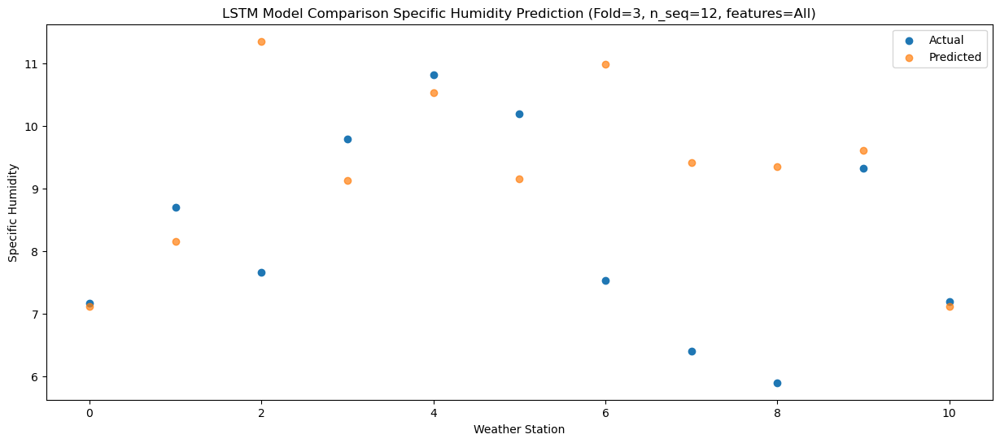

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   0.949416
1                 1    4.27   1.989416
2                 2    8.24   5.189416
3                 3    4.10   2.969416
4                 4    5.70   4.369416
5                 5    4.32   2.989416
6                 6    6.82   4.819416
7                 7    5.13   3.249416
8                 8    6.12   3.189416
9                 9    4.79   3.439416
10               10    2.28   0.949416


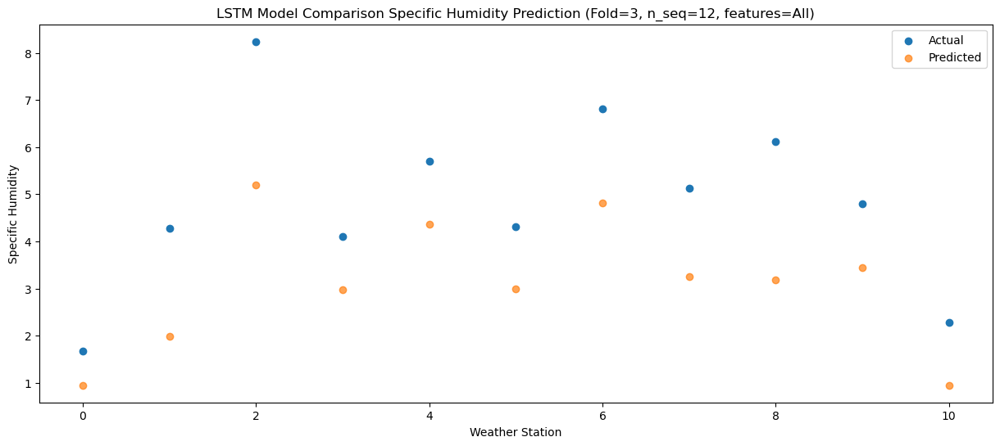

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   3.508624
1                 1    5.24   4.548624
2                 2    6.74   7.748624
3                 3    5.24   5.528624
4                 4    6.40   6.928624
5                 5    5.37   5.548624
6                 6    6.11   7.378624
7                 7    5.27   5.808624
8                 8    4.87   5.748624
9                 9    4.49   5.998624
10               10    2.18   3.508624


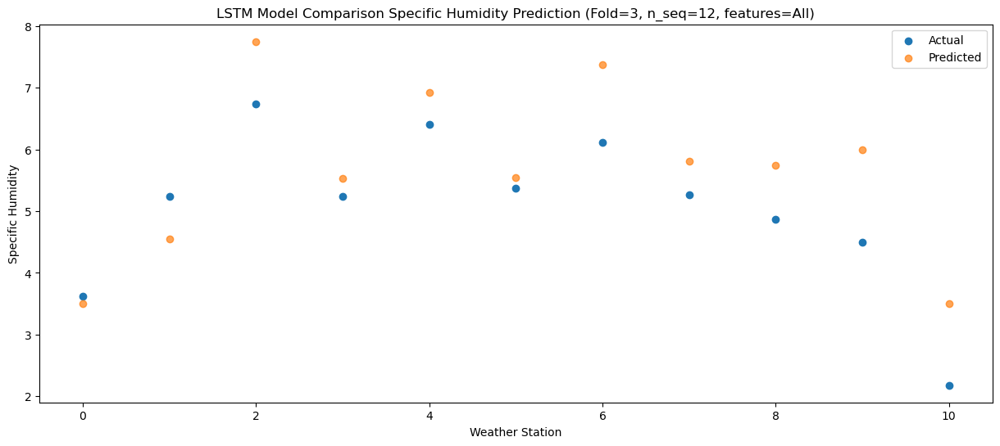

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1006 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1007 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1007 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 12)                

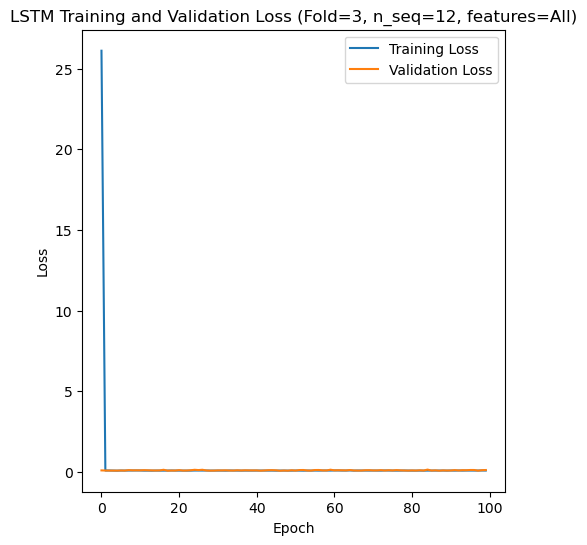

Epoch 1/100
84/84 [==============================] - 40s 332ms/step - loss: 26.0402 - val_loss: 0.0650
Epoch 2/100
84/84 [==============================] - 23s 279ms/step - loss: 1.0777 - val_loss: 0.0729
Epoch 3/100
84/84 [==============================] - 27s 325ms/step - loss: 0.0779 - val_loss: 0.0688
Epoch 4/100
84/84 [==============================] - 25s 299ms/step - loss: 0.0828 - val_loss: 0.0698
Epoch 5/100
84/84 [==============================] - 22s 265ms/step - loss: 0.0793 - val_loss: 0.0630
Epoch 6/100
84/84 [==============================] - 26s 307ms/step - loss: 0.0761 - val_loss: 0.0705
Epoch 7/100
84/84 [==============================] - 21s 256ms/step - loss: 0.0753 - val_loss: 0.0870
Epoch 8/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0836 - val_loss: 0.0798
Epoch 9/100
84/84 [==============================] - 20s 243ms/step - loss: 0.0811 - val_loss: 0.0816
Epoch 10/100
84/84 [==============================] - 25s 296ms/step - loss: 0.07

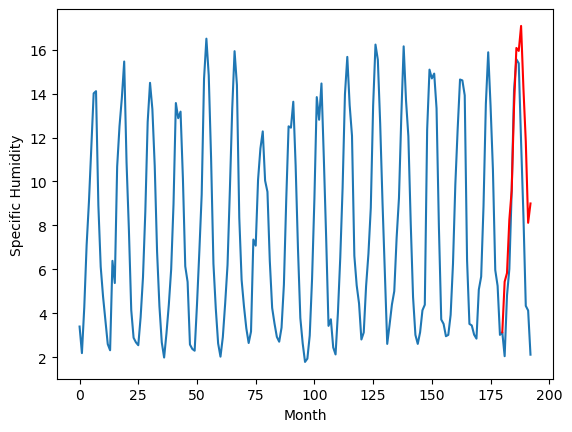

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		4.14		-0.13
6.26		4.54		-1.72
6.23		6.97		0.74
6.98		8.29		1.31
8.31		12.14		3.83
12.60		14.78		2.18
13.81		14.64		0.83
14.20		15.78		1.58
13.40		12.93		-0.47
10.48		10.51		0.03
5.82		6.82		1.00
7.56		7.70		0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 4.140142692327499, 4.535134686231613, 6.9663654696941375, 8.292782558202743, 12.137837423086166, 14.777185691595077, 14.642233191132545, 15.779159007668495, 12.930657325387001, 10.514558015465736, 6.820479093194008, 7.700053868889809]


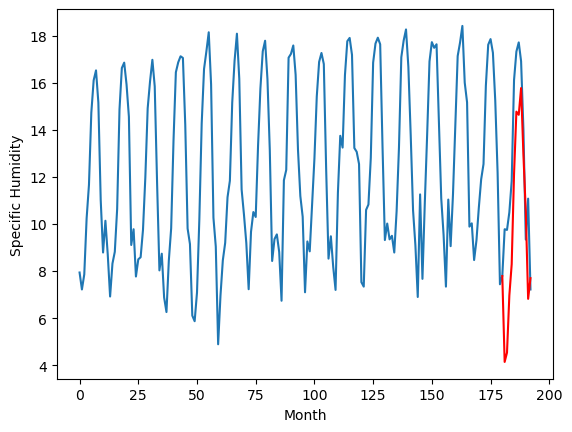

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		4.20		0.33
3.75		4.60		0.85
6.81		7.03		0.22
7.06		8.35		1.29
10.50		12.20		1.70
14.74		14.84		0.10
16.39		14.70		-1.69
16.40		15.84		-0.56
13.46		12.99		-0.47
10.68		10.57		-0.11
5.24		6.88		1.64
8.19		7.76		-0.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 4.2001426923275, 4.595134686231614, 7.026365469694138, 8.352782558202744, 12.197837423086167, 14.837185691595078, 14.702233191132546, 15.839159007668496, 12.990657325387001, 10.574558015465737, 6.880479093194008, 7.760053868889809]


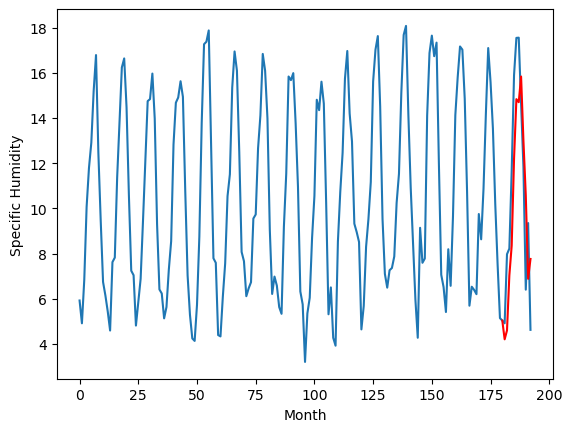

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		4.06		0.33
3.41		4.46		1.05
6.07		6.89		0.82
7.36		8.21		0.85
11.36		12.06		0.70
15.05		14.70		-0.35
15.62		14.56		-1.06
16.01		15.70		-0.31
12.00		12.85		0.85
9.15		10.43		1.28
5.53		6.74		1.21
7.39		7.62		0.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 4.060142692327499, 4.455134686231613, 6.886365469694137, 8.212782558202743, 12.057837423086166, 14.697185691595077, 14.562233191132545, 15.699159007668495, 12.850657325387001, 10.434558015465736, 6.740479093194008, 7.6200538688898085]


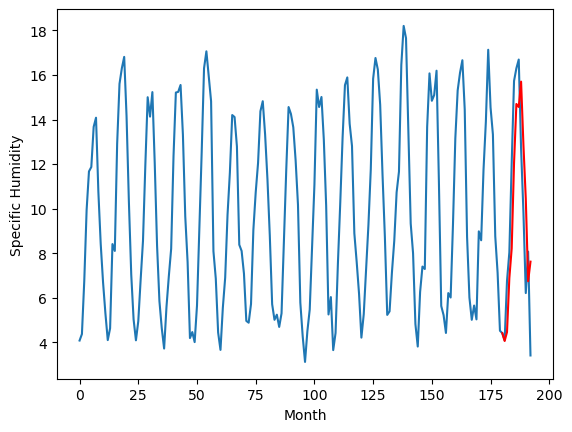

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.62		0.26
2.91		4.02		1.11
5.49		6.45		0.96
6.85		7.77		0.92
11.14		11.62		0.48
15.02		14.26		-0.76
15.40		14.12		-1.28
15.51		15.26		-0.25
11.61		12.41		0.80
8.88		9.99		1.11
5.27		6.30		1.03
6.68		7.18		0.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.6201426923274993, 4.0151346862316135, 6.446365469694138, 7.772782558202744, 11.617837423086167, 14.257185691595078, 14.122233191132546, 15.259159007668496, 12.410657325387001, 9.994558015465737, 6.300479093194008, 7.180053868889809]


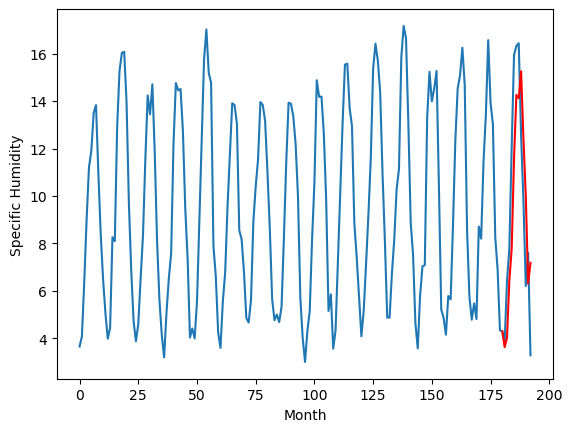

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		8.16		-0.48
8.00		8.56		0.56
9.49		10.99		1.50
10.45		12.31		1.86
15.00		16.16		1.16
17.30		18.80		1.50
18.33		18.66		0.33
18.05		19.80		1.75
14.80		16.95		2.15
11.75		14.53		2.78
10.03		10.84		0.81
9.18		11.72		2.54
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 8.1601426923275, 8.555134686231614, 10.986365469694139, 12.312782558202745, 16.157837423086168, 18.79718569159508, 18.662233191132547, 19.799159007668496, 16.950657325387002, 14.534558015465738, 10.84047909319401, 11.72005386888981]


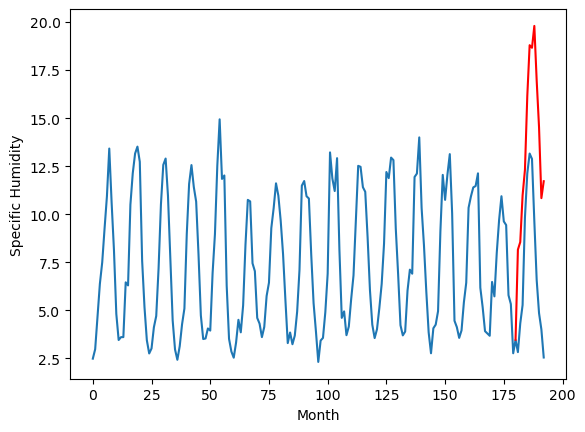

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		6.14		0.34
6.05		6.54		0.49
7.76		8.97		1.21
8.17		10.29		2.12
11.15		14.14		2.99
15.84		16.78		0.94
17.44		16.64		-0.80
17.82		17.78		-0.04
14.24		14.93		0.69
12.03		12.51		0.48
6.31		8.82		2.51
8.17		9.70		1.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 6.140142692327499, 6.535134686231613, 8.966365469694138, 10.292782558202743, 14.137837423086166, 16.77718569159508, 16.642233191132547, 17.779159007668497, 14.930657325387003, 12.514558015465738, 8.82047909319401, 9.70005386888981]


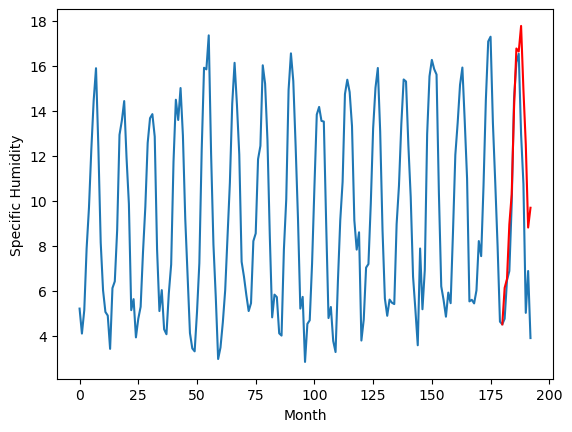

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		4.30		0.37
3.30		4.70		1.40
5.67		7.13		1.46
6.59		8.45		1.86
9.75		12.30		2.55
14.35		14.94		0.59
15.30		14.80		-0.50
15.04		15.94		0.90
11.78		13.09		1.31
9.69		10.67		0.98
5.00		6.98		1.98
6.47		7.86		1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 4.3001426923274995, 4.695134686231613, 7.126365469694138, 8.452782558202744, 12.297837423086166, 14.937185691595078, 14.802233191132546, 15.939159007668495, 13.090657325387001, 10.674558015465736, 6.980479093194008, 7.860053868889809]


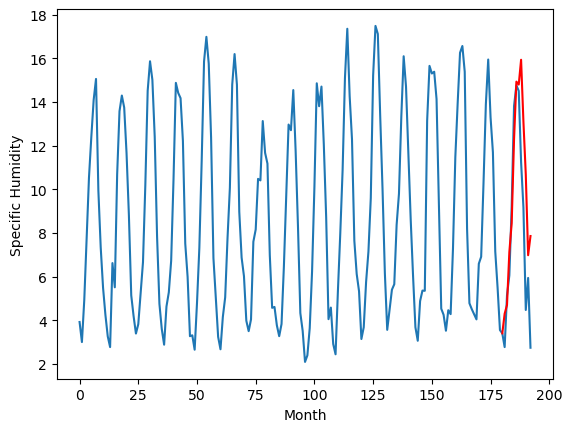

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.87		0.57
2.73		4.27		1.54
4.67		6.70		2.03
6.00		8.02		2.02
8.29		11.87		3.58
13.35		14.51		1.16
14.61		14.37		-0.24
14.75		15.51		0.76
11.27		12.66		1.39
10.12		10.24		0.12
4.35		6.55		2.20
5.06		7.43		2.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.8701426923274993, 4.2651346862316135, 6.696365469694138, 8.022782558202744, 11.867837423086167, 14.507185691595078, 14.372233191132546, 15.509159007668496, 12.660657325387001, 10.244558015465737, 6.550479093194008, 7.430053868889809]


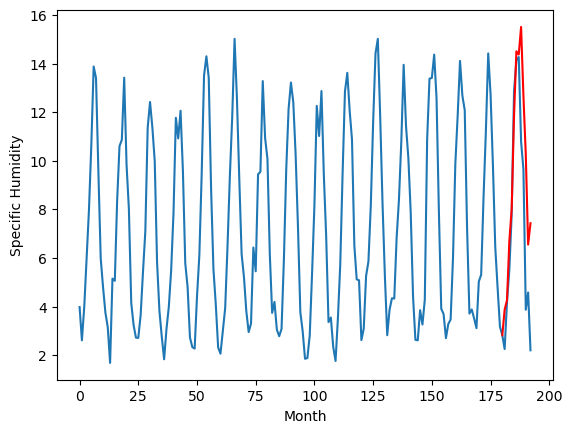

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.71		0.54
1.53		3.11		1.58
3.90		5.54		1.64
5.21		6.86		1.65
7.83		10.71		2.88
12.58		13.35		0.77
13.98		13.21		-0.77
14.23		14.35		0.12
10.20		11.50		1.30
8.33		9.08		0.75
3.04		5.39		2.35
3.58		6.27		2.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.7101426923274996, 3.1051346862316134, 5.536365469694138, 6.862782558202744, 10.707837423086167, 13.347185691595078, 13.212233191132546, 14.349159007668495, 11.500657325387001, 9.084558015465737, 5.390479093194008, 6.270053868889809]


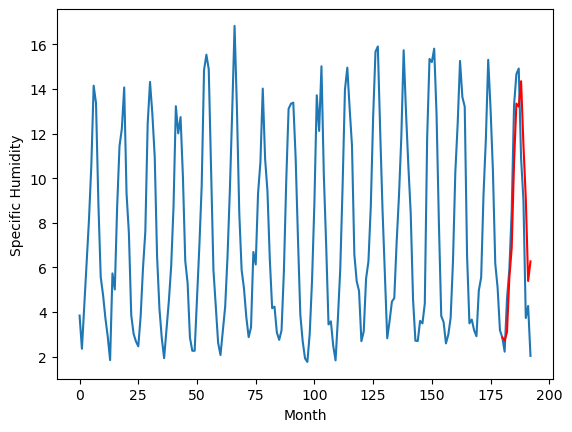

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.44		0.60
4.27		5.84		1.57
5.56		8.27		2.71
7.23		9.59		2.36
8.83		13.44		4.61
13.84		16.08		2.24
15.11		15.94		0.83
15.98		17.08		1.10
12.22		14.23		2.01
11.21		11.81		0.60
5.97		8.12		2.15
5.93		9.00		3.07
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 5.440142692327499, 5.835134686231613, 8.266365469694136, 9.592782558202742, 13.437837423086165, 16.077185691595076, 15.942233191132544, 17.079159007668494, 14.230657325387, 11.814558015465735, 8.120479093194007, 9.000053868889808]


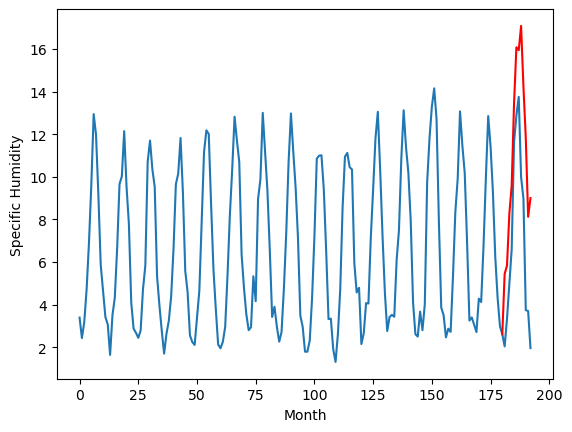

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.440142692327499, 4.140142692327499, 4.2001426923275, 4.060142692327499, 3.6201426923274993, 8.1601426923275, 6.140142692327499, 4.3001426923274995, 3.8701426923274993, 2.7101426923274996, 5.440142692327499]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.440143
1                 1    4.27   4.140143
2                 2    3.87   4.200143
3                 3    3.73   4.060143
4                 4    3.36   3.620143
5                 5    8.64   8.160143
6                 6    5.80   6.140143
7                 7    3.93   4.300143
8                 8    3.30   3.870143
9                 9    2.17   2.710143
10               10    4.84   5.440143


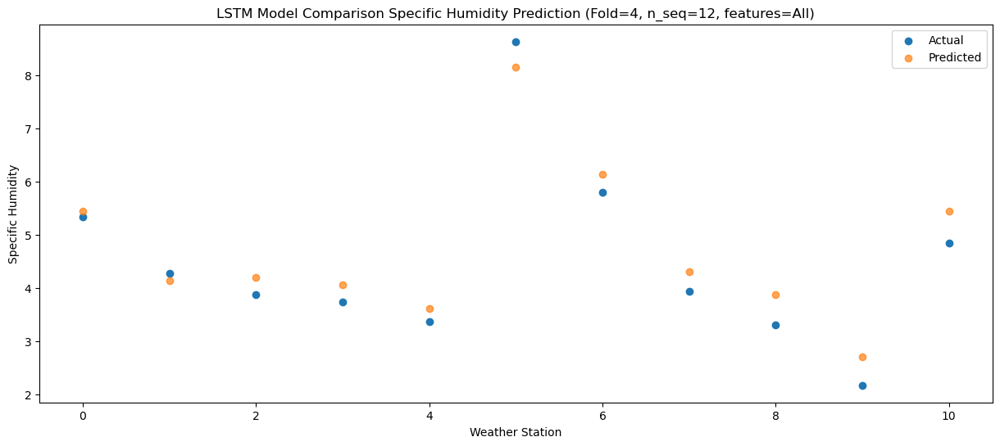

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   5.835135
1                 1    6.26   4.535135
2                 2    3.75   4.595135
3                 3    3.41   4.455135
4                 4    2.91   4.015135
5                 5    8.00   8.555135
6                 6    6.05   6.535135
7                 7    3.30   4.695135
8                 8    2.73   4.265135
9                 9    1.53   3.105135
10               10    4.27   5.835135


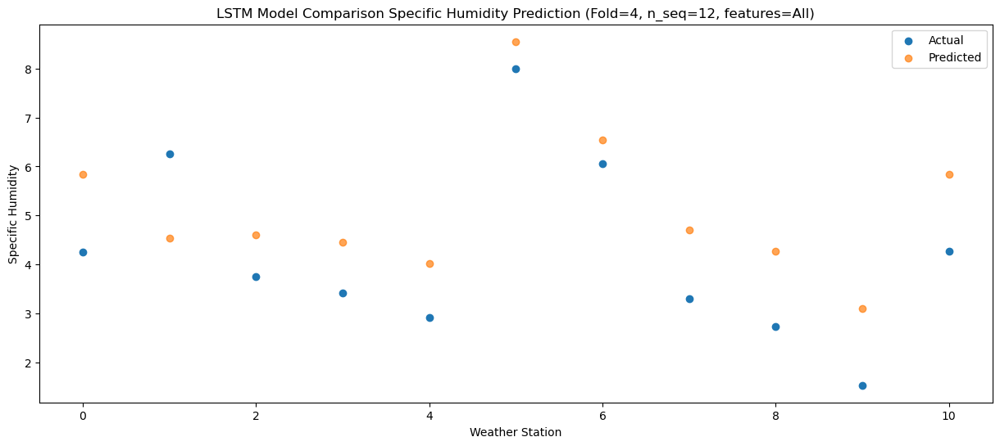

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   8.266365
1                 1    6.23   6.966365
2                 2    6.81   7.026365
3                 3    6.07   6.886365
4                 4    5.49   6.446365
5                 5    9.49  10.986365
6                 6    7.76   8.966365
7                 7    5.67   7.126365
8                 8    4.67   6.696365
9                 9    3.90   5.536365
10               10    5.56   8.266365


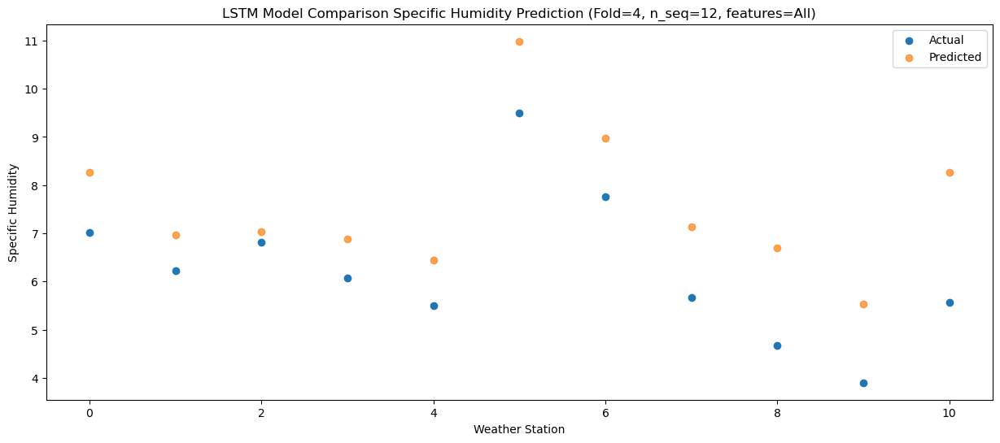

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   9.592783
1                 1    6.98   8.292783
2                 2    7.06   8.352783
3                 3    7.36   8.212783
4                 4    6.85   7.772783
5                 5   10.45  12.312783
6                 6    8.17  10.292783
7                 7    6.59   8.452783
8                 8    6.00   8.022783
9                 9    5.21   6.862783
10               10    7.23   9.592783


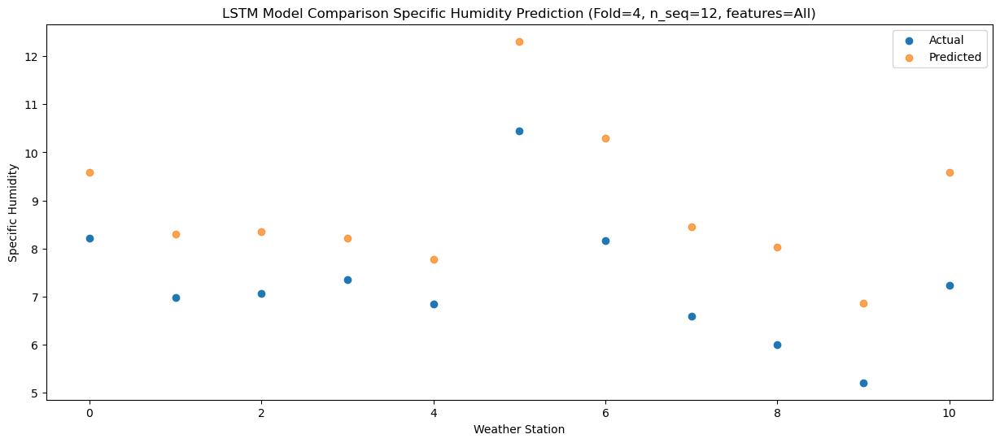

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78  13.437837
1                 1    8.31  12.137837
2                 2   10.50  12.197837
3                 3   11.36  12.057837
4                 4   11.14  11.617837
5                 5   15.00  16.157837
6                 6   11.15  14.137837
7                 7    9.75  12.297837
8                 8    8.29  11.867837
9                 9    7.83  10.707837
10               10    8.83  13.437837


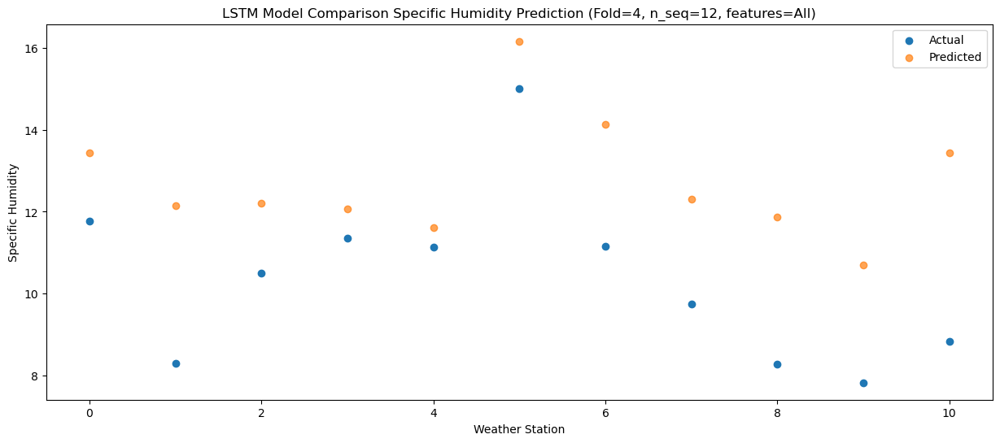

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  16.077186
1                 1   12.60  14.777186
2                 2   14.74  14.837186
3                 3   15.05  14.697186
4                 4   15.02  14.257186
5                 5   17.30  18.797186
6                 6   15.84  16.777186
7                 7   14.35  14.937186
8                 8   13.35  14.507186
9                 9   12.58  13.347186
10               10   13.84  16.077186


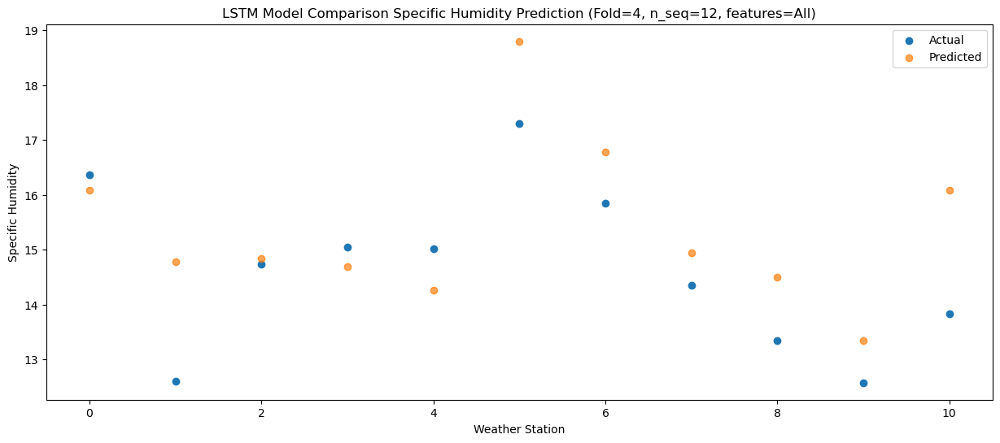

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  15.942233
1                 1   13.81  14.642233
2                 2   16.39  14.702233
3                 3   15.62  14.562233
4                 4   15.40  14.122233
5                 5   18.33  18.662233
6                 6   17.44  16.642233
7                 7   15.30  14.802233
8                 8   14.61  14.372233
9                 9   13.98  13.212233
10               10   15.11  15.942233


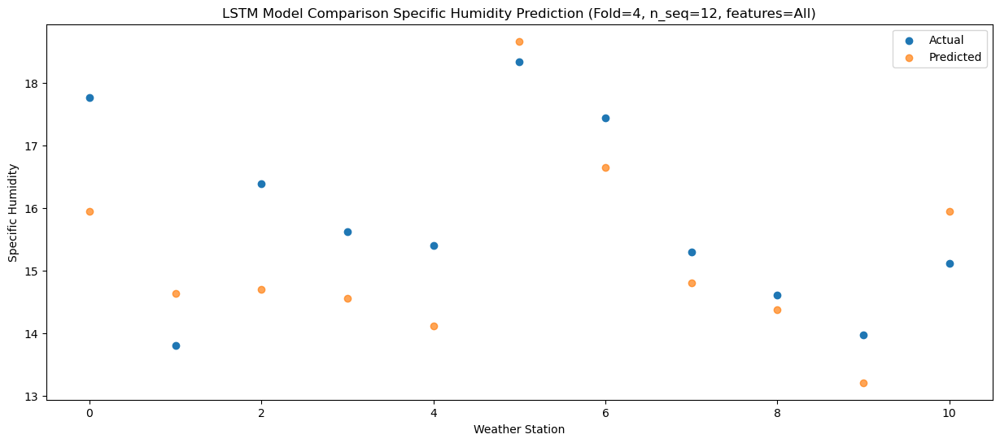

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  17.079159
1                 1   14.20  15.779159
2                 2   16.40  15.839159
3                 3   16.01  15.699159
4                 4   15.51  15.259159
5                 5   18.05  19.799159
6                 6   17.82  17.779159
7                 7   15.04  15.939159
8                 8   14.75  15.509159
9                 9   14.23  14.349159
10               10   15.98  17.079159


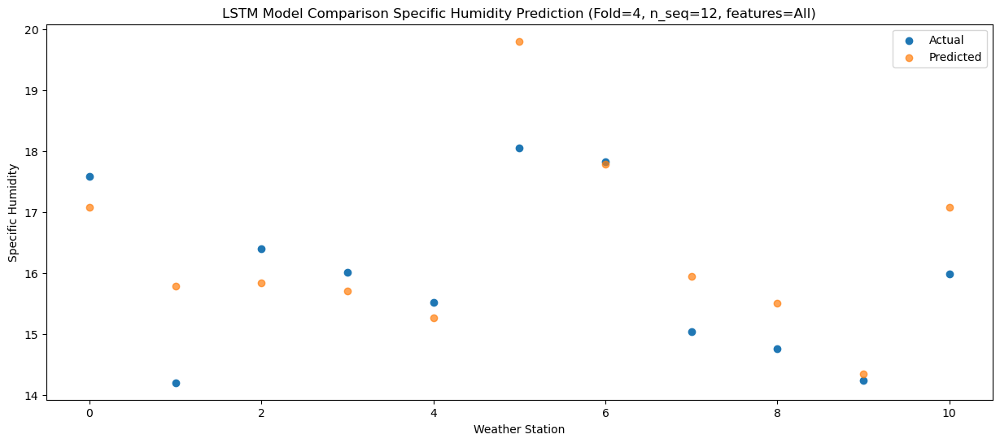

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00  14.230657
1                 1   13.40  12.930657
2                 2   13.46  12.990657
3                 3   12.00  12.850657
4                 4   11.61  12.410657
5                 5   14.80  16.950657
6                 6   14.24  14.930657
7                 7   11.78  13.090657
8                 8   11.27  12.660657
9                 9   10.20  11.500657
10               10   12.22  14.230657


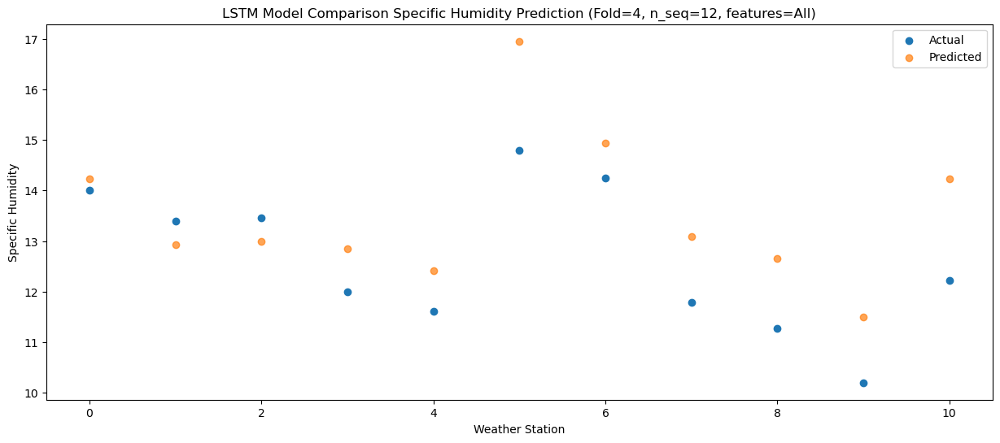

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63  11.814558
1                 1   10.48  10.514558
2                 2   10.68  10.574558
3                 3    9.15  10.434558
4                 4    8.88   9.994558
5                 5   11.75  14.534558
6                 6   12.03  12.514558
7                 7    9.69  10.674558
8                 8   10.12  10.244558
9                 9    8.33   9.084558
10               10   11.21  11.814558


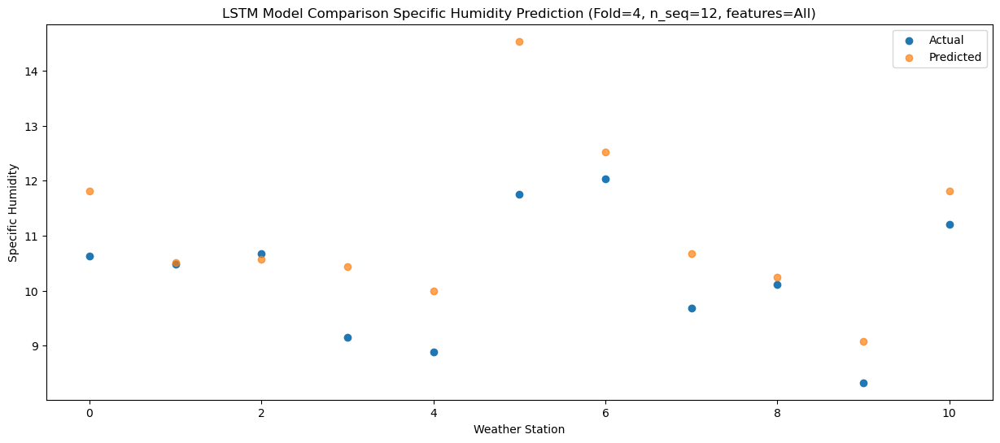

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   8.120479
1                 1    5.82   6.820479
2                 2    5.24   6.880479
3                 3    5.53   6.740479
4                 4    5.27   6.300479
5                 5   10.03  10.840479
6                 6    6.31   8.820479
7                 7    5.00   6.980479
8                 8    4.35   6.550479
9                 9    3.04   5.390479
10               10    5.97   8.120479


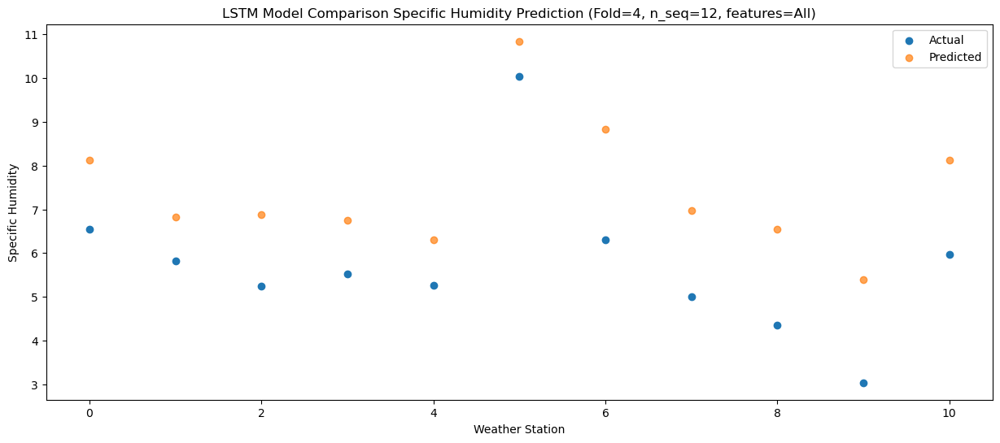

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   9.000054
1                 1    7.56   7.700054
2                 2    8.19   7.760054
3                 3    7.39   7.620054
4                 4    6.68   7.180054
5                 5    9.18  11.720054
6                 6    8.17   9.700054
7                 7    6.47   7.860054
8                 8    5.06   7.430054
9                 9    3.58   6.270054
10               10    5.93   9.000054


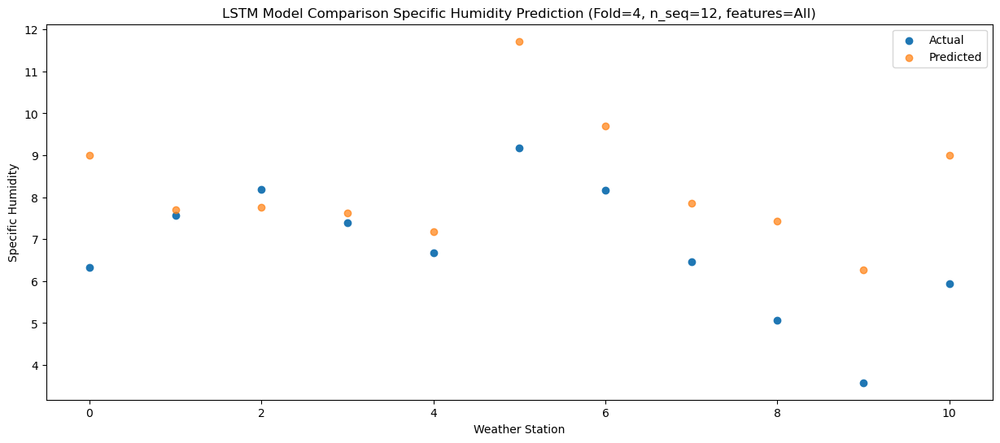

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1008 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1009 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1009 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 12)                

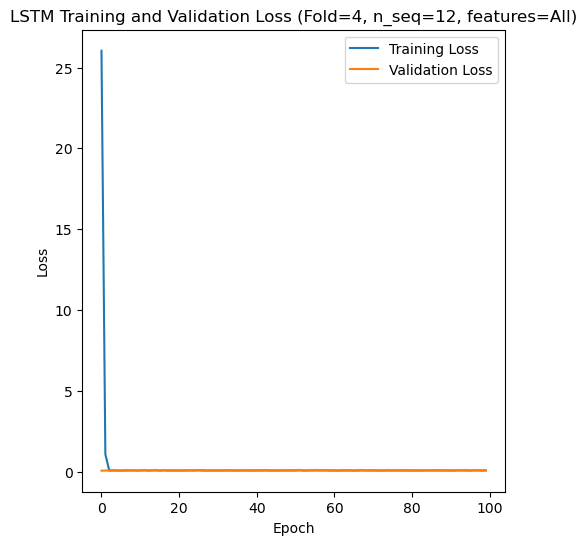

[[1.0504893771391348, 1.975720777264751, 1.2468215564050866, 1.301581724396542, 2.0595370005144393, 0.887741072424493, 1.1058739841711571, 1.1218295927703417, 1.402491882962296, 0.558167927889676, 3.1429097731361386, 2.464726686427135], [0.4492392983850402, 0.9576181483481245, 1.7362009307009258, 0.9101818590553009, 2.3531816082242316, 1.1332586916826506, 1.6613654894995942, 0.818192981729055, 1.172279127287259, 1.0503905844685086, 1.9732821679431711, 2.0603584370583286], [0.4625841119582911, 1.777109131768734, 1.3430004362489587, 1.3729052410952611, 2.369282124743342, 2.4792780140304838, 1.6130559519263834, 1.7372564803263715, 1.3744442289574814, 1.3894482701737407, 0.7403301591354112, 1.705716038069357], [0.6239630245712916, 1.4935840922189043, 1.5521795503030258, 0.8306696967216465, 1.8366518214098837, 3.364102645505207, 2.931594434551052, 3.503387864039762, 3.0688859078682316, 2.1018400635354126, 1.8965823672061533, 0.8849791061680482], [0.40141883166245446, 1.2895721452601754, 1.4

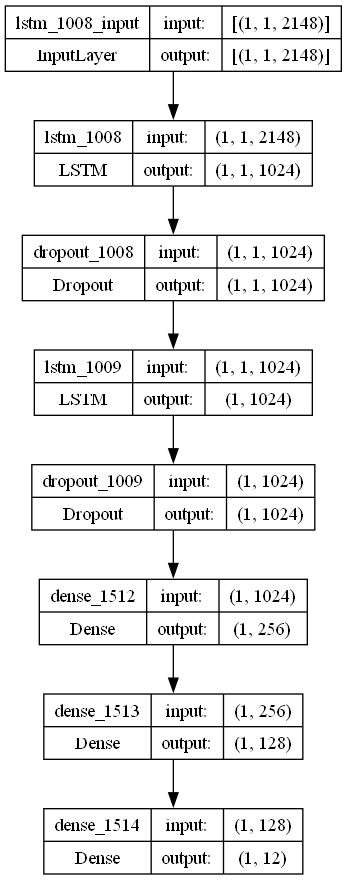

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

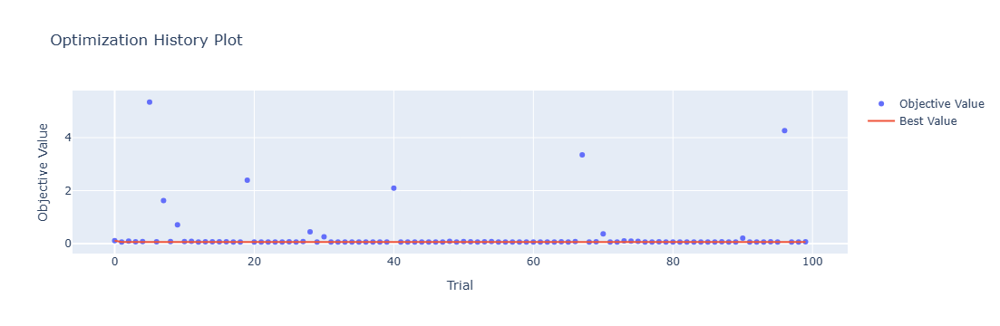

In [4]:
optuna.visualization.plot_optimization_history(study)

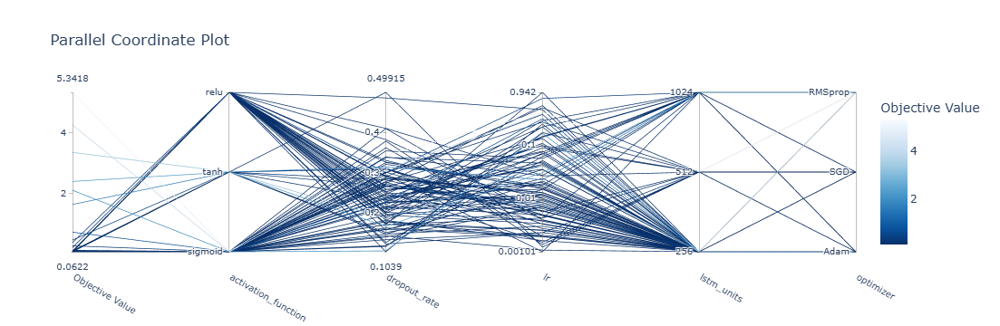

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

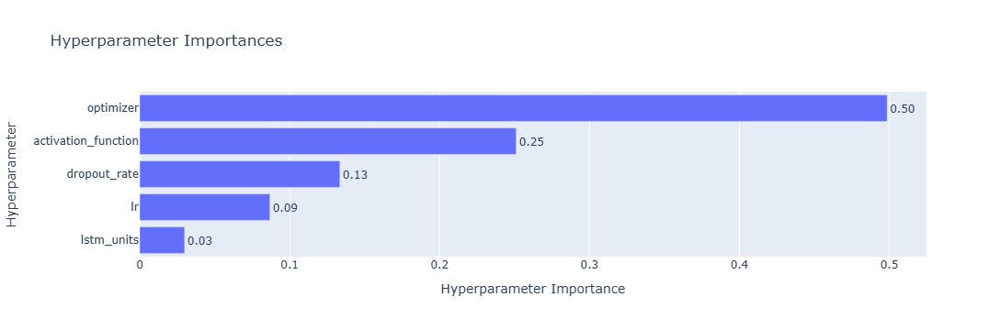

In [6]:
optuna.visualization.plot_param_importances(study)

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 38s 193ms/step - loss: 25.0200 - accuracy: 0.3929 - mae: 24.7096 - rmse: 25.0200 - mape: 5315.4658 - pearson: 0.4784 - val_loss: 0.0802 - val_accuracy: 0.8000 - val_mae: 0.0683 - val_rmse: 0.0802 - val_mape: 14.7057 - val_pearson: 0.7544
Epoch 2/100
84/84 [==============================] - 7s 87ms/step - loss: 0.2342 - accuracy: 0.7024 - mae: 0.2028 - rmse: 0.2342 - mape: 43.8486 - pearson: 0.7133 - val_loss: 0.0844 - val_accuracy: 0.2000 - val_mae: 0.0669 - val_rmse: 0.0844 - val_mape: 14.9642 - val_pearson: 0.7015
Epoch 3/100
84/84 [==============================] - 7s 89ms/step - loss: 0.0819 - accuracy: 0.5833 - mae: 0.0648 - rmse: 0.0819 - mape: 14.5437 - pearson: 0.724

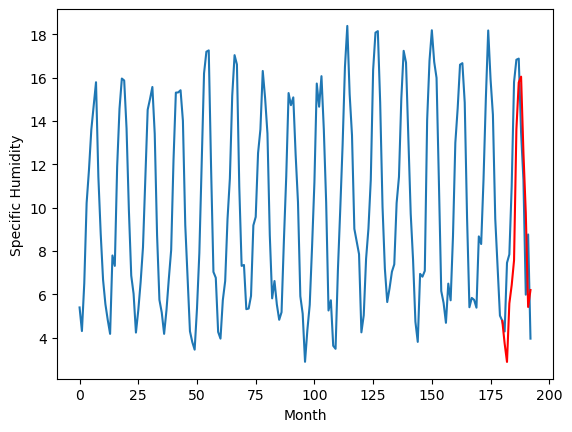

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		4.97		-0.77
6.45		4.12		-2.33
8.66		6.82		-1.84
8.88		7.67		-1.21
11.37		8.82		-2.55
16.12		14.86		-1.26
16.92		17.03		0.11
17.08		17.30		0.22
14.92		13.79		-1.13
11.84		11.01		-0.83
6.18		6.66		0.48
9.82		7.44		-2.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.973986967802047, 4.124531253576278, 6.824157699346542, 7.674258991479873, 8.816892787218094, 14.862300559282303, 17.030341073274613, 17.297507359981537, 13.78859575033188, 11.00631864309311, 6.6619201445579534, 7.443585469722748]


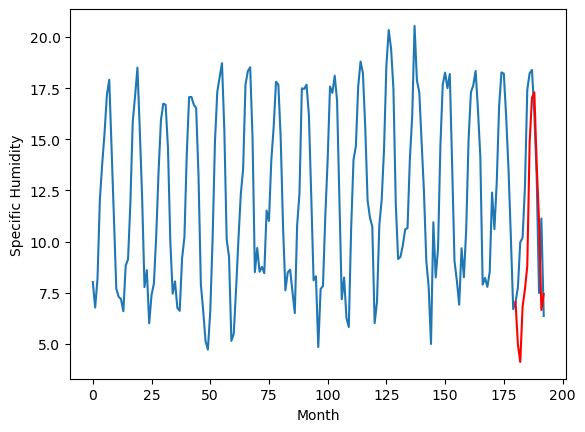

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		7.61		-0.80
8.56		6.76		-1.80
10.41		9.46		-0.95
10.65		10.31		-0.34
13.41		11.46		-1.95
18.03		17.50		-0.53
19.94		19.67		-0.27
20.14		19.94		-0.20
17.14		16.43		-0.71
14.42		13.65		-0.77
8.55		9.30		0.75
10.95		10.08		-0.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 7.613986967802047, 6.764531253576278, 9.464157699346542, 10.314258991479873, 11.456892787218093, 17.502300559282304, 19.670341073274614, 19.937507359981538, 16.42859575033188, 13.64631864309311, 9.301920144557954, 10.083585469722749]


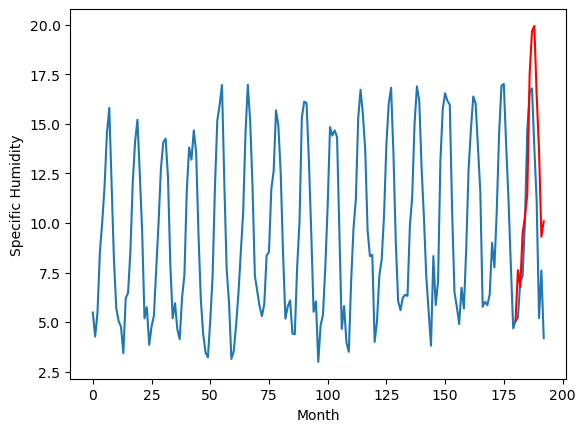

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.06		-0.49
5.46		4.21		-1.25
8.91		6.91		-2.00
9.48		7.76		-1.72
12.99		8.91		-4.08
16.89		14.95		-1.94
17.73		17.12		-0.61
17.35		17.39		0.04
15.04		13.88		-1.16
12.61		11.10		-1.51
6.40		6.75		0.35
9.45		7.53		-1.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.063986967802048, 4.214531253576279, 6.914157699346543, 7.764258991479874, 8.906892787218094, 14.952300559282303, 17.120341073274613, 17.387507359981537, 13.878595750331879, 11.09631864309311, 6.751920144557953, 7.533585469722748]


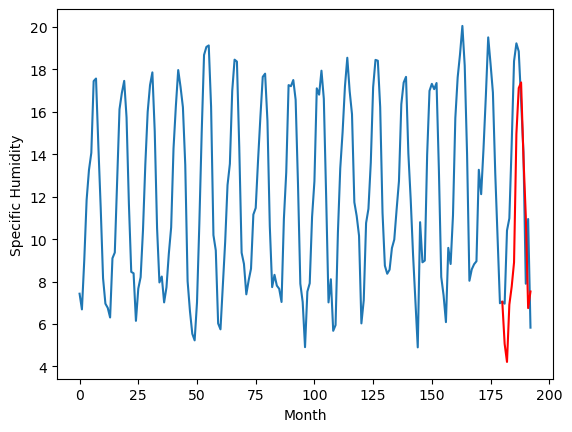

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.01		-0.35
6.96		6.16		-0.80
9.80		8.86		-0.94
11.20		9.71		-1.49
15.21		10.86		-4.35
18.90		16.90		-2.00
19.61		19.07		-0.54
19.53		19.34		-0.19
15.30		15.83		0.53
13.21		13.05		-0.16
8.99		8.70		-0.29
11.75		9.48		-2.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 7.0139869678020474, 6.164531253576278, 8.864157699346542, 9.714258991479873, 10.856892787218094, 16.902300559282303, 19.070341073274612, 19.337507359981537, 15.828595750331878, 13.046318643093109, 8.701920144557953, 9.483585469722748]


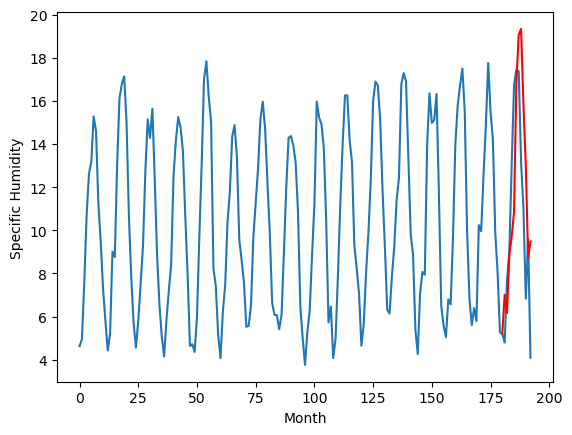

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.21		0.19
4.61		3.36		-1.25
6.18		6.06		-0.12
7.19		6.91		-0.28
9.69		8.06		-1.63
14.95		14.10		-0.85
16.07		16.27		0.20
17.23		16.54		-0.69
13.14		13.03		-0.11
10.82		10.25		-0.57
5.56		5.90		0.34
6.98		6.68		-0.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 4.213986967802048, 3.3645312535762786, 6.064157699346542, 6.9142589914798736, 8.056892787218093, 14.102300559282302, 16.27034107327461, 16.537507359981536, 13.028595750331878, 10.246318643093108, 5.901920144557952, 6.683585469722747]


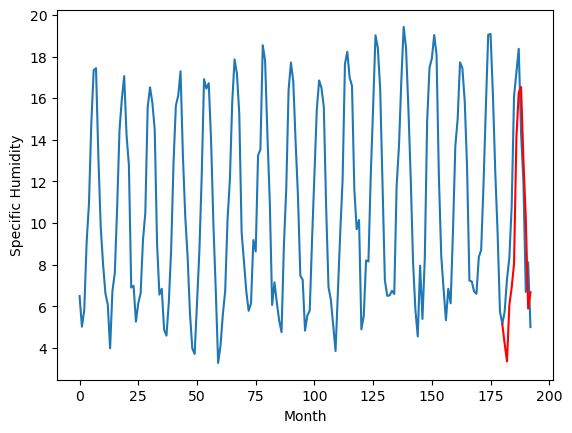

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.08		-0.27
6.40		5.23		-1.17
7.99		7.93		-0.06
8.59		8.78		0.19
11.59		9.93		-1.66
15.97		15.97		0.00
17.41		18.14		0.73
17.94		18.41		0.47
14.62		14.90		0.28
12.51		12.12		-0.39
6.76		7.77		1.01
8.60		8.55		-0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 6.083986967802048, 5.234531253576279, 7.934157699346542, 8.784258991479874, 9.926892787218094, 15.972300559282303, 18.140341073274612, 18.407507359981537, 14.898595750331879, 12.11631864309311, 7.771920144557953, 8.553585469722748]


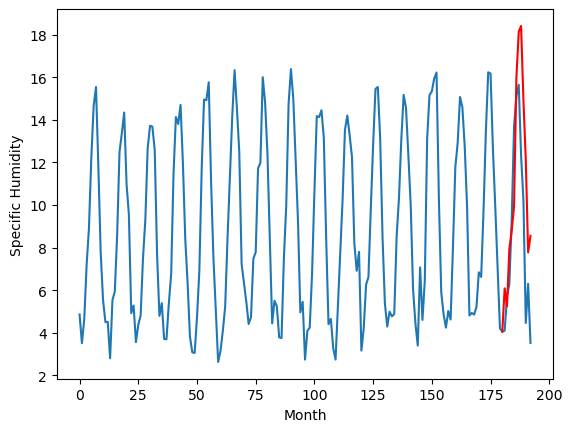

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.44		-0.11
4.58		3.59		-0.99
6.20		6.29		0.09
6.90		7.14		0.24
9.92		8.29		-1.63
14.19		14.33		0.14
15.69		16.50		0.81
15.97		16.77		0.80
12.48		13.26		0.78
10.60		10.48		-0.12
4.81		6.13		1.32
6.58		6.91		0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 4.443986967802048, 3.594531253576279, 6.294157699346543, 7.144258991479874, 8.286892787218093, 14.332300559282302, 16.500341073274612, 16.767507359981536, 13.258595750331878, 10.476318643093109, 6.131920144557952, 6.913585469722747]


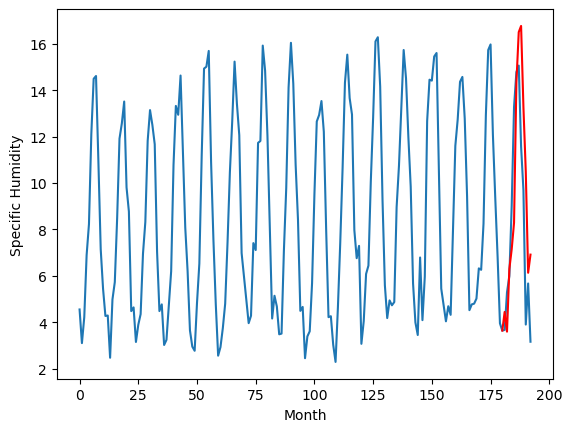

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.13		-0.19
3.64		3.28		-0.36
6.70		5.98		-0.72
7.43		6.83		-0.60
10.34		7.98		-2.36
15.32		14.02		-1.30
16.82		16.19		-0.63
17.01		16.46		-0.55
13.20		12.95		-0.25
10.78		10.17		-0.61
5.49		5.82		0.33
7.08		6.60		-0.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.1339869678020476, 3.2845312535762785, 5.984157699346542, 6.8342589914798735, 7.976892787218094, 14.022300559282304, 16.190341073274613, 16.457507359981538, 12.94859575033188, 10.16631864309311, 5.821920144557954, 6.6035854697227485]


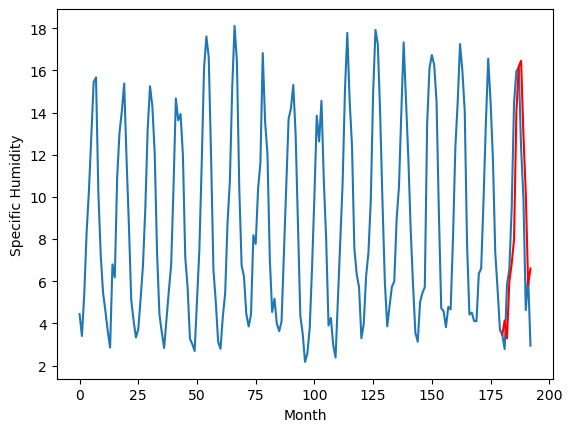

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.02		-0.09
3.66		3.17		-0.49
5.46		5.87		0.41
6.78		6.72		-0.06
8.87		7.87		-1.00
13.64		13.91		0.27
14.57		16.08		1.51
14.99		16.35		1.36
11.82		12.84		1.02
10.51		10.06		-0.45
4.99		5.71		0.72
5.83		6.49		0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 4.023986967802048, 3.174531253576279, 5.874157699346543, 6.724258991479874, 7.866892787218094, 13.912300559282304, 16.080341073274614, 16.347507359981538, 12.83859575033188, 10.05631864309311, 5.711920144557954, 6.493585469722749]


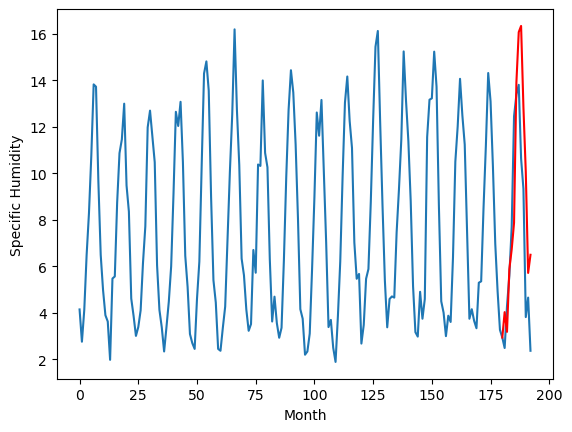

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.72		-0.04
3.02		2.87		-0.15
4.64		5.57		0.93
6.24		6.42		0.18
7.76		7.57		-0.19
12.89		13.61		0.72
13.96		15.78		1.82
14.45		16.05		1.60
10.83		12.54		1.71
9.84		9.76		-0.08
4.99		5.41		0.42
4.99		6.19		1.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 3.7239869678020474, 2.8745312535762784, 5.574157699346542, 6.424258991479873, 7.5668927872180936, 13.612300559282303, 15.780341073274613, 16.047507359981537, 12.53859575033188, 9.75631864309311, 5.4119201445579534, 6.193585469722748]


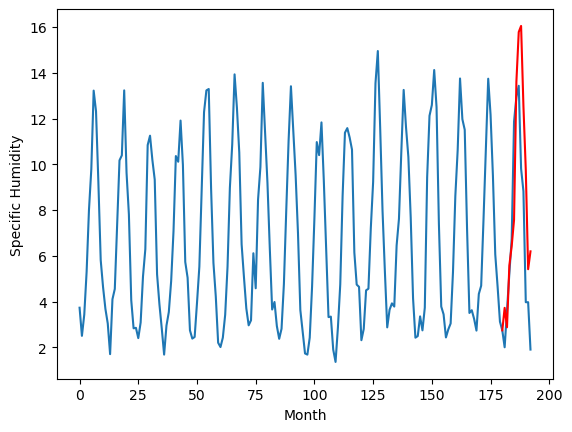

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   3.723987
1                 1    5.74   4.973987
2                 2    8.41   7.613987
3                 3    5.55   5.063987
4                 4    7.36   7.013987
5                 5    4.02   4.213987
6                 6    6.35   6.083987
7                 7    4.55   4.443987
8                 8    4.32   4.133987
9                 9    4.11   4.023987
10               10    3.76   3.723987


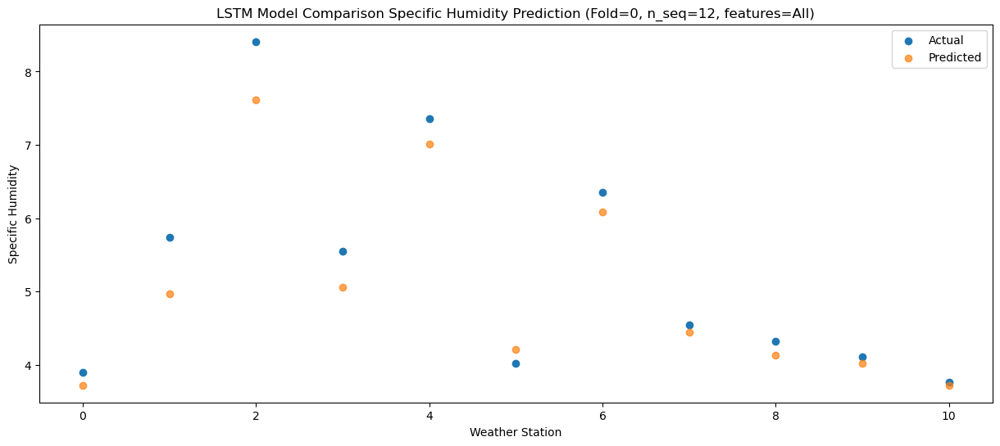

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   2.874531
1                 1    6.45   4.124531
2                 2    8.56   6.764531
3                 3    5.46   4.214531
4                 4    6.96   6.164531
5                 5    4.61   3.364531
6                 6    6.40   5.234531
7                 7    4.58   3.594531
8                 8    3.64   3.284531
9                 9    3.66   3.174531
10               10    3.02   2.874531


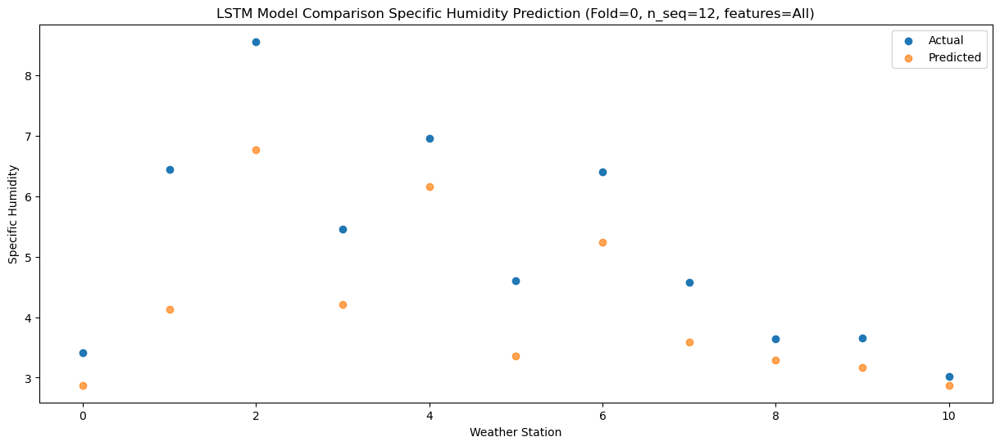

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.574158
1                 1    8.66   6.824158
2                 2   10.41   9.464158
3                 3    8.91   6.914158
4                 4    9.80   8.864158
5                 5    6.18   6.064158
6                 6    7.99   7.934158
7                 7    6.20   6.294158
8                 8    6.70   5.984158
9                 9    5.46   5.874158
10               10    4.64   5.574158


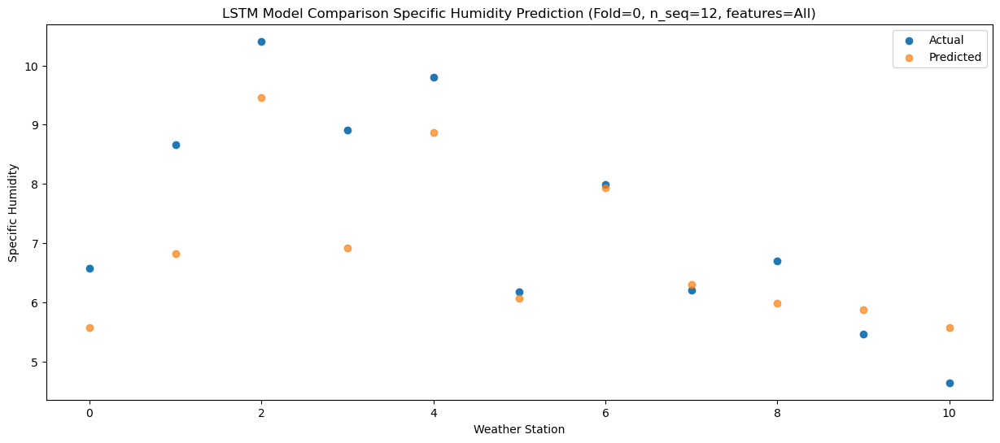

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   6.424259
1                 1    8.88   7.674259
2                 2   10.65  10.314259
3                 3    9.48   7.764259
4                 4   11.20   9.714259
5                 5    7.19   6.914259
6                 6    8.59   8.784259
7                 7    6.90   7.144259
8                 8    7.43   6.834259
9                 9    6.78   6.724259
10               10    6.24   6.424259


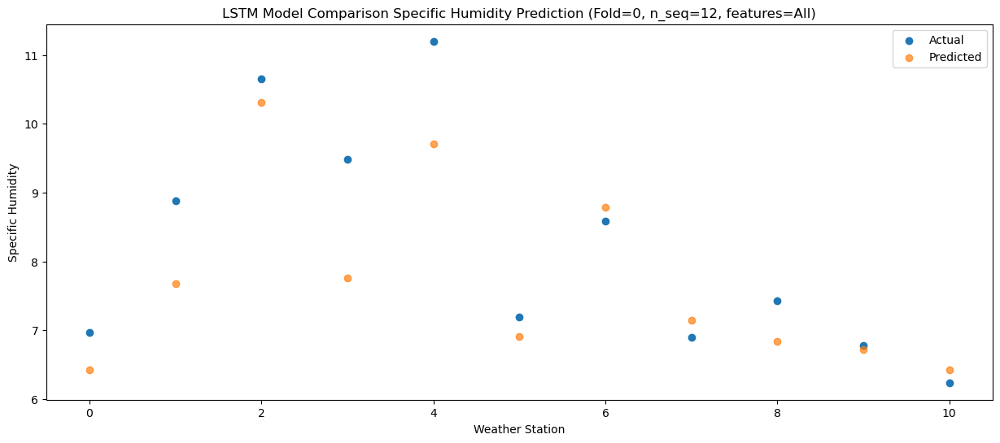

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12   7.566893
1                 1   11.37   8.816893
2                 2   13.41  11.456893
3                 3   12.99   8.906893
4                 4   15.21  10.856893
5                 5    9.69   8.056893
6                 6   11.59   9.926893
7                 7    9.92   8.286893
8                 8   10.34   7.976893
9                 9    8.87   7.866893
10               10    7.76   7.566893


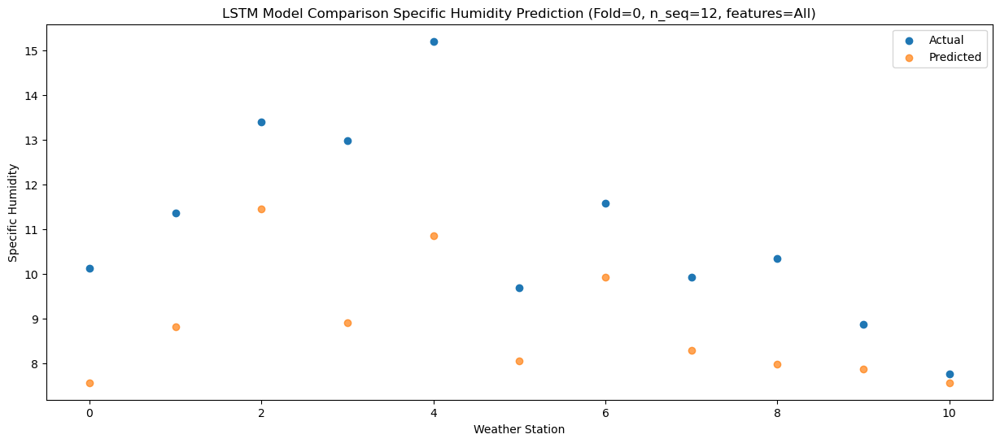

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  13.612301
1                 1   16.12  14.862301
2                 2   18.03  17.502301
3                 3   16.89  14.952301
4                 4   18.90  16.902301
5                 5   14.95  14.102301
6                 6   15.97  15.972301
7                 7   14.19  14.332301
8                 8   15.32  14.022301
9                 9   13.64  13.912301
10               10   12.89  13.612301


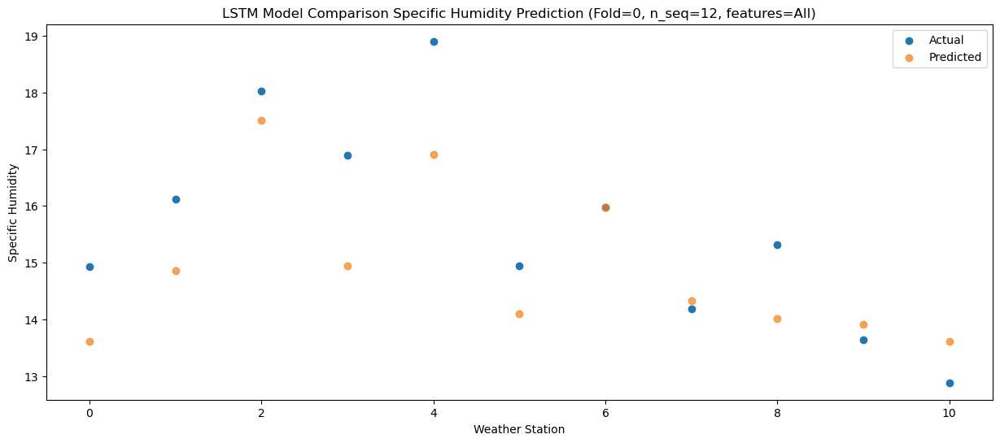

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   15.96  15.780341
1                 1   16.92  17.030341
2                 2   19.94  19.670341
3                 3   17.73  17.120341
4                 4   19.61  19.070341
5                 5   16.07  16.270341
6                 6   17.41  18.140341
7                 7   15.69  16.500341
8                 8   16.82  16.190341
9                 9   14.57  16.080341
10               10   13.96  15.780341


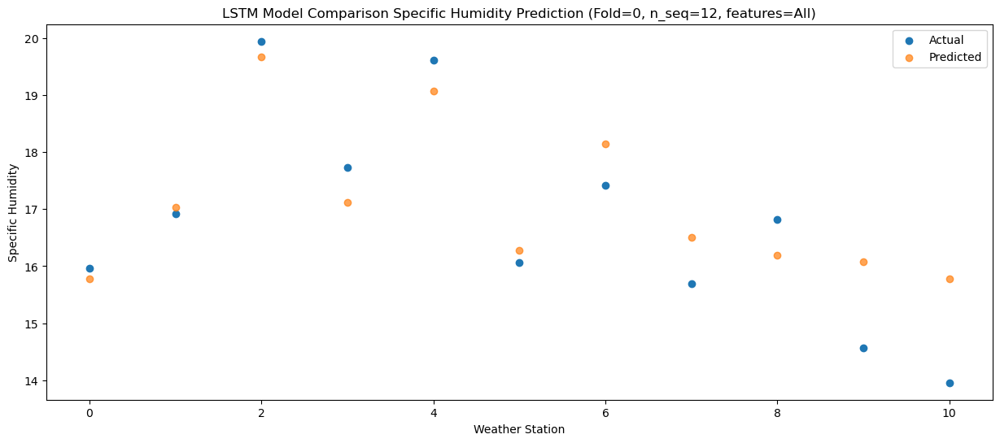

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.01  16.047507
1                 1   17.08  17.297507
2                 2   20.14  19.937507
3                 3   17.35  17.387507
4                 4   19.53  19.337507
5                 5   17.23  16.537507
6                 6   17.94  18.407507
7                 7   15.97  16.767507
8                 8   17.01  16.457507
9                 9   14.99  16.347507
10               10   14.45  16.047507


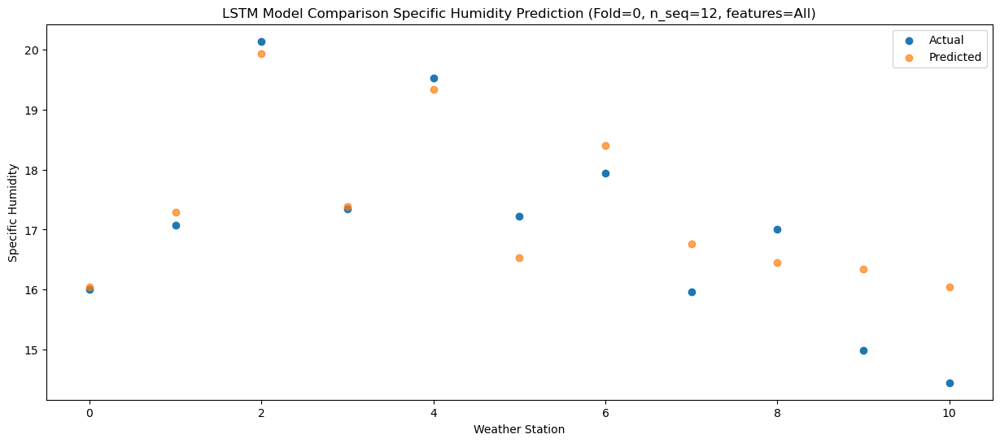

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.59  12.538596
1                 1   14.92  13.788596
2                 2   17.14  16.428596
3                 3   15.04  13.878596
4                 4   15.30  15.828596
5                 5   13.14  13.028596
6                 6   14.62  14.898596
7                 7   12.48  13.258596
8                 8   13.20  12.948596
9                 9   11.82  12.838596
10               10   10.83  12.538596


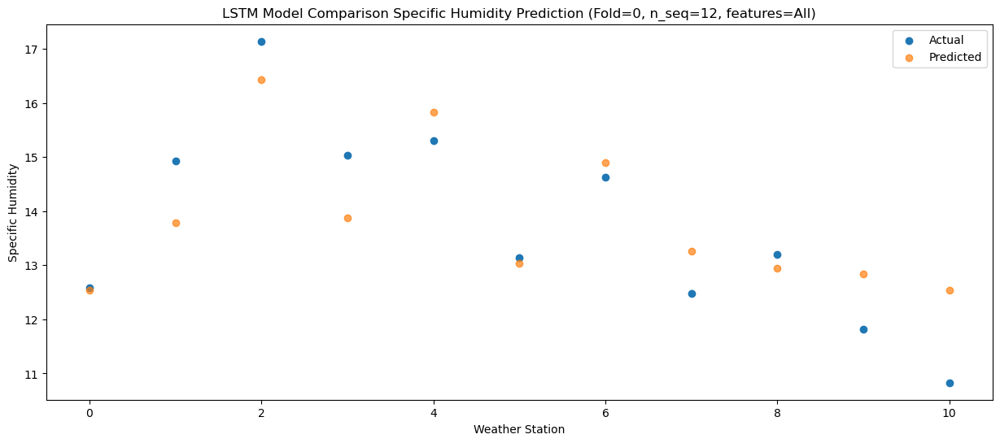

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.41   9.756319
1                 1   11.84  11.006319
2                 2   14.42  13.646319
3                 3   12.61  11.096319
4                 4   13.21  13.046319
5                 5   10.82  10.246319
6                 6   12.51  12.116319
7                 7   10.60  10.476319
8                 8   10.78  10.166319
9                 9   10.51  10.056319
10               10    9.84   9.756319


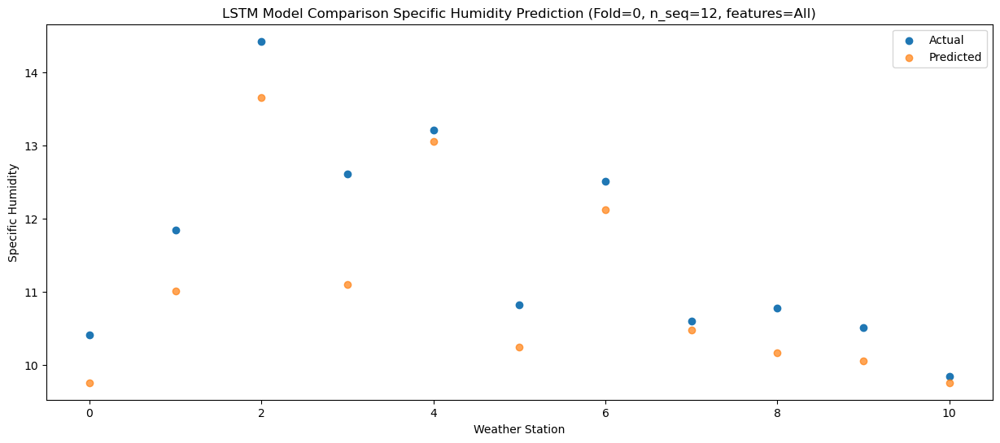

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11    5.41192
1                 1    6.18    6.66192
2                 2    8.55    9.30192
3                 3    6.40    6.75192
4                 4    8.99    8.70192
5                 5    5.56    5.90192
6                 6    6.76    7.77192
7                 7    4.81    6.13192
8                 8    5.49    5.82192
9                 9    4.99    5.71192
10               10    4.99    5.41192


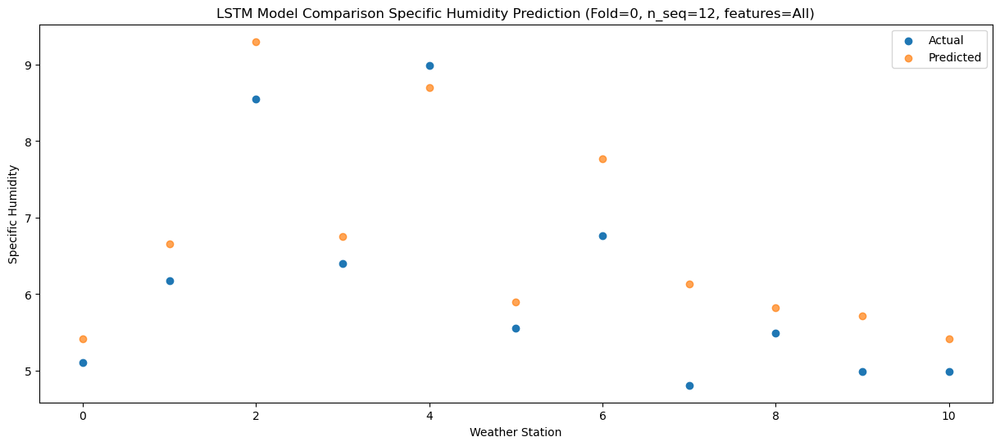

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.89   6.193585
1                 1    9.82   7.443585
2                 2   10.95  10.083585
3                 3    9.45   7.533585
4                 4   11.75   9.483585
5                 5    6.98   6.683585
6                 6    8.60   8.553585
7                 7    6.58   6.913585
8                 8    7.08   6.603585
9                 9    5.83   6.493585
10               10    4.99   6.193585


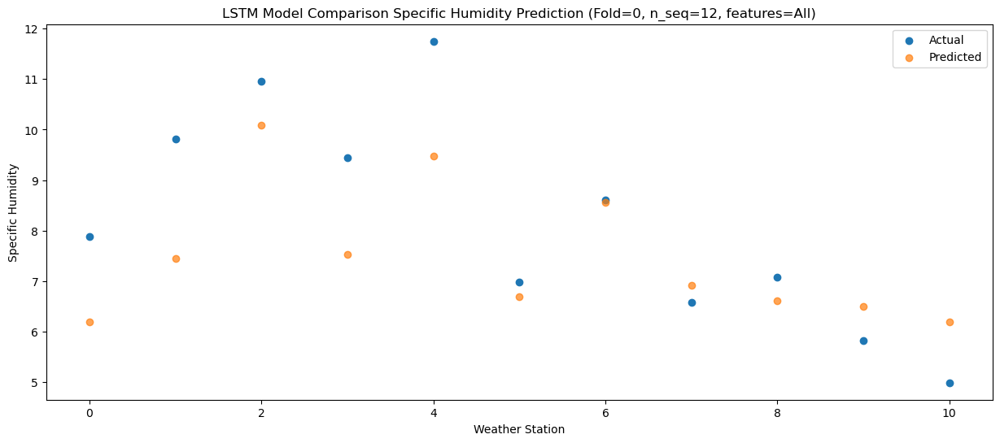

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]
 [15.96 16.92 19.94 17.73 19.61 16.07 17.41 15.69 16.82 14.57 13.96]
 [16.01 17.08 20.14 17.35 19.53 17.23 17.94 15.97 17.01 14.99 14.45]
 [12.59 14.92 17.14 15.04 15.3  13.14 14.62 12.48 13.2  11.82 10.83]
 [10.41 11.84 14.42 12.61 13.21 10.82 12.51 10.6  10.78 10.51  9.84]
 [ 5.11  6.18  8.55  6.4   8.99  5.56  6.76  4.81  5.49  4.99  4.99]
 [ 7.89  9.82 10.95  9.45 11.75  6.98  8.6   6.58  7.08  5.83  4.99]]
[[ 3.72398697  4.97398697  7.61398697  5.06398697  7.01398697  4.21398697
   6.08398697  4.44398697  4.13398697  4.02398697  3.72398697]
 [ 2.87453125  4.12453125  6

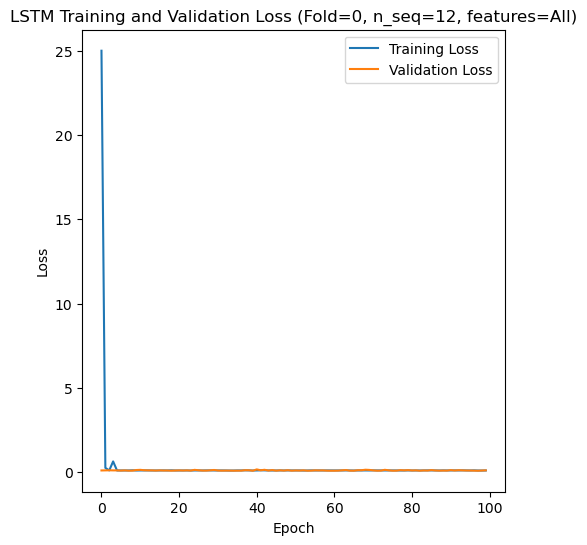

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 34s 160ms/step - loss: 36.0486 - accuracy: 0.5595 - mae: 35.5760 - rmse: 36.0486 - mape: 7721.1948 - pearson: 0.5390 - val_loss: 0.1057 - val_accuracy: 0.7000 - val_mae: 0.0839 - val_rmse: 0.1057 - val_mape: 18.7525 - val_pearson: 0.6656
Epoch 2/100
84/84 [==============================] - 7s 88ms/step - loss: 1.8444 - accuracy: 0.7262 - mae: 1.8163 - rmse: 1.8444 - mape: 366.5603 - pearson: 0.7296 - val_loss: 0.0829 - val_accuracy: 0.7000 - val_mae: 0.0660 - val_rmse: 0.0829 - val_mape: 16.5265 - val_pearson: 0.7171
Epoch 3/100
84/84 [==============================] - 7s 86ms/step - loss: 0.5122 - accuracy: 0.7262 - mae: 0.4902 - rmse: 0.5122 - mape: 111.5152 - pearson: 0.7

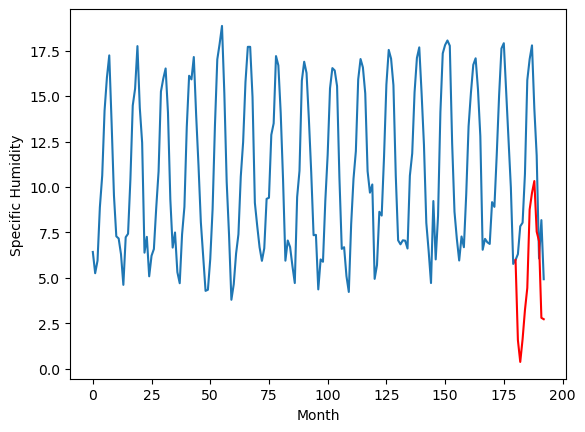

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		5.64		-0.81
6.64		4.44		-2.20
8.17		5.69		-2.48
8.53		7.29		-1.24
11.45		8.51		-2.94
15.43		12.82		-2.61
17.30		13.74		-3.56
17.51		14.39		-3.12
14.56		11.61		-2.95
12.52		11.09		-1.43
6.93		6.87		-0.06
9.10		6.79		-2.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 5.640761129856109, 4.4421250748634336, 5.694903008937835, 7.289522402286529, 8.511465542316436, 12.819600098133087, 13.738006882667541, 14.38824909210205, 11.60511487007141, 11.08584409236908, 6.868021063804626, 6.791023113131523]


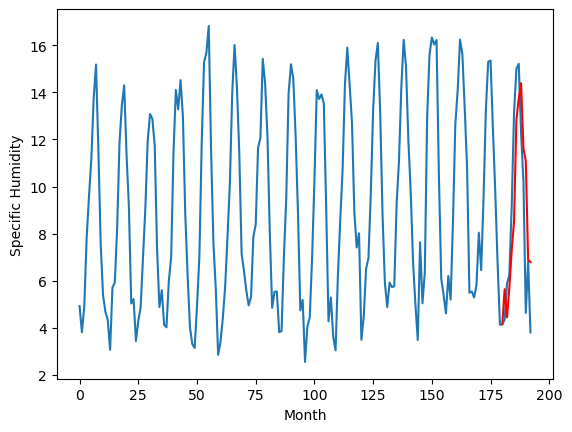

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.13		-0.94
5.07		2.93		-2.14
7.69		4.18		-3.51
7.40		5.78		-1.62
10.24		7.00		-3.24
14.76		11.31		-3.45
16.35		12.23		-4.12
16.57		12.88		-3.69
13.81		10.10		-3.71
11.06		9.58		-1.48
5.56		5.36		-0.20
8.20		5.28		-2.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 4.1307611298561095, 2.9321250748634338, 4.184903008937836, 5.7795224022865295, 7.001465542316437, 11.309600098133087, 12.228006882667541, 12.87824909210205, 10.095114870071411, 9.57584409236908, 5.358021063804626, 5.281023113131523]


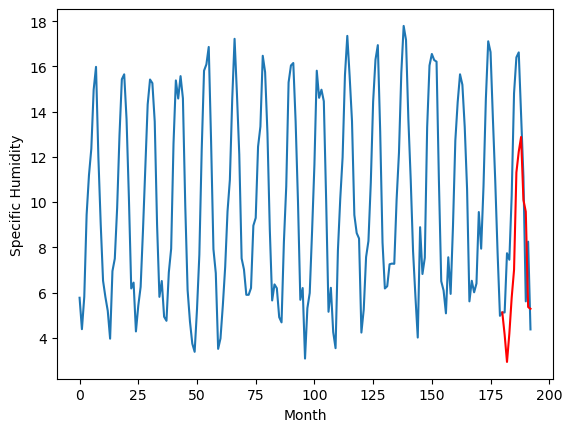

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		4.98		-0.45
5.50		3.78		-1.72
8.14		5.03		-3.11
9.48		6.63		-2.85
13.37		7.85		-5.52
16.56		12.16		-4.40
17.04		13.08		-3.96
17.38		13.73		-3.65
14.29		10.95		-3.34
12.04		10.43		-1.61
7.59		6.21		-1.38
10.51		6.13		-4.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 4.980761129856109, 3.7821250748634334, 5.034903008937835, 6.629522402286529, 7.851465542316436, 12.159600098133087, 13.078006882667541, 13.72824909210205, 10.94511487007141, 10.42584409236908, 6.208021063804626, 6.131023113131523]


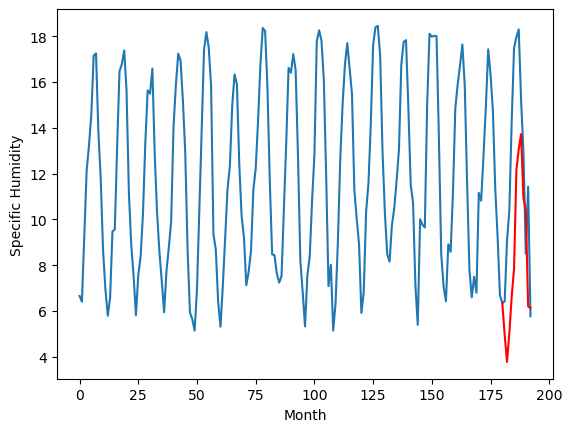

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		5.87		-0.54
6.45		4.67		-1.78
9.17		5.92		-3.25
10.43		7.52		-2.91
14.46		8.74		-5.72
17.87		13.05		-4.82
18.05		13.97		-4.08
18.09		14.62		-3.47
14.99		11.84		-3.15
13.04		11.32		-1.72
8.45		7.10		-1.35
11.38		7.02		-4.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 5.87076112985611, 4.672125074863434, 5.924903008937836, 7.51952240228653, 8.741465542316437, 13.049600098133087, 13.968006882667542, 14.618249092102051, 11.835114870071411, 11.31584409236908, 7.098021063804627, 7.021023113131523]


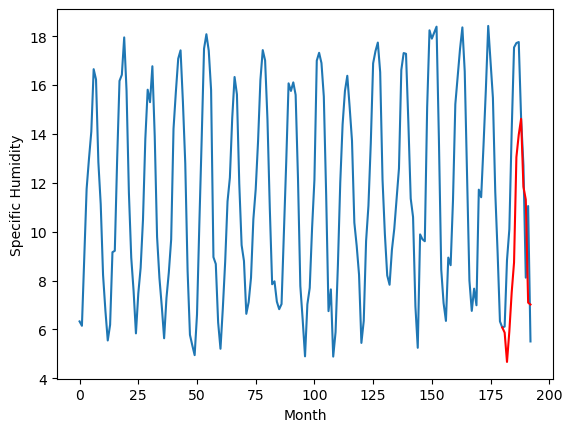

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		5.54		-1.62
6.53		4.34		-2.19
7.32		5.59		-1.73
8.62		7.19		-1.43
12.93		8.41		-4.52
15.10		12.72		-2.38
16.43		13.64		-2.79
16.65		14.29		-2.36
13.11		11.51		-1.60
10.00		10.99		0.99
8.16		6.77		-1.39
7.11		6.69		-0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 5.54076112985611, 4.342125074863434, 5.594903008937836, 7.18952240228653, 8.411465542316437, 12.719600098133087, 13.638006882667542, 14.28824909210205, 11.505114870071411, 10.98584409236908, 6.7680210638046265, 6.691023113131523]


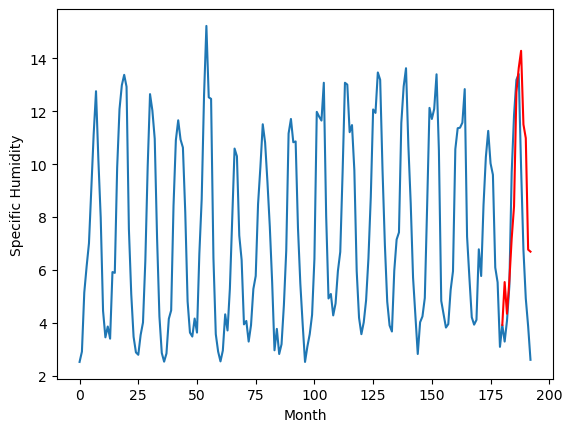

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		1.73		-0.68
2.53		0.53		-2.00
4.09		1.78		-2.31
4.71		3.38		-1.33
7.64		4.60		-3.04
11.99		8.91		-3.08
14.49		9.83		-4.66
14.78		10.48		-4.30
11.43		7.70		-3.73
9.30		7.18		-2.12
3.37		2.96		-0.41
5.24		2.88		-2.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 1.7307611298561096, 0.5321250748634339, 1.7849030089378357, 3.3795224022865296, 4.601465542316436, 8.909600098133087, 9.828006882667541, 10.47824909210205, 7.695114870071411, 7.175844092369079, 2.958021063804626, 2.8810231131315227]


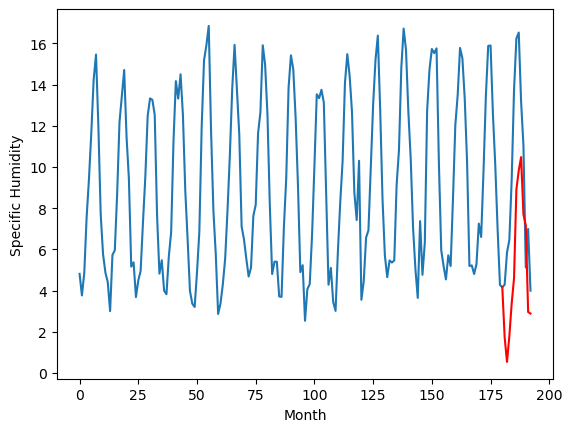

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		4.02		-0.66
4.16		2.82		-1.34
6.89		4.07		-2.82
8.12		5.67		-2.45
11.33		6.89		-4.44
16.09		11.20		-4.89
16.72		12.12		-4.60
16.57		12.77		-3.80
13.32		9.99		-3.33
10.59		9.47		-1.12
6.03		5.25		-0.78
7.67		5.17		-2.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 4.020761129856109, 2.8221250748634334, 4.074903008937835, 5.669522402286529, 6.891465542316436, 11.199600098133086, 12.11800688266754, 12.76824909210205, 9.98511487007141, 9.465844092369078, 5.248021063804625, 5.171023113131522]


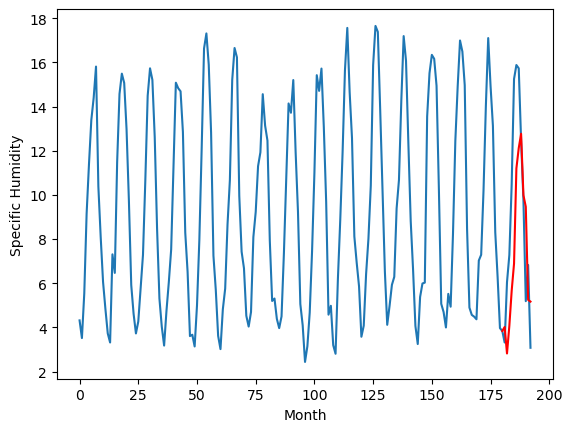

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		3.53		-0.95
3.67		2.33		-1.34
6.28		3.58		-2.70
7.44		5.18		-2.26
11.66		6.40		-5.26
14.80		10.71		-4.09
15.85		11.63		-4.22
15.43		12.28		-3.15
11.86		9.50		-2.36
9.42		8.98		-0.44
5.89		4.76		-1.13
5.28		4.68		-0.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 3.53076112985611, 2.332125074863434, 3.584903008937836, 5.17952240228653, 6.401465542316437, 10.709600098133087, 11.628006882667542, 12.278249092102051, 9.495114870071411, 8.97584409236908, 4.758021063804627, 4.681023113131523]


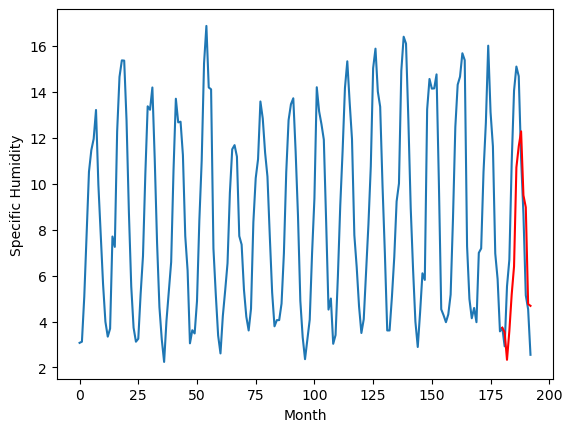

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		2.28		-0.98
2.52		1.08		-1.44
4.34		2.33		-2.01
4.51		3.93		-0.58
9.66		5.15		-4.51
12.65		9.46		-3.19
13.89		10.38		-3.51
12.86		11.03		-1.83
9.90		8.25		-1.65
6.46		7.73		1.27
4.10		3.51		-0.59
3.12		3.43		0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.2807611298561095, 1.0821250748634337, 2.3349030089378355, 3.9295224022865294, 5.151465542316437, 9.459600098133087, 10.378006882667542, 11.028249092102051, 8.245114870071411, 7.72584409236908, 3.5080210638046267, 3.4310231131315234]


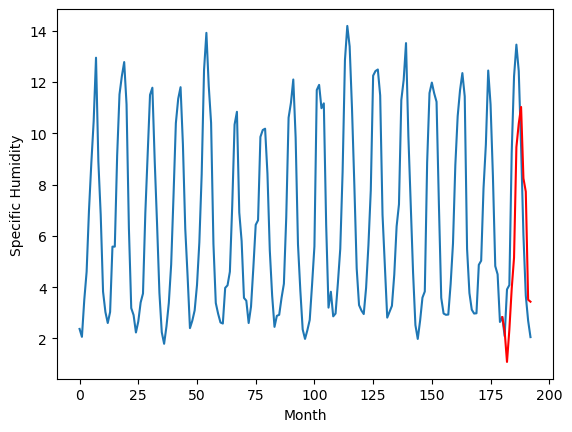

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		1.58		-0.06
1.68		0.38		-1.30
2.92		1.63		-1.29
4.29		3.23		-1.06
5.82		4.45		-1.37
11.14		8.76		-2.38
13.00		9.68		-3.32
13.34		10.33		-3.01
10.15		7.55		-2.60
8.29		7.03		-1.26
3.10		2.81		-0.29
2.98		2.73		-0.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 1.5807611298561097, 0.38212507486343394, 1.6349030089378358, 3.2295224022865296, 4.451465542316437, 8.759600098133088, 9.678006882667542, 10.328249092102052, 7.545114870071412, 7.025844092369081, 2.8080210638046275, 2.731023113131524]


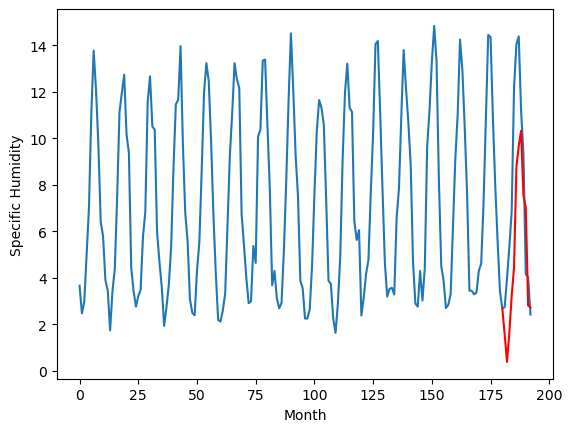

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   1.580761
1                 1    6.45   5.640761
2                 2    5.07   4.130761
3                 3    5.43   4.980761
4                 4    6.41   5.870761
5                 5    7.16   5.540761
6                 6    2.41   1.730761
7                 7    4.68   4.020761
8                 8    4.48   3.530761
9                 9    3.26   2.280761
10               10    1.64   1.580761


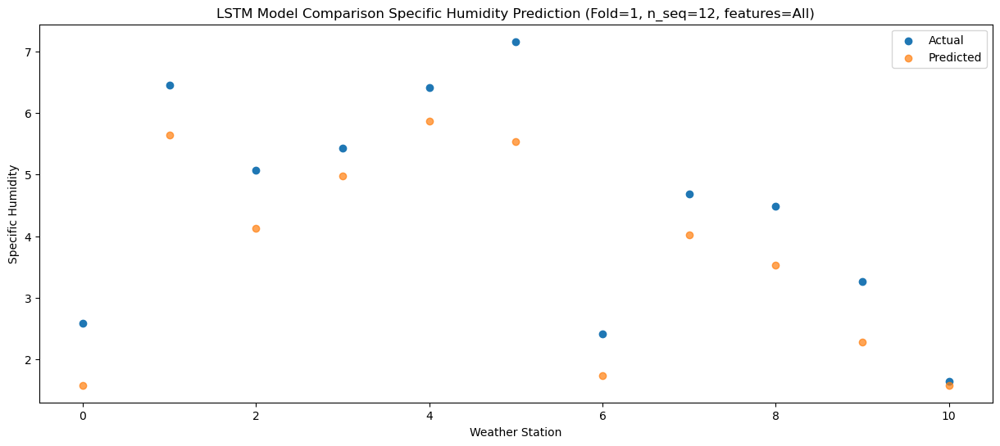

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   0.382125
1                 1    6.64   4.442125
2                 2    5.07   2.932125
3                 3    5.50   3.782125
4                 4    6.45   4.672125
5                 5    6.53   4.342125
6                 6    2.53   0.532125
7                 7    4.16   2.822125
8                 8    3.67   2.332125
9                 9    2.52   1.082125
10               10    1.68   0.382125


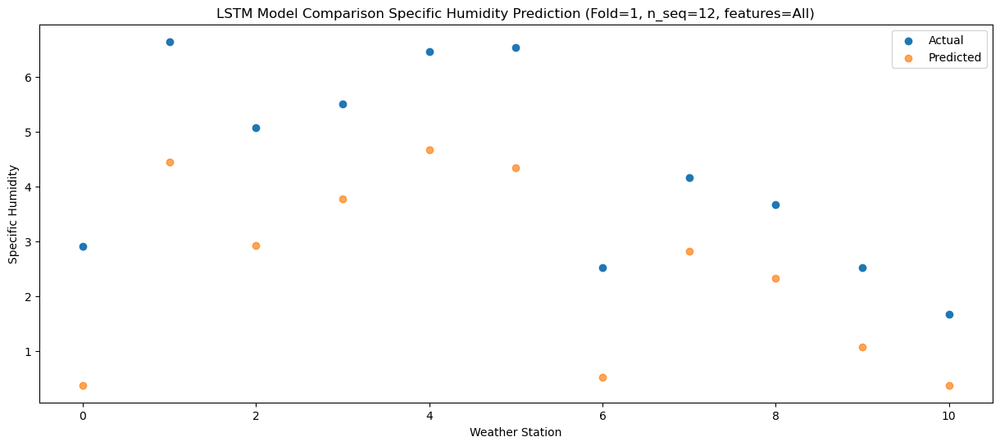

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   1.634903
1                 1    8.17   5.694903
2                 2    7.69   4.184903
3                 3    8.14   5.034903
4                 4    9.17   5.924903
5                 5    7.32   5.594903
6                 6    4.09   1.784903
7                 7    6.89   4.074903
8                 8    6.28   3.584903
9                 9    4.34   2.334903
10               10    2.92   1.634903


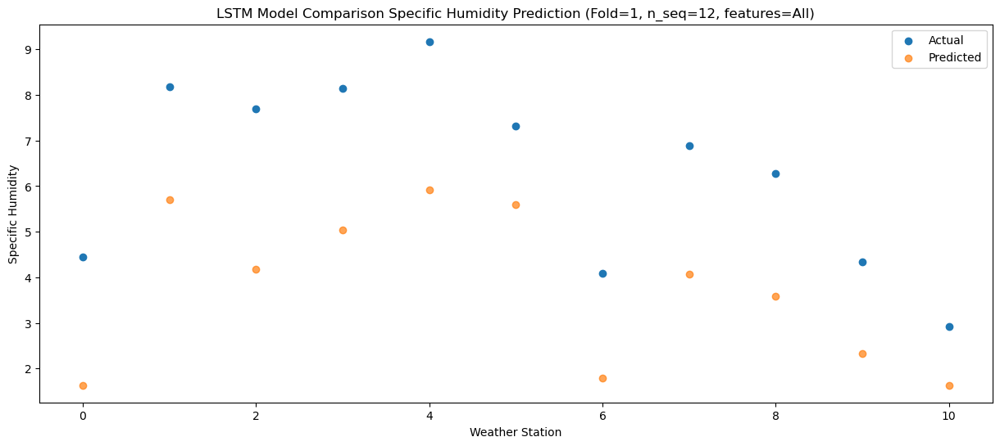

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    4.64   3.229522
1                 1    8.53   7.289522
2                 2    7.40   5.779522
3                 3    9.48   6.629522
4                 4   10.43   7.519522
5                 5    8.62   7.189522
6                 6    4.71   3.379522
7                 7    8.12   5.669522
8                 8    7.44   5.179522
9                 9    4.51   3.929522
10               10    4.29   3.229522


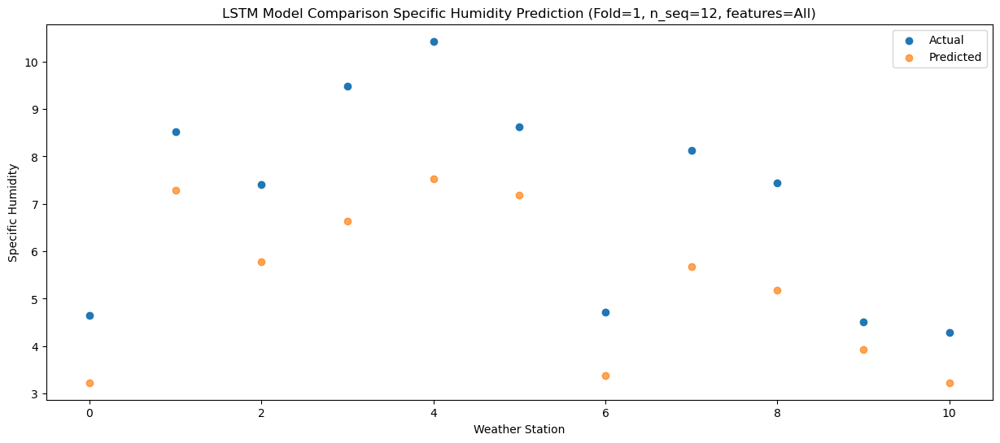

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    7.32   4.451466
1                 1   11.45   8.511466
2                 2   10.24   7.001466
3                 3   13.37   7.851466
4                 4   14.46   8.741466
5                 5   12.93   8.411466
6                 6    7.64   4.601466
7                 7   11.33   6.891466
8                 8   11.66   6.401466
9                 9    9.66   5.151466
10               10    5.82   4.451466


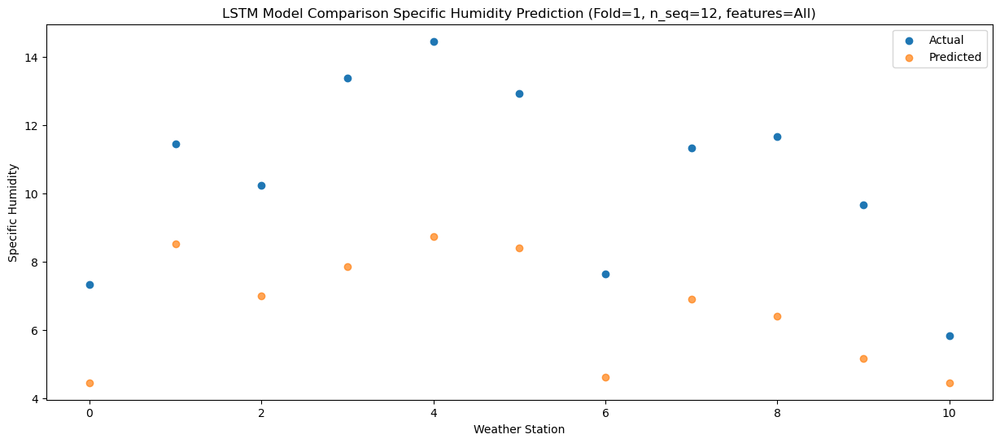

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   12.48     8.7596
1                 1   15.43    12.8196
2                 2   14.76    11.3096
3                 3   16.56    12.1596
4                 4   17.87    13.0496
5                 5   15.10    12.7196
6                 6   11.99     8.9096
7                 7   16.09    11.1996
8                 8   14.80    10.7096
9                 9   12.65     9.4596
10               10   11.14     8.7596


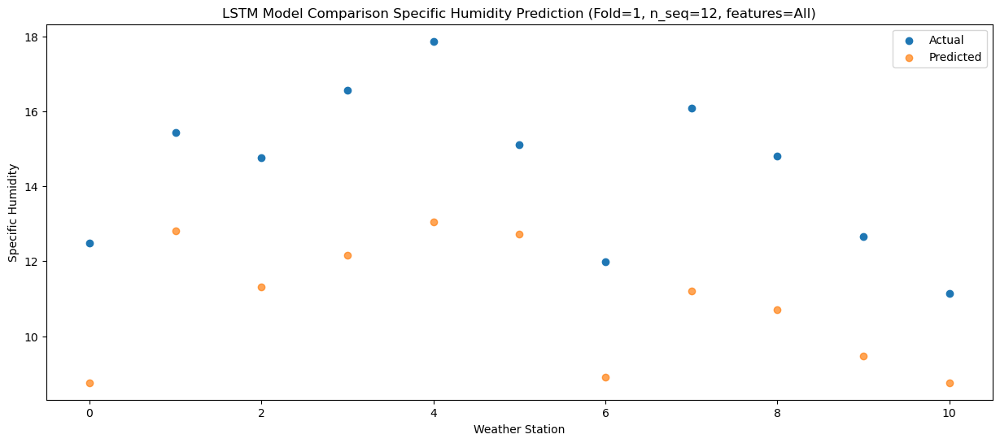

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   13.63   9.678007
1                 1   17.30  13.738007
2                 2   16.35  12.228007
3                 3   17.04  13.078007
4                 4   18.05  13.968007
5                 5   16.43  13.638007
6                 6   14.49   9.828007
7                 7   16.72  12.118007
8                 8   15.85  11.628007
9                 9   13.89  10.378007
10               10   13.00   9.678007


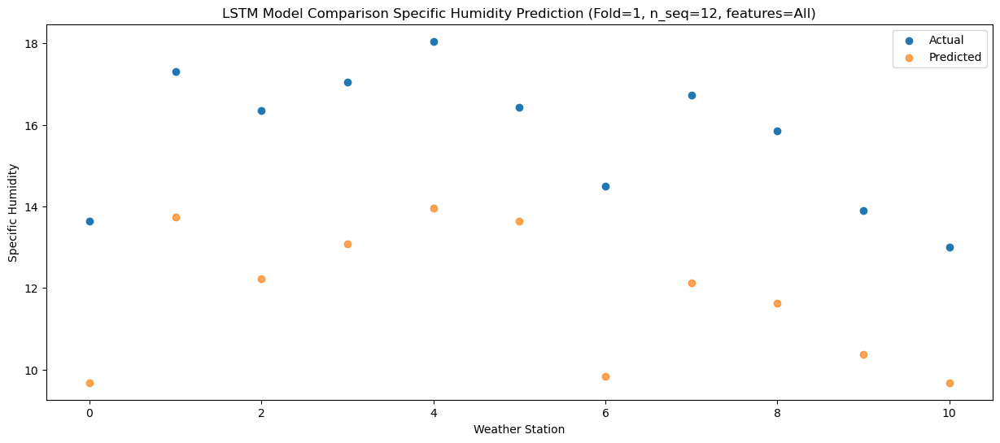

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   14.39  10.328249
1                 1   17.51  14.388249
2                 2   16.57  12.878249
3                 3   17.38  13.728249
4                 4   18.09  14.618249
5                 5   16.65  14.288249
6                 6   14.78  10.478249
7                 7   16.57  12.768249
8                 8   15.43  12.278249
9                 9   12.86  11.028249
10               10   13.34  10.328249


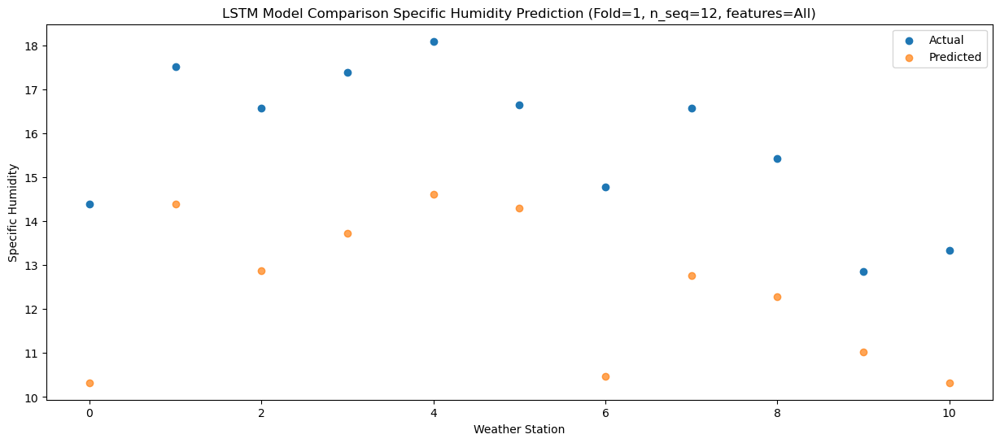

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   10.91   7.545115
1                 1   14.56  11.605115
2                 2   13.81  10.095115
3                 3   14.29  10.945115
4                 4   14.99  11.835115
5                 5   13.11  11.505115
6                 6   11.43   7.695115
7                 7   13.32   9.985115
8                 8   11.86   9.495115
9                 9    9.90   8.245115
10               10   10.15   7.545115


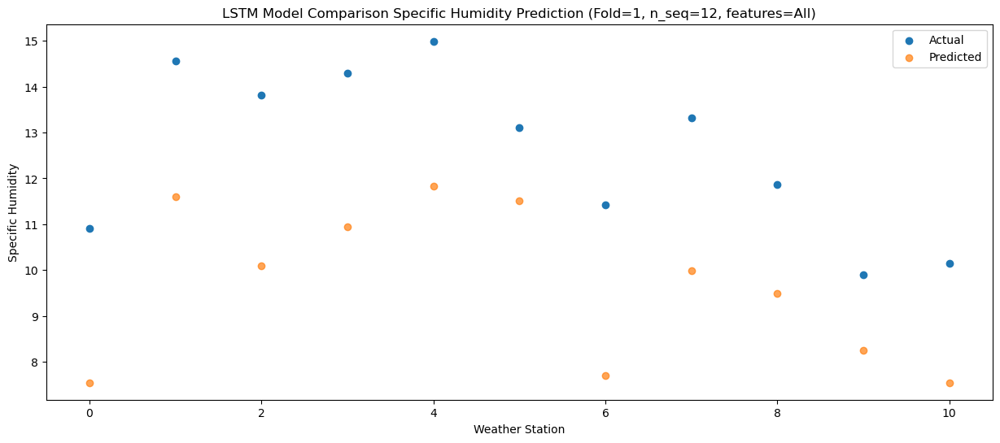

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    8.33   7.025844
1                 1   12.52  11.085844
2                 2   11.06   9.575844
3                 3   12.04  10.425844
4                 4   13.04  11.315844
5                 5   10.00  10.985844
6                 6    9.30   7.175844
7                 7   10.59   9.465844
8                 8    9.42   8.975844
9                 9    6.46   7.725844
10               10    8.29   7.025844


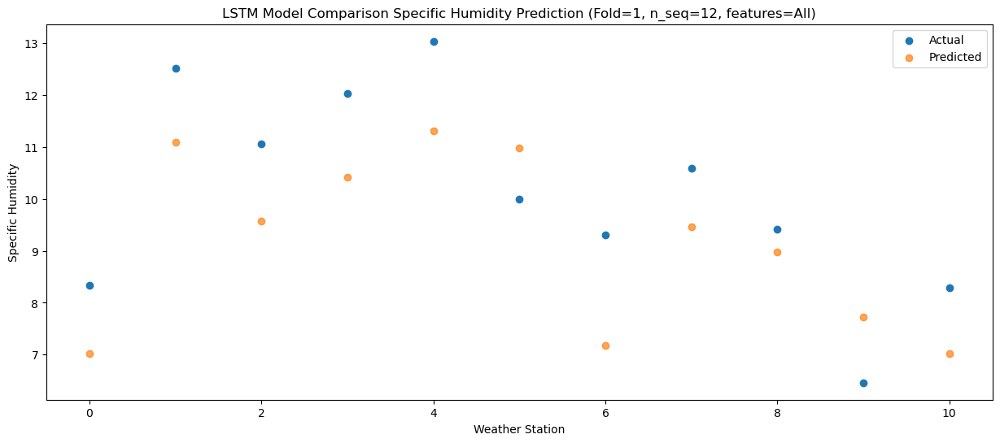

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    2.67   2.808021
1                 1    6.93   6.868021
2                 2    5.56   5.358021
3                 3    7.59   6.208021
4                 4    8.45   7.098021
5                 5    8.16   6.768021
6                 6    3.37   2.958021
7                 7    6.03   5.248021
8                 8    5.89   4.758021
9                 9    4.10   3.508021
10               10    3.10   2.808021


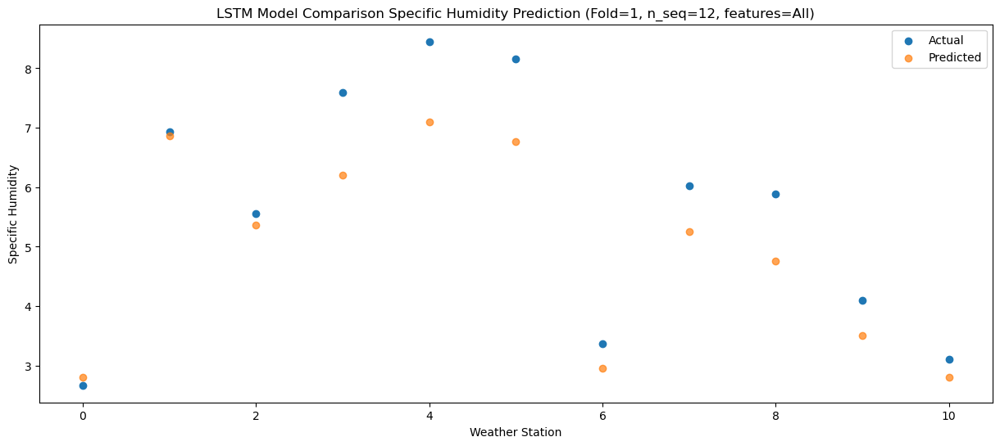

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.78   2.731023
1                 1    9.10   6.791023
2                 2    8.20   5.281023
3                 3   10.51   6.131023
4                 4   11.38   7.021023
5                 5    7.11   6.691023
6                 6    5.24   2.881023
7                 7    7.67   5.171023
8                 8    5.28   4.681023
9                 9    3.12   3.431023
10               10    2.98   2.731023


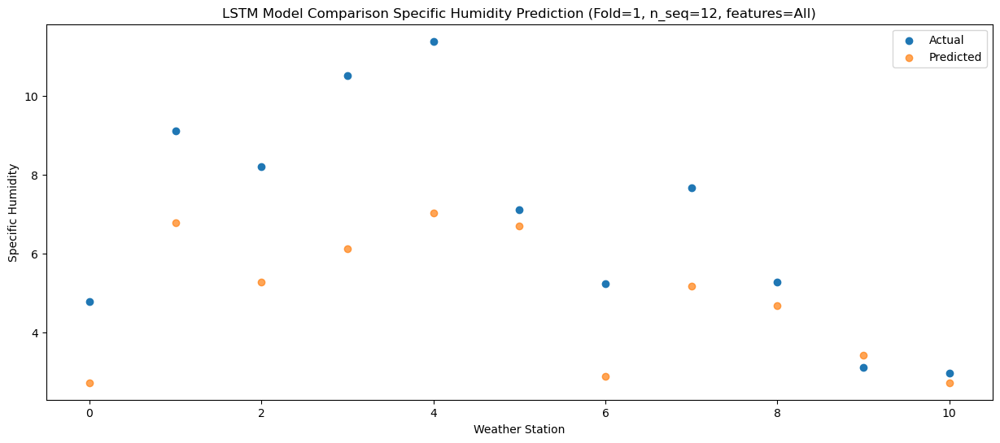

f, t:
[[ 2.59  6.45  5.07  5.43  6.41  7.16  2.41  4.68  4.48  3.26  1.64]
 [ 2.91  6.64  5.07  5.5   6.45  6.53  2.53  4.16  3.67  2.52  1.68]
 [ 4.44  8.17  7.69  8.14  9.17  7.32  4.09  6.89  6.28  4.34  2.92]
 [ 4.64  8.53  7.4   9.48 10.43  8.62  4.71  8.12  7.44  4.51  4.29]
 [ 7.32 11.45 10.24 13.37 14.46 12.93  7.64 11.33 11.66  9.66  5.82]
 [12.48 15.43 14.76 16.56 17.87 15.1  11.99 16.09 14.8  12.65 11.14]
 [13.63 17.3  16.35 17.04 18.05 16.43 14.49 16.72 15.85 13.89 13.  ]
 [14.39 17.51 16.57 17.38 18.09 16.65 14.78 16.57 15.43 12.86 13.34]
 [10.91 14.56 13.81 14.29 14.99 13.11 11.43 13.32 11.86  9.9  10.15]
 [ 8.33 12.52 11.06 12.04 13.04 10.    9.3  10.59  9.42  6.46  8.29]
 [ 2.67  6.93  5.56  7.59  8.45  8.16  3.37  6.03  5.89  4.1   3.1 ]
 [ 4.78  9.1   8.2  10.51 11.38  7.11  5.24  7.67  5.28  3.12  2.98]]
[[ 1.58076113  5.64076113  4.13076113  4.98076113  5.87076113  5.54076113
   1.73076113  4.02076113  3.53076113  2.28076113  1.58076113]
 [ 0.38212507  4.44212507  2

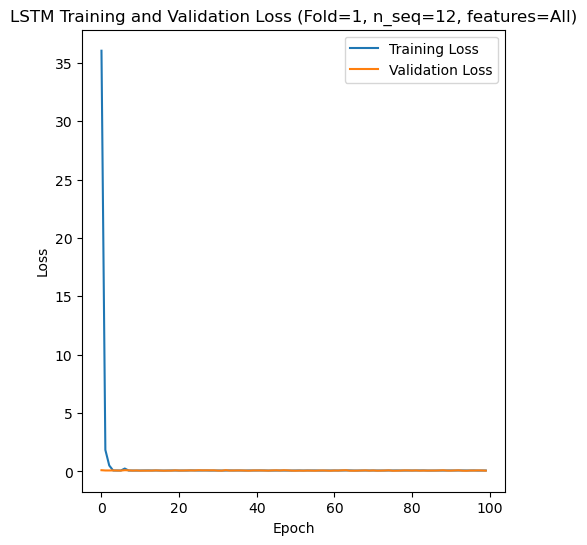

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 34s 158ms/step - loss: 26.8084 - accuracy: 0.4643 - mae: 26.4774 - rmse: 26.8084 - mape: 5890.5615 - pearson: 0.4899 - val_loss: 0.1023 - val_accuracy: 0.0000e+00 - val_mae: 0.0799 - val_rmse: 0.1023 - val_mape: 20.8714 - val_pearson: 0.6081
Epoch 2/100
84/84 [==============================] - 7s 83ms/step - loss: 4.1257 - accuracy: 0.6429 - mae: 4.0916 - rmse: 4.1257 - mape: 851.7147 - pearson: 0.6758 - val_loss: 0.0763 - val_accuracy: 1.0000 - val_mae: 0.0612 - val_rmse: 0.0763 - val_mape: 15.7614 - val_pearson: 0.7768
Epoch 3/100
84/84 [==============================] - 7s 87ms/step - loss: 0.0798 - accuracy: 0.6786 - mae: 0.0643 - rmse: 0.0798 - mape: 14.4979 - pearson: 

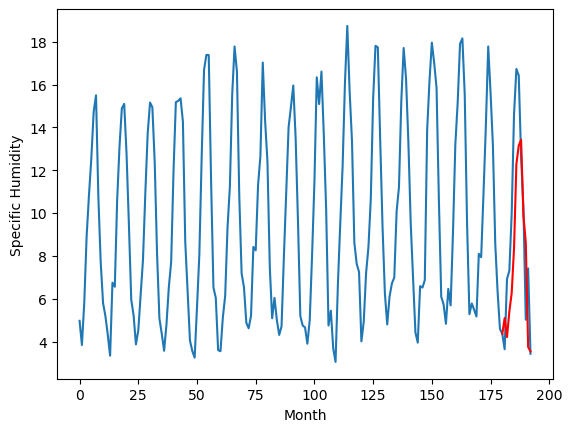

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.01		0.09
4.24		4.12		-0.12
6.09		5.31		-0.78
6.21		6.18		-0.03
11.33		8.28		-3.05
14.24		12.20		-2.04
15.85		13.06		-2.79
14.23		13.34		-0.89
11.41		9.80		-1.61
8.02		8.53		0.51
5.59		3.66		-1.93
4.53		3.45		-1.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 5.006332510411739, 4.1184895572066305, 5.307869249284267, 6.181797438561916, 8.279115134179591, 12.20085781186819, 13.058036142289637, 13.335073584020137, 9.802999132573603, 8.528785341680049, 3.658311479985713, 3.447091886103152]


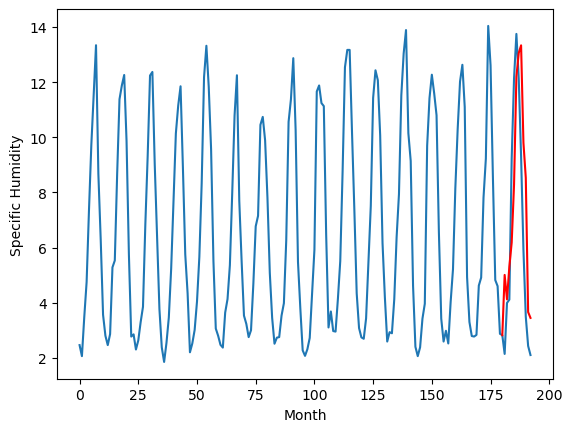

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.50		-0.45
5.08		1.61		-3.47
5.30		2.80		-2.50
6.27		3.67		-2.60
7.58		5.77		-1.81
11.36		9.69		-1.67
11.76		10.55		-1.21
12.38		10.83		-1.55
11.10		7.29		-3.81
8.44		6.02		-2.42
4.49		1.15		-3.34
5.89		0.94		-4.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 2.4963325104117393, 1.6084895572066307, 2.7978692492842674, 3.6717974385619163, 5.769115134179592, 9.690857811868192, 10.54803614228964, 10.825073584020139, 7.292999132573605, 6.018785341680051, 1.1483114799857148, 0.9370918861031541]


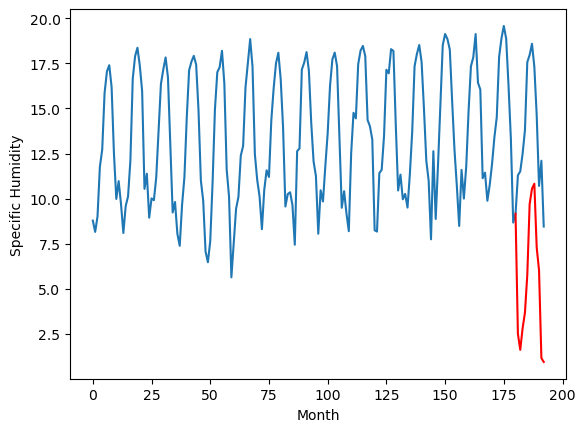

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.82		1.12
7.87		7.93		0.06
8.51		9.12		0.61
9.86		9.99		0.13
11.54		12.09		0.55
16.14		16.01		-0.13
18.74		16.87		-1.87
19.48		17.15		-2.33
16.82		13.61		-3.21
13.86		12.34		-1.52
9.41		7.47		-1.94
9.05		7.26		-1.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 8.816332510411739, 7.92848955720663, 9.117869249284267, 9.991797438561916, 12.089115134179591, 16.010857811868192, 16.86803614228964, 17.14507358402014, 13.612999132573606, 12.338785341680051, 7.468311479985715, 7.257091886103154]


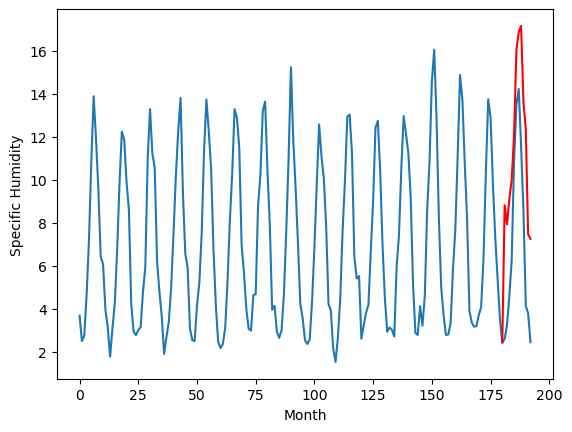

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.73		-0.09
3.80		2.84		-0.96
7.09		4.03		-3.06
7.11		4.90		-2.21
10.31		7.00		-3.31
14.20		10.92		-3.28
15.23		11.78		-3.45
14.83		12.06		-2.77
12.69		8.52		-4.17
10.16		7.25		-2.91
4.50		2.38		-2.12
7.78		2.17		-5.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 3.7263325104117393, 2.8384895572066307, 4.027869249284267, 4.901797438561916, 6.999115134179592, 10.92085781186819, 11.778036142289638, 12.055073584020137, 8.522999132573604, 7.248785341680049, 2.3783114799857135, 2.1670918861031527]


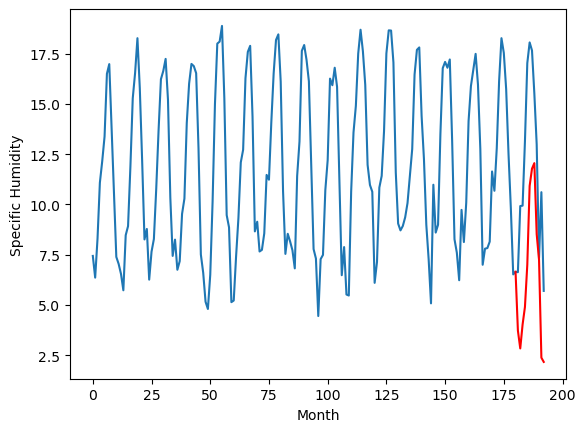

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.48		0.17
7.26		6.59		-0.67
10.25		7.78		-2.47
11.82		8.65		-3.17
16.65		10.75		-5.90
19.29		14.67		-4.62
18.25		15.53		-2.72
18.38		15.81		-2.57
14.82		12.27		-2.55
13.23		11.00		-2.23
9.04		6.13		-2.91
11.91		5.92		-5.99
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 7.47633251041174, 6.588489557206631, 7.777869249284268, 8.651797438561918, 10.749115134179593, 14.670857811868192, 15.52803614228964, 15.805073584020139, 12.272999132573606, 10.998785341680051, 6.128311479985715, 5.9170918861031545]


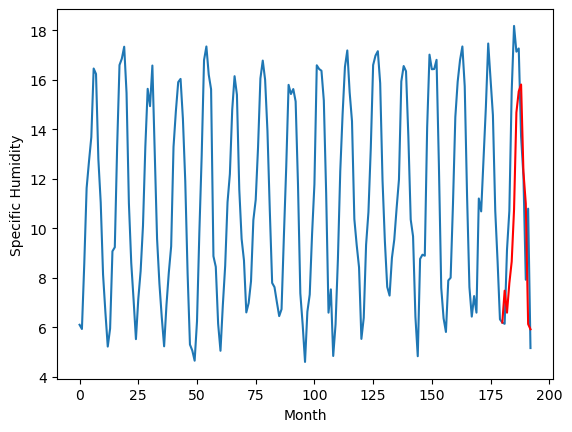

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		6.14		0.14
5.67		5.25		-0.42
8.53		6.44		-2.09
9.85		7.31		-2.54
14.05		9.41		-4.64
17.80		13.33		-4.47
18.62		14.19		-4.43
19.00		14.47		-4.53
14.55		10.93		-3.62
11.94		9.66		-2.28
7.95		4.79		-3.16
10.45		4.58		-5.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 6.136332510411739, 5.24848955720663, 6.437869249284267, 7.311797438561916, 9.409115134179592, 13.33085781186819, 14.188036142289638, 14.465073584020137, 10.932999132573604, 9.65878534168005, 4.788311479985714, 4.577091886103153]


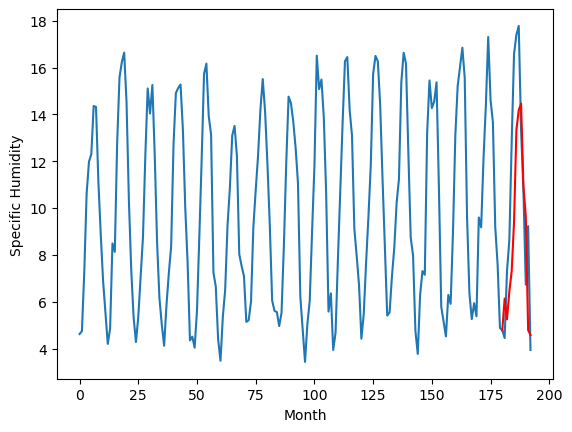

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.66		-0.24
4.77		3.77		-1.00
4.86		4.96		0.10
5.16		5.83		0.67
5.28		7.93		2.65
7.94		11.85		3.91
13.18		12.71		-0.47
13.47		12.99		-0.48
10.71		9.45		-1.26
7.00		8.18		1.18
5.35		3.31		-2.04
5.48		3.10		-2.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.6563325104117395, 3.768489557206631, 4.9578692492842675, 5.8317974385619165, 7.929115134179592, 11.850857811868192, 12.70803614228964, 12.985073584020139, 9.452999132573606, 8.178785341680051, 3.308311479985715, 3.0970918861031542]


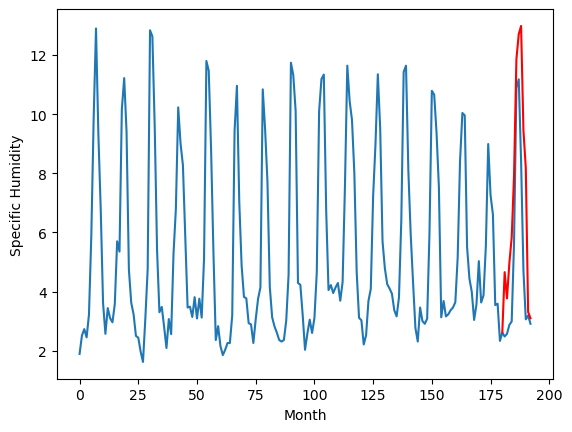

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		1.93		-0.81
3.27		1.04		-2.23
3.38		2.23		-1.15
4.70		3.10		-1.60
6.18		5.20		-0.98
7.43		9.12		1.69
8.58		9.98		1.40
7.98		10.26		2.28
7.52		6.72		-0.80
4.72		5.45		0.73
4.18		0.58		-3.60
4.00		0.37		-3.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 1.9263325104117393, 1.0384895572066306, 2.227869249284267, 3.101797438561916, 5.199115134179592, 9.120857811868191, 9.978036142289639, 10.255073584020138, 6.722999132573605, 5.4487853416800505, 0.5783114799857145, 0.3670918861031538]


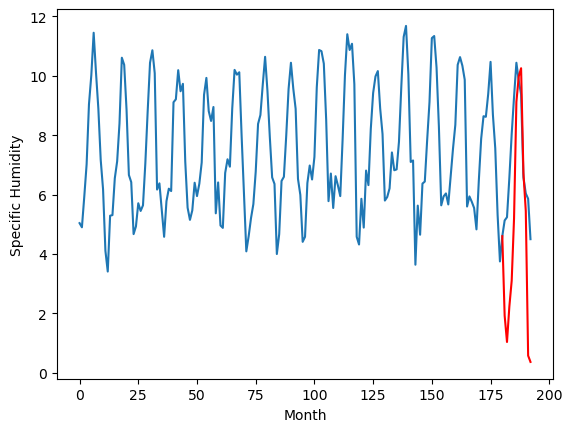

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.08		0.16
4.99		4.19		-0.80
6.72		5.38		-1.34
7.25		6.25		-1.00
9.96		8.35		-1.61
14.46		12.27		-2.19
15.98		13.13		-2.85
16.56		13.41		-3.15
12.96		9.87		-3.09
10.80		8.60		-2.20
5.24		3.73		-1.51
7.09		3.52		-3.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.076332510411739, 4.188489557206631, 5.3778692492842675, 6.251797438561916, 8.349115134179591, 12.27085781186819, 13.128036142289638, 13.405073584020137, 9.872999132573604, 8.598785341680049, 3.728311479985713, 3.5170918861031524]


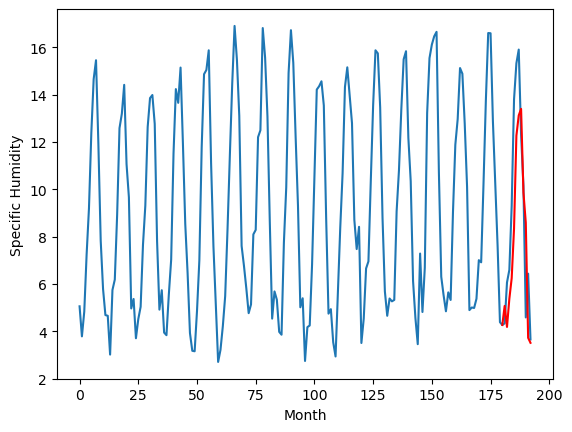

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.10		0.03
5.31		4.21		-1.10
6.34		5.40		-0.94
6.95		6.27		-0.68
9.62		8.37		-1.25
13.72		12.29		-1.43
15.13		13.15		-1.98
15.52		13.43		-2.09
12.31		9.89		-2.42
10.58		8.62		-1.96
5.22		3.75		-1.47
6.78		3.54		-3.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 5.096332510411739, 4.20848955720663, 5.397869249284267, 6.271797438561916, 8.36911513417959, 12.29085781186819, 13.148036142289637, 13.425073584020137, 9.892999132573603, 8.618785341680049, 3.7483114799857127, 3.537091886103152]


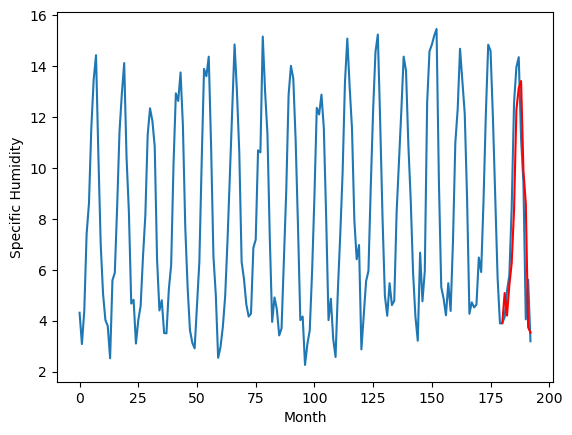

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   5.096333
1                 1    4.92   5.006333
2                 2    2.95   2.496333
3                 3    7.70   8.816333
4                 4    3.82   3.726333
5                 5    7.31   7.476333
6                 6    6.00   6.136333
7                 7    4.90   4.656333
8                 8    2.74   1.926333
9                 9    4.92   5.076333
10               10    5.07   5.096333


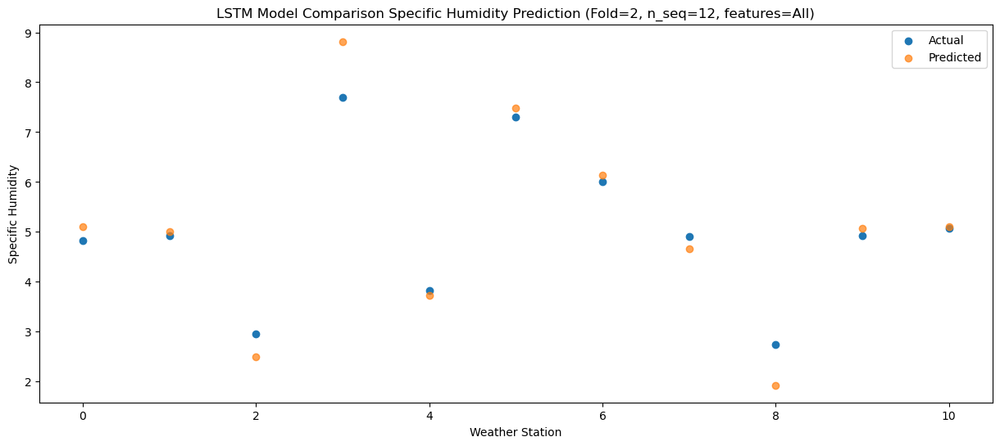

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11    4.20849
1                 1    4.24    4.11849
2                 2    5.08    1.60849
3                 3    7.87    7.92849
4                 4    3.80    2.83849
5                 5    7.26    6.58849
6                 6    5.67    5.24849
7                 7    4.77    3.76849
8                 8    3.27    1.03849
9                 9    4.99    4.18849
10               10    5.31    4.20849


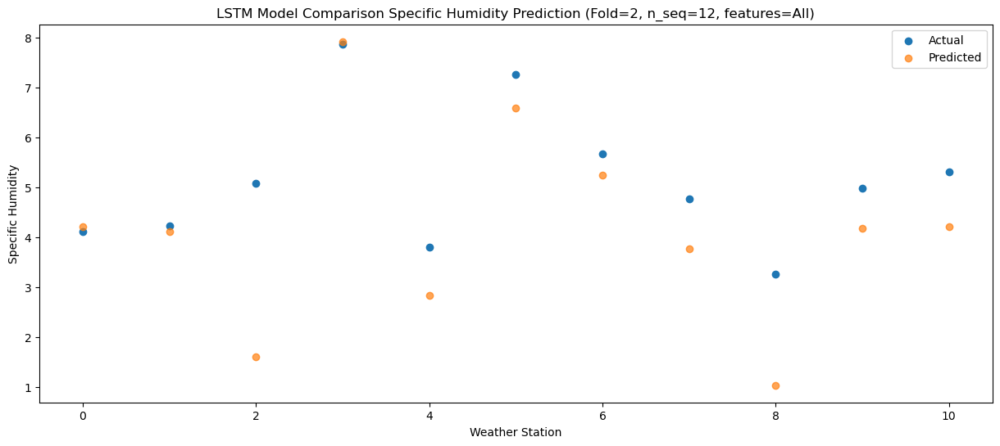

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   5.397869
1                 1    6.09   5.307869
2                 2    5.30   2.797869
3                 3    8.51   9.117869
4                 4    7.09   4.027869
5                 5   10.25   7.777869
6                 6    8.53   6.437869
7                 7    4.86   4.957869
8                 8    3.38   2.227869
9                 9    6.72   5.377869
10               10    6.34   5.397869


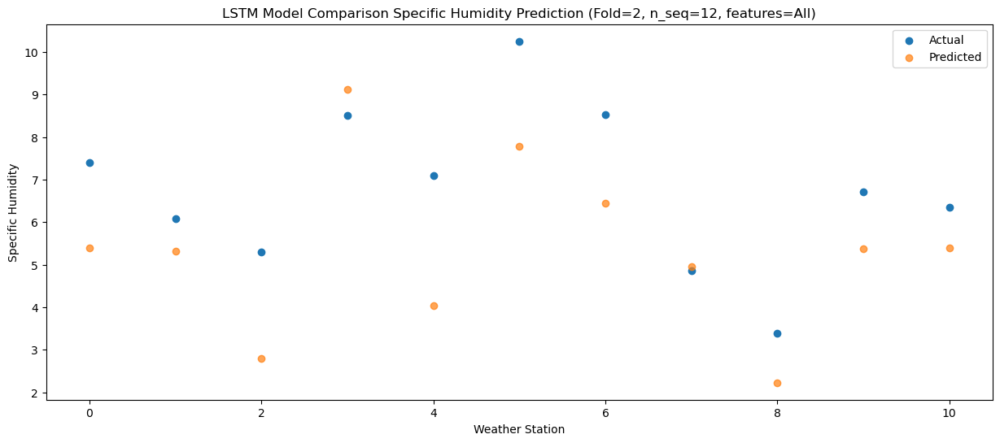

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   6.271797
1                 1    6.21   6.181797
2                 2    6.27   3.671797
3                 3    9.86   9.991797
4                 4    7.11   4.901797
5                 5   11.82   8.651797
6                 6    9.85   7.311797
7                 7    5.16   5.831797
8                 8    4.70   3.101797
9                 9    7.25   6.251797
10               10    6.95   6.271797


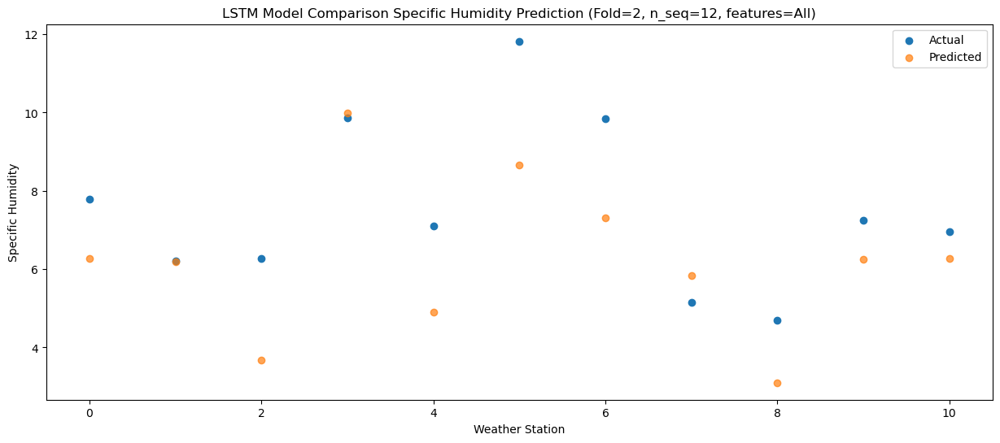

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45   8.369115
1                 1   11.33   8.279115
2                 2    7.58   5.769115
3                 3   11.54  12.089115
4                 4   10.31   6.999115
5                 5   16.65  10.749115
6                 6   14.05   9.409115
7                 7    5.28   7.929115
8                 8    6.18   5.199115
9                 9    9.96   8.349115
10               10    9.62   8.369115


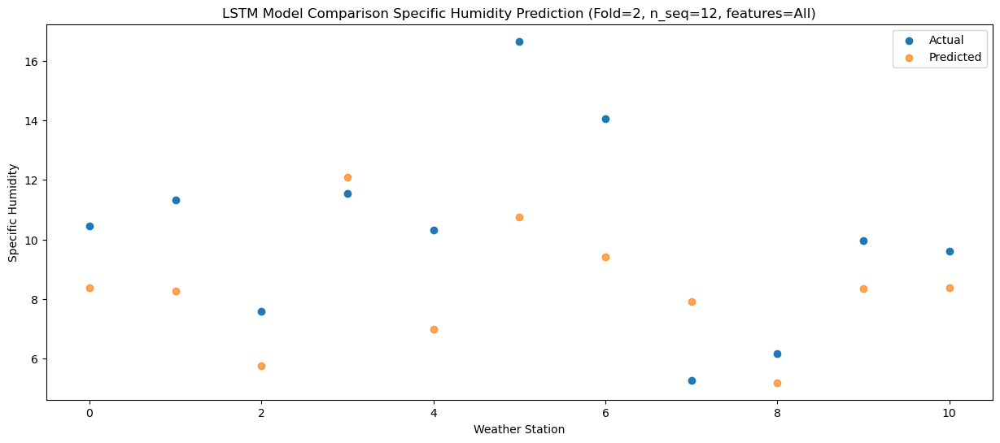

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  12.290858
1                 1   14.24  12.200858
2                 2   11.36   9.690858
3                 3   16.14  16.010858
4                 4   14.20  10.920858
5                 5   19.29  14.670858
6                 6   17.80  13.330858
7                 7    7.94  11.850858
8                 8    7.43   9.120858
9                 9   14.46  12.270858
10               10   13.72  12.290858


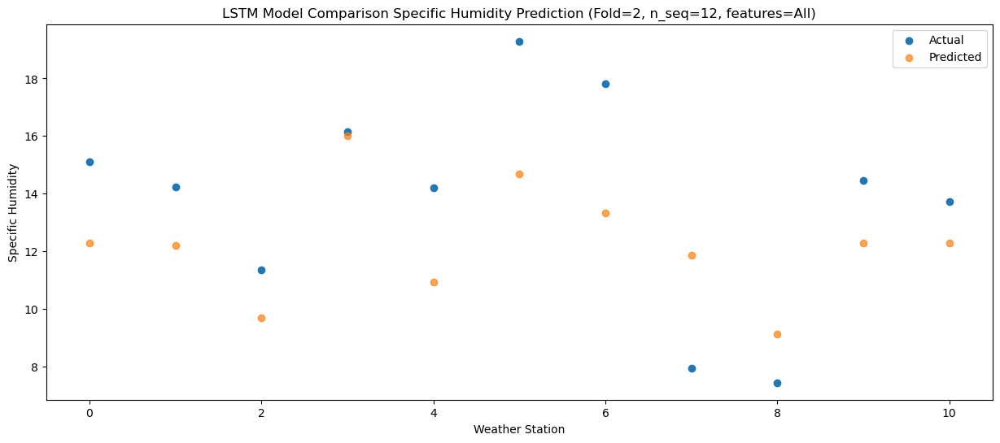

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.20  13.148036
1                 1   15.85  13.058036
2                 2   11.76  10.548036
3                 3   18.74  16.868036
4                 4   15.23  11.778036
5                 5   18.25  15.528036
6                 6   18.62  14.188036
7                 7   13.18  12.708036
8                 8    8.58   9.978036
9                 9   15.98  13.128036
10               10   15.13  13.148036


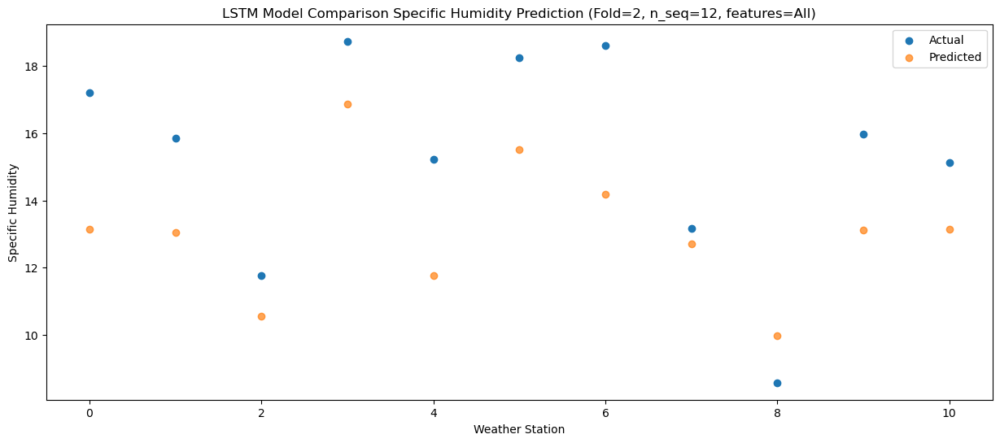

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.90  13.425074
1                 1   14.23  13.335074
2                 2   12.38  10.825074
3                 3   19.48  17.145074
4                 4   14.83  12.055074
5                 5   18.38  15.805074
6                 6   19.00  14.465074
7                 7   13.47  12.985074
8                 8    7.98  10.255074
9                 9   16.56  13.405074
10               10   15.52  13.425074


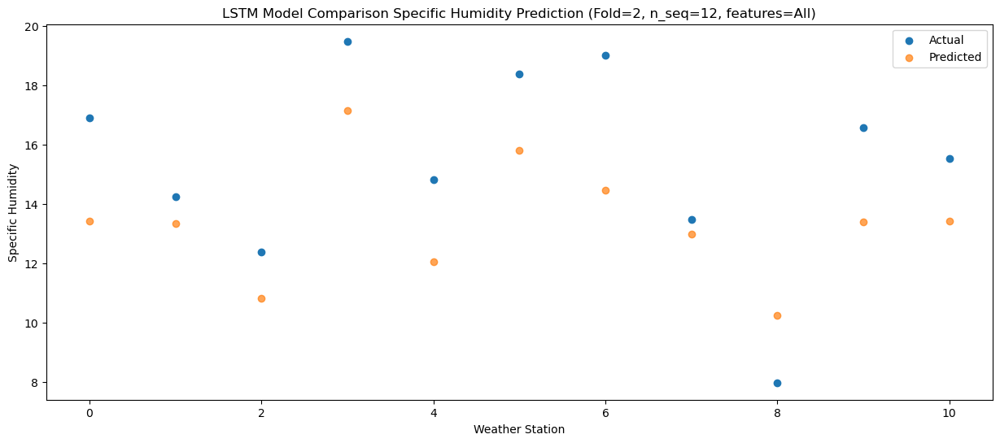

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.13   9.892999
1                 1   11.41   9.802999
2                 2   11.10   7.292999
3                 3   16.82  13.612999
4                 4   12.69   8.522999
5                 5   14.82  12.272999
6                 6   14.55  10.932999
7                 7   10.71   9.452999
8                 8    7.52   6.722999
9                 9   12.96   9.872999
10               10   12.31   9.892999


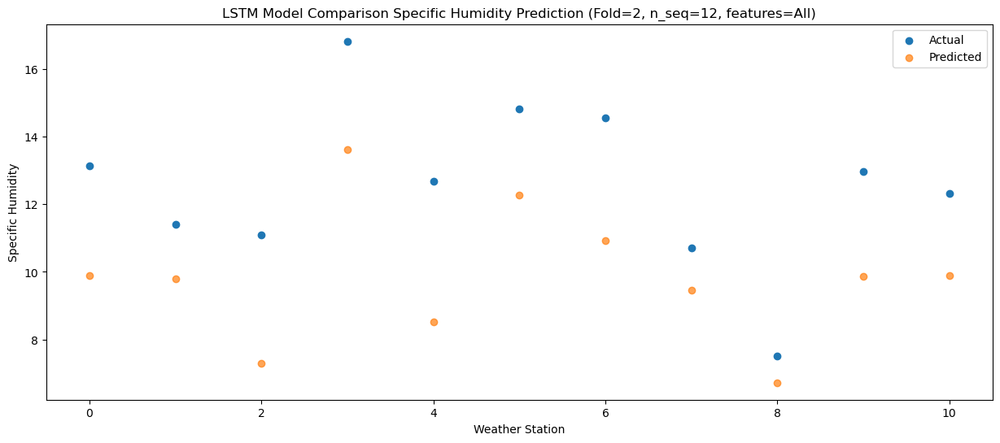

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.68   8.618785
1                 1    8.02   8.528785
2                 2    8.44   6.018785
3                 3   13.86  12.338785
4                 4   10.16   7.248785
5                 5   13.23  10.998785
6                 6   11.94   9.658785
7                 7    7.00   8.178785
8                 8    4.72   5.448785
9                 9   10.80   8.598785
10               10   10.58   8.618785


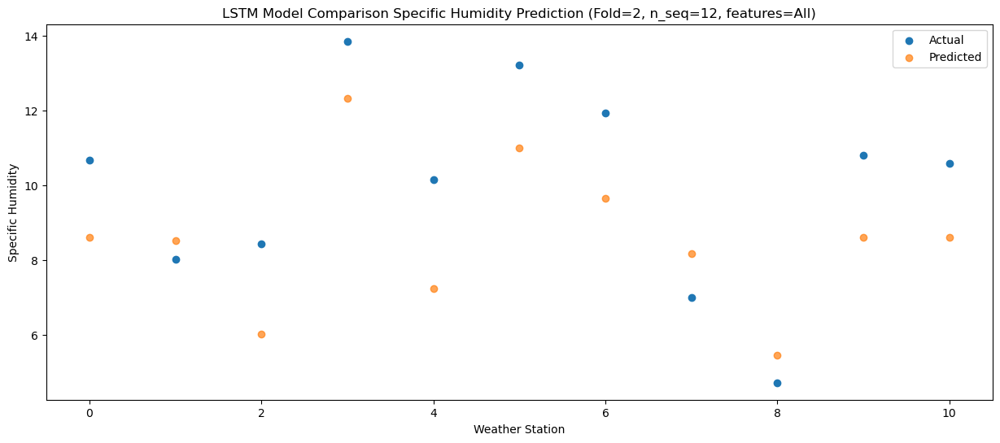

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.49   3.748311
1                 1    5.59   3.658311
2                 2    4.49   1.148311
3                 3    9.41   7.468311
4                 4    4.50   2.378311
5                 5    9.04   6.128311
6                 6    7.95   4.788311
7                 7    5.35   3.308311
8                 8    4.18   0.578311
9                 9    5.24   3.728311
10               10    5.22   3.748311


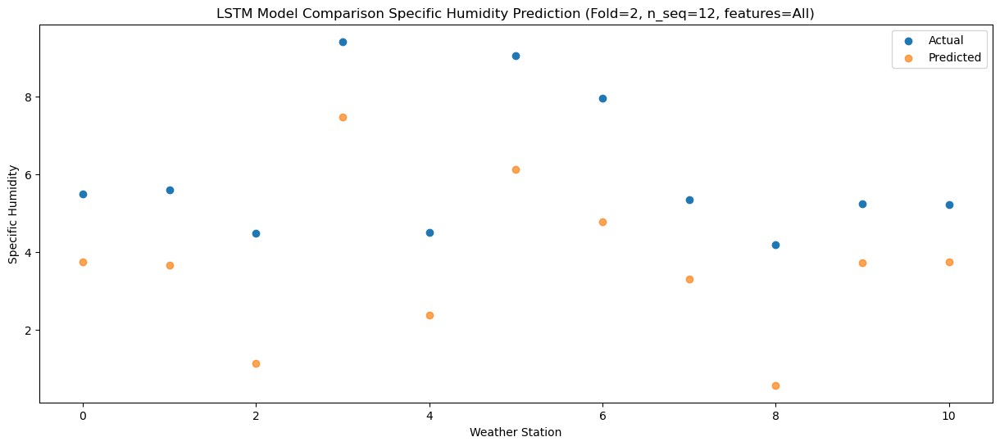

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.89   3.537092
1                 1    4.53   3.447092
2                 2    5.89   0.937092
3                 3    9.05   7.257092
4                 4    7.78   2.167092
5                 5   11.91   5.917092
6                 6   10.45   4.577092
7                 7    5.48   3.097092
8                 8    4.00   0.367092
9                 9    7.09   3.517092
10               10    6.78   3.537092


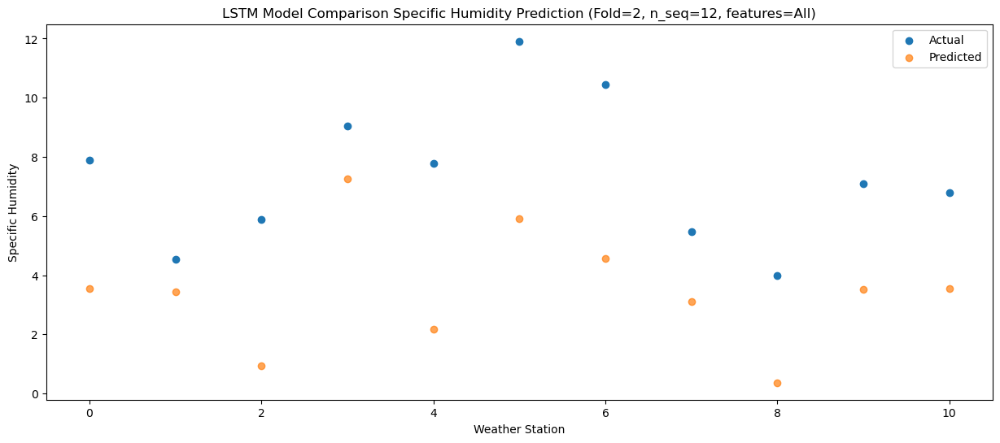

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]
 [17.2  15.85 11.76 18.74 15.23 18.25 18.62 13.18  8.58 15.98 15.13]
 [16.9  14.23 12.38 19.48 14.83 18.38 19.   13.47  7.98 16.56 15.52]
 [13.13 11.41 11.1  16.82 12.69 14.82 14.55 10.71  7.52 12.96 12.31]
 [10.68  8.02  8.44 13.86 10.16 13.23 11.94  7.    4.72 10.8  10.58]
 [ 5.49  5.59  4.49  9.41  4.5   9.04  7.95  5.35  4.18  5.24  5.22]
 [ 7.89  4.53  5.89  9.05  7.78 11.91 10.45  5.48  4.    7.09  6.78]]
[[ 5.09633251  5.00633251  2.49633251  8.81633251  3.72633251  7.47633251
   6.13633251  4.65633251  1.92633251  5.07633251  5.09633251]
 [ 4.20848956  4.11848956  1

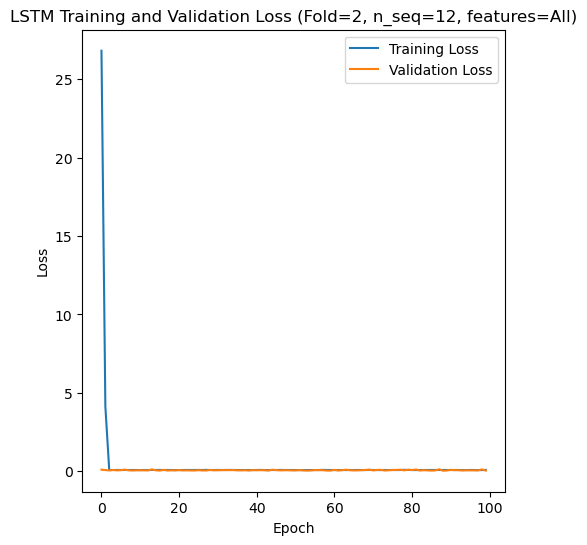

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 13s 93ms/step - loss: 19.8186 - accuracy: 0.4643 - mae: 19.4398 - rmse: 19.8186 - mape: 4296.1792 - pearson: 0.5789 - val_loss: 0.0862 - val_accuracy: 0.1000 - val_mae: 0.0727 - val_rmse: 0.0862 - val_mape: 17.5168 - val_pearson: 0.5928
Epoch 2/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0785 - accuracy: 0.6310 - mae: 0.0631 - rmse: 0.0785 - mape: 14.6447 - pearson: 0.7675 - val_loss: 0.1029 - val_accuracy: 0.9000 - val_mae: 0.0838 - val_rmse: 0.1029 - val_mape: 17.4985 - val_pearson: 0.6905
Epoch 3/100
84/84 [==============================] - 5s 64ms/step - loss: 0.0739 - accuracy: 0.7024 - mae: 0.0597 - rmse: 0.0739 - mape: 13.4359 - pearson: 0.7747

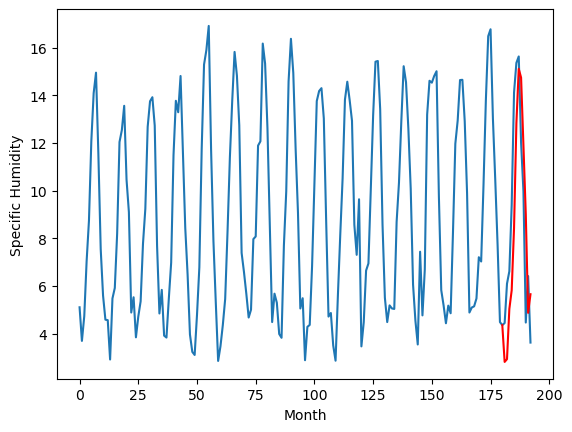

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		4.22		-0.80
4.46		4.34		-0.12
6.97		6.44		-0.53
8.14		7.22		-0.92
11.66		9.84		-1.82
16.19		14.22		-1.97
17.07		16.51		-0.56
17.24		16.14		-1.10
13.27		13.30		0.03
11.08		10.41		-0.67
6.65		6.28		-0.37
7.62		7.06		-0.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 4.218526229858399, 4.3350070795416835, 6.439635880887509, 7.224680133759976, 9.837256141602992, 14.223365970551967, 16.511222310960292, 16.142375924289226, 13.296793439090251, 10.414430596530437, 6.2779173633456224, 7.057584323585033]


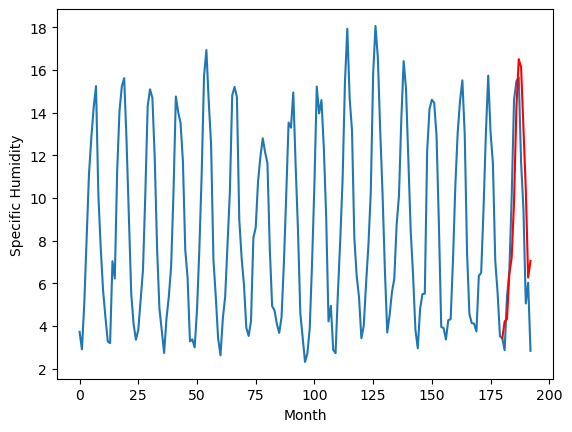

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		2.84		-1.33
4.11		2.96		-1.15
4.19		5.06		0.87
4.81		5.84		1.03
5.21		8.46		3.25
7.66		12.84		5.18
8.36		15.13		6.77
7.89		14.76		6.87
6.60		11.92		5.32
5.46		9.03		3.57
6.04		4.90		-1.14
4.54		5.68		1.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 2.8385262298583984, 2.955007079541683, 5.059635880887509, 5.844680133759976, 8.457256141602993, 12.843365970551968, 15.131222310960293, 14.762375924289227, 11.916793439090252, 9.034430596530438, 4.897917363345623, 5.677584323585034]


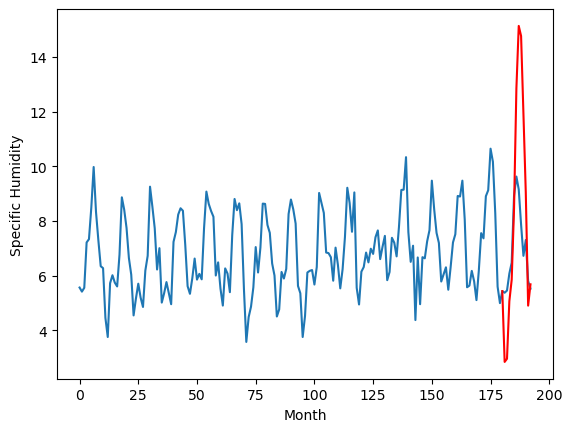

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		4.67		-0.62
5.22		4.79		-0.43
6.52		6.89		0.37
7.71		7.67		-0.04
10.24		10.29		0.05
15.66		14.67		-0.99
16.29		16.96		0.67
17.17		16.59		-0.58
13.70		13.75		0.05
11.64		10.86		-0.78
5.95		6.73		0.78
7.09		7.51		0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 4.668526229858398, 4.785007079541683, 6.889635880887508, 7.674680133759975, 10.287256141602992, 14.673365970551966, 16.96122231096029, 16.592375924289225, 13.74679343909025, 10.864430596530436, 6.727917363345622, 7.507584323585032]


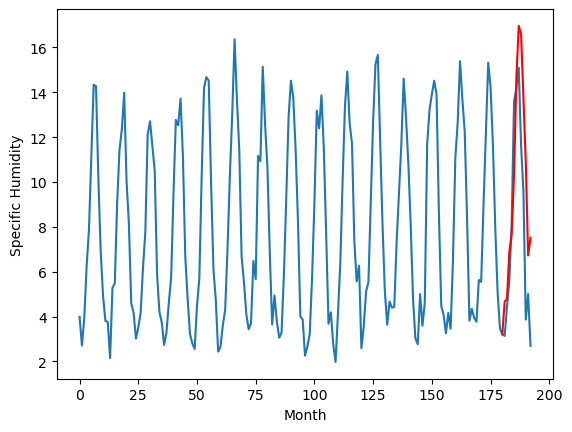

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		3.10		-0.69
2.96		3.22		0.26
5.44		5.32		-0.12
6.50		6.10		-0.40
8.92		8.72		-0.20
13.38		13.10		-0.28
15.33		15.39		0.06
15.42		15.02		-0.40
11.65		12.18		0.53
9.70		9.29		-0.41
4.58		5.16		0.58
5.28		5.94		0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 3.0985262298583987, 3.2150070795416834, 5.319635880887509, 6.104680133759976, 8.717256141602993, 13.103365970551968, 15.391222310960293, 15.022375924289227, 12.176793439090252, 9.294430596530438, 5.157917363345623, 5.937584323585034]


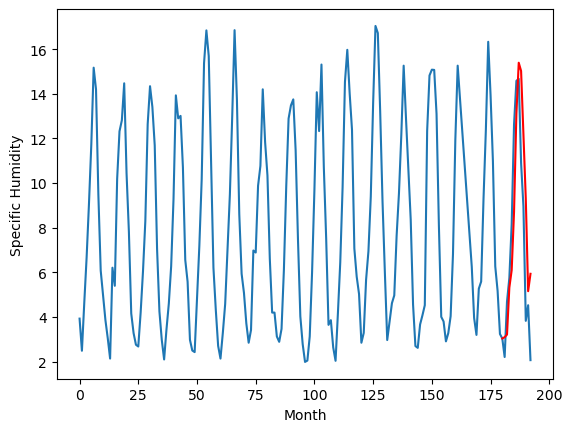

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.04		-0.58
3.10		3.16		0.06
5.13		5.26		0.13
6.43		6.04		-0.39
8.67		8.66		-0.01
13.89		13.04		-0.85
15.14		15.33		0.19
15.31		14.96		-0.35
12.01		12.12		0.11
10.39		9.23		-1.16
4.52		5.10		0.58
5.57		5.88		0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.0385262298583986, 3.1550070795416834, 5.259635880887508, 6.044680133759975, 8.657256141602993, 13.043365970551967, 15.331222310960293, 14.962375924289226, 12.116793439090252, 9.234430596530437, 5.097917363345623, 5.877584323585033]


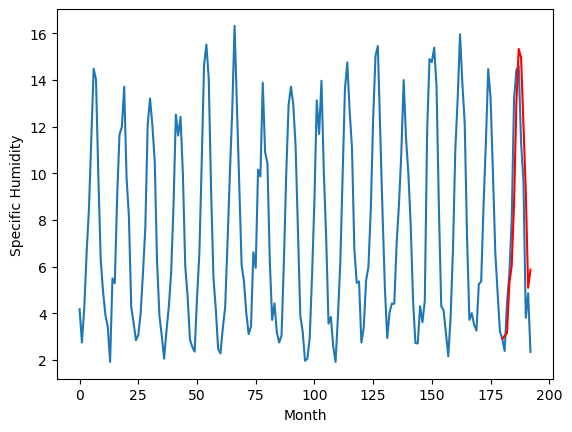

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.29		-1.06
4.41		3.41		-1.00
4.72		5.51		0.79
5.19		6.29		1.10
6.59		8.91		2.32
7.92		13.29		5.37
10.37		15.58		5.21
8.94		15.21		6.27
7.24		12.37		5.13
6.15		9.48		3.33
5.44		5.35		-0.09
4.73		6.13		1.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 3.288526229858398, 3.405007079541683, 5.509635880887508, 6.294680133759975, 8.907256141602993, 13.293365970551967, 15.581222310960293, 15.212375924289226, 12.366793439090252, 9.484430596530437, 5.347917363345623, 6.127584323585033]


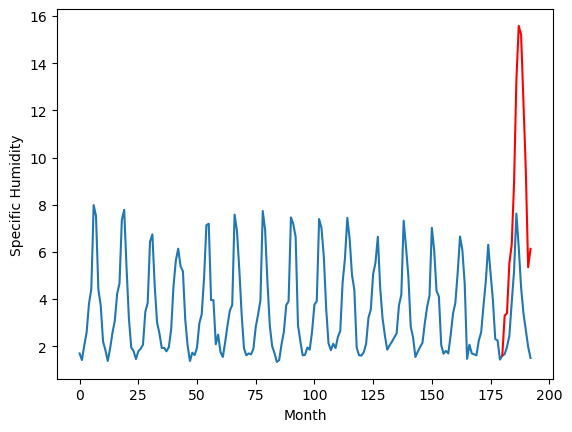

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		0.80		-1.70
2.02		0.92		-1.10
2.32		3.02		0.70
2.01		3.80		1.79
2.57		6.42		3.85
3.99		10.80		6.81
9.35		13.09		3.74
6.92		12.72		5.80
5.20		9.88		4.68
4.10		6.99		2.89
2.83		2.86		0.03
2.97		3.64		0.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 0.7985262298583984, 0.9150070795416831, 3.0196358808875083, 3.8046801337599754, 6.4172561416029925, 10.803365970551967, 13.091222310960292, 12.722375924289226, 9.876793439090251, 6.994430596530437, 2.8579173633456225, 3.637584323585033]


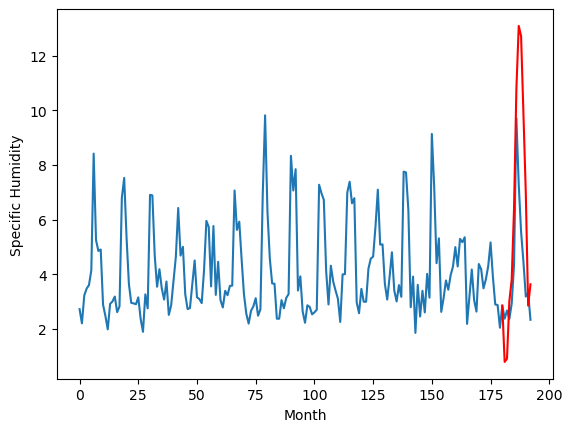

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		1.84		-1.56
3.05		1.96		-1.09
2.70		4.06		1.36
3.63		4.84		1.21
4.07		7.46		3.39
5.50		11.84		6.34
5.98		14.13		8.15
6.37		13.76		7.39
5.73		10.92		5.19
4.70		8.03		3.33
4.92		3.90		-1.02
3.67		4.68		1.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 1.8385262298583984, 1.9550070795416832, 4.059635880887509, 4.844680133759976, 7.457256141602993, 11.843365970551968, 14.131222310960293, 13.762375924289227, 10.916793439090252, 8.034430596530438, 3.8979173633456234, 4.677584323585034]


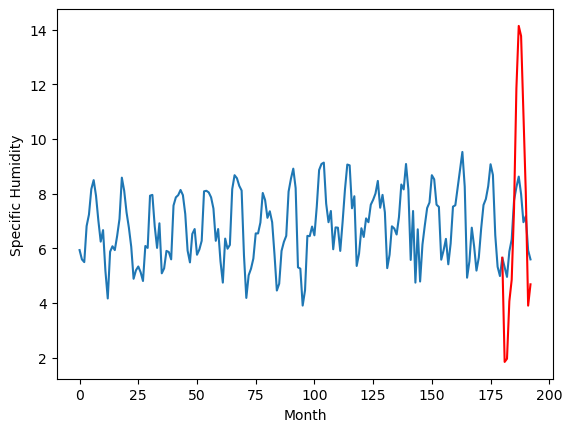

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.04		0.20
4.99		5.16		0.17
5.77		7.26		1.49
7.15		8.04		0.89
8.72		10.66		1.94
13.62		15.04		1.42
15.83		17.33		1.50
16.21		16.96		0.75
13.61		14.12		0.51
11.07		11.23		0.16
6.54		7.10		0.56
6.24		7.88		1.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 5.038526229858398, 5.155007079541683, 7.259635880887508, 8.044680133759975, 10.657256141602993, 15.043365970551967, 17.331222310960293, 16.962375924289226, 14.116793439090252, 11.234430596530437, 7.097917363345623, 7.877584323585033]


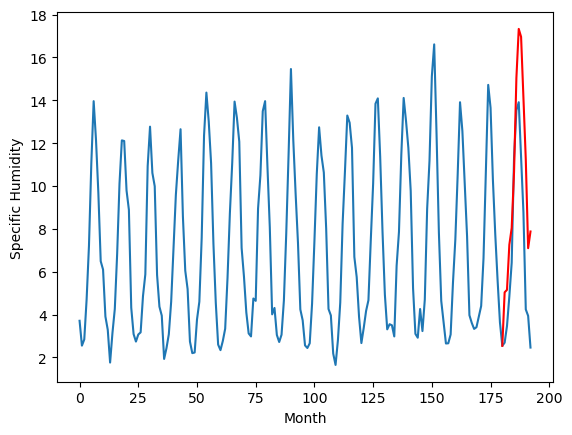

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		2.82		-0.20
2.88		2.94		0.06
4.16		5.04		0.88
5.57		5.82		0.25
7.16		8.44		1.28
12.03		12.82		0.79
13.72		15.11		1.39
14.04		14.74		0.70
11.12		11.90		0.78
9.22		9.01		-0.21
4.30		4.88		0.58
4.20		5.66		1.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 2.8185262298583984, 2.935007079541683, 5.039635880887508, 5.824680133759975, 8.437256141602994, 12.823365970551968, 15.111222310960294, 14.742375924289227, 11.896793439090253, 9.014430596530438, 4.877917363345624, 5.657584323585034]


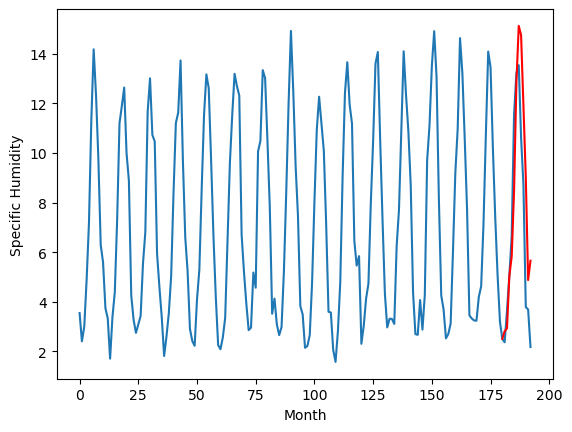

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   2.818526
1                 1    5.02   4.218526
2                 2    4.17   2.838526
3                 3    5.29   4.668526
4                 4    3.79   3.098526
5                 5    3.62   3.038526
6                 6    4.35   3.288526
7                 7    2.50   0.798526
8                 8    3.40   1.838526
9                 9    4.84   5.038526
10               10    3.02   2.818526


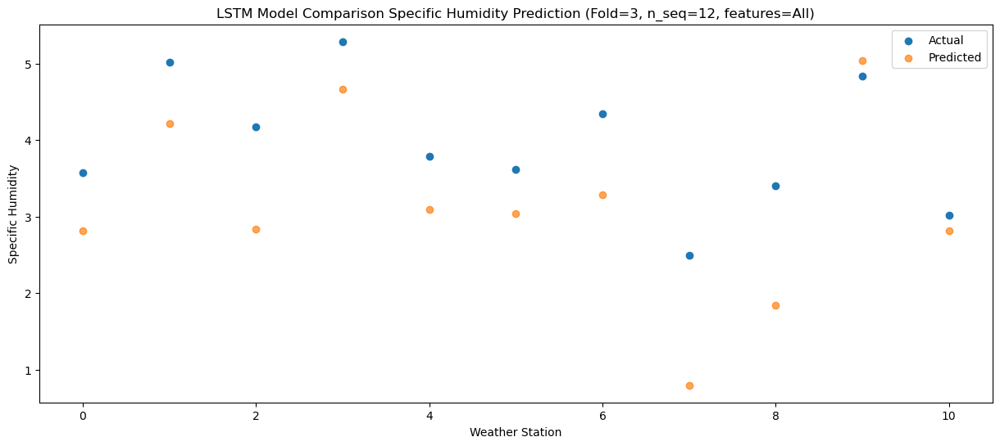

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   2.935007
1                 1    4.46   4.335007
2                 2    4.11   2.955007
3                 3    5.22   4.785007
4                 4    2.96   3.215007
5                 5    3.10   3.155007
6                 6    4.41   3.405007
7                 7    2.02   0.915007
8                 8    3.05   1.955007
9                 9    4.99   5.155007
10               10    2.88   2.935007


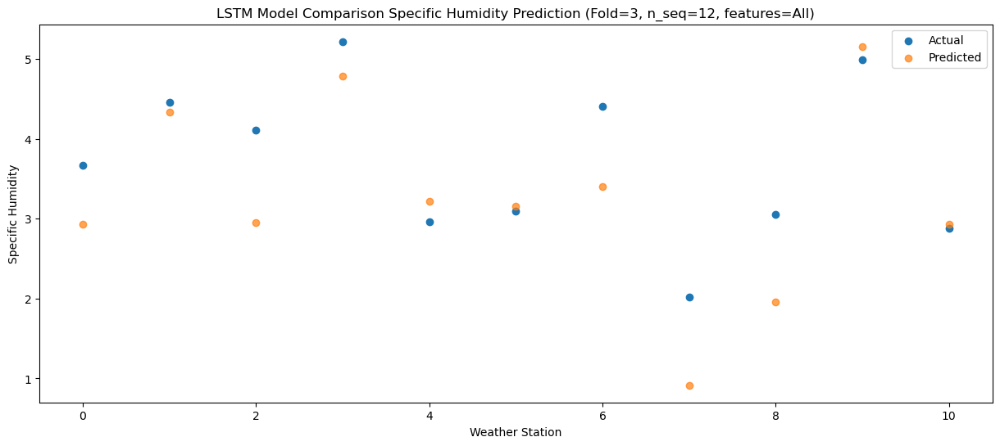

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   5.039636
1                 1    6.97   6.439636
2                 2    4.19   5.059636
3                 3    6.52   6.889636
4                 4    5.44   5.319636
5                 5    5.13   5.259636
6                 6    4.72   5.509636
7                 7    2.32   3.019636
8                 8    2.70   4.059636
9                 9    5.77   7.259636
10               10    4.16   5.039636


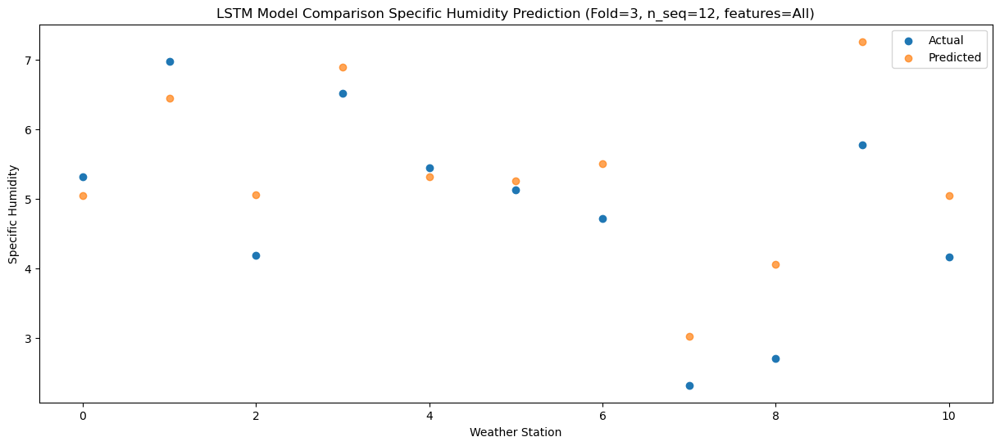

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84    5.82468
1                 1    8.14    7.22468
2                 2    4.81    5.84468
3                 3    7.71    7.67468
4                 4    6.50    6.10468
5                 5    6.43    6.04468
6                 6    5.19    6.29468
7                 7    2.01    3.80468
8                 8    3.63    4.84468
9                 9    7.15    8.04468
10               10    5.57    5.82468


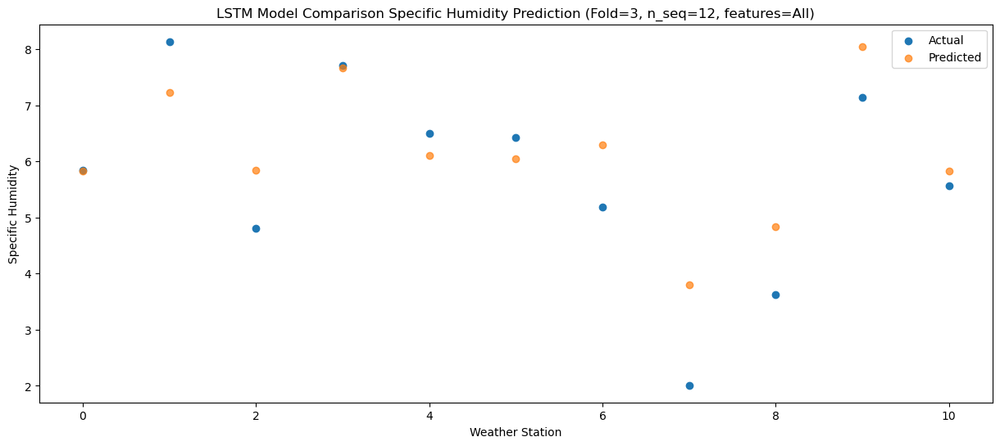

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62   8.437256
1                 1   11.66   9.837256
2                 2    5.21   8.457256
3                 3   10.24  10.287256
4                 4    8.92   8.717256
5                 5    8.67   8.657256
6                 6    6.59   8.907256
7                 7    2.57   6.417256
8                 8    4.07   7.457256
9                 9    8.72  10.657256
10               10    7.16   8.437256


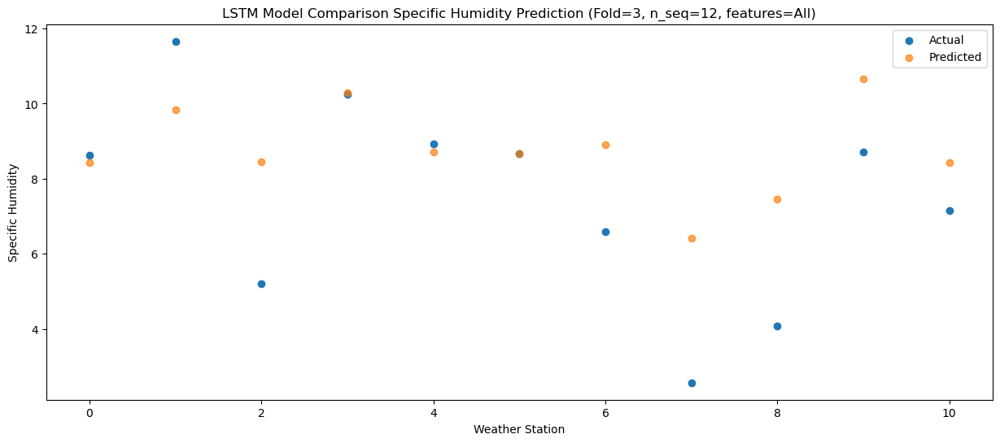

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  12.823366
1                 1   16.19  14.223366
2                 2    7.66  12.843366
3                 3   15.66  14.673366
4                 4   13.38  13.103366
5                 5   13.89  13.043366
6                 6    7.92  13.293366
7                 7    3.99  10.803366
8                 8    5.50  11.843366
9                 9   13.62  15.043366
10               10   12.03  12.823366


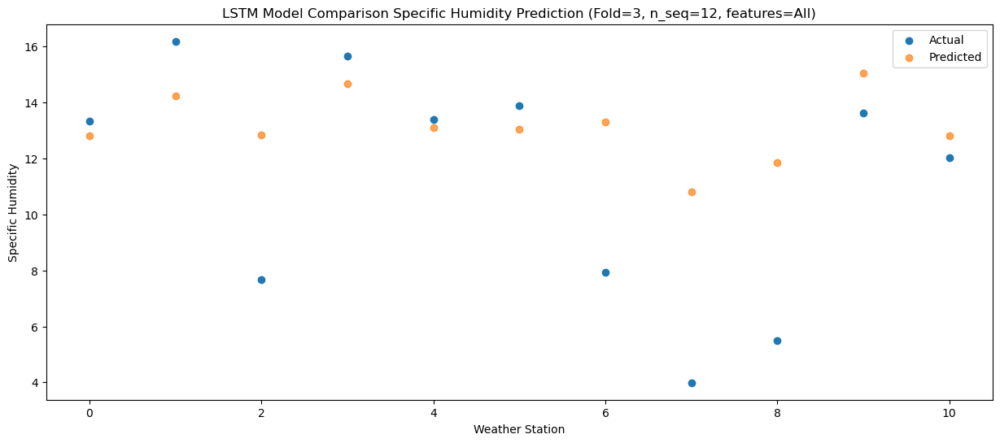

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   14.58  15.111222
1                 1   17.07  16.511222
2                 2    8.36  15.131222
3                 3   16.29  16.961222
4                 4   15.33  15.391222
5                 5   15.14  15.331222
6                 6   10.37  15.581222
7                 7    9.35  13.091222
8                 8    5.98  14.131222
9                 9   15.83  17.331222
10               10   13.72  15.111222


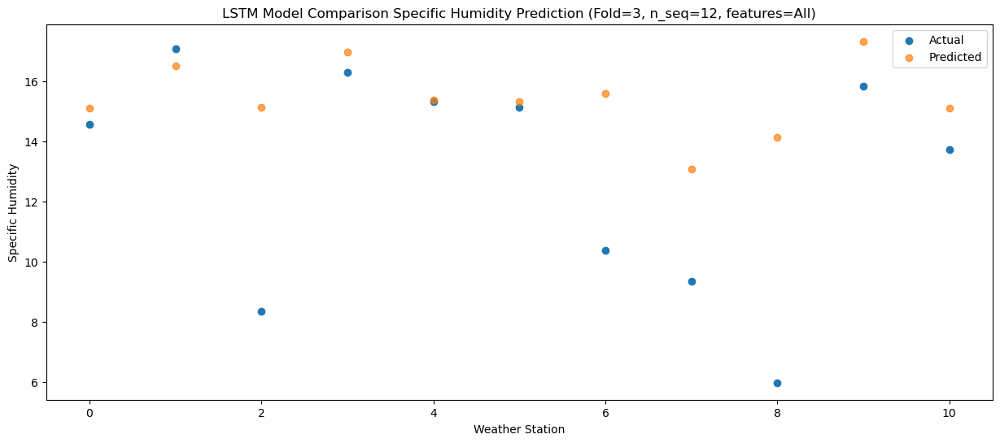

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   14.85  14.742376
1                 1   17.24  16.142376
2                 2    7.89  14.762376
3                 3   17.17  16.592376
4                 4   15.42  15.022376
5                 5   15.31  14.962376
6                 6    8.94  15.212376
7                 7    6.92  12.722376
8                 8    6.37  13.762376
9                 9   16.21  16.962376
10               10   14.04  14.742376


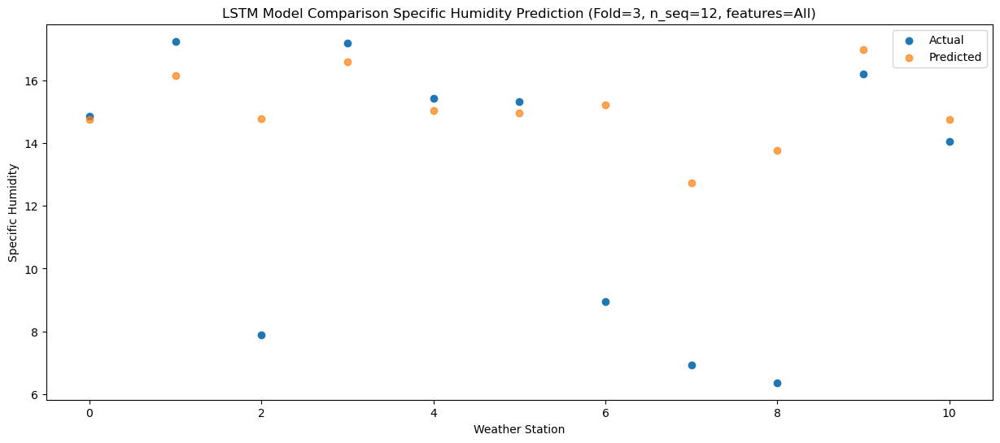

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   11.23  11.896793
1                 1   13.27  13.296793
2                 2    6.60  11.916793
3                 3   13.70  13.746793
4                 4   11.65  12.176793
5                 5   12.01  12.116793
6                 6    7.24  12.366793
7                 7    5.20   9.876793
8                 8    5.73  10.916793
9                 9   13.61  14.116793
10               10   11.12  11.896793


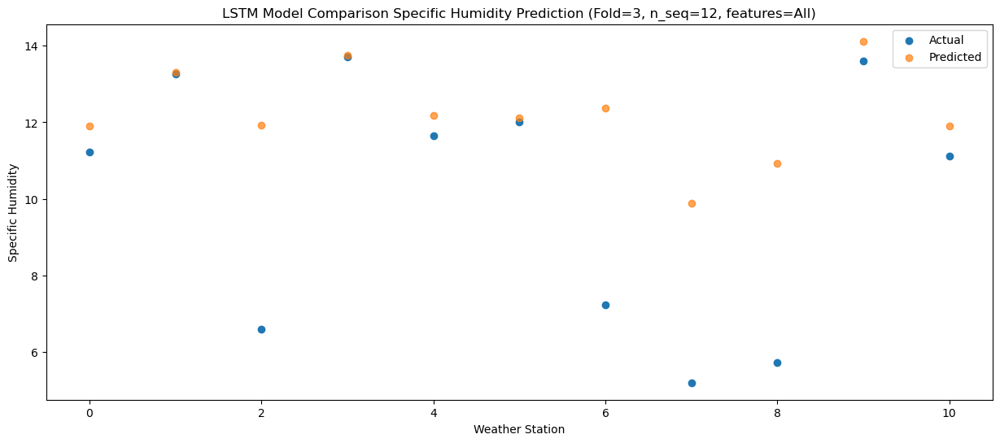

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    9.19   9.014431
1                 1   11.08  10.414431
2                 2    5.46   9.034431
3                 3   11.64  10.864431
4                 4    9.70   9.294431
5                 5   10.39   9.234431
6                 6    6.15   9.484431
7                 7    4.10   6.994431
8                 8    4.70   8.034431
9                 9   11.07  11.234431
10               10    9.22   9.014431


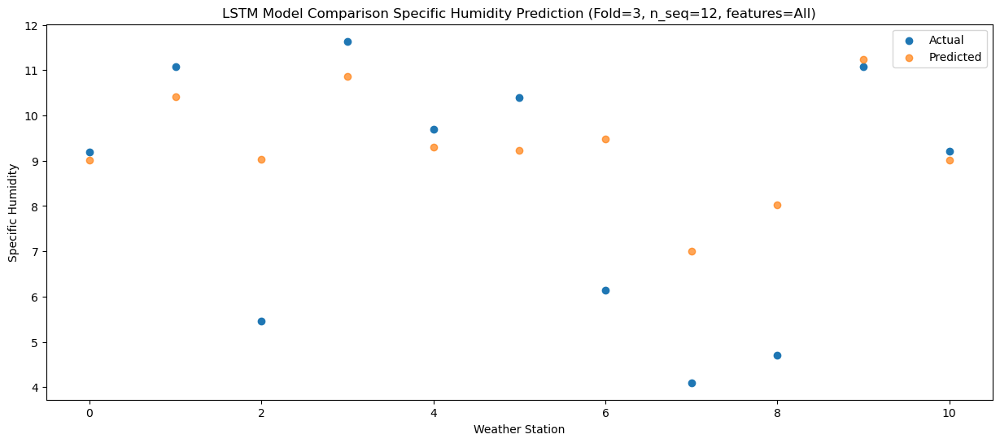

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    3.69   4.877917
1                 1    6.65   6.277917
2                 2    6.04   4.897917
3                 3    5.95   6.727917
4                 4    4.58   5.157917
5                 5    4.52   5.097917
6                 6    5.44   5.347917
7                 7    2.83   2.857917
8                 8    4.92   3.897917
9                 9    6.54   7.097917
10               10    4.30   4.877917


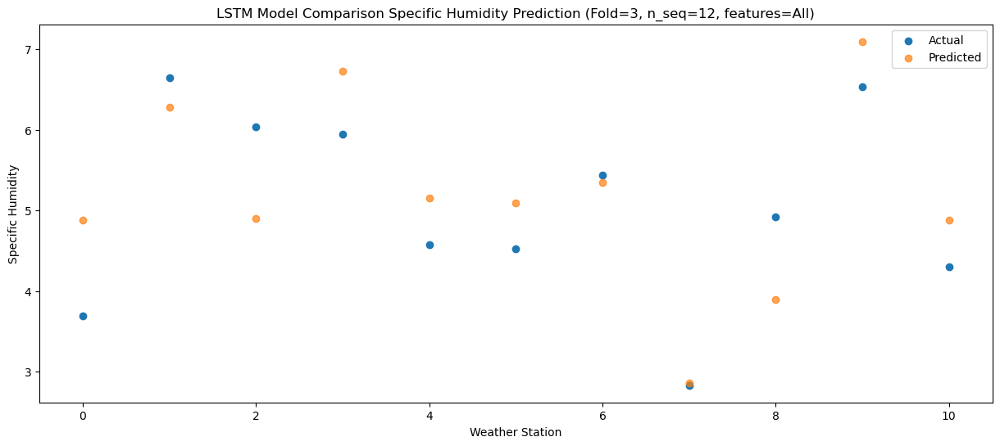

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    5.64   5.657584
1                 1    7.62   7.057584
2                 2    4.54   5.677584
3                 3    7.09   7.507584
4                 4    5.28   5.937584
5                 5    5.57   5.877584
6                 6    4.73   6.127584
7                 7    2.97   3.637584
8                 8    3.67   4.677584
9                 9    6.24   7.877584
10               10    4.20   5.657584


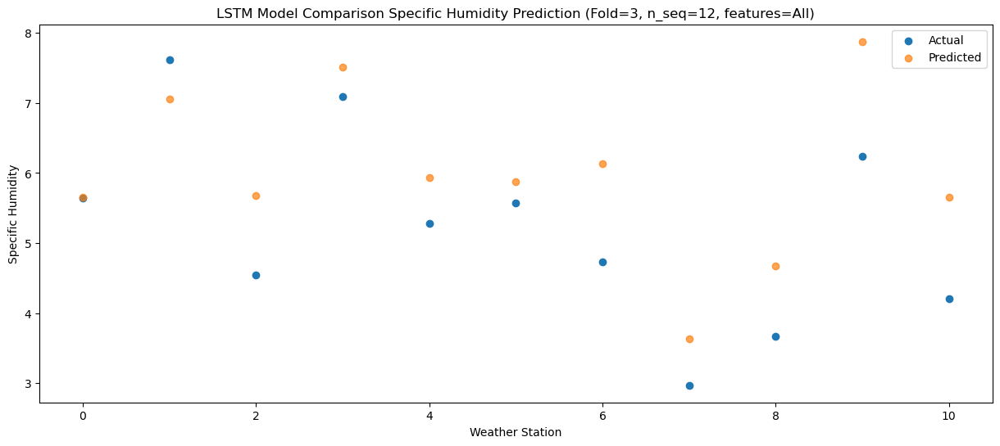

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]
 [14.58 17.07  8.36 16.29 15.33 15.14 10.37  9.35  5.98 15.83 13.72]
 [14.85 17.24  7.89 17.17 15.42 15.31  8.94  6.92  6.37 16.21 14.04]
 [11.23 13.27  6.6  13.7  11.65 12.01  7.24  5.2   5.73 13.61 11.12]
 [ 9.19 11.08  5.46 11.64  9.7  10.39  6.15  4.1   4.7  11.07  9.22]
 [ 3.69  6.65  6.04  5.95  4.58  4.52  5.44  2.83  4.92  6.54  4.3 ]
 [ 5.64  7.62  4.54  7.09  5.28  5.57  4.73  2.97  3.67  6.24  4.2 ]]
[[ 2.81852623  4.21852623  2.83852623  4.66852623  3.09852623  3.03852623
   3.28852623  0.79852623  1.83852623  5.03852623  2.81852623]
 [ 2.93500708  4.33500708  2

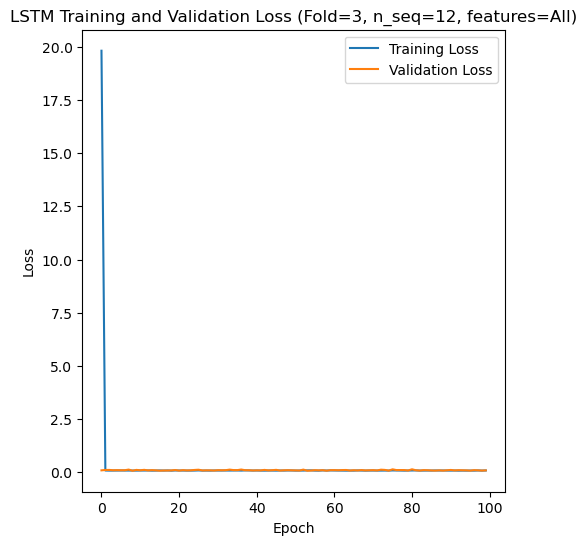

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 11s 83ms/step - loss: 23.6663 - accuracy: 0.5595 - mae: 23.3897 - rmse: 23.6663 - mape: 4795.8511 - pearson: 0.5940 - val_loss: 0.1069 - val_accuracy: 0.8000 - val_mae: 0.0819 - val_rmse: 0.1069 - val_mape: 17.3598 - val_pearson: 0.6695
Epoch 2/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0832 - accuracy: 0.6548 - mae: 0.0654 - rmse: 0.0832 - mape: 14.8723 - pearson: 0.7178 - val_loss: 0.0780 - val_accuracy: 0.8000 - val_mae: 0.0671 - val_rmse: 0.0780 - val_mape: 14.4277 - val_pearson: 0.7196
Epoch 3/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0780 - accuracy: 0.6667 - mae: 0.0620 - rmse: 0.0780 - mape: 13.7681 - pearson: 0.7438

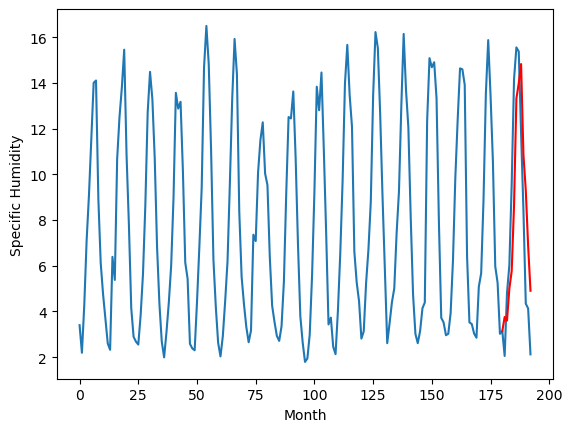

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.32		-0.43
5.74		3.16		-2.58
5.71		4.55		-1.16
6.46		5.33		-1.13
7.79		8.21		0.42
12.08		12.88		0.80
13.29		13.55		0.26
13.68		14.39		0.71
12.88		10.42		-2.46
9.96		8.85		-1.11
5.30		6.43		1.13
7.04		4.46		-2.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.317648948729038, 3.157461853325367, 4.553933353722096, 5.331604869663716, 8.214318664371968, 12.878235729038716, 13.548533947765828, 14.390740485489369, 10.419682355225087, 8.854600043594838, 6.426004262268544, 4.464952917397023]


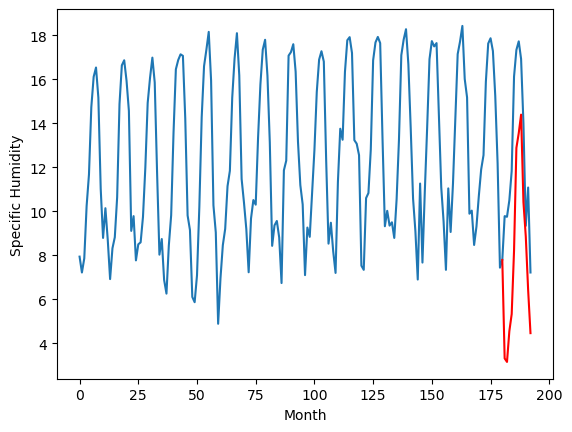

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.86		0.03
7.71		7.70		-0.01
10.77		9.09		-1.68
11.02		9.87		-1.15
14.46		12.75		-1.71
18.70		17.42		-1.28
20.35		18.09		-2.26
20.36		18.93		-1.43
17.42		14.96		-2.46
14.64		13.39		-1.25
9.20		10.97		1.77
12.15		9.00		-3.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 7.857648948729039, 7.697461853325367, 9.093933353722097, 9.871604869663717, 12.754318664371969, 17.418235729038717, 18.08853394776583, 18.93074048548937, 14.959682355225087, 13.394600043594838, 10.966004262268545, 9.004952917397024]


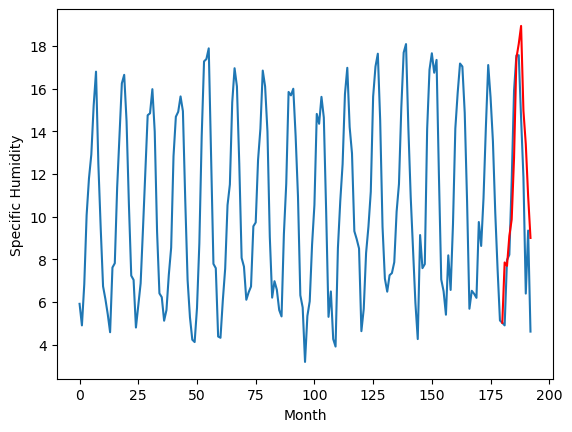

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.84		0.03
5.49		5.68		0.19
8.15		7.07		-1.08
9.44		7.85		-1.59
13.44		10.73		-2.71
17.13		15.40		-1.73
17.70		16.07		-1.63
18.09		16.91		-1.18
14.08		12.94		-1.14
11.23		11.37		0.14
7.61		8.95		1.34
9.47		6.98		-2.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 5.837648948729038, 5.677461853325367, 7.073933353722095, 7.851604869663715, 10.734318664371967, 15.398235729038715, 16.06853394776583, 16.91074048548937, 12.939682355225088, 11.374600043594839, 8.946004262268545, 6.984952917397024]


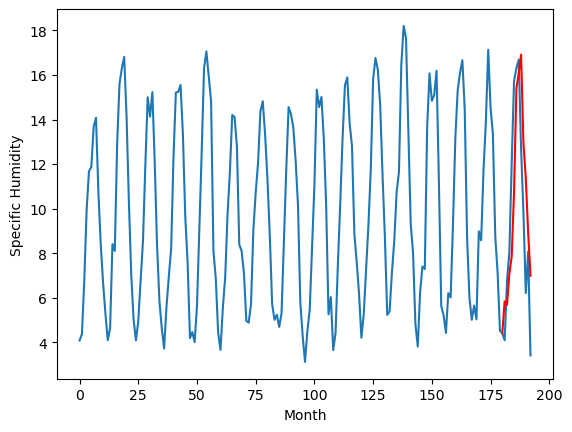

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		4.00		-0.04
3.59		3.84		0.25
6.17		5.23		-0.94
7.53		6.01		-1.52
11.82		8.89		-2.93
15.70		13.56		-2.14
16.08		14.23		-1.85
16.19		15.07		-1.12
12.29		11.10		-1.19
9.56		9.53		-0.03
5.95		7.11		1.16
7.36		5.14		-2.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.9976489487290383, 3.837461853325367, 5.233933353722096, 6.011604869663715, 8.894318664371967, 13.558235729038715, 14.228533947765827, 15.070740485489369, 11.099682355225086, 9.534600043594837, 7.106004262268543, 5.144952917397022]


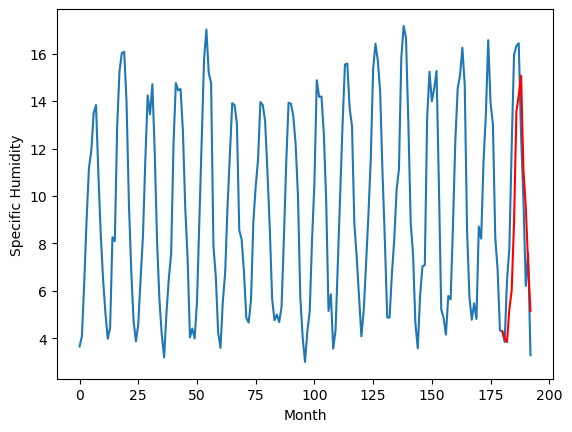

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.57		-0.78
3.71		3.41		-0.30
5.20		4.80		-0.40
6.16		5.58		-0.58
10.71		8.46		-2.25
13.01		13.13		0.12
14.04		13.80		-0.24
13.76		14.64		0.88
10.51		10.67		0.16
7.46		9.10		1.64
5.74		6.68		0.94
4.89		4.71		-0.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 3.567648948729038, 3.407461853325367, 4.803933353722096, 5.581604869663716, 8.464318664371968, 13.128235729038716, 13.798533947765828, 14.640740485489369, 10.669682355225087, 9.104600043594838, 6.676004262268544, 4.714952917397023]


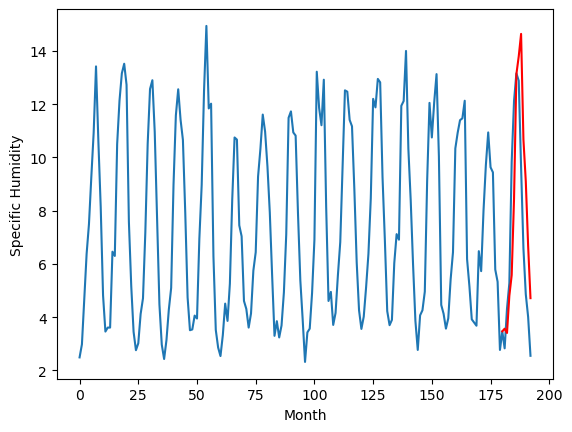

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.41		0.04
2.62		2.25		-0.37
4.33		3.64		-0.69
4.74		4.42		-0.32
7.72		7.30		-0.42
12.41		11.97		-0.44
14.01		12.64		-1.37
14.39		13.48		-0.91
10.81		9.51		-1.30
8.60		7.94		-0.66
2.88		5.52		2.64
4.74		3.55		-1.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 2.4076489487290385, 2.247461853325367, 3.6439333537220957, 4.421604869663716, 7.3043186643719675, 11.968235729038716, 12.638533947765827, 13.480740485489369, 9.509682355225086, 7.944600043594837, 5.5160042622685435, 3.5549529173970225]


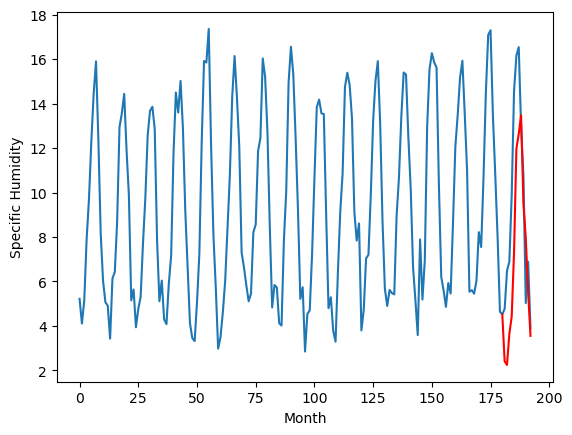

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.14		0.07
4.44		4.98		0.54
6.81		6.37		-0.44
7.73		7.15		-0.58
10.89		10.03		-0.86
15.49		14.70		-0.79
16.44		15.37		-1.07
16.18		16.21		0.03
12.92		12.24		-0.68
10.83		10.67		-0.16
6.14		8.25		2.11
7.61		6.28		-1.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 5.137648948729038, 4.977461853325367, 6.373933353722095, 7.151604869663715, 10.034318664371966, 14.698235729038714, 15.368533947765826, 16.210740485489367, 12.239682355225085, 10.674600043594836, 8.246004262268542, 6.284952917397021]


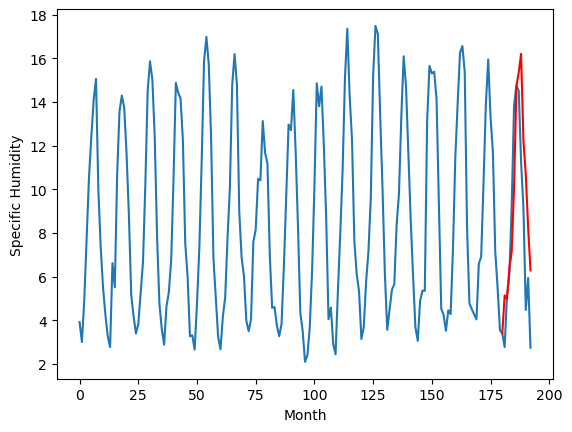

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.84		0.27
3.00		3.68		0.68
4.94		5.07		0.13
6.27		5.85		-0.42
8.56		8.73		0.17
13.62		13.40		-0.22
14.88		14.07		-0.81
15.02		14.91		-0.11
11.54		10.94		-0.60
10.39		9.37		-1.02
4.62		6.95		2.33
5.33		4.98		-0.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.837648948729038, 3.677461853325367, 5.073933353722095, 5.851604869663715, 8.734318664371967, 13.398235729038715, 14.068533947765827, 14.910740485489368, 10.939682355225086, 9.374600043594837, 6.946004262268543, 4.984952917397022]


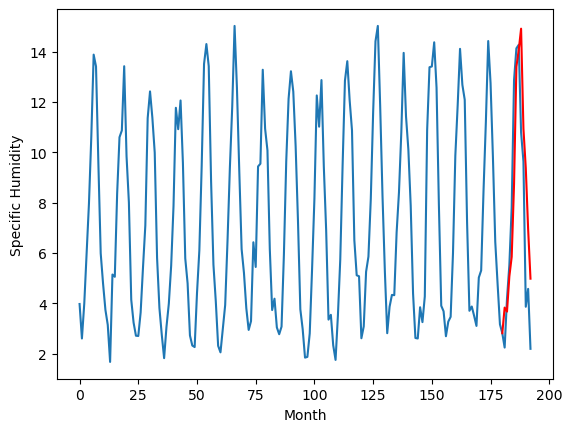

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.90		0.24
3.02		3.74		0.72
5.39		5.13		-0.26
6.70		5.91		-0.79
9.32		8.79		-0.53
14.07		13.46		-0.61
15.47		14.13		-1.34
15.72		14.97		-0.75
11.69		11.00		-0.69
9.82		9.43		-0.39
4.53		7.01		2.48
5.07		5.04		-0.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 3.897648948729038, 3.737461853325367, 5.133933353722096, 5.911604869663716, 8.794318664371968, 13.458235729038716, 14.128533947765828, 14.970740485489369, 10.999682355225087, 9.434600043594838, 7.006004262268544, 5.044952917397023]


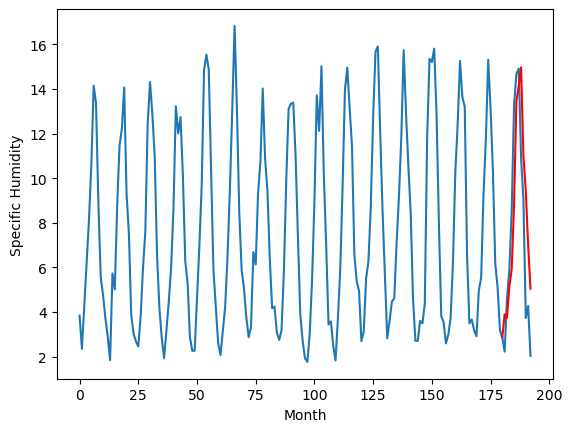

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.76		0.30
2.89		3.60		0.71
4.18		4.99		0.81
5.85		5.77		-0.08
7.45		8.65		1.20
12.46		13.32		0.86
13.73		13.99		0.26
14.60		14.83		0.23
10.84		10.86		0.02
9.83		9.29		-0.54
4.59		6.87		2.28
4.55		4.90		0.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.757648948729038, 3.597461853325367, 4.993933353722095, 5.771604869663715, 8.654318664371967, 13.318235729038715, 13.988533947765827, 14.830740485489368, 10.859682355225086, 9.294600043594837, 6.866004262268543, 4.904952917397022]


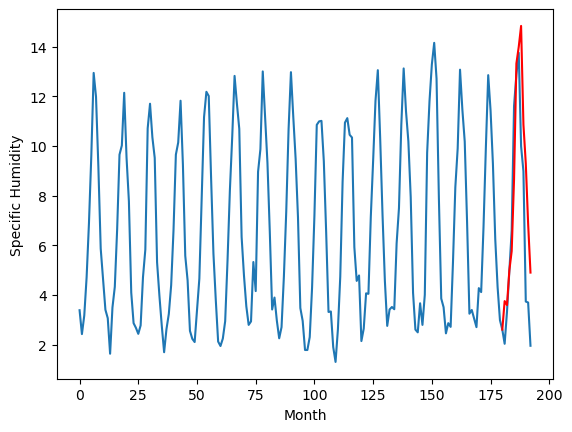

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.757649
1                 1    3.75   3.317649
2                 2    7.83   7.857649
3                 3    5.81   5.837649
4                 4    4.04   3.997649
5                 5    4.35   3.567649
6                 6    2.37   2.407649
7                 7    5.07   5.137649
8                 8    3.57   3.837649
9                 9    3.66   3.897649
10               10    3.46   3.757649


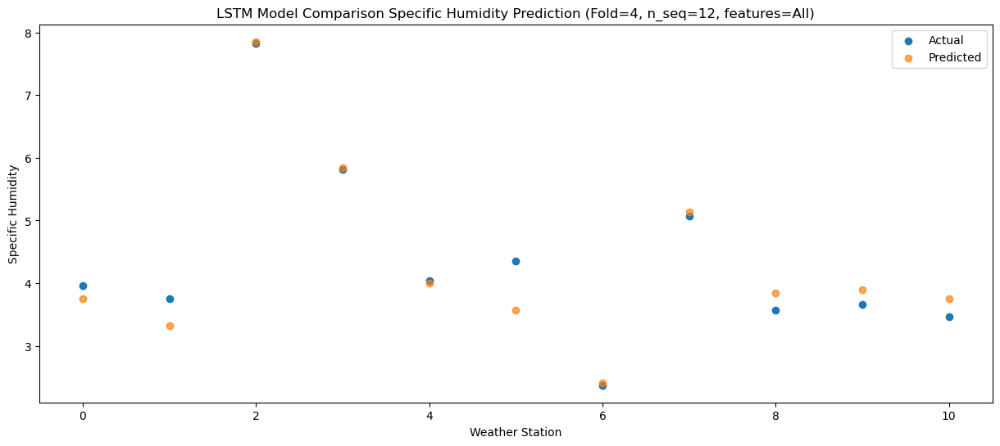

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   3.597462
1                 1    5.74   3.157462
2                 2    7.71   7.697462
3                 3    5.49   5.677462
4                 4    3.59   3.837462
5                 5    3.71   3.407462
6                 6    2.62   2.247462
7                 7    4.44   4.977462
8                 8    3.00   3.677462
9                 9    3.02   3.737462
10               10    2.89   3.597462


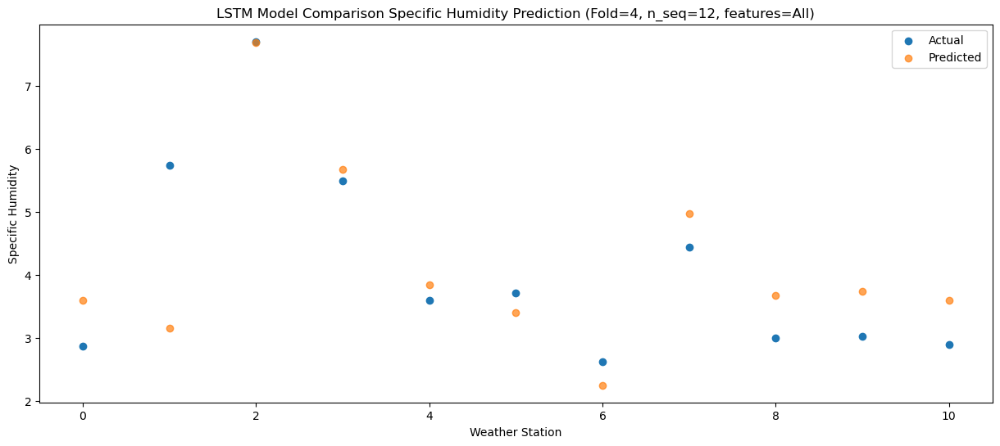

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   4.993933
1                 1    5.71   4.553933
2                 2   10.77   9.093933
3                 3    8.15   7.073933
4                 4    6.17   5.233933
5                 5    5.20   4.803933
6                 6    4.33   3.643933
7                 7    6.81   6.373933
8                 8    4.94   5.073933
9                 9    5.39   5.133933
10               10    4.18   4.993933


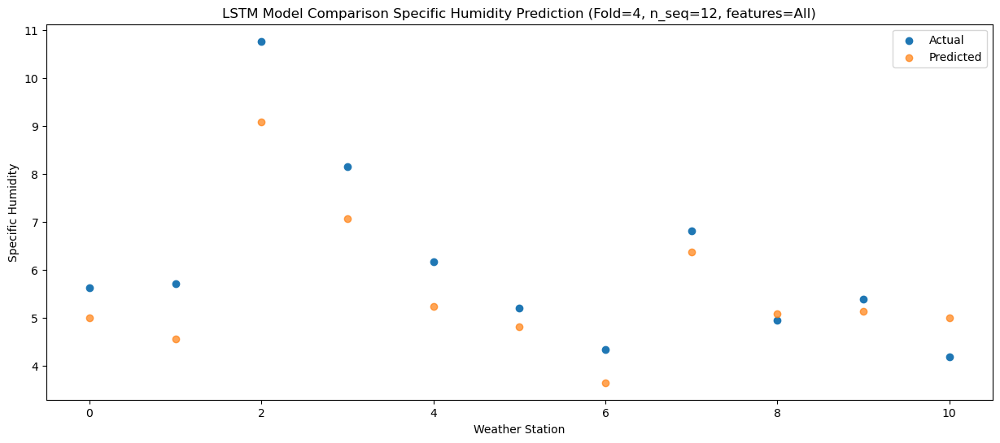

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   5.771605
1                 1    6.46   5.331605
2                 2   11.02   9.871605
3                 3    9.44   7.851605
4                 4    7.53   6.011605
5                 5    6.16   5.581605
6                 6    4.74   4.421605
7                 7    7.73   7.151605
8                 8    6.27   5.851605
9                 9    6.70   5.911605
10               10    5.85   5.771605


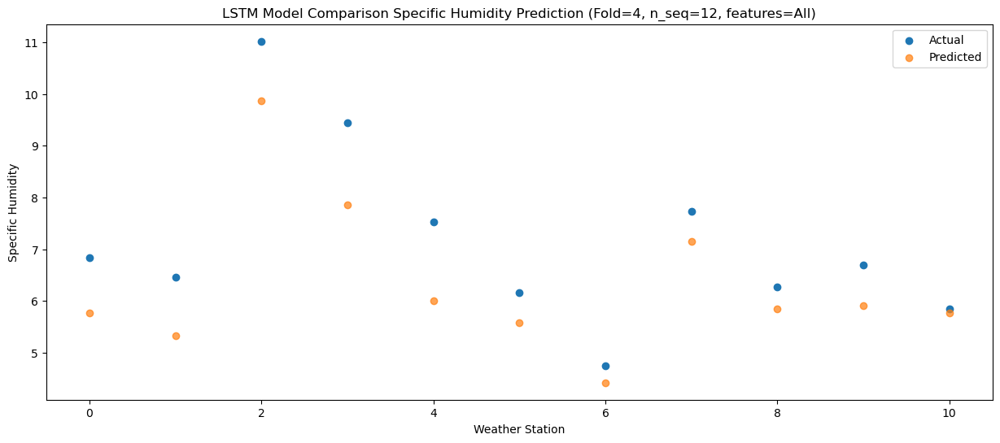

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40   8.654319
1                 1    7.79   8.214319
2                 2   14.46  12.754319
3                 3   13.44  10.734319
4                 4   11.82   8.894319
5                 5   10.71   8.464319
6                 6    7.72   7.304319
7                 7   10.89  10.034319
8                 8    8.56   8.734319
9                 9    9.32   8.794319
10               10    7.45   8.654319


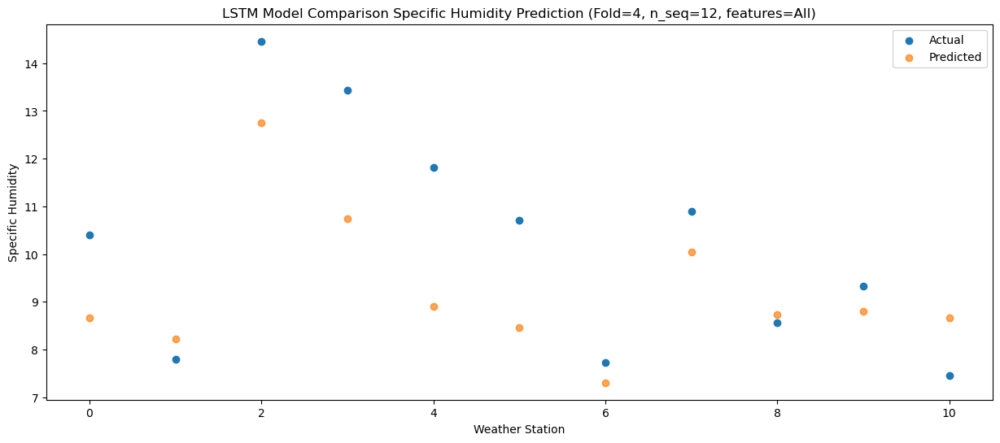

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  13.318236
1                 1   12.08  12.878236
2                 2   18.70  17.418236
3                 3   17.13  15.398236
4                 4   15.70  13.558236
5                 5   13.01  13.128236
6                 6   12.41  11.968236
7                 7   15.49  14.698236
8                 8   13.62  13.398236
9                 9   14.07  13.458236
10               10   12.46  13.318236


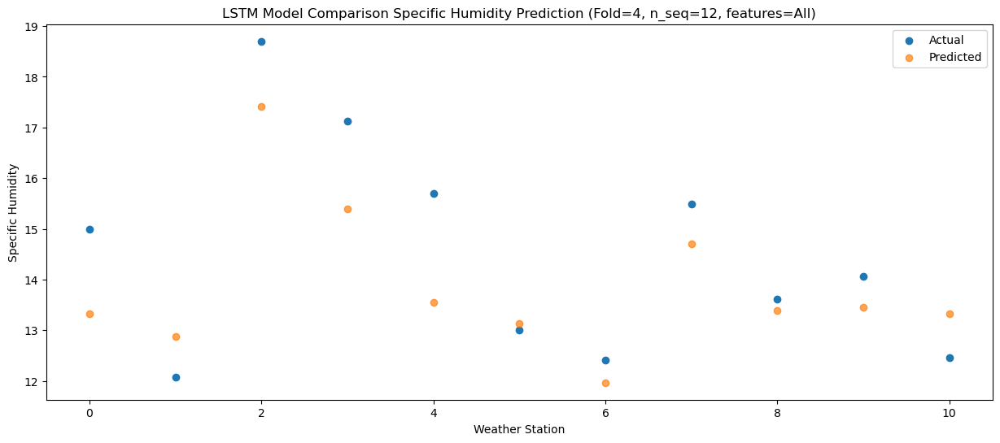

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.38  13.988534
1                 1   13.29  13.548534
2                 2   20.35  18.088534
3                 3   17.70  16.068534
4                 4   16.08  14.228534
5                 5   14.04  13.798534
6                 6   14.01  12.638534
7                 7   16.44  15.368534
8                 8   14.88  14.068534
9                 9   15.47  14.128534
10               10   13.73  13.988534


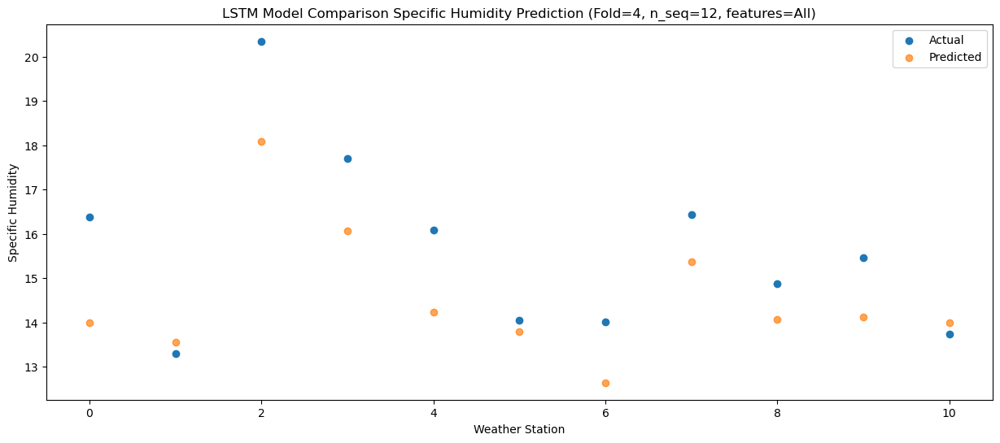

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.20   14.83074
1                 1   13.68   14.39074
2                 2   20.36   18.93074
3                 3   18.09   16.91074
4                 4   16.19   15.07074
5                 5   13.76   14.64074
6                 6   14.39   13.48074
7                 7   16.18   16.21074
8                 8   15.02   14.91074
9                 9   15.72   14.97074
10               10   14.60   14.83074


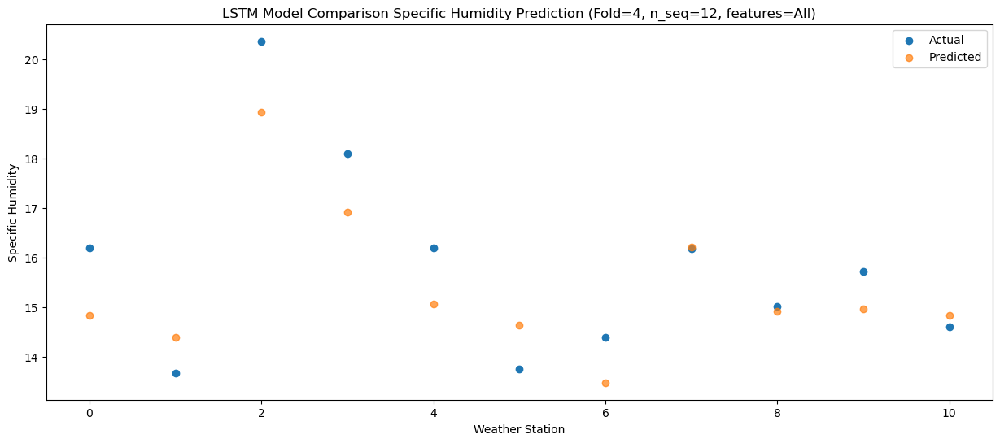

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.62  10.859682
1                 1   12.88  10.419682
2                 2   17.42  14.959682
3                 3   14.08  12.939682
4                 4   12.29  11.099682
5                 5   10.51  10.669682
6                 6   10.81   9.509682
7                 7   12.92  12.239682
8                 8   11.54  10.939682
9                 9   11.69  10.999682
10               10   10.84  10.859682


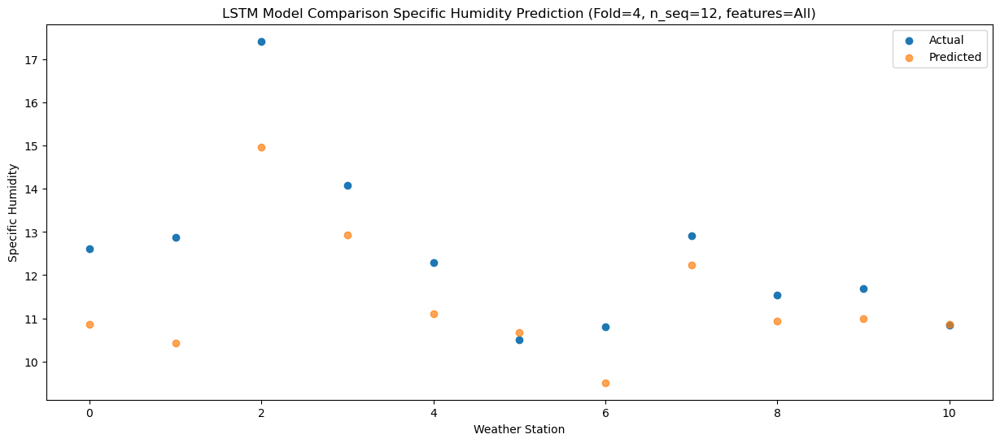

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    9.25     9.2946
1                 1    9.96     8.8546
2                 2   14.64    13.3946
3                 3   11.23    11.3746
4                 4    9.56     9.5346
5                 5    7.46     9.1046
6                 6    8.60     7.9446
7                 7   10.83    10.6746
8                 8   10.39     9.3746
9                 9    9.82     9.4346
10               10    9.83     9.2946


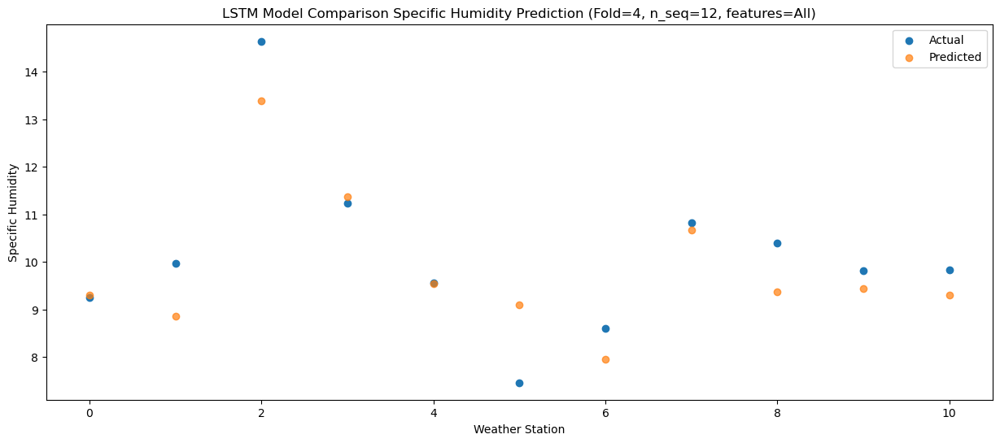

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.16   6.866004
1                 1    5.30   6.426004
2                 2    9.20  10.966004
3                 3    7.61   8.946004
4                 4    5.95   7.106004
5                 5    5.74   6.676004
6                 6    2.88   5.516004
7                 7    6.14   8.246004
8                 8    4.62   6.946004
9                 9    4.53   7.006004
10               10    4.59   6.866004


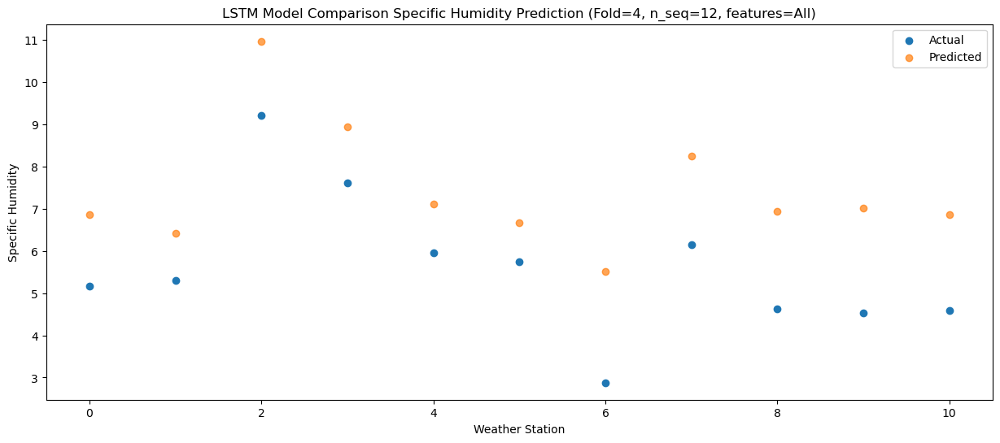

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.95   4.904953
1                 1    7.04   4.464953
2                 2   12.15   9.004953
3                 3    9.47   6.984953
4                 4    7.36   5.144953
5                 5    4.89   4.714953
6                 6    4.74   3.554953
7                 7    7.61   6.284953
8                 8    5.33   4.984953
9                 9    5.07   5.044953
10               10    4.55   4.904953


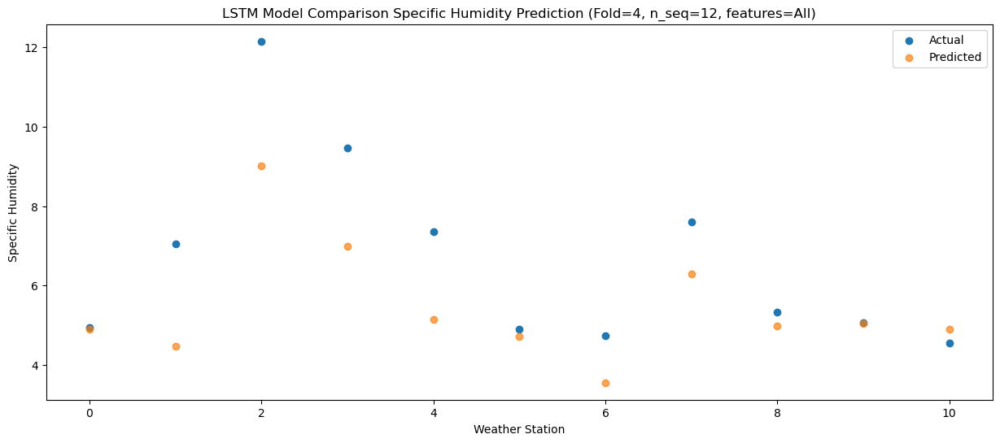

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]
 [16.38 13.29 20.35 17.7  16.08 14.04 14.01 16.44 14.88 15.47 13.73]
 [16.2  13.68 20.36 18.09 16.19 13.76 14.39 16.18 15.02 15.72 14.6 ]
 [12.62 12.88 17.42 14.08 12.29 10.51 10.81 12.92 11.54 11.69 10.84]
 [ 9.25  9.96 14.64 11.23  9.56  7.46  8.6  10.83 10.39  9.82  9.83]
 [ 5.16  5.3   9.2   7.61  5.95  5.74  2.88  6.14  4.62  4.53  4.59]
 [ 4.95  7.04 12.15  9.47  7.36  4.89  4.74  7.61  5.33  5.07  4.55]]
[[ 3.75764895  3.31764895  7.85764895  5.83764895  3.99764895  3.56764895
   2.40764895  5.13764895  3.83764895  3.89764895  3.75764895]
 [ 3.59746185  3.15746185  7

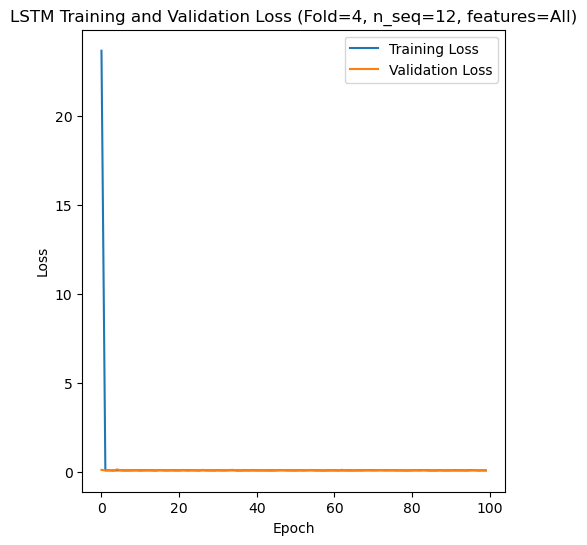

[[1.1369054822616786], [2.7383790167751076], [2.511569670688641], [2.365029169140484], [1.242300854813948]]
[[array(1.13690548)], [array(2.73837902)], [array(2.51156967)], [array(2.36502917)], [array(1.24230085)]]
[[0.8383604847752684], [2.380533823086458], [2.0845284201746637], [1.4772872847341227], [0.9686068805284574]]
[[0.08941011996505578], [0.2644797995908207], [0.23668580733922004], [0.2588411095254839], [0.1214533333250972]]
[[0.9380358507794334], [0.6413530206585546], [0.6803677554304599], [0.6723209076606855], [0.926013452567666]]
[[array(0.08941012)], [array(0.2644798)], [array(0.23668581)], [array(0.25884111)], [array(0.12145333)]]
[[array(0.94905348)], [array(0.92694311)], [array(0.8456815)], [array(0.76279638)], [array(0.94005972)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93 15.96 16.01 12.59 10.41  5.11  7.89
  5.74  6.45  8.66  8.88 11.37 16.12 16.92 17.08 14.92 11.84  6.18  9.82
  8.41  8.56 10.41 10.65 13.41 18.03 19.94 20.14 17.14 14.42  8.55 10.95
  5.55  5.46  8.91  9.48

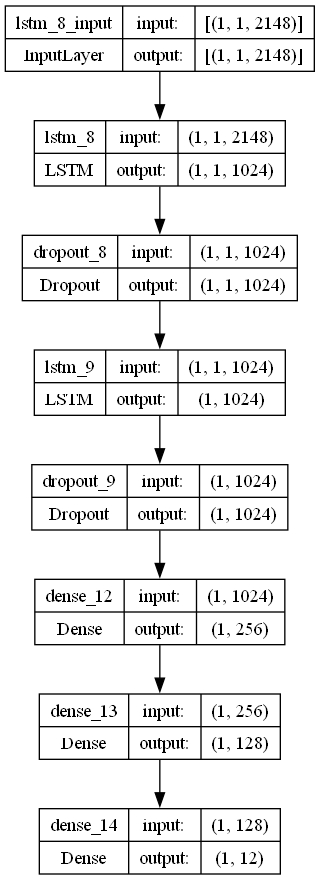

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.14221859366311687
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.21312490207040577

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)